In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import scipy.stats as stats
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, KFold,learning_curve
warnings.filterwarnings("ignore", category=pd.errors.DtypeWarning)
from imblearn.over_sampling import RandomOverSampler
import statsmodels.formula.api as sm
from mlxtend.feature_selection import SequentialFeatureSelector
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, mean_squared_error, r2_score, roc_curve, roc_auc_score, RocCurveDisplay, mean_absolute_error,precision_score, accuracy_score, recall_score
from itertools import combinations
import itertools
import random
from tabulate import tabulate
from sklearn.preprocessing import PolynomialFeatures
import category_encoders as ce
import statsmodels.api as sm
from scipy.stats import chi2_contingency
from statsmodels.graphics.gofplots import qqplot
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.exceptions import ConvergenceWarning
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
import math
from scipy.stats import entropy
from sklearn.preprocessing import OneHotEncoder
warnings.filterwarnings("ignore", category=pd.errors.DtypeWarning)
from scipy.stats import spearmanr
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from prettytable import PrettyTable
import matplotlib.ticker as ticker
import matplotlib.ticker as mtick

# you need to fix here
"""
Q1_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q1.csv", skiprows=1).iloc[:-2]
Q2_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q2.csv", skiprows=1).iloc[:-2]
Q3_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q3.csv", skiprows=1).iloc[:-2]
Q4_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q4.csv", skiprows=1).iloc[:-2]

Q1_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q1.csv", skiprows=1).iloc[:-2]
Q2_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q2.csv", skiprows=1).iloc[:-2]
Q3_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q3.csv", skiprows=1).iloc[:-2]
Q4_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q4.csv", skiprows=1).iloc[:-2]


df_2019 = pd.concat([Q1_2019, Q2_2019, Q3_2019, Q4_2019], axis=0)
df_2018 = pd.concat([Q1_2018, Q2_2018, Q3_2018, Q4_2018], axis=0)

warnings.resetwarnings()
"""

In [2]:
df_2018.shape

(434407, 151)

# Data Preprocessing

## Data cleaning

In [3]:
def entropy(column):
    counts = np.unique(column, return_counts=True)[1]
    probabilities = counts / np.sum(counts)
    return -np.sum(probabilities * np.log2(probabilities))

def information_gain(data, feature, target):
    # Calculate entropy of target variable
    target_entropy = entropy(data[target])
    
    feature_entropy = 0
    feature_values, feature_counts = np.unique(data[feature], return_counts=True)
    for value, count in zip(feature_values, feature_counts):
        subset = data[data[feature] == value]
        feature_entropy += (count / len(data)) * entropy(subset[target])
    
    # Calculate information gain
    return target_entropy - feature_entropy


def calculate_information_gain(data, target_column, feature_column_1, feature_column_2):
    """
    Calculates the information gain for two feature columns with a binary target column.

    Args:
        data (DataFrame): The input DataFrame containing the data.
        target_column (str): The name of the binary target column.
        feature_column_1 (str): The name of the first feature column.
        feature_column_2 (str): The name of the second feature column.

    Returns:
        information_gains (dict): A dictionary with the information gains for each feature column.
    """
    # Separate features (X) and target (y)
    X = data[[feature_column_1, feature_column_2]]
    y = data[target_column]

    # Calculate information gain for each feature
    information_gains = {}

    for column in [feature_column_1, feature_column_2]:
        information_gain = mutual_info_classif(X[[column]], y)[0]
        information_gains[column] = information_gain

    return information_gains

### Data Consistency Checks and Verification

**Feature Comparison between 2018 and 2019 datasets**
<br>
Feature comparison between 2018 and 2019 datasets is crucial for ensuring consistency and identifying any changes or discrepancies in the data. It allows us to understand if the same features are present in both datasets, and if they have the same values or format. This process is necessary to ensure the accuracy and reliability of any analysis or models built using the data.

In [4]:
"""
This section compares the column names of both datasets, 'df_2018' and 'df_2019', 
to ensure that they have the same features. 
"""

# Define attrs_2018 and attrs_2019 as sets or lists of column names
attrs_2018 = set(df_2018.columns)
attrs_2019 = set(df_2019.columns)

# Find the column names present in attrs_2018 but not in attrs_2019
attrs_2018_only = attrs_2018.difference(attrs_2019)

# Find the column names present in attrs_2019 but not in attrs_2018
attrs_2019_only = attrs_2019.difference(attrs_2018)

# Check if there are no differences in either year
if len(attrs_2018_only) == 0 and len(attrs_2019_only) == 0:
    print("No differences found between attrs_2018 and attrs_2019.")
elif len(attrs_2018_only) == 0:
    print("No differences found in attrs_2018.")
else:
    print("Column names present in attrs_2018 but not in attrs_2019:", attrs_2018_only)

if len(attrs_2019_only) == 0:
    print("No differences found in attrs_2019.")
else:
    print("Column names present in attrs_2019 but not in attrs_2018:", attrs_2019_only)

Column names present in attrs_2018 but not in attrs_2019: {'disbursement_method'}
No differences found in attrs_2019.


**ID Value Check and Conversion**
<br>
Ensuring that all instances have an associated ID value and converting them to integer format if necessary is important because it allows us to easily reference and manipulate the data in a consistent way.


In [5]:
"""
Checks if all instances have an associated ID value and converts the ID values to integer 
if they are not already in integer format.
"""

na_count_2019 = df_2019['id'].isna().sum()
na_count_2018 = df_2018['id'].isna().sum()

if na_count_2019 == 0 and na_count_2018 == 0:
    print("All instances have an associated ID")
    df_2019['id'] = df_2019['id'].astype(int)
    df_2018['id'] = df_2018['id'].astype(int)
    na_count_2019 = df_2019['id'].isna().sum()
    na_count_2018 = df_2018['id'].isna().sum()
    if na_count_2019 == 0 and na_count_2018 == 0:
        print("ID conversion to int: OK")
else:
    print("Warning: Some instances do not have an associated ID")

All instances have an associated ID
ID conversion to int: OK


**Verify Loan ID Consistency between 2018 and 2019 Data Frames**
<br>
This process verifies that all loans granted in 2016 are included in the dataset without any additions or reductions, ensuring that the dataset provides a complete snapshot of loans granted in that year.

In [6]:
"""
Verify that each loan in the 2018 table has a corresponding loan in the 2019 table based on loan IDs.
"""

# Check for duplicate IDs in 2018 and 2019 tables
duplicate_ids_2018 = df_2018['id'].duplicated().sum()
duplicate_ids_2019 = df_2019['id'].duplicated().sum()

if duplicate_ids_2018 == 0:
    print("No duplicate IDs found in the 2018 table.")
else:
    print(f"Duplicate IDs found in the 2018 table: {duplicate_ids_2018}")

if duplicate_ids_2019 == 0:
    print("No duplicate IDs found in the 2019 table.")
else:
    print(f"Duplicate IDs found in the 2019 table: {duplicate_ids_2019}")

id_2019 = df_2019['id'].tolist()
id_2018 = df_2018['id'].tolist()

# Convert the lists to sets for faster comparisons
id_set_2019 = set(id_2019)
id_set_2018 = set(id_2018)

# Find the differences between the sets
missing_ids = id_set_2018.difference(id_set_2019)
extra_ids = id_set_2019.difference(id_set_2018)

# Check if the lengths of the sets are equal, indicating the same number of IDs
same_length = len(id_set_2019) == len(id_set_2018)

if not missing_ids and not extra_ids:
    print("Each instance (loan) from the 2018 table has a corresponding loan in the 2019 table.")
else:
    if missing_ids:
        print("IDs missing in 2019 data:", missing_ids)
    if extra_ids:
        print("Extra IDs in 2019 data:", extra_ids)

No duplicate IDs found in the 2018 table.
No duplicate IDs found in the 2019 table.
Each instance (loan) from the 2018 table has a corresponding loan in the 2019 table.


### Identification of Features Leakage
We aims to identify feature leakage by comparing the 2018 and 2019 datasets, dropping the 'disbursement_method' column from the 2018 dataframe, and merging the two dataframes based on the loan IDs. Then, it calculates the percentage of changed rows for each non-'id' column and prints the results.

In [7]:
"""
This code compares the 2018 and 2019 datasets to identify feature leakage. 
It drops the 'disbursement_method' column from the 2018 dataframe, 
merges the two dataframes based on the loan IDs, and calculates the percentage of 
changed rows for each non-'id' column.
"""

# Copy the 2018 dataframe and drop the 'disbursement_method' column
new_df_2018 = df_2018.drop('disbursement_method', axis=1).copy()

# Check if the dataframes have the same columns
if set(new_df_2018.columns) != set(df_2019.columns):
    print("Error: Dataframes have different columns")
else:
    # Merge the 2018 and 2019 dataframes on 'id'
    merged_df = pd.merge(new_df_2018, df_2019, on='id', suffixes=('_18', '_19'))

    # Calculate the percentage of changed rows for each non-'id' column
    changed_columns = {}
    for column in new_df_2018.columns:
        if column == 'id':
            continue
        non_na_rows = merged_df[[f"{column}_18", f"{column}_19"]].dropna()
        changed_rows = (non_na_rows[f"{column}_18"] != non_na_rows[f"{column}_19"]).sum()
        if not len(non_na_rows) == 0:
            percent_changed = changed_rows / len(non_na_rows) * 100
            if percent_changed > 0:
                changed_columns[column] = percent_changed

    # Sort the columns by percent_changed in descending order and print the results
    for column, percent_changed in sorted(changed_columns.items(), key=lambda x: x[1], reverse=True):
        print(f"{column}: {percent_changed:.2f}% changed")

next_pymnt_d: 100.00% changed
last_credit_pull_d: 83.97% changed
last_fico_range_high: 78.08% changed
last_fico_range_low: 78.08% changed
settlement_status: 62.70% changed
total_pymnt: 62.54% changed
total_pymnt_inv: 62.53% changed
out_prncp: 60.04% changed
out_prncp_inv: 60.04% changed
debt_settlement_flag_date: 59.96% changed
total_rec_int: 57.90% changed
total_rec_prncp: 57.72% changed
last_pymnt_d: 57.32% changed
loan_status: 38.64% changed
last_pymnt_amnt: 33.04% changed
hardship_status: 9.44% changed
recoveries: 6.87% changed
collection_recovery_fee: 6.87% changed
settlement_amount: 3.70% changed
hardship_end_date: 3.50% changed
settlement_date: 3.47% changed
total_rec_late_fee: 3.01% changed
settlement_percentage: 2.74% changed
settlement_term: 2.15% changed
debt_settlement_flag: 1.83% changed
verification_status: 1.62% changed
hardship_flag: 0.09% changed
pymnt_plan: 0.06% changed
installment: 0.02% changed
int_rate: 0.02% changed


To ensure our analysis reflects the factors known at the time of loan application, we remove any data points in the merged dataset that exhibit a percentage change higher than 0% between 2018 and 2019. Upon inspection, we discovered that the columns installment (representing the monthly repayment amount) and int_rate (representing the loan's interest percentage) exhibited a minute 0.02% change. Given the implausibility of these columns having changed, we will scrutinize the specific instances where changes occurred.

In [8]:
features_to_drop = list(changed_columns)
features_to_drop.remove('loan_status')
features_to_drop.remove('int_rate')
features_to_drop.remove('installment')

print(features_to_drop)

['verification_status', 'pymnt_plan', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'last_fico_range_high', 'last_fico_range_low', 'hardship_flag', 'hardship_status', 'hardship_end_date', 'debt_settlement_flag', 'debt_settlement_flag_date', 'settlement_status', 'settlement_date', 'settlement_amount', 'settlement_percentage', 'settlement_term']


We went through the data dictionary and found additional leakage features, these columns only have nan and that's why they didn't come up before.

In [9]:
features_to_drop.append('hardship_reason')
features_to_drop.append('hardship_type')
features_to_drop.append('deferral_term')
features_to_drop.append('hardship_amount')
features_to_drop.append('hardship_start_date')
features_to_drop.append('payment_plan_start_date')
features_to_drop.append('hardship_length')
features_to_drop.append('hardship_dpd')
features_to_drop.append('hardship_loan_status')
features_to_drop.append('orig_projected_additional_accrued_interest')
features_to_drop.append('hardship_payoff_balance_amount')
features_to_drop.append('hardship_last_payment_amount')

features_to_drop.append('funded_amnt')
features_to_drop.append('funded_amnt_inv')

Considering that changes in the int_rate and installment columns are uncommon and may be a result of human error, we will remove these instances from our analysis. This will ensure that our analysis is based on reliable and accurate information.

In [10]:
changes = pd.concat([merged_df['id'], merged_df['int_rate_18'] != merged_df['int_rate_19'], merged_df['installment_18'] != merged_df['installment_19']], axis=1)
changes.columns = ['id', 'int_rate_change', 'installment_change']

# Filter for instances where both int_rate and installment have changed
both_changed = changes[(changes['int_rate_change']) & (changes['installment_change'])]

# Count the number of unique IDs
num_unique = both_changed['id'].nunique()
percentage = num_unique / df_2019.shape[0] * 100


print(f"The total number of unique instances with changes in int_rate or installment columns is: {num_unique}. "
      f"This represents {percentage:.2f}% of the data.")

# Get the IDs to remove
ids_to_remove = set(both_changed['id'].unique())
# Remove the IDs from the data
df_2019 = df_2019[~df_2019['id'].isin(ids_to_remove)]


The total number of unique instances with changes in int_rate or installment columns is: 85. This represents 0.02% of the data.


### Filtering irrelevant instances

We will examine the distribution of categories under the loan_status feature.

In [11]:
df_2019.shape

(434322, 150)

In [12]:
count_by_status = df_2019['loan_status'].value_counts()
print(count_by_status)

Fully Paid            262778
Current                94134
Charged Off            72186
Late (31-120 days)      3228
In Grace Period         1466
Late (16-30 days)        522
Default                    8
Name: loan_status, dtype: int64


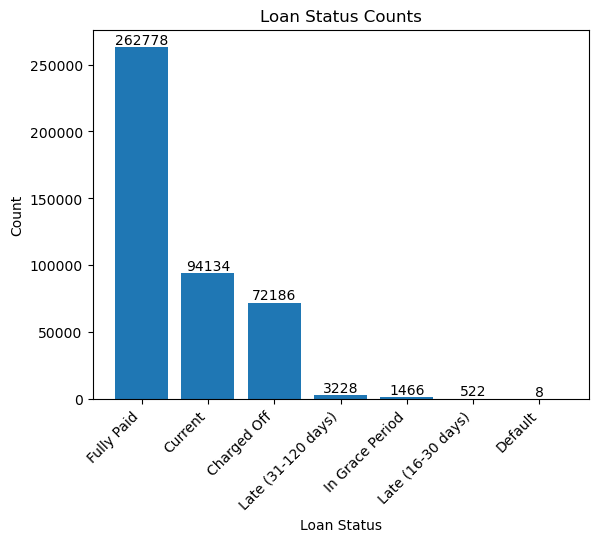

In [13]:
fig, ax = plt.subplots()
bars = ax.bar(count_by_status.index, count_by_status.values)

ax.set_title('Loan Status Counts')
ax.set_xlabel('Loan Status')
ax.set_ylabel('Count')
plt.xticks(rotation=45, ha='right')

for bar, count in zip(bars, count_by_status.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), count,
            ha='center', va='bottom')

plt.show()

We will remove instances with loan statuses other than "Charged Off" and "Fully Paid" to ensure completed loan outcomes.

In [14]:
data = df_2019[df_2019['loan_status'].isin(['Fully Paid', 'Charged Off'])]

In [15]:
data['loan_status'].value_counts()

Fully Paid     262778
Charged Off     72186
Name: loan_status, dtype: int64

In the future, we will realize that to exclude loan applications with a Joint App type. To better visualize the number of instances we are downloading, we will generate a graph at this point.

In [16]:
data['application_type'].value_counts()

Individual    328918
Joint App       6046
Name: application_type, dtype: int64

In [17]:
# Grouping data by 'application_type' and 'loan_status'
grouped = data.groupby(['application_type', 'loan_status']).size().unstack().fillna(0)

# Calculate row and column totals
col_totals = grouped.sum(axis=0)
row_totals = grouped.sum(axis=1)

# Calculate percentage values
percentages = grouped.apply(lambda x: x / col_totals * 100, axis=1)
percentages['Total'] = row_totals / row_totals.sum() * 100
percentages = percentages.round(2)

# Styling options
styled_table = percentages.style.background_gradient(cmap='coolwarm', axis=0) \
                      .applymap(lambda x: 'background-color: lightcoral', subset='Charged Off') \
                      .applymap(lambda x: 'background-color: lightgreen', subset='Fully Paid') \
                      .set_caption('Loan Status by Application Type') \
                      .format('{:,.2f}%') \
                      .set_properties(subset=['Charged Off', 'Fully Paid', 'Total'], color='black')

# Display the styled table
styled_table

loan_status,Charged Off,Fully Paid,Total
application_type,,,
Individual,98.06%,98.23%,98.20%
Joint App,1.94%,1.77%,1.80%


We found very few joint loan applications, so we removed them from our analysis to avoid bias and account for potential differences between individual and joint loans.

In [18]:
data = data[data['application_type'] == 'Individual']
data.drop('application_type', axis=1, inplace=True)

### Calculate targed varible
Since the original dataset doesn't include our target variable, we need to define it based on certain criteria or rules. By creating the target variable during the preprocessing stage, we can streamline the subsequent data cleaning and transformation steps. With the target variable already in place, we can better understand how missing values or scaling variables might impact it, and adjust our preprocessing accordingly. This will help us to ensure that our final model is both accurate and interpretable.

In [19]:
"""
We will check how many missing values there are in each column that is necessary to calculate the target variable.
"""
print(data[['issue_d', 'last_pymnt_d', 'total_pymnt', 'funded_amnt']].isnull().sum())

issue_d           0
last_pymnt_d    513
total_pymnt       0
funded_amnt       0
dtype: int64


We will handle missing values in the total_pymnt column by using the issue_d and last_pymnt_d columns. If the total_pymnt is 0, it indicates that no payment has been made, so we assume that the last_pymnt_d is the same as the issue_d. For all other instances where there is a missing value, we will remove those instances.

In [20]:
mask = (data['total_pymnt'] == 0) & (data['last_pymnt_d'].isna())
data.loc[mask, 'last_pymnt_d'] = data.loc[mask, 'issue_d']

In [21]:
print(data[['issue_d', 'last_pymnt_d', 'total_pymnt', 'funded_amnt']].isnull().sum())

issue_d           0
last_pymnt_d    376
total_pymnt       0
funded_amnt       0
dtype: int64


In [22]:
data = data.dropna(subset=["last_pymnt_d"])

We will create several target variables, including two return calculations, a binary variable indicating whether the loan has defaulted, and another binary variable indicating whether the return is above 2%.

In [23]:
data.loc[:, "T"] = data['term'].replace({' 36 months': 36, ' 60 months': 60})

# Convert "issue_d" and "last_pymnt_d" columns to datetime objects
data.loc[:, "issue_d"] = pd.to_datetime(data["issue_d"])
data.loc[:, "last_pymnt_d"] = pd.to_datetime(data["last_pymnt_d"])
data = data.dropna(subset=['last_pymnt_d'])

data.loc[:, "real_time_month"] = (data["last_pymnt_d"] - data["issue_d"]).dt.days / 365.25 *12

data.loc[:, "p/m"] = data["total_pymnt"] / data["real_time_month"]

data.loc[:, "real_time_month"] = np.where(data["real_time_month"] == 0, 1/12, data["real_time_month"])

data.loc[:, "yield_2"] = (12/data["T"])*(1/data["funded_amnt"]) * (((data["p/m"])*((1-(1+0.00165158130192022)**data["real_time_month"])/(1-(1+0.00165158130192022))))*(1+0.00165158130192022)**(data["T"]-data["real_time_month"]) - data["funded_amnt"])

data.loc[:, 'yield_yearly_1'] = (data['total_pymnt'] - data['funded_amnt'])/data['funded_amnt']*(12/data["real_time_month"])

data['is_default?'] = (data['loan_status'] == 'Charged Off').astype(int)

data.drop('loan_status', axis=1, inplace=True)

cols = list(data.columns)
cols.remove('is_default?')
cols.append('is_default?')
data = data[cols]

data['yield_over'] = (data['yield_yearly_1'] >= 0.02).astype(int)



features_to_drop.append('real_time_month')
features_to_drop.append('p/m')
features_to_drop.append('T')
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

In [24]:
data = data.replace([np.inf, -np.inf], np.nan)
data = data.dropna(subset=['yield_2'])

**Calculate annual realized returns and standard deviation by loan grade.**

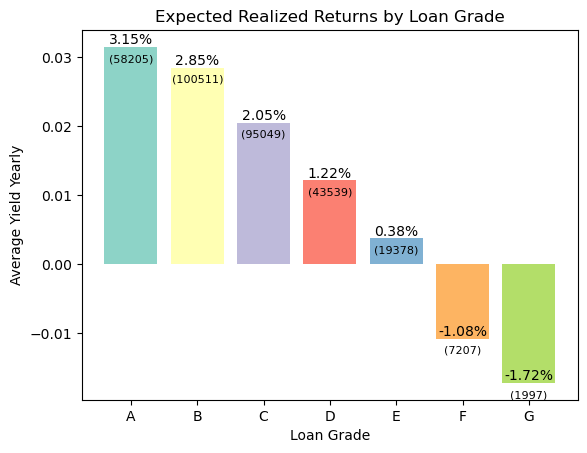

In [69]:
"""
This code snippet generates a bar chart depicting the average yield and count of loans grouped 
by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

avg_yield_by_grade = data.groupby('grade')['yield_2'].mean()
count_by_grade = data.groupby('grade')['yield_2'].count()

color_palette = sns.color_palette('Set3', len(avg_yield_by_grade))

fig, ax = plt.subplots()
ax.bar(avg_yield_by_grade.index, avg_yield_by_grade.values, color=color_palette)
ax.set_title('Expected Realized Returns by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Average Yield Yearly')

for i, (v1, v2) in enumerate(zip(avg_yield_by_grade, count_by_grade)):
    ax.text(i, v1, f'{v1:.2%}', ha='center', va='bottom')
    ax.text(i, v1-0.001, f'({v2})', ha='center', va='top', fontsize=8)

plt.xticks(rotation=360)
plt.show()


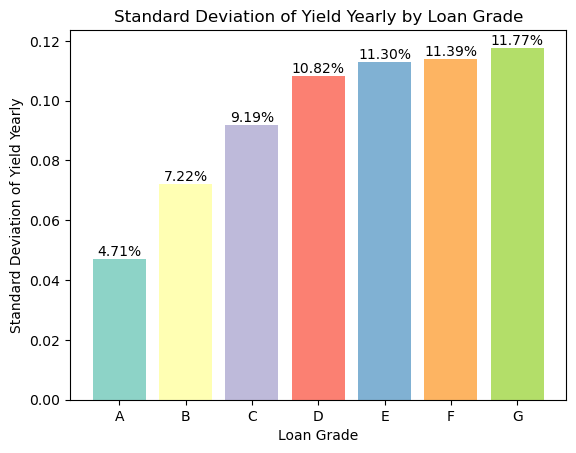

In [26]:
"""
This code snippet generates a bar chart depicting the standard deviation of yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

std_yield_by_grade = data.groupby('grade')['yield_2'].std()

color_palette = sns.color_palette('Set3', len(std_yield_by_grade))

fig, ax = plt.subplots()
ax.bar(std_yield_by_grade.index, std_yield_by_grade.values, color=color_palette)
ax.set_title('Standard Deviation of Yield Yearly by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Standard Deviation of Yield Yearly')

for i, v in enumerate(std_yield_by_grade):
    ax.text(i, v+0.001, f'{v:.2%}', ha='center')

plt.show()


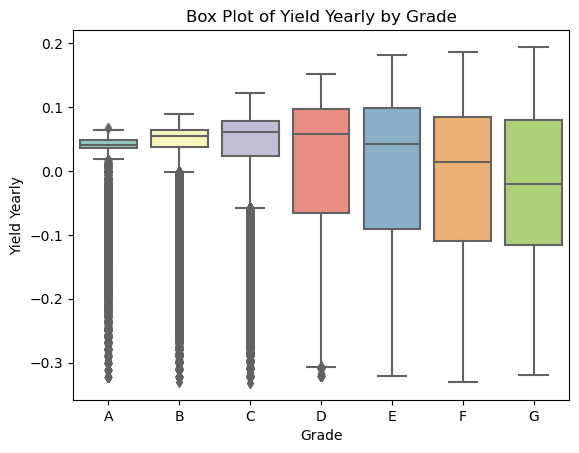

In [27]:
"""
This code snippet generates a box plot depicting the distribution of yearly yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

grade_order = sorted(data['grade'].unique())

color_palette = sns.color_palette('Set3', n_colors=len(grade_order))

sns.boxplot(data=data, x='grade', y='yield_2', order=grade_order, palette=color_palette)

plt.title('Box Plot of Yield Yearly by Grade')
plt.xlabel('Grade')
plt.ylabel('Yield Yearly')

plt.show()


In [29]:
"""
This code snippet calculates various statistics for loans grouped by their respective grades and displays 
the results in a tabular format using the PrettyTable library.
"""

grade_stats = data.groupby('grade').agg({'yield_2': ['mean', 'std'],  'id': 'count', 'loan_amnt': 'sum'})
grade_stats.columns = ['Expected realized returns', 'SD of Yield', 'Number of Loans', 'Total Loan Amount']
grade_stats = grade_stats.sort_index()
grade_stats['Total Loan Amount'] = grade_stats['Total Loan Amount'].apply(lambda x: "${:,.2f}".format(x))
grade_stats['Expected realized returns'] = grade_stats['Expected realized returns'].apply(lambda x: "{:.2%}".format(x))
grade_stats['SD of Yield'] = grade_stats['SD of Yield'].apply(lambda x: "{:.2%}".format(x))

# Create a PrettyTable object
table = PrettyTable()
table.field_names = grade_stats.columns
for _, row in grade_stats.iterrows():
    table.add_row(row)
print(table)



+---------------------------+-------------+-----------------+-------------------+
| Expected realized returns | SD of Yield | Number of Loans | Total Loan Amount |
+---------------------------+-------------+-----------------+-------------------+
|           3.15%           |    4.71%    |      58205      |  $827,136,325.00  |
|           2.85%           |    7.22%    |      100511     | $1,297,360,550.00 |
|           2.05%           |    9.19%    |      95049      | $1,340,526,675.00 |
|           1.22%           |    10.82%   |      43539      |  $674,768,850.00  |
|           0.38%           |    11.30%   |      19378      |  $338,367,400.00  |
|           -1.08%          |    11.39%   |       7207      |  $136,699,850.00  |
|           -1.72%          |    11.77%   |       1997      |   $38,856,500.00  |
+---------------------------+-------------+-----------------+-------------------+


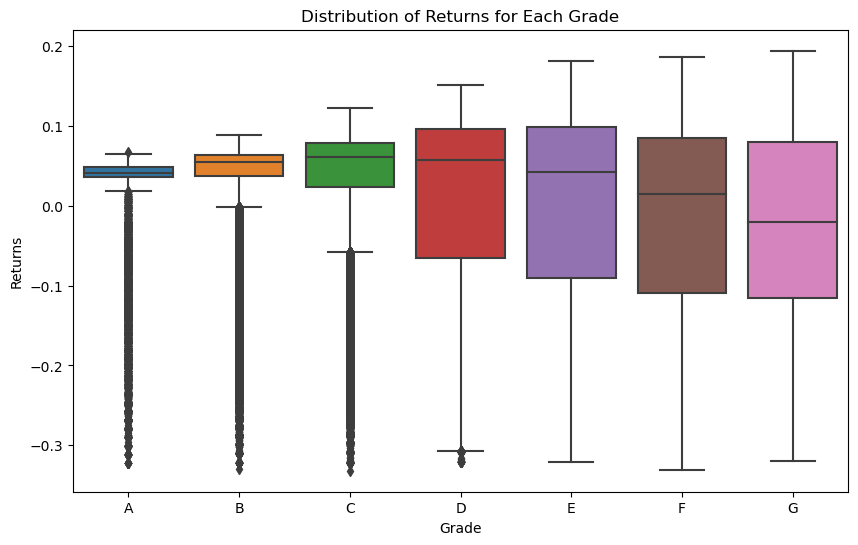

In [30]:
"""
This code snippet generates a box plot depicting the distribution of yearly yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

grade_order = sorted(data['grade'].unique())

plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='grade', y='yield_2', order=grade_order)
plt.xlabel('Grade')
plt.ylabel('Returns')
plt.title('Distribution of Returns for Each Grade')
plt.show()


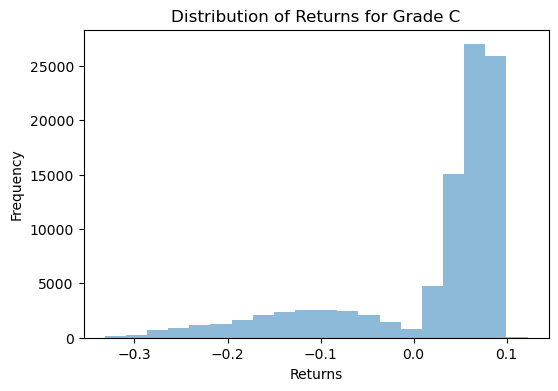

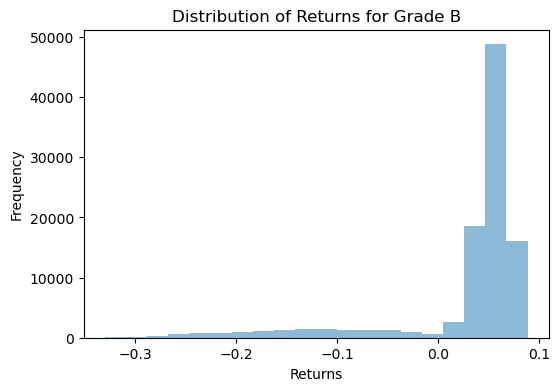

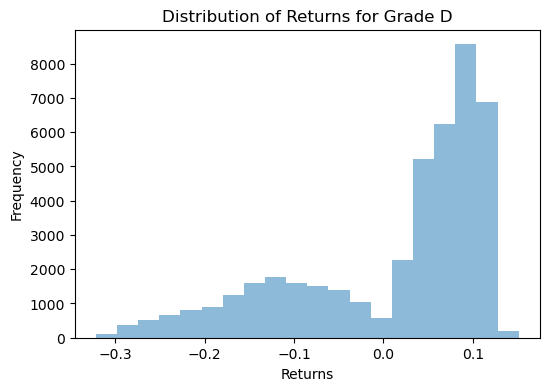

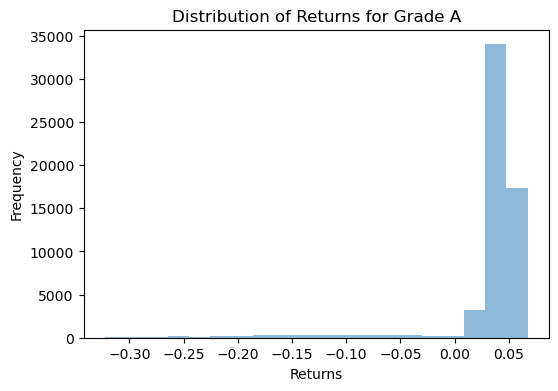

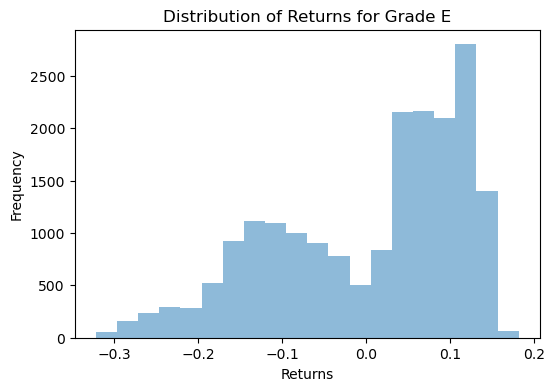

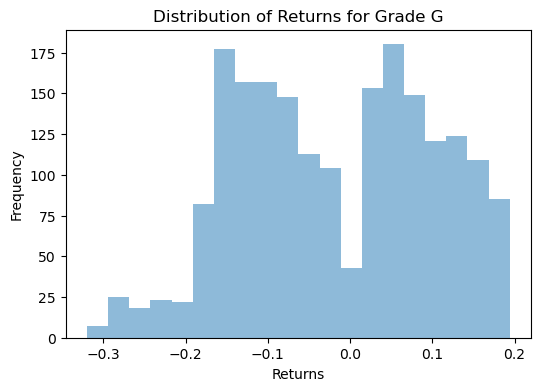

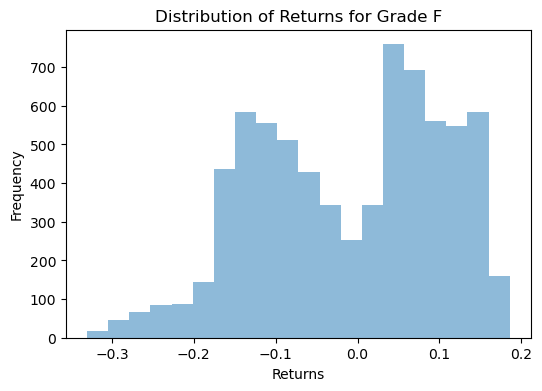

In [31]:
"""
Create histograms of returns for each unique grade in the DataFrame.
"""

# Iterate over unique grades
for grade in data['grade'].unique():
    # Select returns data for the current grade
    returns = data[data['grade'] == grade]['yield_2']

    # Create a separate figure for each grade's histogram
    plt.figure(figsize=(6, 4))

    # Create the histogram
    plt.hist(returns, bins=20, alpha=0.5)

    plt.xlabel('Returns')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Returns for Grade {grade}')

    plt.show()


In [32]:
"""
Perform Shapiro-Wilk test on grade-wise returns and store the results in a DataFrame.
"""

# Create an empty DataFrame to store the test results
test_results = pd.DataFrame(columns=['Grade', 'Shapiro-Wilk Statistic', 'p-value'])

# Perform Shapiro-Wilk test for each grade's returns
for grade in data['grade'].unique():
    # Select returns data for the current grade
    returns = data[data['grade'] == grade]['yield_2']

    # Perform Shapiro-Wilk test
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        stat, p_value = shapiro(returns)

    # Add the test results to the DataFrame
    test_results = pd.concat([test_results, pd.DataFrame({'Grade': [grade], 'Shapiro-Wilk Statistic': [stat], 'p-value': [p_value]})])

# Display the test results
print(test_results)


  Grade  Shapiro-Wilk Statistic       p-value
0     C                0.731688  0.000000e+00
0     B                0.583781  0.000000e+00
0     D                0.841263  0.000000e+00
0     A                0.392948  0.000000e+00
0     E                0.915530  0.000000e+00
0     G                0.964735  1.121696e-21
0     F                0.955617  3.298657e-42


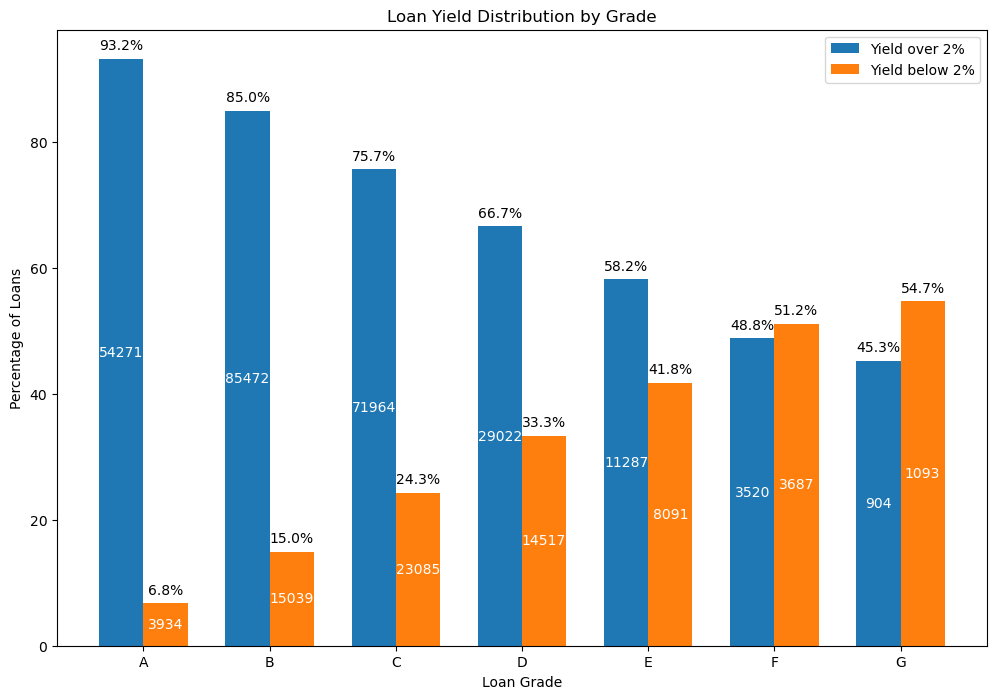

In [68]:
"""
Calculate and visualize the percentage of loans above and below 2% yield for each grade.
"""

# Calculate the percentage of loans above and below 2% for each grade
loan_counts = data.groupby('grade')['yield_over'].value_counts().unstack().fillna(0)

# Create an array for the grades and the positions of the bars
grades = loan_counts.index
x = np.arange(len(grades))

# Calculate the percentages for above 2% and below 2% for each grade
above_2_percent = loan_counts[1] / (loan_counts[0] + loan_counts[1]) * 100
below_2_percent = loan_counts[0] / (loan_counts[0] + loan_counts[1]) * 100

# Set the width of the bars
bar_width = 0.35

# Set the figure size
plt.figure(figsize=(12, 8))

# Create the bar plot
plt.bar(x, above_2_percent, width=bar_width, label='Yield over 2%')
plt.bar(x + bar_width, below_2_percent, width=bar_width, label='Yield below 2%')

# Set the x-axis labels to be the grades
plt.xticks(x + bar_width/2, grades)

# Add percentage labels to the bars
for i, above_2 in enumerate(above_2_percent):
    plt.text(i, above_2 + 1, f"{above_2:.1f}%", ha='center', va='bottom')
    plt.text(i, above_2 / 2, f"{loan_counts[1].values[i]}", ha='center', va='center', color='white')
for i, below_2 in enumerate(below_2_percent):
    plt.text(i + bar_width, below_2 + 1, f"{below_2:.1f}%", ha='center', va='bottom')
    plt.text(i + bar_width, below_2 / 2, f"{loan_counts[0].values[i]}", ha='center', va='center', color='white')

# Set the labels and title
plt.xlabel('Loan Grade')
plt.ylabel('Percentage of Loans')
plt.title('Loan Yield Distribution by Grade')
plt.legend()

# Show the plot
plt.show()


### Identifying Features with High Percentage of NaN Values
Features with a high percentage of NaN values can negatively affect the performance of machine learning models and hence should be identified and either dropped or imputed with appropriate values.

In [29]:
"""
This code snippet checks for NaN values in the columns of a given dataset and identifies the features 
with a NaN percentage higher than 0%.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")

Columns with NaN percentage higher than 0% (sorted):
member_id: 100.00% NaN Percent
annual_inc_joint: 100.00% NaN Percent
dti_joint: 100.00% NaN Percent
verification_status_joint: 100.00% NaN Percent
revol_bal_joint: 100.00% NaN Percent
sec_app_fico_range_low: 100.00% NaN Percent
sec_app_fico_range_high: 100.00% NaN Percent
sec_app_earliest_cr_line: 100.00% NaN Percent
sec_app_inq_last_6mths: 100.00% NaN Percent
sec_app_mort_acc: 100.00% NaN Percent
sec_app_open_acc: 100.00% NaN Percent
sec_app_revol_util: 100.00% NaN Percent
sec_app_open_act_il: 100.00% NaN Percent
sec_app_num_rev_accts: 100.00% NaN Percent
sec_app_chargeoff_within_12_mths: 100.00% NaN Percent
sec_app_collections_12_mths_ex_med: 100.00% NaN Percent
sec_app_mths_since_last_major_derog: 100.00% NaN Percent
desc: 99.99% NaN Percent
mths_since_last_record: 80.31% NaN Percent
mths_since_recent_bc_dlq: 74.53% NaN Percent
mths_since_last_major_derog: 70.82% NaN Percent
mths_since_recent_revol_delinq: 63.90% NaN Percent
mths_

In [30]:
"""
Features with a NaN percentage higher than 45% are added to the 'features_to_drop' list, while the remaining 
features are added to the 'features_to_test' list for further analysis in progess. 
"""

# Create an empty list to store column names
features_to_drop = []
features_to_test=[]

# Loop through the columns in changed_columns dictionary
for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent > 45:
        features_to_drop.append(column)
        if column in features_to_test:
            features_to_test.remove(column)
    else:
        features_to_test.append(column)

In [31]:
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

['member_id', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_earliest_cr_line', 'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'sec_app_mths_since_last_major_derog', 'desc', 'mths_since_last_record', 'mths_since_recent_bc_dlq', 'mths_since_last_major_derog', 'mths_since_recent_revol_delinq', 'mths_since_last_delinq']


### The distribution of features values
#### Identifying Features with Identical Values
We aims to identify features in the dataset that have the same value for the entire length of the column. Identifying these features is important because they do not provide any useful information for modeling and can be safely removed to reduce the dimensionality of the dataset and improve model performance.

In [32]:
"""
Identify features in the dataset with the same value for the entire length of the column.
"""
features_to_drop = []
same_value_cols = []
for column in data.columns:
    if column == 'id':
        continue
    unique_values = data[column].nunique()
    if unique_values == 1 and data[column].isna().sum() == 0:
        same_value_cols.append(column)

# Print columns with the same value for the entire length of the column
print("Columns with the same value for the entire length of the column:")
for col in same_value_cols:
    features_to_drop.append(col)
    if column in features_to_test:
        features_to_test.remove(column)
    print(col)

Columns with the same value for the entire length of the column:
policy_code


In [33]:
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

['policy_code']


### Removing Business-Irrelevant Features
The columns that considere business-irrelevant as they do not have a significant impact on the loan prediction model and do not provide meaningful insights to the business. By removing these features, we can reduce the complexity of the dataset and potentially improve the performance of the machine learning model.

In [34]:
features_to_drop=['emp_title','url','title','zip_code','sub_grade']
data.drop(features_to_drop, axis=1, inplace=True)

###  Data Type Conversion
We want to ensures that the data is in the appropriate format for analysis.

In [35]:
pd.set_option("display.max_rows", None)
print(data.dtypes)
pd.reset_option("display.max_rows")

id                                     int64
loan_amnt                            float64
term                                  object
int_rate                              object
installment                          float64
grade                                 object
emp_length                            object
home_ownership                        object
annual_inc                           float64
issue_d                       datetime64[ns]
purpose                               object
addr_state                            object
dti                                  float64
delinq_2yrs                          float64
earliest_cr_line                      object
fico_range_low                       float64
fico_range_high                      float64
inq_last_6mths                       float64
open_acc                             float64
pub_rec                              float64
revol_bal                            float64
revol_util                            object
total_acc 

In [36]:
data["term"] = data['term'].replace({' 36 months': 36, ' 60 months': 60})
data['int_rate'] = data['int_rate'].str.replace('%', '').astype('float64') / 100.0
data["emp_length"] = data["emp_length"].replace({"< 1 year": "0", "10+ years": "10", np.nan: np.nan})
data["emp_length"] = data["emp_length"].str.extract('(\\d+)').astype(float)
data['revol_util'] = data['revol_util'].str.replace('%', '').astype('float64') / 100.0
data.loc[:, "earliest_cr_line"] = pd.to_datetime(data["earliest_cr_line"])

**Correct Classification of Numeric Data: Differentiating between Float and Integer**
<br>
Checking which columns are integers is important to ensure that calculations and operations are performed correctly, as certain functions or operations may behave differently on integers compared to floats or other data types. Additionally, some columns may be categorical in nature even if they contain numerical values, and treating them as continuous variables may result in inaccurate analyses or models. Therefore, it is important to identify and treat integer columns appropriately in data analysis.

In [37]:
"""
This code properly classifies float columns with all zero decimals into integer or object types. 
Columns without missing values are converted to integers, while those with missing values are converted 
to object types. Once missing values are handled, variables in the int_with_nas list will be converted to integers.
"""

int_with_nas=[]
for col in data.columns:
    if not data[col].dtype == 'object' and not data[col].dtype == 'int64' and not data[col].dtype=='datetime64[ns]': 
        count = (data[col].apply(lambda x: str(x).split('.')[1] if '.' in str(x) else '')
                   .str.count('[1-9]')
                   .sum())
        if count==0:
            if sum(data[col].isna())==0:
                data[col]=data[col].astype(int)

In [38]:
data['tot_cur_bal']=data['tot_cur_bal'].astype('float64')
data['loan_amnt']=data['loan_amnt'].astype('float64')
data['fico_range_low']=data['fico_range_low'].astype('float64')
data['fico_range_high']=data['fico_range_high'].astype('float64')
data['revol_bal']=data['revol_bal'].astype('float64')
data['max_bal_bc']=data['max_bal_bc'].astype('float64')
data['tot_coll_amt']=data['tot_coll_amt'].astype('float64')
data['total_bal_il']=data['total_bal_il'].astype('float64')
data['total_rev_hi_lim']=data['total_rev_hi_lim'].astype('float64')
data['avg_cur_bal']=data['avg_cur_bal'].astype('float64')
data['bc_open_to_buy']=data['bc_open_to_buy'].astype('float64')
data['tot_hi_cred_lim']=data['tot_hi_cred_lim'].astype('float64')
data['total_bal_ex_mort']=data['total_bal_ex_mort'].astype('float64')
data['total_bc_limit']=data['total_bc_limit'].astype('float64')
data['total_il_high_credit_limit']=data['total_il_high_credit_limit'].astype('float64')

### Continuation of Distribution of features values
#### Detecting High Concentration of Values in the columns
<br>
Identifying columns with over 95% of the data in one value can help detect potential data quality issues, redundant features, and improve computational efficiency by reducing the dimensionality of the dataset. By investigating the cause of this issue, we can determine whether the column should be kept, modified, or removed from the dataset to ensure accurate and efficient analysis.
We chose 95% because columns with over 95% of the data in one value may not provide enough information to effectively predict the target variable, which could result in a suboptimal or inaccurate model.

In [39]:
"""
Finds columns in data that have over 95% of the data in one value.
"""
for column in data.columns:
    value_counts = data[column].value_counts(normalize=True)
    if (value_counts > 0.95).any():
        print(f"{column} has over 95% of the data in one value.")

collections_12_mths_ex_med has over 95% of the data in one value.
acc_now_delinq has over 95% of the data in one value.
chargeoff_within_12_mths has over 95% of the data in one value.
delinq_amnt has over 95% of the data in one value.
num_tl_120dpd_2m has over 95% of the data in one value.
num_tl_30dpd has over 95% of the data in one value.
tax_liens has over 95% of the data in one value.


Now we will explore each variable

In [40]:
def plot_yield_graphs(col,title):
    """
    Plot the loan failure rates and yearly yield mean for a given column.

    Parameters:
    col (str): A string representing the column of the data to analyze.
    title (str): A string representing the title of the plot.

    Returns:
    None: The function only plots the data.

    """
    df = yield_percentages(col)
    
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
    sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])
    
    axes[0].set_xlabel(title)
    axes[0].set_ylabel('Percentage of yield under 2%')
    axes[0].set_title(f'Loan failure rates by {title}')
    pop_mean = 1 - data['yield_over'].mean()
    axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
    
    sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
    axes[1].set_xlabel(title)
    axes[1].set_ylabel('Yearly yield mean')
    axes[1].set_title(f'Yearly yield mean by {title}')
    pop_mean = data['yield_yearly_1'].mean()
    axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
    
    axes[0].legend()
    axes[1].legend()

    plt.show()

def yield_percentages(col):
    """
    Compute the loan failure rates and yearly yield mean for a given column.

    Parameters:
    col (str): A string representing the column of the data to analyze.

    Returns:
    pd.DataFrame: A DataFrame with the loan failure rates and yearly yield mean for each value of the given column.

    """

    col_counts_normal = data[col].value_counts(normalize=True)
    col_counts = data[col].value_counts()
    
    yield_under_percentages = []
    yield_yearly_1_mean = []
    for idx in col_counts.index:
        yield_under_percentages.append(1 - (data[data[col] == idx]['yield_over'].mean()))
        yield_yearly_1_mean.append((data[data[col] == idx]['yield_yearly_1'].mean()))
        
    df = pd.DataFrame({col: col_counts.index, 'Count': col_counts.values,'normalize count':col_counts_normal.values ,'yield over percentages': yield_under_percentages,'yearly yield mean':yield_yearly_1_mean})
    return(df)


**collections_12_mths_ex_med**
<br>
This variable contains 98% of the data in one category, where both the failure and return rates are close to the overall average. The remaining 2% of the data is dispersed and does not provide conclusive insights. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

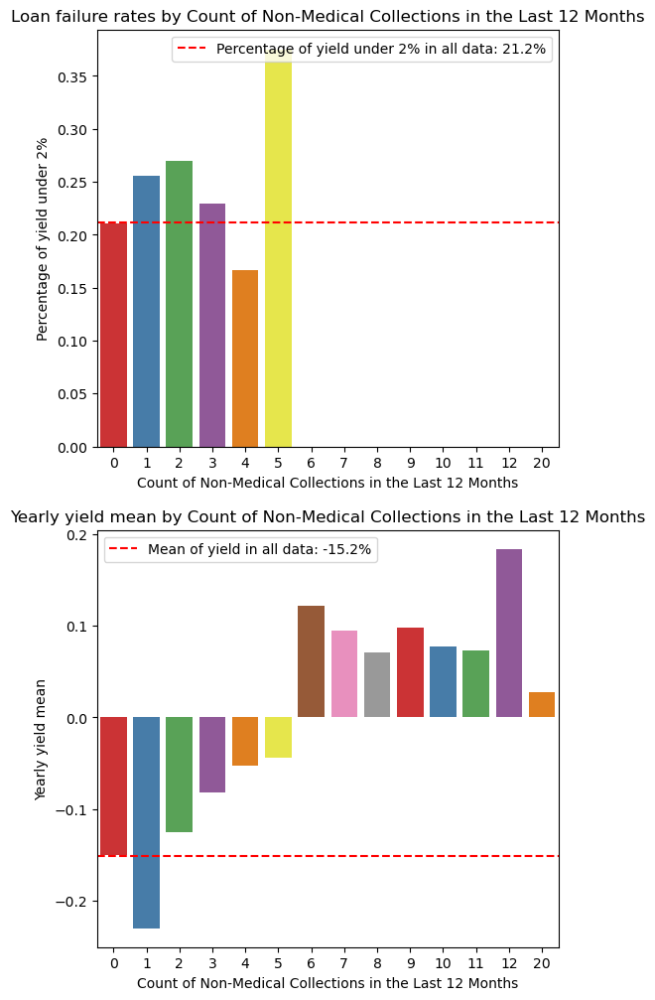

,collections_12_mths_ex_med,Count,normalize count,yield over percentages,yearly yield mean
0,0,322023,0.980158,0.211022,-0.150192
1,1,6023,0.018333,0.255521,-0.230041
2,2,401,0.001221,0.269327,-0.125795
3,3,48,0.000146,0.229167,-0.082174
4,4,24,0.000073,0.166667,-0.052330
5,5,8,0.000024,0.375000,-0.044440
6,6,5,0.000015,0.000000,0.122218
7,7,4,0.000012,0.000000,0.094527
8,11,1,0.000003,0.000000,0.072667
9,12,1,0.000003,0.000000,0.183941


In [41]:
plot_yield_graphs('collections_12_mths_ex_med','Count of Non-Medical Collections in the Last 12 Months')
yield_percentages('collections_12_mths_ex_med')

In [42]:
data.drop('collections_12_mths_ex_med', axis=1, inplace=True)

**acc_now_delinq**
<br>
This variable contains 99.36% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

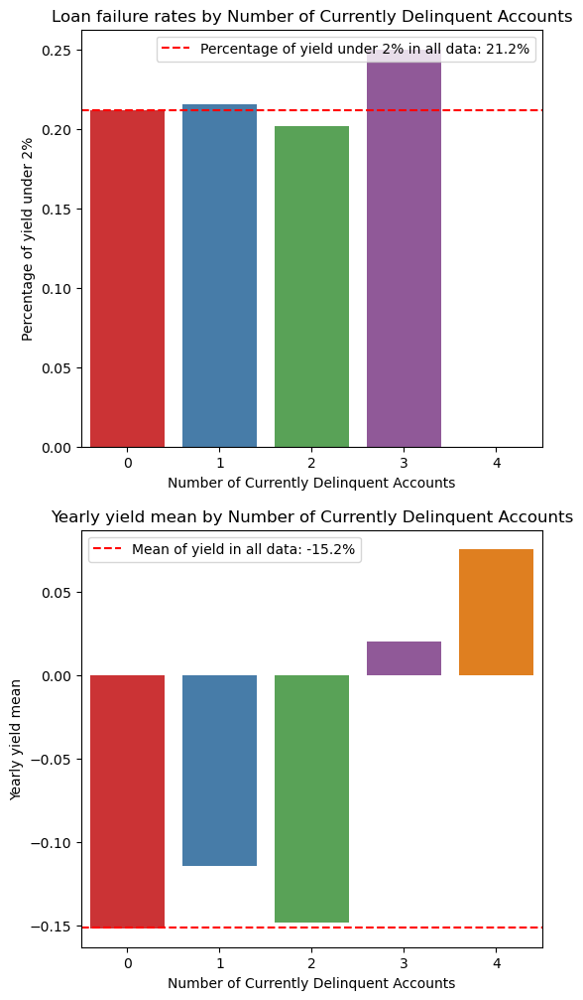

,acc_now_delinq,Count,normalize count,yield over percentages,yearly yield mean
0,0,326459,0.993660,0.211886,-0.151828
1,1,1963,0.005975,0.215487,-0.114560
2,2,104,0.000317,0.201923,-0.148222
3,3,12,0.000037,0.250000,0.020243
4,4,4,0.000012,0.000000,0.075674


In [43]:
plot_yield_graphs('acc_now_delinq','Number of Currently Delinquent Accounts')
yield_percentages('acc_now_delinq')

In [44]:
data.drop('acc_now_delinq', axis=1, inplace=True)

**chargeoff_within_12_mths**
<br>
This variable contains 99.17% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

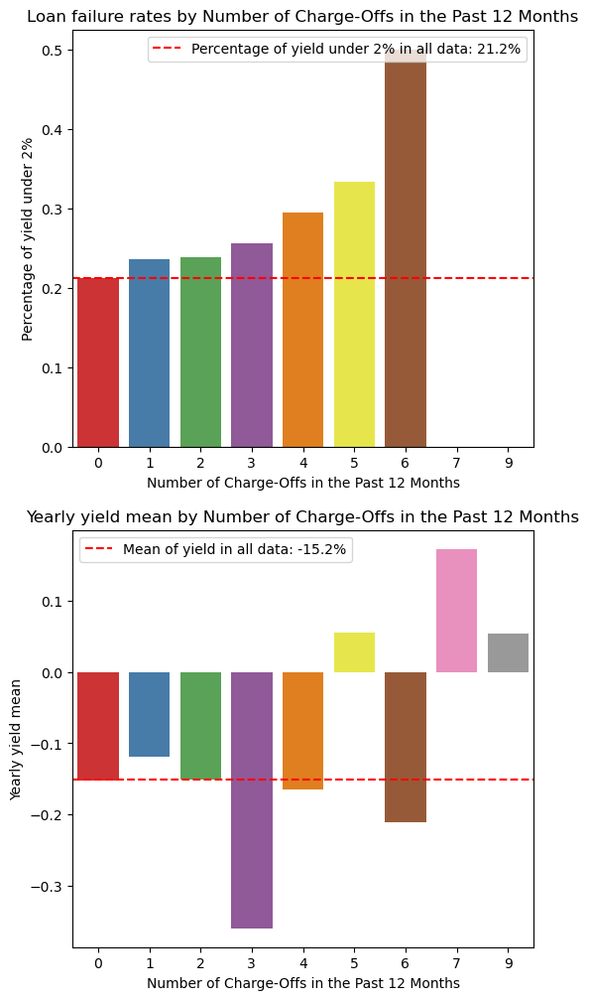

,chargeoff_within_12_mths,Count,normalize count,yield over percentages,yearly yield mean
0,0,325824,0.991727,0.211697,-0.151828
1,1,2486,0.007567,0.235720,-0.118571
2,2,164,0.000499,0.237805,-0.151130
3,3,39,0.000119,0.256410,-0.359430
4,4,17,0.000052,0.294118,-0.164656
5,5,6,0.000018,0.333333,0.055087
6,7,2,0.000006,0.000000,0.172546
7,6,2,0.000006,0.500000,-0.210921
8,9,2,0.000006,0.000000,0.054520


In [45]:
plot_yield_graphs('chargeoff_within_12_mths','Number of Charge-Offs in the Past 12 Months')
yield_percentages('chargeoff_within_12_mths')

In [46]:
data.drop('chargeoff_within_12_mths', axis=1, inplace=True)

**delinq_amnt**
<br>
This variable contains 99.45% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

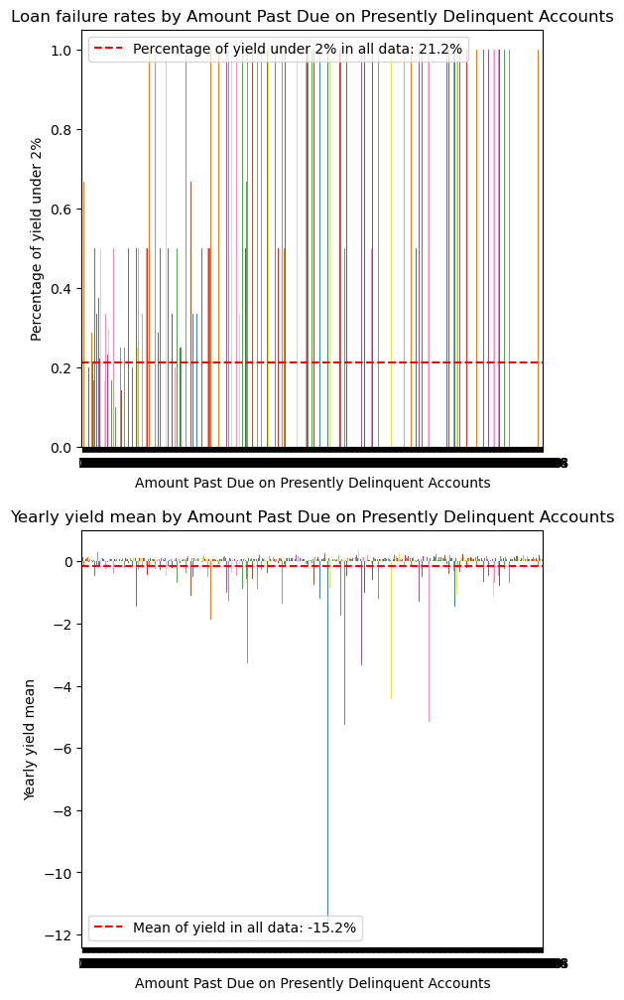

,delinq_amnt,Count,normalize count,yield over percentages,yearly yield mean
0,0,326750,0.994546,0.211804,-0.151705
1,65000,40,0.000122,0.325000,-0.310498
2,25,24,0.000073,0.208333,-0.005655
3,56,19,0.000058,0.263158,-0.242170
4,30,19,0.000058,0.263158,-0.625535
...,...,...,...,...,...
1009,6089,1,0.000003,0.000000,0.227452
1010,5332,1,0.000003,1.000000,-0.394270
1011,36609,1,0.000003,0.000000,0.057021
1012,1087,1,0.000003,0.000000,0.093757


In [47]:
plot_yield_graphs('delinq_amnt','Amount Past Due on Presently Delinquent Accounts')
yield_percentages('delinq_amnt')

In [48]:
data.drop('delinq_amnt', axis=1, inplace=True)

**num_tl_30dpd**
<br>
This variable contains 99.58% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

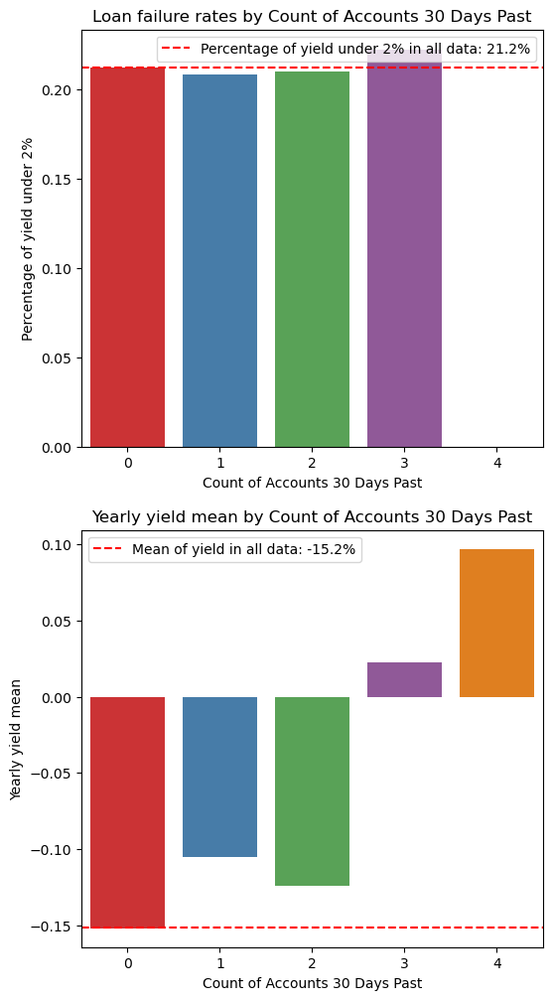

,num_tl_30dpd,Count,normalize count,yield over percentages,yearly yield mean
0,0,327184,0.995867,0.211917,-0.151789
1,1,1286,0.003914,0.208398,-0.104876
2,2,62,0.000189,0.209677,-0.123759
3,3,9,0.000027,0.222222,0.022175
4,4,1,0.000003,0.000000,0.096835


In [49]:
plot_yield_graphs('num_tl_30dpd','Count of Accounts 30 Days Past')
yield_percentages('num_tl_30dpd')

In [50]:
data.drop('num_tl_30dpd', axis=1, inplace=True)

**num_tl_120dpd_2m**
<br>
This variable contains 99.89% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

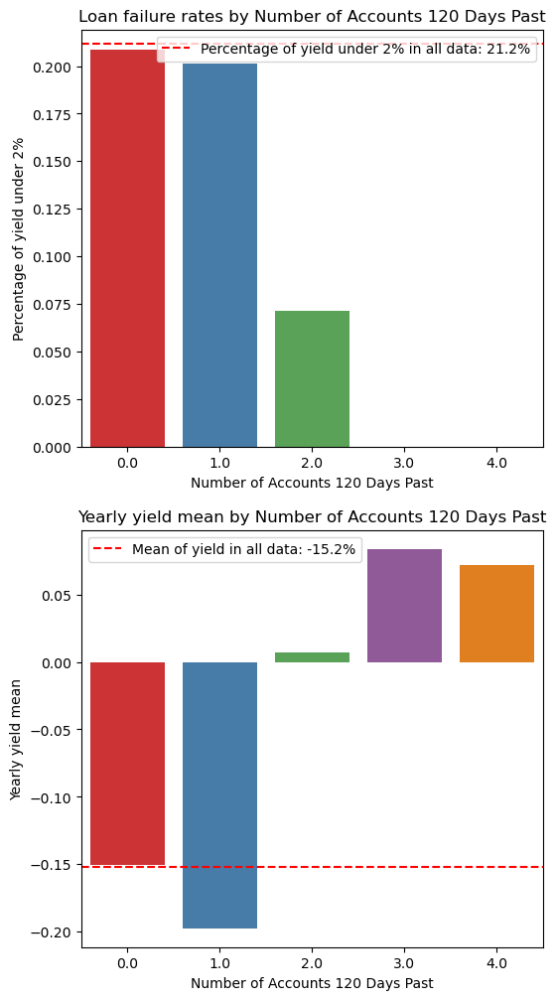

,num_tl_120dpd_2m,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,311965,0.998962,0.208805,-0.150159
1,1.0,308,0.000986,0.201299,-0.197292
2,2.0,14,0.000045,0.071429,0.006868
3,3.0,1,0.000003,0.000000,0.083689
4,4.0,1,0.000003,0.000000,0.071952


In [51]:
plot_yield_graphs('num_tl_120dpd_2m','Number of Accounts 120 Days Past')
yield_percentages('num_tl_120dpd_2m')

In [52]:
data.drop('num_tl_120dpd_2m', axis=1, inplace=True)

**tax_liens**
<br>

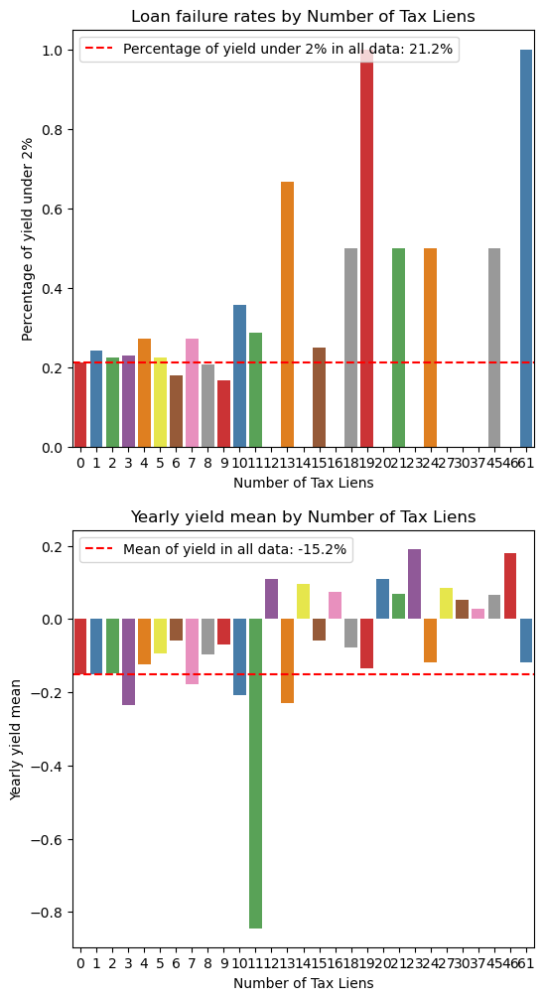

,tax_liens,Count,normalize count,yield over percentages,yearly yield mean
0,0,314145,0.956179,0.210677,-0.151467
1,1,9784,0.029780,0.242743,-0.151796
2,2,2674,0.008139,0.224383,-0.149442
3,3,952,0.002898,0.228992,-0.234359
4,4,451,0.001373,0.272727,-0.123862
5,5,249,0.000758,0.224900,-0.093862
6,6,112,0.000341,0.178571,-0.057915
7,7,59,0.000180,0.271186,-0.177788
8,8,34,0.000103,0.205882,-0.097445
9,9,18,0.000055,0.166667,-0.070781


In [53]:
plot_yield_graphs('tax_liens','Number of Tax Liens')
yield_percentages('tax_liens')

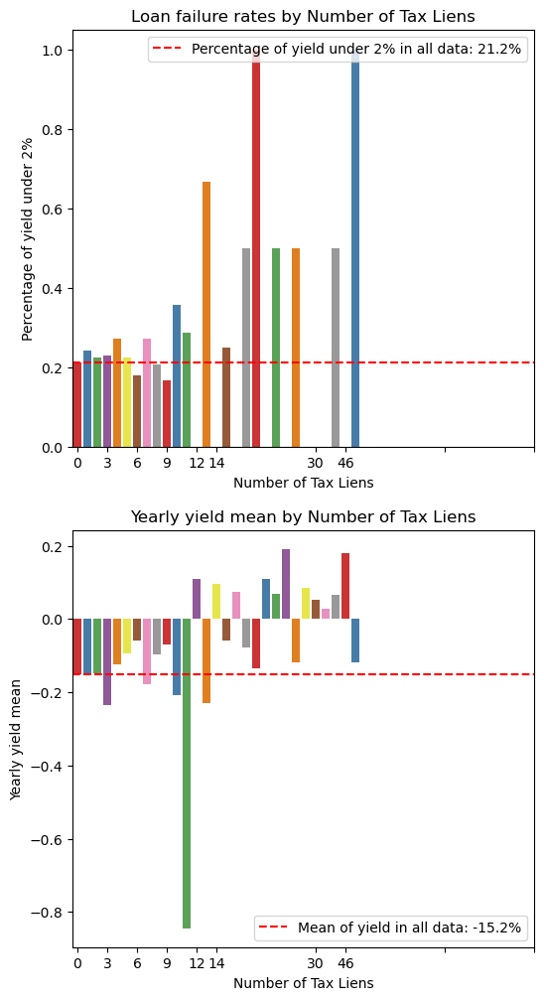

In [54]:
title='Number of Tax Liens'
col='tax_liens'
df = yield_percentages(col)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])
    
axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
axes[0].set_xticks(df['tax_liens'][::3])
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
    
sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
axes[1].set_xticks(df['tax_liens'][::3])
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
    
axes[0].legend()
axes[1].legend()

plt.show()


In [55]:
data["has_tax_liens"] = data["tax_liens"].apply(lambda x: 1 if x > 0 else 0)
data.drop('tax_liens', axis=1, inplace=True)

#### Calculating Entropy 
We look for entropy that close to 0 that means there is no uncertainty or randomness in the system and the outcome is certain.

In [56]:
continuous_vars = data.select_dtypes(include=['int','object'])
sorted_entropy = continuous_vars.apply(lambda col: stats.entropy(col.value_counts(normalize=True)))
sorted_entropy.sort_values(ascending=False, inplace=True)
sorted_entropy

id                       12.702420
mo_sin_old_rev_tl_op      5.880915
total_acc                 3.826531
mo_sin_rcnt_rev_tl_op     3.522944
num_rev_accts             3.372033
addr_state                3.363290
num_il_tl                 3.141903
open_acc                  3.045419
num_sats                  3.041009
mo_sin_rcnt_tl            2.986429
num_op_rev_tl             2.823564
num_bc_tl                 2.821244
acc_open_past_24mths      2.503707
num_actv_rev_tl           2.493808
num_rev_tl_bal_gt_0       2.471303
num_bc_sats               2.374656
num_actv_bc_tl            2.123269
num_tl_op_past_12m        1.933689
mort_acc                  1.695756
grade                     1.582621
purpose                   1.369338
home_ownership            0.978859
num_accts_ever_120_pd     0.940248
delinq_2yrs               0.744553
pub_rec                   0.634835
initial_list_status       0.543567
is_default?               0.519608
yield_over                0.516467
term                

**num_tl_90g_dpd_24m**
<br>
The variable "num_tl_90g_dpd_24m" represents the number of accounts a borrower has that are 90 or more days past due in the last 24 months. This variable is relevant for predicting loan defaults because a high number of accounts past due may indicate a history of not repaying debts on time, which increases the risk of default. While high numbers of accounts past due generally lead to higher failure rates, for certain cases with a high number of accounts past due, they do not represent a large percentage of the data. Therefore, we can make this variable binary, where 0 represents no accounts past due and 1 represents a history of having accounts past due for 90 or more days in the last 24 months.

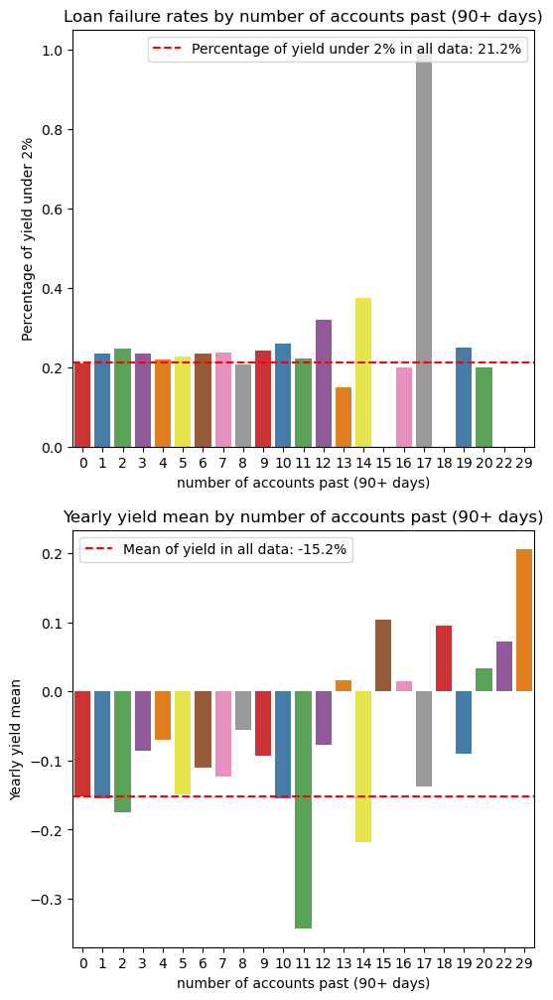

,num_tl_90g_dpd_24m,Count,normalize count,yield over percentages,yearly yield mean
0,0,309066,0.940720,0.210379,-0.151653
1,1,14495,0.044119,0.234840,-0.154200
2,2,2796,0.008510,0.247496,-0.175189
3,3,823,0.002505,0.234508,-0.085885
4,4,469,0.001428,0.219616,-0.070342
5,5,255,0.000776,0.227451,-0.148420
6,6,209,0.000636,0.234450,-0.110390
7,7,114,0.000347,0.236842,-0.123186
8,8,77,0.000234,0.207792,-0.055401
9,9,70,0.000213,0.242857,-0.093189


In [57]:
plot_yield_graphs('num_tl_90g_dpd_24m','number of accounts past (90+ days)')
yield_percentages('num_tl_90g_dpd_24m')

In [58]:
data["has_past_due_accounts_90g_24m"] = data["num_tl_90g_dpd_24m"].apply(lambda x: 1 if x > 0 else 0)
data.drop('num_tl_90g_dpd_24m', axis=1, inplace=True)

**pub_rec_bankruptcies**
<br>
"Pub_rec_bankruptcies" represents the number of public record bankruptcies a borrower has. This variable is relevant for predicting loan defaults because having a history of bankruptcy may indicate that the borrower has experienced financial difficulties in the past and may be at a higher risk of defaulting on the loan. Therefore, higher values of "pub_rec_bankruptcies" may be associated with a higher risk of default. Therefore, we can make this variable binary, where 0 represents no public record bankruptcies and 1 represents a more then one public record bankruptcies

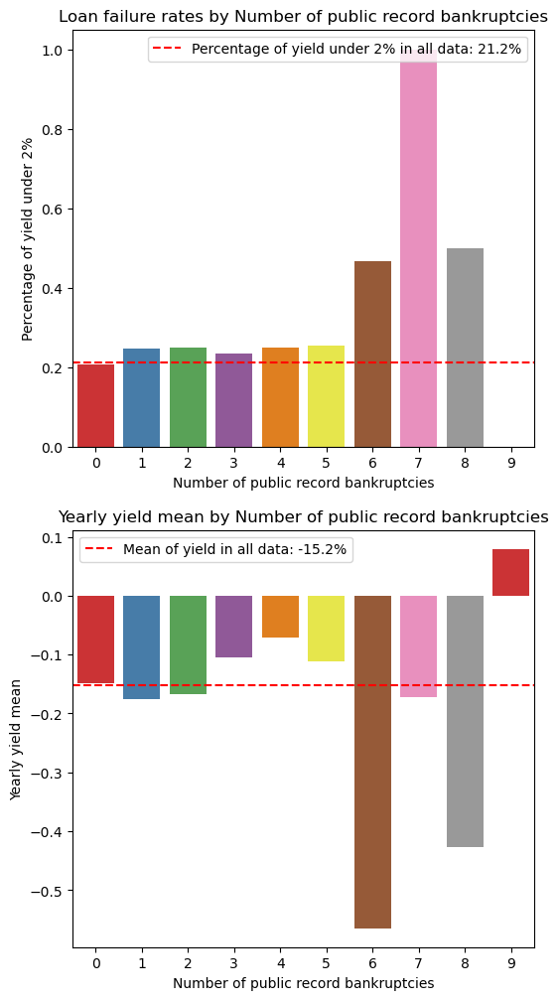

,pub_rec_bankruptcies,Count,normalize count,yield over percentages,yearly yield mean
0,0,283985,0.864380,0.206293,-0.148191
1,1,41065,0.124992,0.247632,-0.175030
2,2,2672,0.008133,0.248877,-0.166477
3,3,587,0.001787,0.233390,-0.104283
4,4,156,0.000475,0.250000,-0.070279
5,5,55,0.000167,0.254545,-0.111431
6,6,15,0.000046,0.466667,-0.564477
7,8,4,0.000012,0.500000,-0.426362
8,7,2,0.000006,1.000000,-0.172247
9,9,1,0.000003,0.000000,0.079271


In [59]:
plot_yield_graphs('pub_rec_bankruptcies','Number of public record bankruptcies')
yield_percentages('pub_rec_bankruptcies')

In [60]:
data["has_pub_rec_bankruptcies"] = data["pub_rec_bankruptcies"].apply(lambda x: 1 if x > 0 else 0)
data.drop('pub_rec_bankruptcies', axis=1, inplace=True)

**term**
For now we will keep this variable (you can see higher than average failure rates for loans taken for 60 months) and they represent 20% of the data - quite a bit.

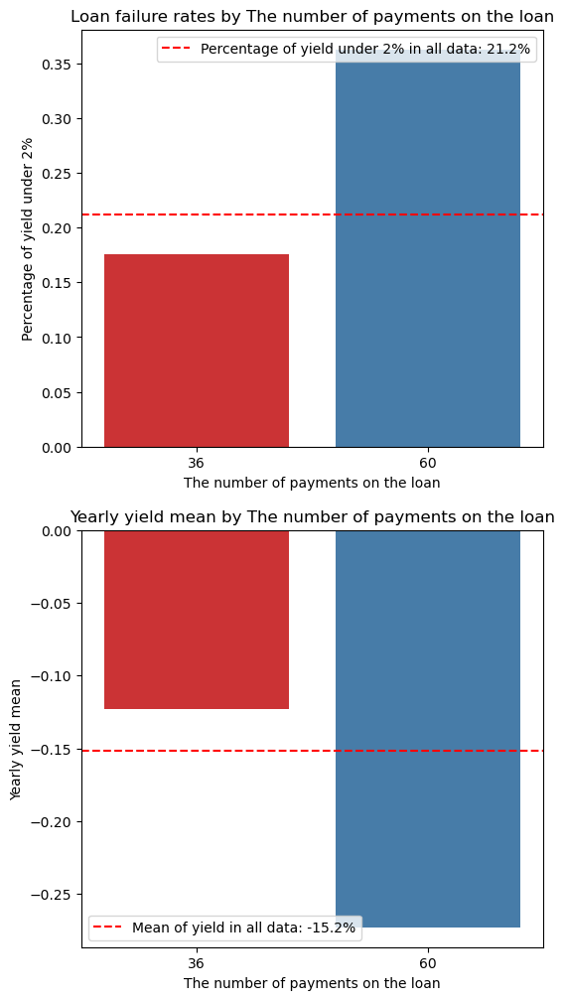

,term,Count,normalize count,yield over percentages,yearly yield mean
0,36,265118,0.806953,0.175827,-0.122613
1,60,63424,0.193047,0.362702,-0.272742


In [61]:
plot_yield_graphs('term','The number of payments on the loan')
yield_percentages('term')

### Handling missing values
Missing values can affect the accuracy of statistical analyses and modeling, and can lead to biased results or inaccurate predictions.

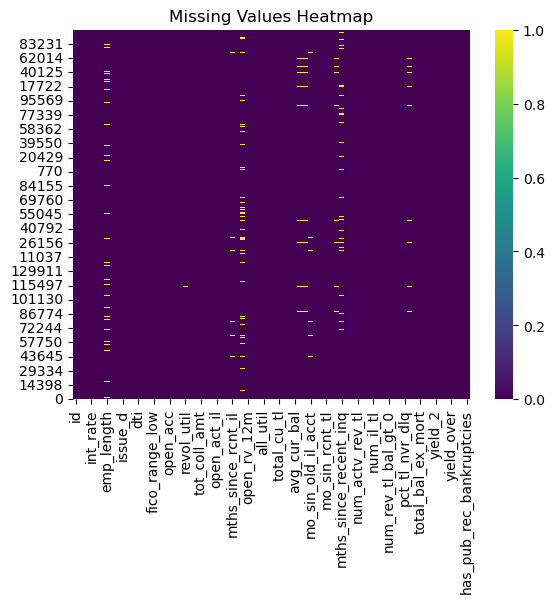

In [62]:
sns.heatmap(data.isnull(), cmap='viridis')
plt.title('Missing Values Heatmap')
plt.ylim(0, len(data))
plt.show()

In [63]:
"""
This code calculates the percentage of missing values for each column in the dataset and returns 
a sorted list of columns that have missing values higher than 0%, along with their corresponding 
percentage of missing values. The resulting dictionary is printed in descending order of NaN percentages.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")


Columns with NaN percentage higher than 0% (sorted):
il_util: 13.20% NaN Percent
mths_since_recent_inq: 9.83% NaN Percent
emp_length: 6.52% NaN Percent
mths_since_rcnt_il: 2.69% NaN Percent
mo_sin_old_il_acct: 2.68% NaN Percent
bc_util: 1.13% NaN Percent
percent_bc_gt_75: 1.09% NaN Percent
bc_open_to_buy: 1.08% NaN Percent
mths_since_recent_bc: 1.01% NaN Percent
revol_util: 0.06% NaN Percent
yield_2: 0.04% NaN Percent
all_util: 0.02% NaN Percent
open_acc_6m: 0.02% NaN Percent
total_cu_tl: 0.02% NaN Percent
inq_last_12m: 0.02% NaN Percent
open_act_il: 0.02% NaN Percent
open_il_12m: 0.02% NaN Percent
open_il_24m: 0.02% NaN Percent
total_bal_il: 0.02% NaN Percent
open_rv_12m: 0.02% NaN Percent
open_rv_24m: 0.02% NaN Percent
max_bal_bc: 0.02% NaN Percent
inq_fi: 0.02% NaN Percent
inq_last_6mths: 0.00% NaN Percent


Since this is a very small amount of instances, we will remove all instances with a percentage of missing values smaller than 0.07%

In [ ]:
def forward_selection(data, target, model,improvement_threshold=0.0001):
    initial_features = list(range(data.shape[1]))
    best_features = []
    
    while len(initial_features) > 0:
        remaining_features = list(set(initial_features) - set(best_features))
        new_mse = np.inf
        for new_column in remaining_features:
            model.fit(data[:, best_features+[new_column]], target)
            y_pred = model.predict(data[:, best_features+[new_column]])
            mse = mean_squared_error(target, y_pred)
            if mse < new_mse:
                if len(best_features) >= 30:
                    return best_features
                new_mse = mse
                best_column = new_column
        best_features.append(best_column)
        print('Best MSE: ', new_mse, '\tAdded feature: ', best_column)
        if np.isinf(new_mse):
            return best_features
    return best_features

model = LinearRegression()
data_best_features = forward_selection(X_train_scaled, y_train, model,improvement_threshold=0.0001)

In [64]:
"""
This script drops rows containing missing values in columns with less than 0.07% percentage of missing values.
It returns the number of features with missing values and the number and percentage of rows that were removed.
"""

data_t=data.copy()
i=0
initial_instances = data_t.shape[0]

for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent < 0.07:
        i+=1
        data_t.dropna(subset=[column], inplace=True)

final_instances = data_t.shape[0]
removed_number = (initial_instances - final_instances)
removed_percent = removed_number / initial_instances * 100


print('there is:',len(na_percent_above_0.keys()),"featuers with missing value")
print('Of these:',removed_number,"have less than 0.07% percentage of missing values and it",removed_percent,"Percentage of the data")

there is: 24 featuers with missing value
Of these: 395 have less than 0.07% percentage of missing values and it 0.12022815956559588 Percentage of the data


In [65]:
for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent < 0.07:
        data.dropna(subset=[column], inplace=True)

In [66]:
"""
This code calculates the percentage of missing values for each column in the dataset and returns 
a sorted list of columns that have missing values higher than 0%, along with their corresponding 
percentage of missing values. The resulting dictionary is printed in descending order of NaN percentages.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")

Columns with NaN percentage higher than 0% (sorted):
il_util: 13.19% NaN Percent
mths_since_recent_inq: 9.82% NaN Percent
emp_length: 6.51% NaN Percent
mths_since_rcnt_il: 2.68% NaN Percent
mo_sin_old_il_acct: 2.68% NaN Percent
bc_util: 1.07% NaN Percent
percent_bc_gt_75: 1.03% NaN Percent
bc_open_to_buy: 1.03% NaN Percent
mths_since_recent_bc: 0.96% NaN Percent


**il_util and mths_since_recent_inq**
<br>
The "il_util" feature reflects a borrower's account utilization, which is important in assessing ability to return loan. We can use other related columns such as payment and credit utilization to predict this variable, we can see that they have high correlation.
The "mths_since_recent_inq" feature reflects the number of months since the borrower's most recent installment accounts opened, which is important in assessing ability to return a loan. 
We observed that the distribution of "il_util" has a median greater than the mean, indicating a non-normal distribution. Hence, we will use the median to fill in the missing values, which is a more conservative approach. A lower value of "il_util" suggests that the borrower is utilizing a smaller portion of their available credit, potentially reducing the risk of default and improving their creditworthiness.

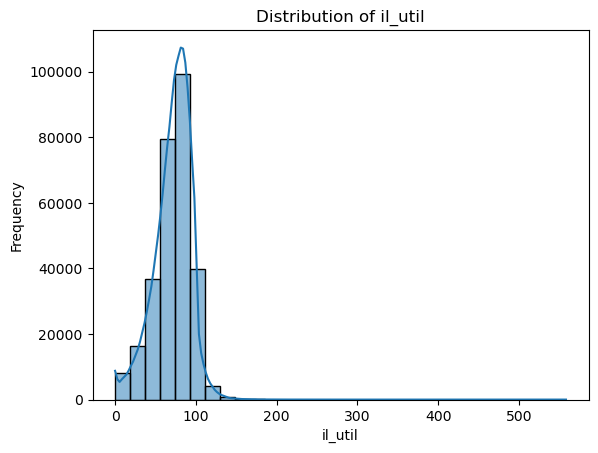

In [67]:
col_withoutnas = data.reset_index()['il_util']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=30, kde=True)
plt.xlabel('il_util')
plt.ylabel('Frequency')
plt.title('Distribution of il_util')
plt.show()

In [68]:
il_util_medi = data["il_util"].median()
data["il_util_med"]=data["il_util"]
data["il_util_med"].fillna(il_util_medi, inplace=True)

The "mths_since_rcnt_il" distribution shows a higher mean than the median, indicating some outliers in the data. To address missing values, we will use the median as a conservative approach. Higher values of "mths_since_rcnt_il" suggest that the borrower has not recently applied for new credit, which could reduce the risk of default.

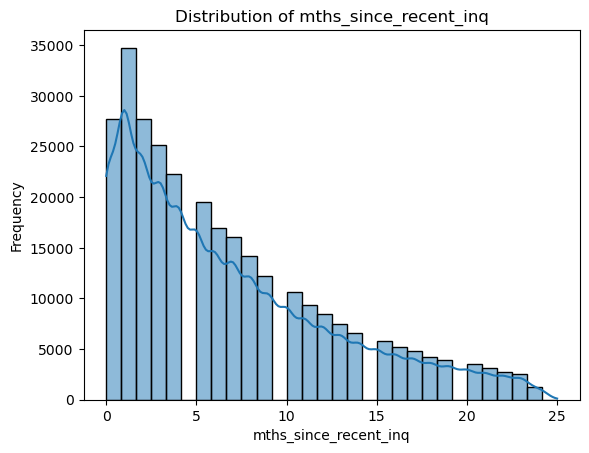

In [69]:
col_withoutnas = data.reset_index()['mths_since_recent_inq']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=30, kde=True)
plt.xlabel('mths_since_recent_inq')
plt.ylabel('Frequency')
plt.title('Distribution of mths_since_recent_inq')
plt.show()

In [70]:
mths_since_recent_inq_med = data["mths_since_recent_inq"].median()
data["mths_since_recent_inq_med"]=data["mths_since_recent_inq"]
data["mths_since_recent_inq_med"].fillna(mths_since_recent_inq_med, inplace=True)

The "il_util" feature reflects a borrower's account utilization, which is important in assessing ability to return a loan. We can use other related columns such as payment and credit utilization to predict this variable, we can see that they have high correlation.

The "mths_since_recent_inq_med" feature reflects the number of months since the borrower's most recent installment accounts opened, which is important in assessing ability to return a loan. We can use other related columns , we can see that there is high correlation.

In [71]:
"""
This code creates a correlation matrix using the `corr()` function on a DataFrame called `data`. 
It then finds the columns with the highest correlation to two specific features: `il_util` and `mths_since_recent_inq`.
The results are printed to the console, showing the column names with the highest correlation for each feature.
"""

corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_il_util = corr_matrix['il_util'].sort_values(ascending=False).index[0:6]

# Find the column with highest correlation to mths_since_recent_inq
highest_corr_to_mths_since_recent_inq = corr_matrix['mths_since_recent_inq'].sort_values(ascending=False).index[0:10]

# Print the results
print("Column with highest correlation to il_util: ", highest_corr_to_il_util)
print("Column with highest correlation to mths_since_recent_inq: ", highest_corr_to_mths_since_recent_inq)


Column with highest correlation to il_util:  Index(['il_util', 'il_util_med', 'all_util', 'open_il_12m', 'total_bal_il',
       'open_il_24m'],
      dtype='object')
Column with highest correlation to mths_since_recent_inq:  Index(['mths_since_recent_inq_med', 'mths_since_recent_inq', 'mo_sin_rcnt_tl',
       'mo_sin_rcnt_rev_tl_op', 'revol_util', 'mths_since_rcnt_il',
       'mths_since_recent_bc', 'bc_util', 'percent_bc_gt_75',
       'fico_range_high'],
      dtype='object')


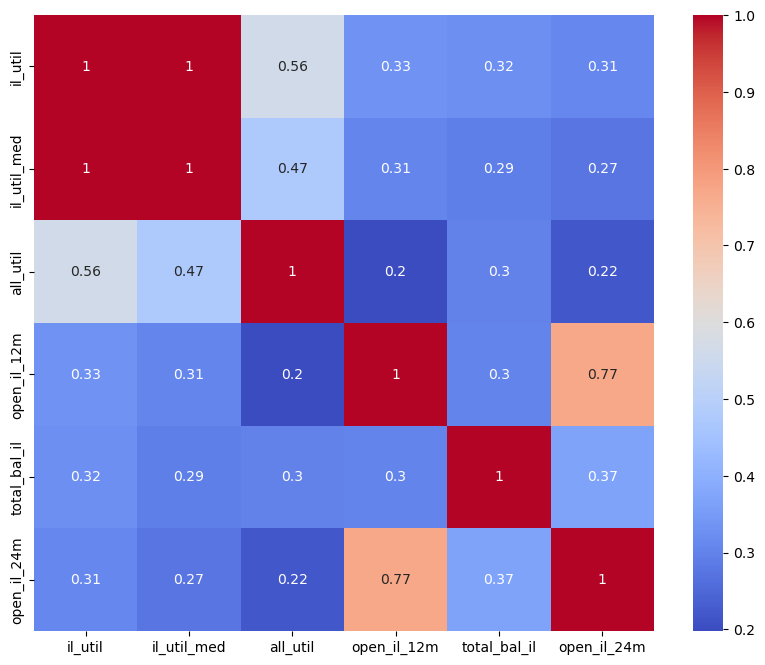

In [72]:
corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_il_util = corr_matrix['il_util'].sort_values(ascending=False).index[0:6]

# Create a subset of the correlation matrix using the columns in highest_corr_to_il_util
corr_subset = corr_matrix.loc[highest_corr_to_il_util, highest_corr_to_il_util]

# Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()


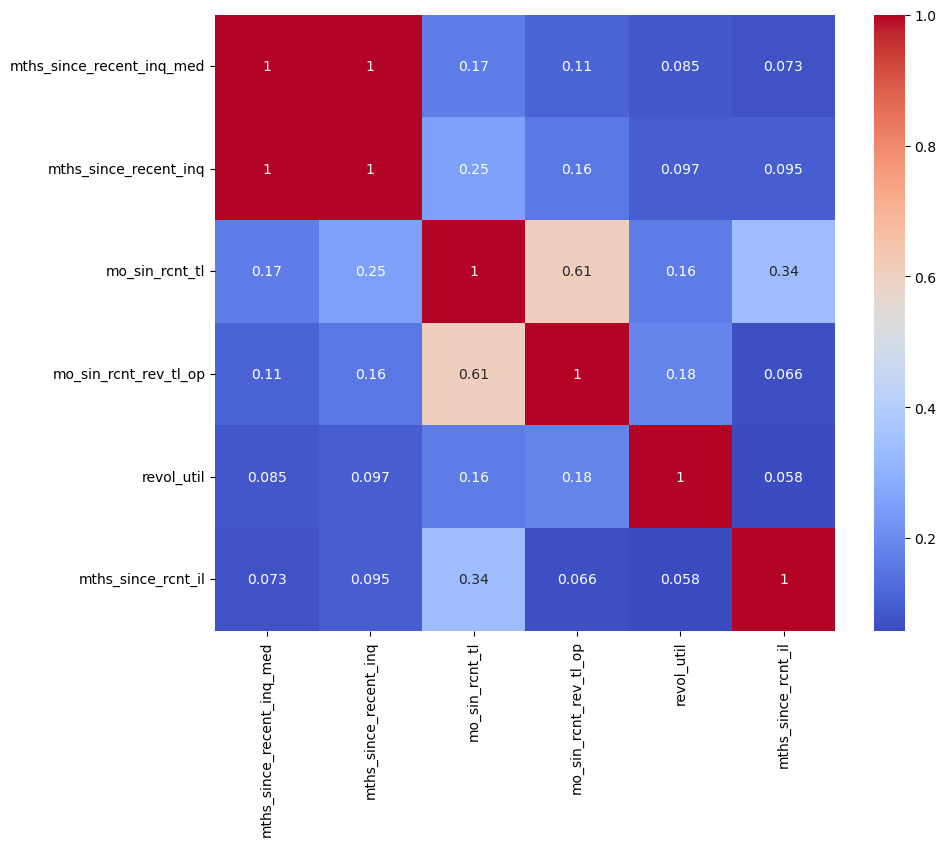

In [73]:
mths_since_recent_inq_features = ['mo_sin_rcnt_tl', 'mo_sin_rcnt_rev_tl_op', 'fico_range_high', 'fico_range_low']

corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_mths_since_recent_inq = corr_matrix['mths_since_recent_inq'].sort_values(ascending=False).index[0:6]

# Create a subset of the correlation matrix using the columns in highest_corr_to_il_util
corr_subset = corr_matrix.loc[highest_corr_to_mths_since_recent_inq, highest_corr_to_mths_since_recent_inq]

# Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()


In [74]:
"""
Impute missing values in the 'il_util' and 'mths_since_recent_inq' columns using linear regression models 
trained on related features. 
"""

# columns to be used as features for imputing il_util
il_util_features = ['all_util', 'open_il_12m', 'total_bal_il', 'open_il_24m', 'open_act_il']

# columns to be used as features for imputing mths_since_recent_inq
mths_since_recent_inq_features = ['mo_sin_rcnt_tl', 'mo_sin_rcnt_rev_tl_op', 'fico_range_high', 'fico_range_low']

# create a new dataframe with only the columns to be used for imputing
il_util_df = data[['il_util'] + il_util_features].dropna()
mths_since_recent_inq_df = data[['mths_since_recent_inq'] + mths_since_recent_inq_features].dropna()

# separate the dependent variable (il_util/mths_since_recent_inq) from the features
il_util_X = il_util_df[il_util_features]
il_util_y = il_util_df['il_util']
mths_since_recent_inq_X = mths_since_recent_inq_df[mths_since_recent_inq_features]
mths_since_recent_inq_y = mths_since_recent_inq_df['mths_since_recent_inq']

# create a linear regression model for each column
il_util_model = LinearRegression().fit(il_util_X, il_util_y)
mths_since_recent_inq_model = LinearRegression().fit(mths_since_recent_inq_X, mths_since_recent_inq_y)

# get indices of rows with missing values for each column
il_util_missing_indices = data[data['il_util'].isna()].index
mths_since_recent_inq_missing_indices = data[data['mths_since_recent_inq'].isna()].index

# predict missing values using the trained models and fill them in the original dataframe
if len(il_util_missing_indices) > 0:
    data.loc[il_util_missing_indices, 'il_util'] = il_util_model.predict(data.loc[il_util_missing_indices, il_util_features])
if len(mths_since_recent_inq_missing_indices) > 0:
    data.loc[mths_since_recent_inq_missing_indices, 'mths_since_recent_inq'] = mths_since_recent_inq_model.predict(data.loc[mths_since_recent_inq_missing_indices, mths_since_recent_inq_features])


In [75]:
data['il_util'] = data['il_util'].astype(int)
data['il_util_med'] = data['il_util_med'].astype(int)
data['mths_since_recent_inq'] = data['mths_since_recent_inq'].astype(int)
data['mths_since_recent_inq_med'] = data['mths_since_recent_inq_med'].astype(int)

**emp_length**

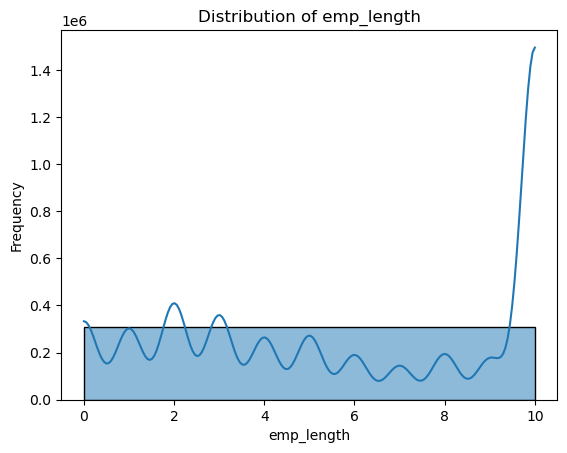

In [76]:
col_withoutnas = data.reset_index()['emp_length']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=1, kde=True)
plt.xlabel('emp_length')
plt.ylabel('Frequency')
plt.title('Distribution of emp_length')
plt.show()

In [77]:
"""
This code block fills in missing values in the 'emp_length' column of a DataFrame by using the mode of 'emp_length'
for unique combinations of 'home_ownership' and 'annual_inc_range'. It performs the following steps:
"""

# Make a copy of the original DataFrame
df_clean = data.copy()

# Create a DataFrame of unique combinations of "home_ownership" and "annual_inc" with NaN values in "emp_length"
result = df_clean[df_clean['emp_length'].isna()][['home_ownership', 'annual_inc']]
result = result.drop_duplicates()

# Bin the annual_inc values into groups
result['annual_inc_range'] = pd.cut(result['annual_inc'], bins=np.arange(0, 1000000, 5000))

# Split the DataFrame into two parts: one with NaN values in "emp_length" and one without
df_with_na = df_clean[df_clean['emp_length'].isna()]
df_without_na = df_clean[df_clean['emp_length'].notna()]

# For each unique combination of "home_ownership" and "annual_inc_range" with NaN values in "emp_length",
# calculate the mode of "emp_length" for the corresponding group, and fill in the NaN values with this mode
for i in result[['home_ownership', 'annual_inc_range']].drop_duplicates().itertuples():
    a = df_without_na[(df_without_na['home_ownership'] == i.home_ownership) & 
                      (pd.cut(df_without_na['annual_inc'], bins=np.arange(0, 1000000, 5000)) == i.annual_inc_range)]
    mode_emp_length = a['emp_length'].mode()
    if len(mode_emp_length) > 0:
        df_with_na.loc[(df_with_na['home_ownership'] == i.home_ownership) & 
                       (pd.cut(df_with_na['annual_inc'], bins=np.arange(0, 1000000, 5000)) == i.annual_inc_range), 
                       'emp_length'] = mode_emp_length[0]

# Concatenate the two parts of the DataFrame back together
data = pd.concat([df_with_na, df_without_na], ignore_index=True)


In [78]:
num_instances_with_na = sum(data['emp_length'].isna())
print("Number of instances with missing emp_length:", num_instances_with_na)
print("Although there are instances with missing emp_length, the number is very low.")
print("These instances have a very low frequency in the annual income feature.")
print("Therefore, we will remove them from the data.")
data = data.dropna(subset=['emp_length'])

Number of instances with missing emp_length: 7
Although there are instances with missing emp_length, the number is very low.
These instances have a very low frequency in the annual income feature.
Therefore, we will remove them from the data.


**mths_since_rcnt_il**
<br>
For the column in question, the mean is larger than the median. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the average to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the median to impute missing values to have a more robust and conservative approach.

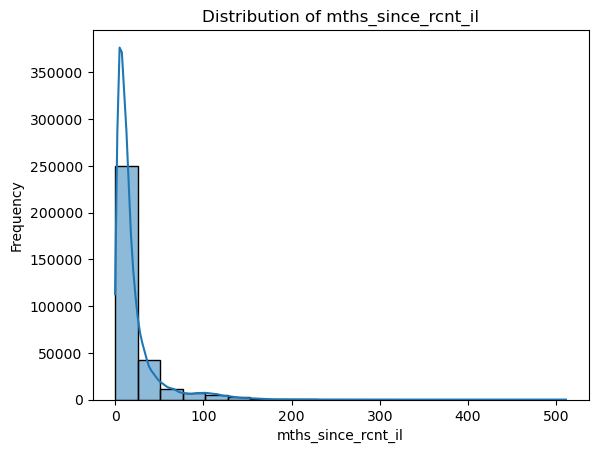

In [79]:
col_withoutnas = data.reset_index()['mths_since_rcnt_il']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('mths_since_rcnt_il')
plt.ylabel('Frequency')
plt.title('Distribution of mths_since_rcnt_il')
plt.show()

In [80]:
mths_since_rcnt_il_med = data["mths_since_rcnt_il"].median()
data["mths_since_rcnt_il_med"]=data["mths_since_rcnt_il"]
data["mths_since_rcnt_il_med"].fillna(mths_since_rcnt_il_med, inplace=True)

mths_since_rcnt_il_mean = data["mths_since_rcnt_il"].median()
data["mths_since_rcnt_il_mean"]=data["mths_since_rcnt_il"]
data["mths_since_rcnt_il_mean"].fillna(mths_since_rcnt_il_mean, inplace=True)

data['mths_since_rcnt_il_mean'] = data['mths_since_rcnt_il_mean'].astype(int)
data['mths_since_rcnt_il_med'] = data['mths_since_rcnt_il_med'].astype(int)
data.drop('mths_since_rcnt_il', axis=1, inplace=True)

**mo_sin_old_il_acct**
<br>
For the column in question, the median is larger than the mean. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the median to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the mean to impute missing values to have a more robust and conservative approach.

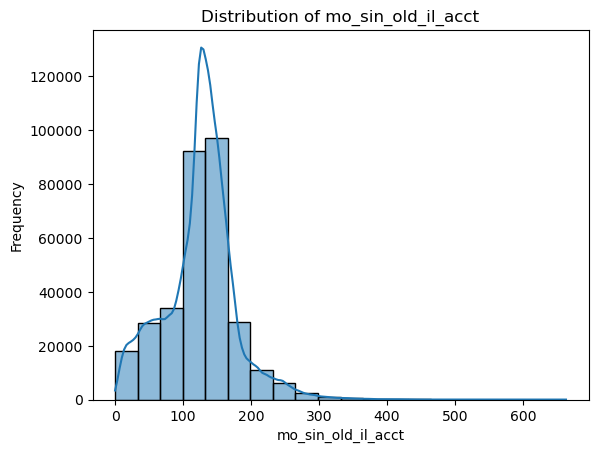

In [81]:
col_withoutnas = data.reset_index()['mo_sin_old_il_acct']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('mo_sin_old_il_acct')

plt.ylabel('Frequency')
plt.title('Distribution of mo_sin_old_il_acct')
plt.show()

In [82]:
mo_sin_old_il_acct_med = data["mo_sin_old_il_acct"].median()
data["mo_sin_old_il_acct_med"]=data["mo_sin_old_il_acct"]
data["mo_sin_old_il_acct_med"].fillna(mo_sin_old_il_acct_med, inplace=True)

mo_sin_old_il_acct_mean = data["mo_sin_old_il_acct"].median()
data["mo_sin_old_il_acct_mean"]=data["mo_sin_old_il_acct"]
data["mo_sin_old_il_acct_mean"].fillna(mo_sin_old_il_acct_mean, inplace=True)

data['mo_sin_old_il_acct_mean'] = data['mo_sin_old_il_acct_mean'].astype(int)
data['mo_sin_old_il_acct_med'] = data['mo_sin_old_il_acct_med'].astype(int)
data.drop('mo_sin_old_il_acct', axis=1, inplace=True)

**bc_util**
<br>
The mean is larger than the median. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the average to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the median to impute missing values to have a more robust and conservative approach.

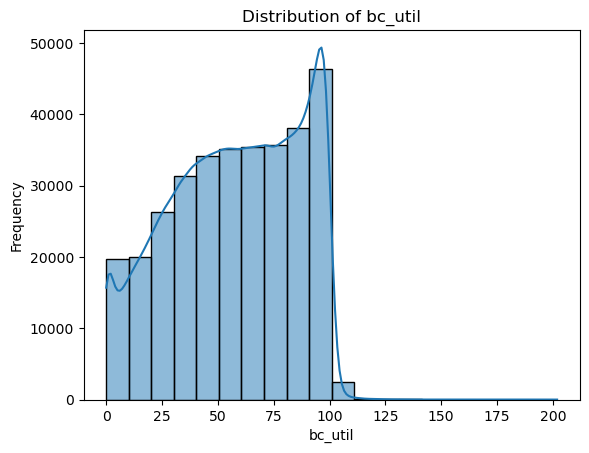

In [83]:
col_withoutnas = data.reset_index()['bc_util']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('bc_util')

plt.ylabel('Frequency')
plt.title('Distribution of bc_util')
plt.show()

In [84]:
bc_util_med = data["bc_util"].median()
data["bc_util_med"]=data["bc_util"]
data["bc_util_med"].fillna(bc_util_med, inplace=True)

bc_util_mean = data["bc_util"].median()
data["bc_util_mean"]=data["bc_util"]
data["bc_util_mean"].fillna(mo_sin_old_il_acct_mean, inplace=True)

data['bc_util_med'] = data['bc_util_med'].astype(int)
data['bc_util_mean'] = data['bc_util_mean'].astype(int)
data.drop('bc_util', axis=1, inplace=True)

**percent_bc_gt_75**
<br>
Because of the unclear distribution, we will complete both by mean and median.

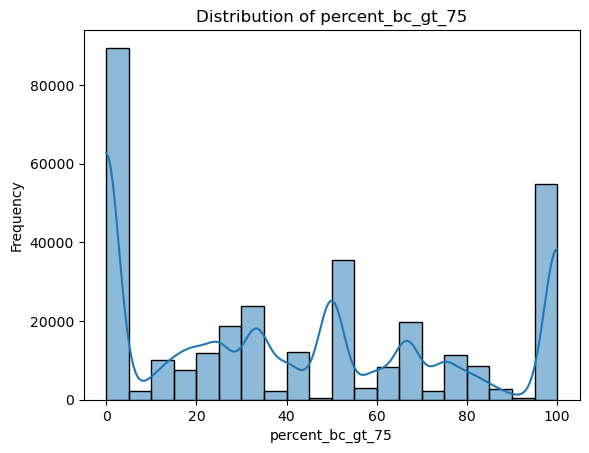

In [85]:
col_withoutnas = data.reset_index()['percent_bc_gt_75']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('percent_bc_gt_75')

plt.ylabel('Frequency')
plt.title('Distribution of percent_bc_gt_75')
plt.show()

In [86]:
percent_bc_gt_75_med = data["percent_bc_gt_75"].median()
data["percent_bc_gt_75_med"]=data["percent_bc_gt_75"]
data["percent_bc_gt_75_med"].fillna(percent_bc_gt_75_med, inplace=True)

percent_bc_gt_75_mean = data["percent_bc_gt_75"].median()
data["percent_bc_gt_75_mean"]=data["percent_bc_gt_75"]
data["percent_bc_gt_75_mean"].fillna(percent_bc_gt_75_mean, inplace=True)

data['percent_bc_gt_75_med'] = data['percent_bc_gt_75_med'].astype(int)
data['percent_bc_gt_75_mean'] = data['percent_bc_gt_75_mean'].astype(int)
data.drop('percent_bc_gt_75', axis=1, inplace=True)

**bc_open_to_buy**
<br>
Because the mean and the median are very far from each other due to many outliers we will use both the mean and the median.

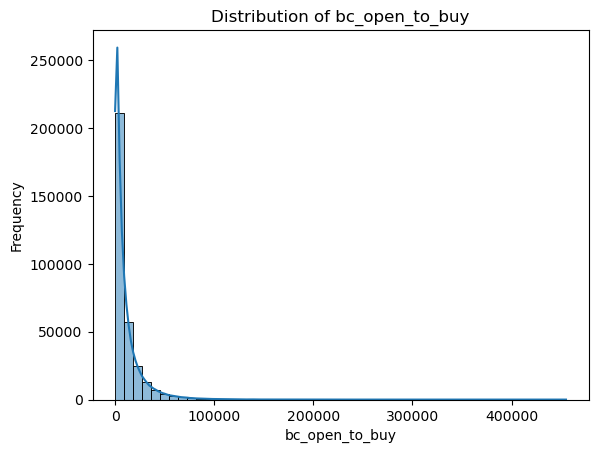

In [87]:
col_withoutnas = data.reset_index()['bc_open_to_buy']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=50, kde=True)
plt.xlabel('bc_open_to_buy')

plt.ylabel('Frequency')
plt.title('Distribution of bc_open_to_buy')
plt.show()

In [88]:
bc_open_to_buy_med = data["bc_open_to_buy"].median()
data["bc_open_to_buy_med"]=data["bc_open_to_buy"]
data["bc_open_to_buy_med"].fillna(bc_open_to_buy_med, inplace=True)

bc_open_to_buy_mean = data["bc_open_to_buy"].median()
data["bc_open_to_buy_mean"]=data["bc_open_to_buy"]
data["bc_open_to_buy_mean"].fillna(bc_open_to_buy_mean, inplace=True)

data['bc_open_to_buy_med'] = data['bc_open_to_buy_med'].astype(int)
data['bc_open_to_buy_mean'] = data['bc_open_to_buy_mean'].astype(int)
data.drop('bc_open_to_buy', axis=1, inplace=True)

**mths_since_recent_bc**
<br>
Because the mean and the median are very far from each other due to many outliers we will use both the mean and the median.

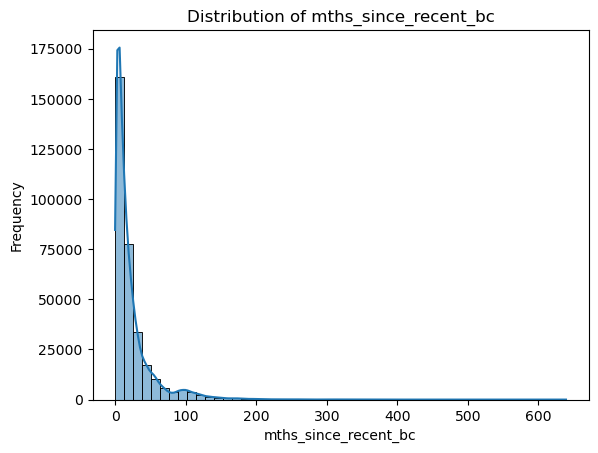

In [89]:
col_withoutnas = data.reset_index()['mths_since_recent_bc']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=50, kde=True)
plt.xlabel('mths_since_recent_bc')

plt.ylabel('Frequency')
plt.title('Distribution of mths_since_recent_bc')
plt.show()

In [90]:
mths_since_recent_bc_med = data["mths_since_recent_bc"].median()
data["mths_since_recent_bc_med"]=data["mths_since_recent_bc"]
data["mths_since_recent_bc_med"].fillna(bc_open_to_buy_med, inplace=True)

mths_since_recent_bc_mean = data["mths_since_recent_bc"].median()
data["mths_since_recent_bc_mean"]=data["mths_since_recent_bc"]
data["mths_since_recent_bc_mean"].fillna(bc_open_to_buy_mean, inplace=True)

data['mths_since_recent_bc_med'] = data['mths_since_recent_bc_med'].astype(int)
data['mths_since_recent_bc_mean'] = data['mths_since_recent_bc_mean'].astype(int)
data.drop('mths_since_recent_bc', axis=1, inplace=True)

### Find low frequency values in each feature

In [91]:
low_freq_threshold = 0.02
low_freq_values = {}

for feature in data.columns:
    if data[feature].dtype == "object":
        counts = data[feature].value_counts(normalize=True)
        low_freq = counts[counts < low_freq_threshold].index.tolist()
        if len(low_freq) > 0:
            low_freq_values[feature] = low_freq
            
for feature, values in low_freq_values.items():
    print(f"Low frequency values in feature '{feature}':")
    print(values)

Low frequency values in feature 'grade':
['G']
Low frequency values in feature 'home_ownership':
['ANY']
Low frequency values in feature 'purpose':
['medical', 'car', 'small_business', 'moving', 'vacation', 'house', 'renewable_energy', 'wedding']
Low frequency values in feature 'addr_state':
['WA', 'MN', 'IN', 'TN', 'MO', 'CT', 'NV', 'WI', 'AL', 'SC', 'LA', 'OR', 'KY', 'OK', 'KS', 'AR', 'UT', 'MS', 'NM', 'NH', 'NE', 'HI', 'RI', 'ME', 'ID', 'DE', 'MT', 'ND', 'DC', 'AK', 'WY', 'VT', 'SD', 'WV']


**home_ownership**

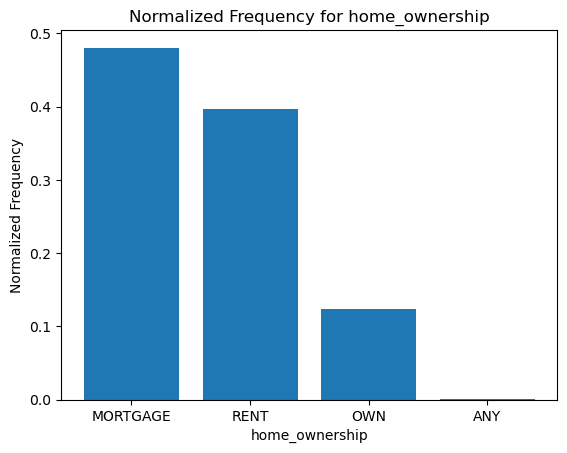

In [92]:
feature_value_counts = data['home_ownership'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('home_ownership')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for home_ownership")
plt.show()

In [93]:
yield_percentages('home_ownership')

,home_ownership,Count,normalize count,yield over percentages,yearly yield mean
0,MORTGAGE,157645,0.480420,0.181357,-0.060603
1,RENT,129996,0.396160,0.248492,-0.128436
2,OWN,40432,0.123216,0.210823,-0.093864
3,ANY,67,0.000204,0.283582,-0.025055


In [94]:
data['home_ownership'] = data['home_ownership'].replace('ANY', 'OTHER')

So that the model does not fall, we will have to leave a category (other) for this column (according to the data dictionary, we will include any as other)

**purpose**

We will define 2 methods for handling this column and examine their level of significance later.

In [95]:
yield_percentages('purpose')

,purpose,Count,normalize count,yield over percentages,yearly yield mean
0,debt_consolidation,187435,0.571204,0.225171,-0.096180
1,credit_card,69049,0.210425,0.185665,-0.064679
2,home_improvement,23635,0.072027,0.180622,-0.083577
3,other,21705,0.066146,0.205483,-0.112179
4,major_purchase,7999,0.024377,0.194399,-0.105527
5,medical,4097,0.012486,0.226507,-0.146216
6,car,3709,0.011303,0.161499,-0.043216
7,small_business,3624,0.011044,0.294426,-0.197588
8,moving,2550,0.007771,0.227843,-0.149935
9,vacation,2523,0.007689,0.201744,-0.083325


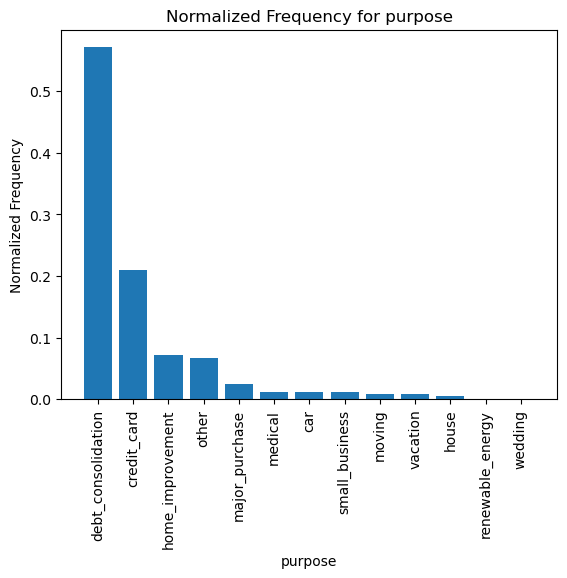

In [96]:
feature_value_counts = data['purpose'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('purpose')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for purpose")

plt.xticks(rotation=90)
plt.show()

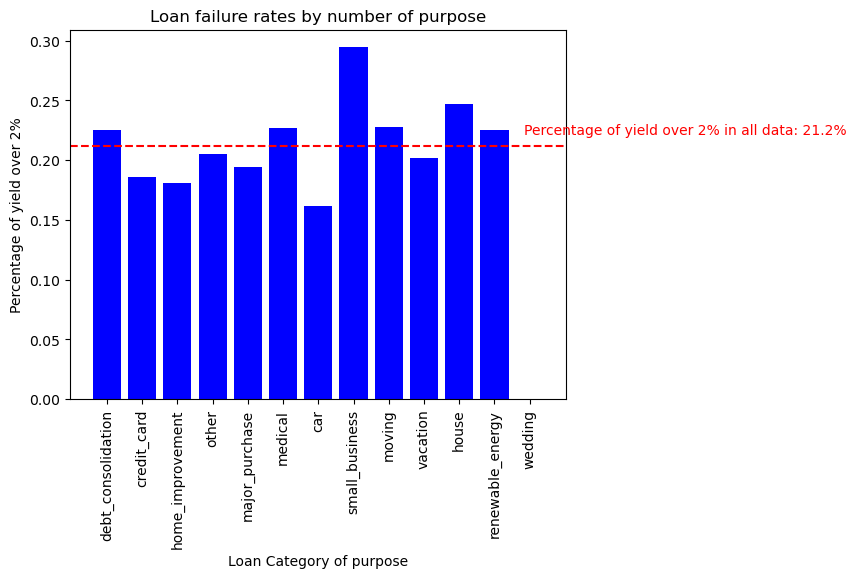

In [97]:
df = yield_percentages('purpose')

fig, ax = plt.subplots()

ax.bar(df['purpose'], df['yield over percentages'], color='blue')

ax.set_xlabel('Loan Category of purpose')
ax.set_ylabel('Percentage of yield over 2%')
ax.set_title('Loan failure rates by number of purpose')
ax.set_xticks(df['purpose'])  # show every other x-axis tick label

pop_mean = 1 - data['yield_over'].mean()
ax.axhline(pop_mean, color='red', linestyle='--')
ax.text(len(df['purpose'])+8, pop_mean+0.01, f'Percentage of yield over 2% in all data: {pop_mean*100:.1f}%', color='red', ha='right')
plt.xticks(rotation=90)

plt.show()

#### method 1

we will calculare the average, the median and the standard deviation.

In [98]:
# Calculate mean, median, and standard deviation of default percentages
mean_dev = np.mean(df['yield over percentages'])
median_dev = np.median(df['yield over percentages'])
std_dev = np.std(df['yield over percentages'])

pop_mean = 1 - data['yield_over'].mean()

print("the mean of population:", pop_mean)
print("the mean is:", mean_dev)
print("the median is:", median_dev)
print("the std is:", std_dev)

the mean of population: 0.21160480282806116
the mean is: 0.198124894936301
the median is: 0.20548260769407967
the std is: 0.06561184801982654


We will classify the level of risk associated with each loan based on the loan purpose- If the default percentage for that purpose is greater than the population mean, the value in purpose_danger will be set to 1, otherwise it will be set to 0. 

In [99]:
purpose_default_percentages = {}
for purpose in df['purpose']:
    purpose_default_percentages[purpose] = df[df['purpose'] == purpose]['yield over percentages'].values[0]

# Create new column in data indicating level of danger based on purpose
data['purpose_danger'] = data['purpose'].apply(lambda x: 1 if purpose_default_percentages[x] > pop_mean else 0)

#### method 2

We will change all the categories whose values are less than 1% of the data to other since it is impossible to rely on the reliability of this data in representing the population that is applying for the same purpose

In [100]:
data['purpose'] = data['purpose'].replace('wedding', 'other')
data['purpose'] = data['purpose'].replace('renewable_energy', 'other')
data['purpose'] = data['purpose'].replace('house', 'other')
data['purpose'] = data['purpose'].replace('vacation', 'other')
data['purpose'] = data['purpose'].replace('moving', 'other')

### addr_state

In [101]:
yield_percentages('addr_state') 

,addr_state,Count,normalize count,yield over percentages,yearly yield mean
0,CA,45287,0.138011,0.215669,-0.102508
1,TX,27842,0.084848,0.215143,-0.090921
2,NY,26576,0.080990,0.228665,-0.103407
3,FL,24304,0.074066,0.224408,-0.112458
4,IL,12812,0.039044,0.199344,-0.083554
5,NJ,11695,0.035640,0.223172,-0.096451
6,OH,11069,0.033733,0.212937,-0.097446
7,GA,10820,0.032974,0.199445,-0.072673
8,PA,10574,0.032224,0.222338,-0.095340
9,NC,9338,0.028457,0.220711,-0.123867


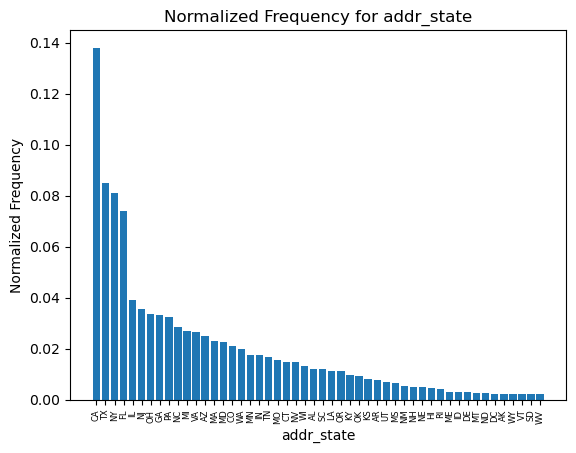

In [102]:
feature_value_counts = data['addr_state'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('addr_state')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for addr_state")

plt.xticks(rotation=90, fontsize=6)
plt.show()


In [103]:
# Calculate mean, median, and standard deviation of default percentages
mean_dev = np.mean(df['yield over percentages'])
median_dev = np.median(df['yield over percentages'])
std_dev = np.std(df['yield over percentages'])

pop_mean = 1 - data['yield_over'].mean()

print("the mean of population:", pop_mean)
print("the mean is:", mean_dev)
print("the median is:", median_dev)
print("the std is:", std_dev)

the mean of population: 0.21160480282806116
the mean is: 0.198124894936301
the median is: 0.20548260769407967
the std is: 0.06561184801982654


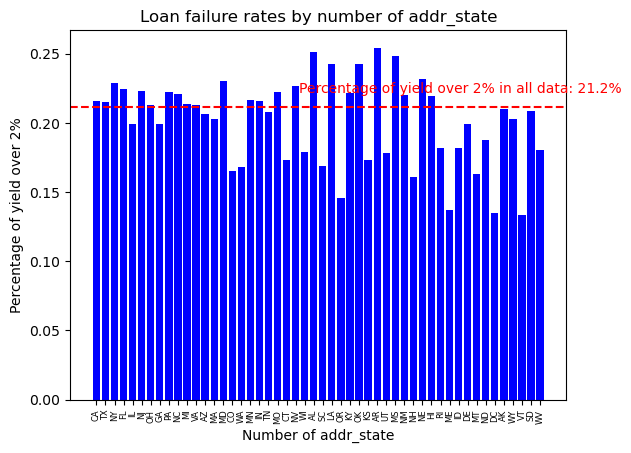

In [104]:
df = yield_percentages('addr_state')

fig, ax = plt.subplots()

ax.bar(df['addr_state'], df['yield over percentages'], color='blue')

ax.set_xlabel('Number of addr_state')
ax.set_ylabel('Percentage of yield over 2%')
ax.set_title('Loan failure rates by number of addr_state')
ax.set_xticks(df['addr_state'])  # show every other x-axis tick label

pop_mean = 1 - data['yield_over'].mean()
ax.axhline(pop_mean, color='red', linestyle='--')
ax.text(len(df['addr_state'])+8, pop_mean+0.01, f'Percentage of yield over 2% in all data: {pop_mean*100:.1f}%', color='red', ha='right')
plt.xticks(rotation=90, fontsize=6)

plt.show()

We will classify the level of risk associated with each loan based on the borrower's address state- If the yield over percentages for that address state is greater than the population mean, the value in addr_state_danger will be set to 1, otherwise it will be set to 0. 

In [105]:
addr_state_default_percentages = {}
for addr_state in df['addr_state']:
    addr_state_default_percentages[addr_state] = df[df['addr_state'] == addr_state]['yield over percentages'].values[0]

# Create new column in data indicating level of danger based on purpose
data['addr_state_danger'] = data['addr_state'].apply(lambda x: 1 if addr_state_default_percentages[x] > pop_mean else 0)

In [106]:
data.drop('addr_state', axis=1, inplace=True)

**earliest_cr_line**
<br>
Age of credit history: The age of the borrower's credit history, which is the difference between the earliest credit line and the date the loan was issued, may be an indicator of the borrower's creditworthiness. Borrowers with longer credit histories may be seen as less risky than those with shorter credit histories, assuming they have a good credit record during that time.

In [107]:
data['Age_of_credit_history']=(data['issue_d'] - data["earliest_cr_line"]).apply(lambda x: x.days/365.25)

In [108]:
data.drop('earliest_cr_line', axis=1, inplace=True)

In [109]:
pd.set_option("display.max_rows", None)
print(data.dtypes)
pd.reset_option("display.max_rows")

id                                        int64
loan_amnt                               float64
term                                      int64
int_rate                                float64
installment                             float64
grade                                    object
emp_length                              float64
home_ownership                           object
annual_inc                              float64
issue_d                          datetime64[ns]
purpose                                  object
dti                                     float64
delinq_2yrs                               int64
fico_range_low                          float64
fico_range_high                         float64
inq_last_6mths                          float64
open_acc                                  int64
pub_rec                                   int64
revol_bal                               float64
revol_util                              float64
total_acc                               

### Handling categorical variables

**home_ownership**
<br>
We will one-hot encode the categories RENT and MORTGAGE since they have a loan percentage above 2% and the average yield is above/below the mean in the data.

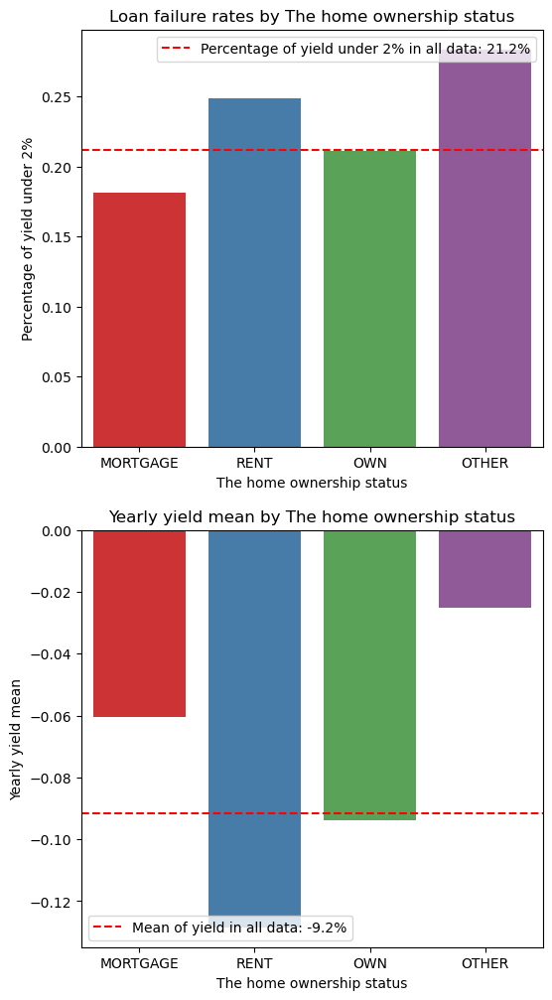

,home_ownership,Count,normalize count,yield over percentages,yearly yield mean
0,MORTGAGE,157645,0.480420,0.181357,-0.060603
1,RENT,129996,0.396160,0.248492,-0.128436
2,OWN,40432,0.123216,0.210823,-0.093864
3,OTHER,67,0.000204,0.283582,-0.025055


In [110]:
plot_yield_graphs('home_ownership','The home ownership status')
yield_percentages('home_ownership')

In [111]:
data['Is_MORTGAGE'] = np.where(data['home_ownership']=='MORTGAGE', 1 , 0)
data['Is_RENT'] = np.where(data['home_ownership']=='RENT', 1 , 0)
data.drop('home_ownership', axis=1, inplace=True)

**purpose**
<br>

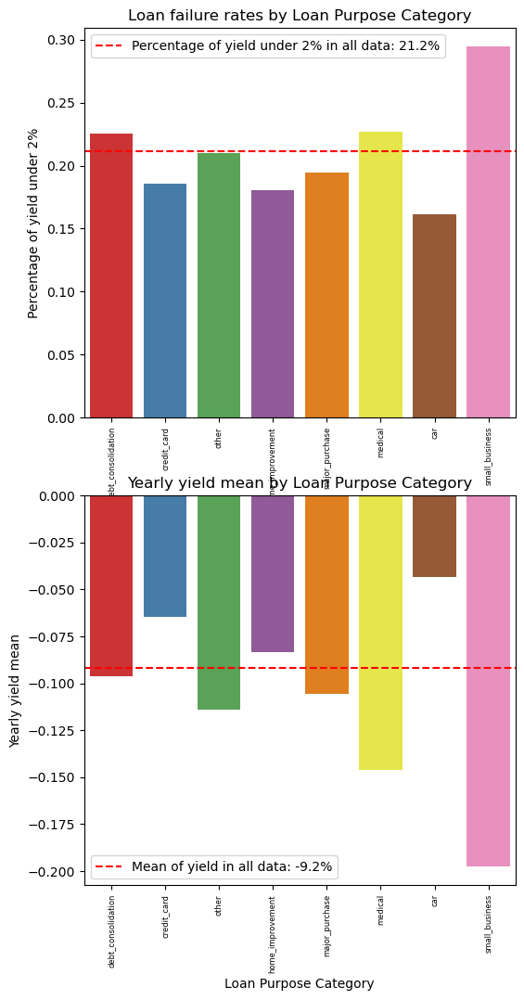

In [112]:
col='purpose'
title="Loan Purpose Category"

df = yield_percentages(col)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])

axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
axes[0].tick_params(axis='x', labelrotation=90, labelsize=6)

sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
axes[1].tick_params(axis='x', labelrotation=90, labelsize=6)

axes[0].legend()
axes[1].legend()

plt.show()


In [113]:
loo = ce.LeaveOneOutEncoder(cols=['purpose'])
data['purpose_yield_over_encoded'] = loo.fit_transform(data['purpose'], data['yield_over'])

data['purpose_yield_yearly_encoded'] = loo.fit_transform(data['purpose'], data['yield_yearly_1'])


data.drop('purpose', axis=1, inplace=True)

**inq_last_6mths**
<br>
"inq_last_6mths" represents the number of inquiries made on a borrower's credit report in the past 6 months, excluding inquiries related to auto and mortgage loans. This variable is relevant for predicting loan defaults because a high number of inquiries may indicate that the borrower has recently applied for multiple loans, which could be a sign of financial distress or over-extension. While a high number of inquiries generally lead to higher default rates, for certain cases with high inquiries, they do not represent a large percentage of the data. Therefore, Since 0 has a relatively low failure rate, 1 percent has an average failure rate and >1 percent has a relatively high failure rate we convert this to categorical variable - 0,1,>1.

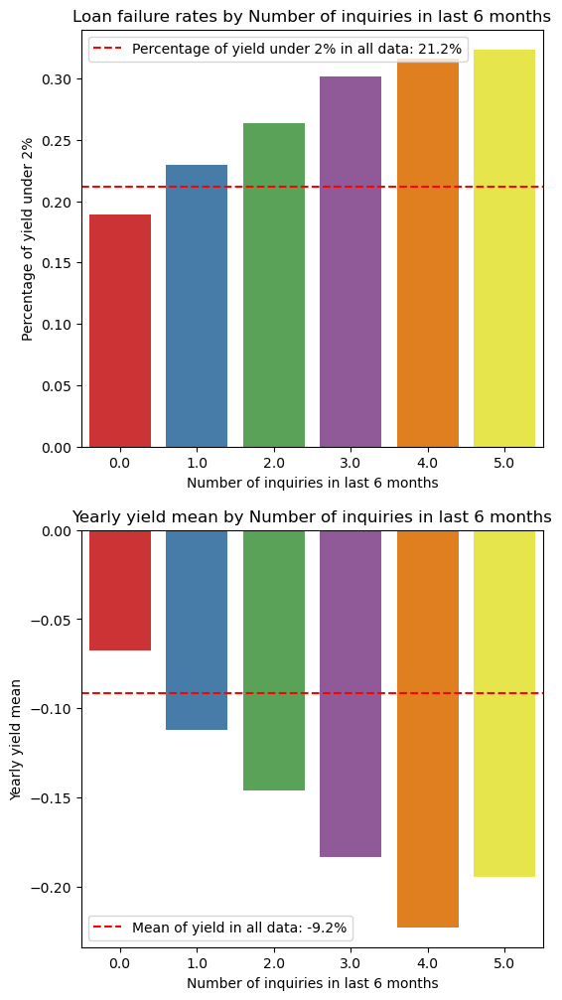

,inq_last_6mths,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,198312,0.604352,0.189489,-0.067544
1,1.0,87242,0.265868,0.229717,-0.112101
2,2.0,28679,0.087399,0.263398,-0.146014
3,3.0,9778,0.029798,0.301698,-0.183453
4,4.0,3091,0.009420,0.316079,-0.222846
5,5.0,1038,0.003163,0.323699,-0.194509


In [114]:
plot_yield_graphs('inq_last_6mths','Number of inquiries in last 6 months')
yield_percentages('inq_last_6mths')

In [115]:
data['inq_last_6mths_cat'] = pd.cut(data['inq_last_6mths'], bins=[-1, 0, 1, np.inf], labels=['No recent inquiries', 'Low recent inquiries', 'High recent inquiries'])
data['inq_last_6mths_cat'] = data['inq_last_6mths_cat'].replace({'No recent inquiries': 1, 'Low recent inquiries': 2, 'High recent inquiries': 3})
data['inq_last_6mths_cat'] = data['inq_last_6mths_cat'].astype('int64')

**initial_list_status**
<br>

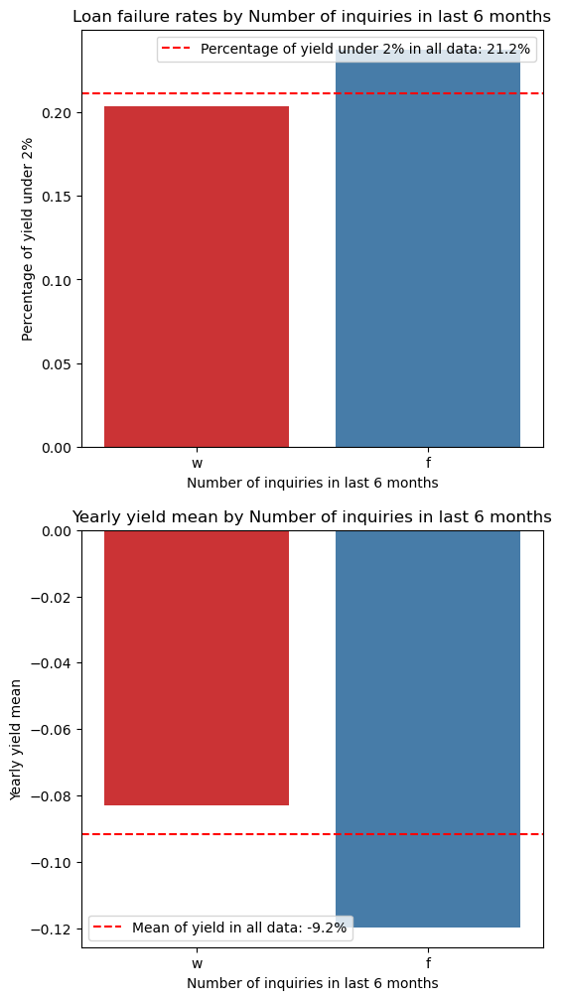

,initial_list_status,Count,normalize count,yield over percentages,yearly yield mean
0,w,251510,0.766472,0.203634,-0.082978
1,f,76630,0.233528,0.237766,-0.119757


In [116]:
plot_yield_graphs('initial_list_status','Number of inquiries in last 6 months')
yield_percentages('initial_list_status')

In [117]:
dummies = pd.get_dummies(data['initial_list_status'])
data = pd.concat([data, dummies], axis=1)
data = data.drop(['initial_list_status'], axis=1)

**inq_last_12m**
<br>
We want to capture the change in credit-seeking behavior of the borrower. If the difference is positive, it suggests an increase in credit-seeking behavior, which may be indicative of financial instability. Conversely, a negative difference could suggest a decrease in credit-seeking behavior, which may be indicative of greater financial stability. This new feature could potentially improve the model's ability to predict loan default risk.

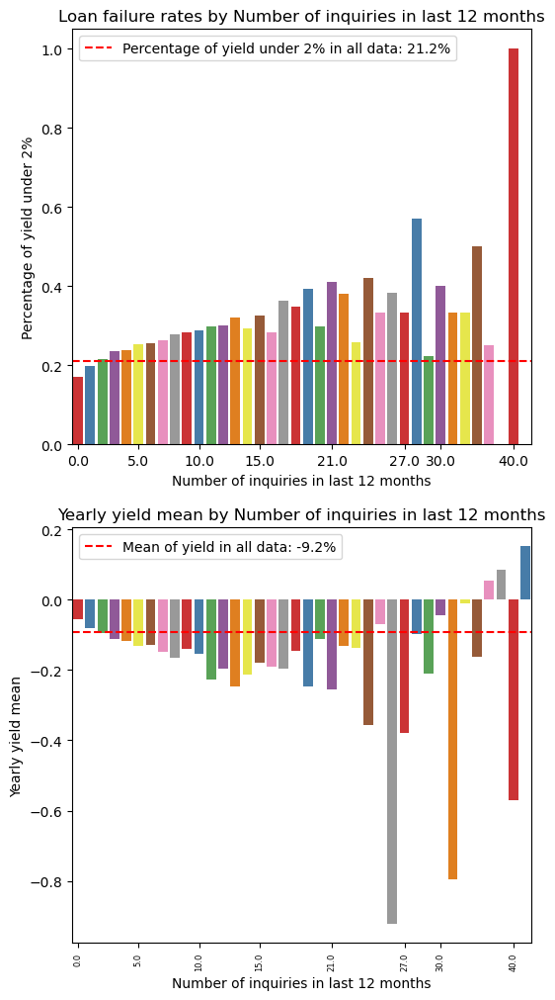

In [118]:
col='inq_last_12m'
title="Number of inquiries in last 12 months"

df = yield_percentages(col)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])

axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
axes[0].set_xticks(df['inq_last_12m'][::5])


sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
axes[1].tick_params(axis='x', labelrotation=90, labelsize=6)
axes[1].set_xticks(df['inq_last_12m'][::5])

axes[0].legend()
axes[1].legend()

plt.show()


In [119]:
yield_percentages('inq_last_12m')

,inq_last_12m,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,83033,0.253041,0.171233,-0.054355
1,1.0,77442,0.236003,0.198820,-0.079786
2,2.0,57152,0.174170,0.214901,-0.093127
3,3.0,38878,0.118480,0.234811,-0.111966
4,4.0,25240,0.076918,0.239422,-0.116049
5,5.0,16006,0.048778,0.252905,-0.131306
6,6.0,10265,0.031282,0.256308,-0.128636
7,7.0,6588,0.020077,0.264117,-0.148348
8,8.0,4356,0.013275,0.277319,-0.164911
9,9.0,2867,0.008737,0.284269,-0.138592


In [120]:
data['recent_inquiry_difference']=data['inq_last_12m']-data['inq_last_6mths']

In [121]:
data.drop('inq_last_6mths', axis=1, inplace=True)
data.drop('inq_last_12m', axis=1, inplace=True)

**mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl**
<br>
We discovered that the correlation between the columns "mo_sin_rcnt_rev_tl_op" and "mo_sin_rcnt_tl"  is 0.61- Thus, we created a new feature called "revolving_account_opened_ratio" by dividing "mo_sin_rcnt_rev_tl_op" by "mo_sin_rcnt_tl", aiming to capture the ratio of months since the most recent revolving account opened to months since the most recent account opened. The resulting feature may provide additional information about a borrower's credit behavior, which can be useful in predicting their ability to repay a loan.

In [122]:
print("The corration between mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl is:", data[['mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl']].corr()['mo_sin_rcnt_rev_tl_op'][1]
     )
       

The corration between mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl is: 0.6089527079343466


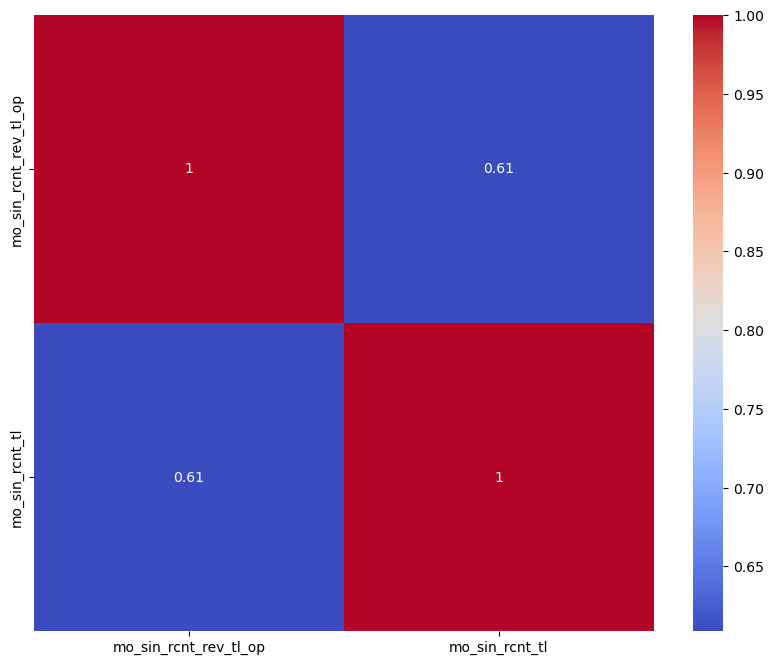

In [123]:
corr_subset=data[['mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl']].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()

In [124]:
yield_percentages('mo_sin_rcnt_rev_tl_op')

,mo_sin_rcnt_rev_tl_op,Count,normalize count,yield over percentages,yearly yield mean
0,2,27568,0.084013,0.240932,-0.110268
1,3,27214,0.082934,0.230286,-0.107532
2,4,24021,0.073204,0.224345,-0.100201
3,1,21732,0.066228,0.255016,-0.135660
4,5,21287,0.064872,0.220228,-0.087035
...,...,...,...,...,...
231,185,1,0.000003,0.000000,0.039058
232,219,1,0.000003,1.000000,-5.235301
233,438,1,0.000003,0.000000,0.064591
234,207,1,0.000003,0.000000,0.044740


In [125]:
yield_percentages('mo_sin_rcnt_tl')

,mo_sin_rcnt_tl,Count,normalize count,yield over percentages,yearly yield mean
0,2,38040,0.115926,0.242692,-0.118892
1,3,37855,0.115362,0.232994,-0.116181
2,4,32813,0.099997,0.220583,-0.097406
3,1,28206,0.085957,0.254166,-0.138377
4,5,27954,0.085189,0.215032,-0.088527
...,...,...,...,...,...
159,151,1,0.000003,1.000000,-0.284050
160,233,1,0.000003,1.000000,-0.927953
161,283,1,0.000003,0.000000,0.074422
162,174,1,0.000003,0.000000,0.048019


In [126]:
data['mo_sin_rcnt_tl']

0          3
1          6
2          0
3         12
4          2
          ..
328142     4
328143     4
328144     3
328145    15
328146     9
Name: mo_sin_rcnt_tl, Length: 328140, dtype: int64

In [127]:
data['revolving_account_opened_ratio']=(data['mo_sin_rcnt_rev_tl_op']/data['mo_sin_rcnt_tl']).fillna(0)
data['revolving_account_opened_ratio'] = data['revolving_account_opened_ratio'].replace(np.inf, 0)
data.drop('mo_sin_rcnt_rev_tl_op', axis=1, inplace=True)
data.drop('mo_sin_rcnt_tl', axis=1, inplace=True)

In [128]:
print(data.columns)

Index(['id', 'loan_amnt', 'term', 'int_rate', 'installment', 'grade',
       'emp_length', 'annual_inc', 'issue_d', 'dti', 'delinq_2yrs',
       'fico_range_low', 'fico_range_high', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m',
       'open_act_il', 'open_il_12m', 'open_il_24m', 'total_bal_il', 'il_util',
       'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util',
       'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'acc_open_past_24mths',
       'avg_cur_bal', 'mo_sin_old_rev_tl_op', 'mort_acc',
       'mths_since_recent_inq', 'num_accts_ever_120_pd', 'num_actv_bc_tl',
       'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl',
       'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats',
       'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'tot_hi_cred_lim',
       'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit',
       'yield_2', 'yield_yearly_1', 'is_default?', 'yield_over',
 

### More Graphs

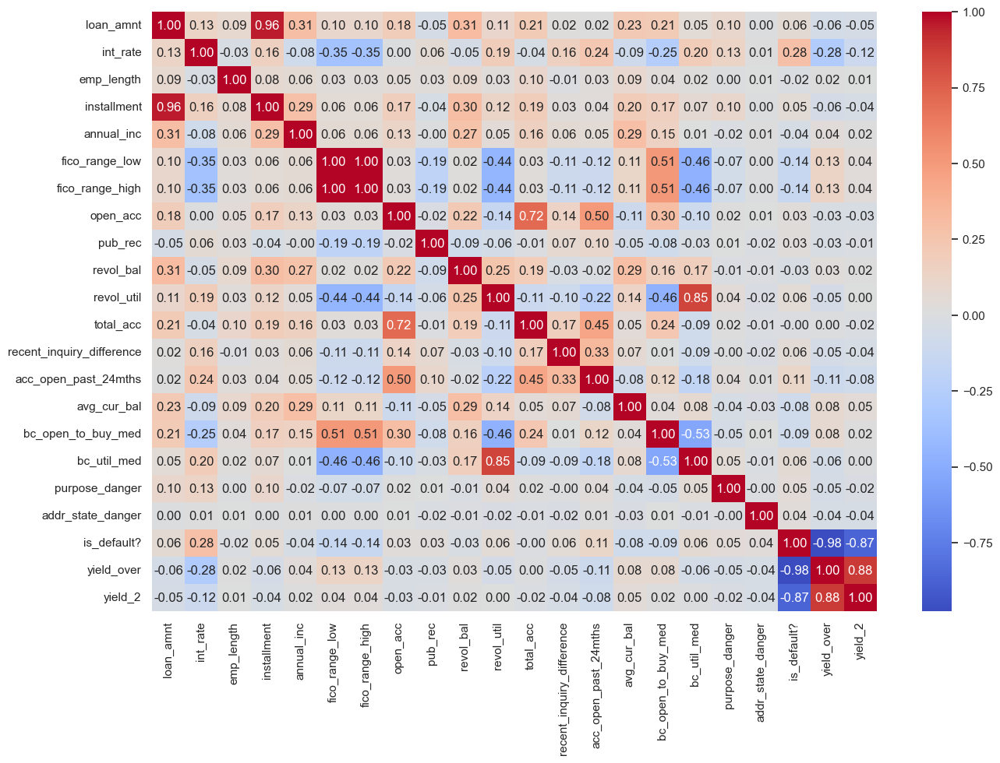

In [129]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

new_cols = ['loan_amnt','int_rate','emp_length','installment','annual_inc',
            'fico_range_low', 'fico_range_high','open_acc', 'pub_rec','revol_bal', 'revol_util', 'total_acc',
            'recent_inquiry_difference', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy_med', 'bc_util_med',
            'purpose_danger', 'addr_state_danger','is_default?','yield_over','yield_2']

merged_df = data[new_cols]


corr_matrix = merged_df.corr()
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.show()

# Correlation between continuous features

### Finding continuous features

In [130]:
unique_counts = data.nunique().sort_values(ascending=False)

print("Column Name\tUnique Values")
for column, count in unique_counts.iteritems():
    print(f"{column}\t\t{count}")


Column Name	Unique Values
id		328140
purpose_yield_yearly_encoded		317462
yield_yearly_1		315215
yield_2		312955
tot_hi_cred_lim		201345
tot_cur_bal		197853
total_bal_ex_mort		118108
total_il_high_credit_limit		106621
total_bal_il		97850
revol_bal		55581
avg_cur_bal		52915
bc_open_to_buy_med		48955
bc_open_to_buy_mean		48955
installment		37500
max_bal_bc		24961
annual_inc		22136
total_rev_hi_lim		9706
tot_coll_amt		7596
total_bc_limit		4927
dti		4854
revolving_account_opened_ratio		2885
Age_of_credit_history		2038
loan_amnt		1503
revol_util		1163
mo_sin_old_rev_tl_op		694
pct_tl_nvr_dlq		556
mo_sin_old_il_acct_med		470
mo_sin_old_il_acct_mean		470
mths_since_recent_bc_mean		415
mths_since_recent_bc_med		415
mths_since_rcnt_il_mean		323
mths_since_rcnt_il_med		323
il_util_med		222
il_util		212
all_util		165
bc_util_mean		163
bc_util_med		163
int_rate		141
total_acc		123
num_il_tl		98
num_rev_accts		93
percent_bc_gt_75_med		87
percent_bc_gt_75_mean		87
open_acc		70
num_sats		69
num_op_re

### making a list of continues features

In [131]:
'''
making a list of continues features to test with Spearman correlation.
'''

corr_df = data[['yield_yearly_1', 'yield_2', 'tot_hi_cred_lim', 'tot_cur_bal', 'total_bal_ex_mort',
    'total_il_high_credit_limit', 'total_bal_il', 'revol_bal', 'avg_cur_bal', 'bc_open_to_buy_med',
    'bc_open_to_buy_mean', 'installment', 'max_bal_bc', 'annual_inc', 'total_rev_hi_lim',
    'tot_coll_amt', 'total_bc_limit', 'dti', 'revolving_account_opened_ratio', 'Age_of_credit_history',
    'loan_amnt', 'revol_util', 'mo_sin_old_rev_tl_op', 'pct_tl_nvr_dlq', 'mo_sin_old_il_acct_mean',
    'mo_sin_old_il_acct_med', 'mths_since_recent_bc_mean', 'mths_since_recent_bc_med',
    'mths_since_rcnt_il_med', 'mths_since_rcnt_il_mean', 'il_util_med', 'il_util', 'all_util',
    'bc_util_mean', 'bc_util_med', 'int_rate']]

### Spearman correlation Heatmap

<AxesSubplot:>

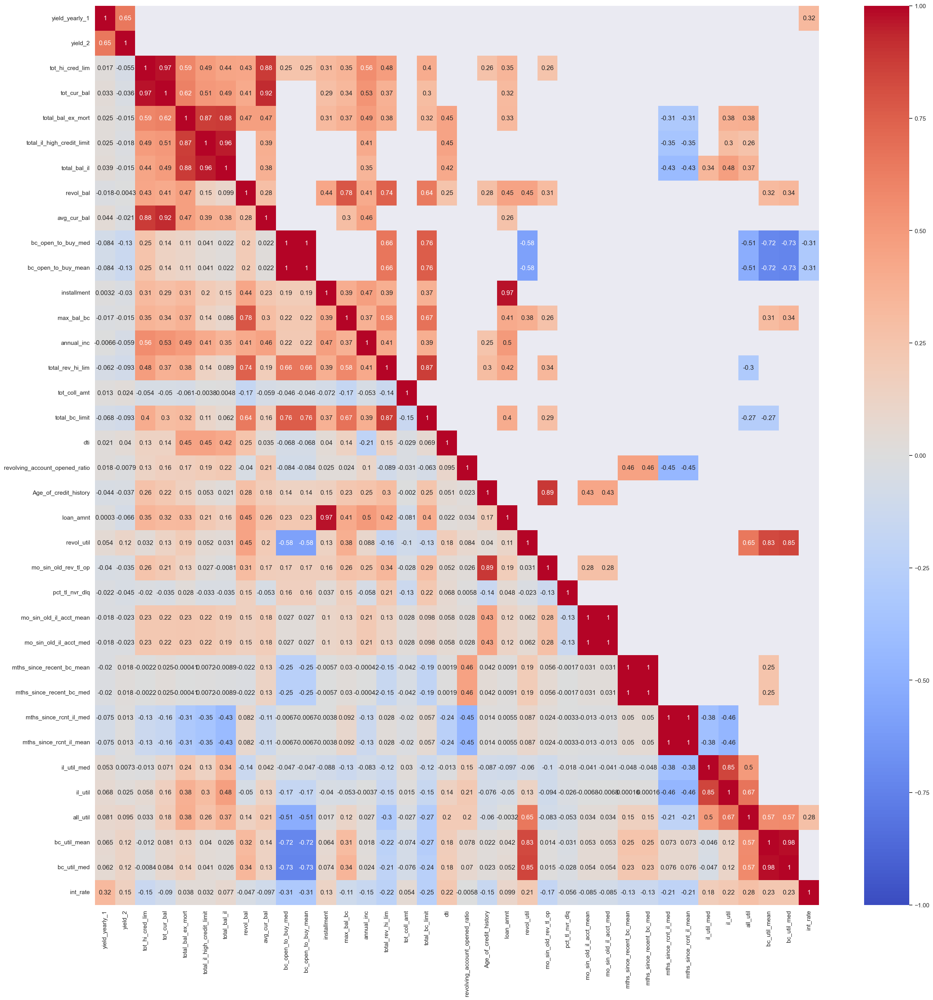

In [132]:
'''
This code calculates the correlation matrix using the Spearman correlation method and visualizes it as a heatmap.
The threshold is set to 0.25, and only correlations below the threshold are shown in the heatmap.
'''

# Calculate correlation matrix
corr_matrix = corr_df.corr(method='spearman')

# Set threshold
threshold = 0.25
plt.figure(figsize=(30, 30))
# Generate mask to only show values below the threshold
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
mask[np.abs(corr_matrix) >= threshold] = False

# Plot correlation matrix
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

### Relationship between installment and loan_amnt

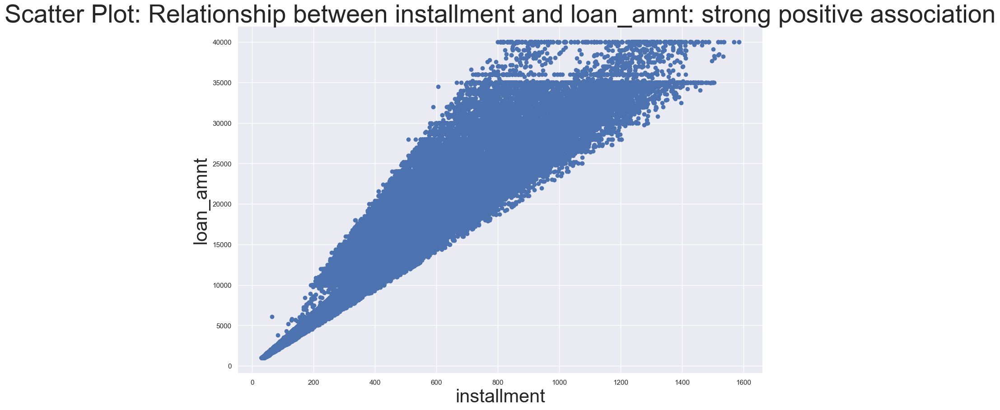

In [133]:
# Scatter plot
plt.scatter(data['installment'], data['loan_amnt'])

plt.xlabel('installment', fontsize=30)
plt.ylabel('loan_amnt', fontsize=30)
plt.title('Scatter Plot: Relationship between installment and loan_amnt: strong positive association', fontsize=40)
plt.show()


In [134]:
data.drop('installment', axis=1, inplace=True)

### Relationship between "tot_hi_cred_lim" and "tot_cur_bal"

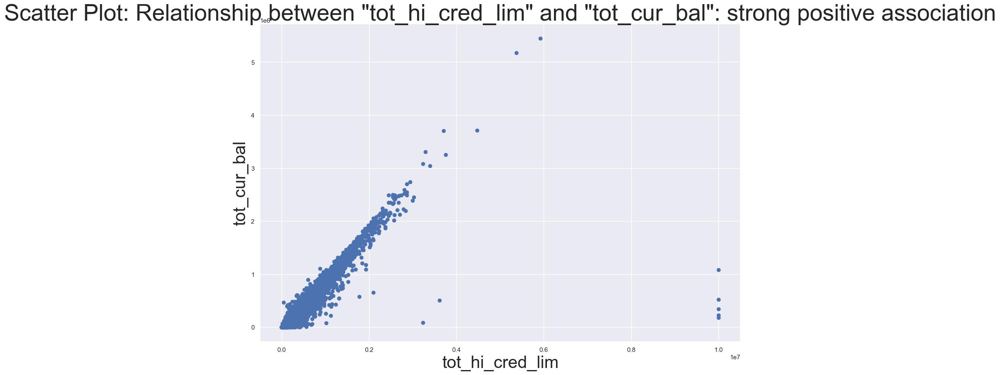

In [135]:
# Scatter plot
plt.scatter(data['tot_hi_cred_lim'], data['tot_cur_bal'])

plt.xlabel('tot_hi_cred_lim', fontsize=30)
plt.ylabel('tot_cur_bal', fontsize=30)
plt.title('Scatter Plot: Relationship between "tot_hi_cred_lim" and "tot_cur_bal": strong positive association', fontsize=40)

plt.show()

In [136]:
data.drop('tot_hi_cred_lim', axis=1, inplace=True)

### Relationship between "bc_util_med" and "revol_util"

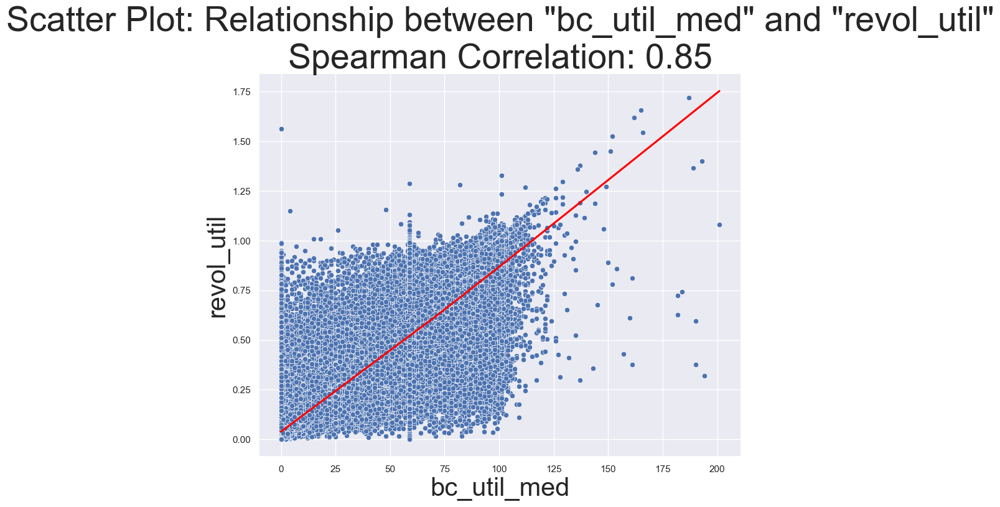

In [137]:

# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['bc_util_med'], data['revol_util'])

# Create scatter plot with loess line
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='bc_util_med', y='revol_util')
sns.regplot(data=data, x='bc_util_med', y='revol_util', lowess=True, scatter=False, color='red')

# Set labels and title
plt.xlabel('bc_util_med', fontsize=30)
plt.ylabel('revol_util', fontsize=30)
plt.title(f'Scatter Plot: Relationship between "bc_util_med" and "revol_util"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=40)

plt.show()

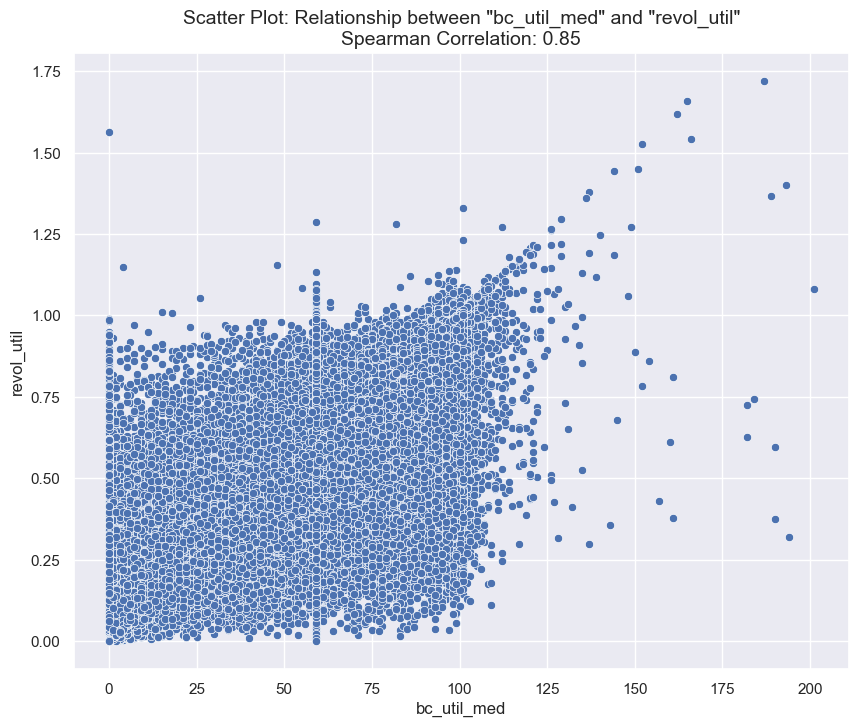

In [138]:

# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['bc_util_med'], data['revol_util'])

# Create scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='bc_util_med', y='revol_util')

# Set labels and title
plt.xlabel('bc_util_med', fontsize=12)
plt.ylabel('revol_util', fontsize=12)
plt.title(f'Scatter Plot: Relationship between "bc_util_med" and "revol_util"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=14)

plt.show()

In [139]:
#Create a Credit_Utilization_Score feature that represents the combined credit utilization across bankcard accounts.
    
# Calculate the ratio of total current balance to high credit/credit limit for all bankcard accounts
bankcard_ratio = data['bc_util_med']
    
# Calculate the revolving line utilization rate
revolving_utilization = data['revol_util']
    
# Add the Credit_Utilization_Score feature to the DataFrame
data['credit_Utilization_Score'] = (bankcard_ratio + revolving_utilization) / 2
data.drop('bc_util_med', axis=1, inplace=True)
data.drop('bc_util_mean', axis=1, inplace=True)
data.drop('revol_util', axis=1, inplace=True)

### Relationship between "tot_cur_bal" and "avg_cur_bal"

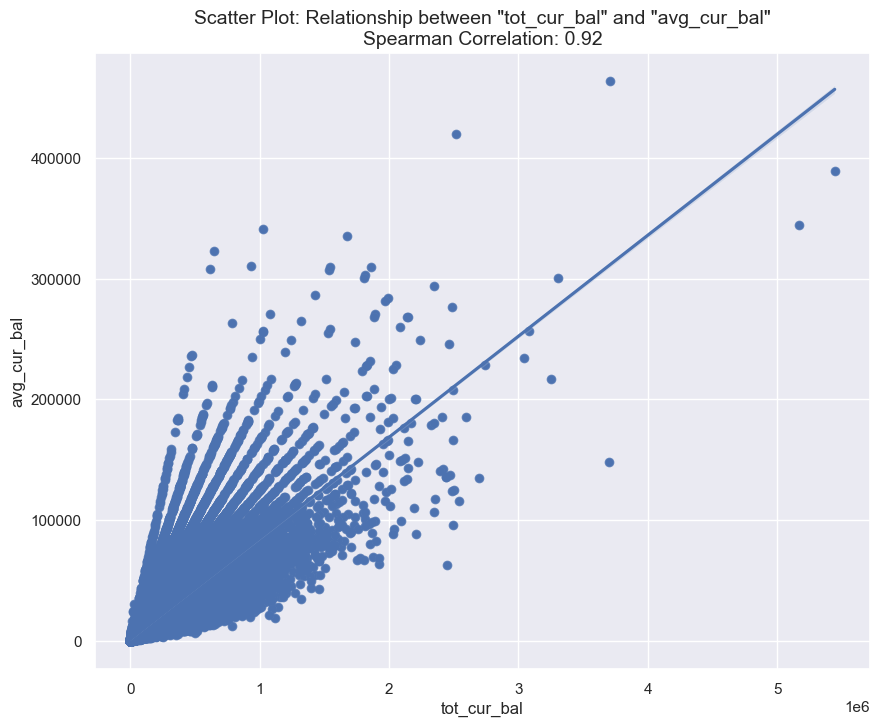

In [140]:
# Assuming you already have the 'data' DataFrame

# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['tot_cur_bal'], data['avg_cur_bal'])

# Create scatter plot with linear regression line
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='tot_cur_bal', y='avg_cur_bal')
sns.regplot(data=data, x='tot_cur_bal', y='avg_cur_bal')

# Set labels and title
plt.xlabel('tot_cur_bal', fontsize=12)
plt.ylabel('avg_cur_bal', fontsize=12)
plt.title(f'Scatter Plot: Relationship between "tot_cur_bal" and "avg_cur_bal"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=14)

plt.show()

In [141]:
information_gains = calculate_information_gain(data, 'yield_over', 'tot_cur_bal', 'avg_cur_bal')
print("Information Gains:")
print(information_gains)

Information Gains:
{'tot_cur_bal': 0.003364164908931988, 'avg_cur_bal': 0.004317503045312421}


In [142]:
data.drop('tot_cur_bal', axis=1, inplace=True)

### Relationship between "mo_sin_old_rev_tl_op" and "Age_of_credit_history"

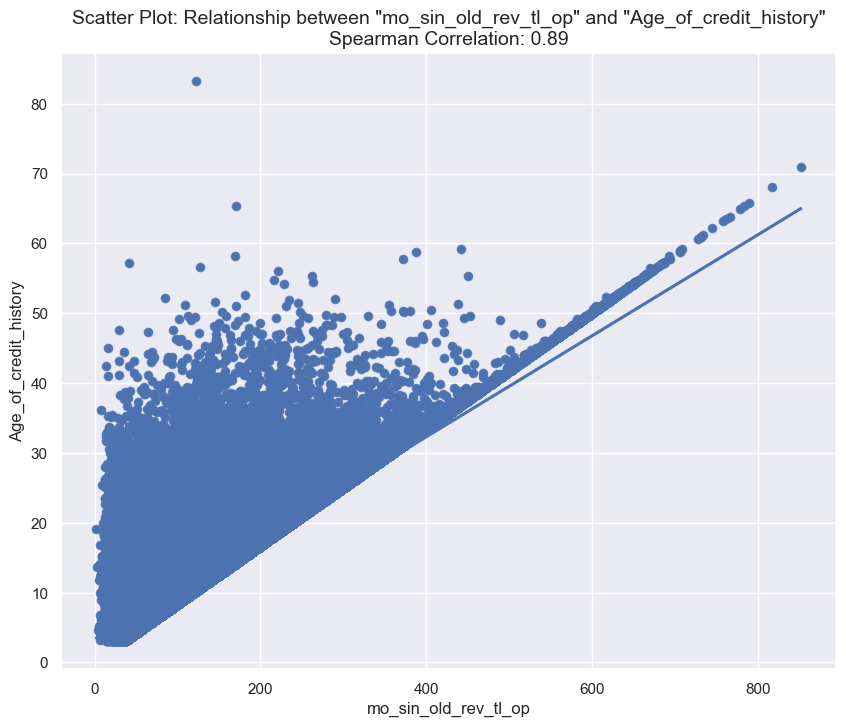

In [143]:
# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['mo_sin_old_rev_tl_op'], data['Age_of_credit_history'])

# Create scatter plot with linear regression line
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='mo_sin_old_rev_tl_op', y='Age_of_credit_history')
sns.regplot(data=data, x='mo_sin_old_rev_tl_op', y='Age_of_credit_history')

# Set labels and title
plt.xlabel('mo_sin_old_rev_tl_op', fontsize=12)
plt.ylabel('Age_of_credit_history', fontsize=12)
plt.title(f'Scatter Plot: Relationship between "mo_sin_old_rev_tl_op" and "Age_of_credit_history"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=14)

plt.show()


In [144]:
information_gains = calculate_information_gain(data, 'yield_over', 'Age_of_credit_history', 'mo_sin_old_rev_tl_op')
print("Information Gains:")
print(information_gains)

Information Gains:
{'Age_of_credit_history': 0.0010203438423430633, 'mo_sin_old_rev_tl_op': 0.002414268709870049}


In [145]:
#Remove column with least information gain
data.drop('mo_sin_old_rev_tl_op', axis=1, inplace=True)

In [146]:
# Assuming you have a DataFrame named 'data' and the target feature is 'target'
correlation_threshold = 0.2  # Define the correlation threshold below which features will be eliminated

# Calculate the correlation between each feature and the target
correlations = data.corr()['yield_over'].abs()

correlations

id                                0.052532
loan_amnt                         0.063617
term                              0.180580
int_rate                          0.275379
emp_length                        0.015619
                                    ...   
f                                 0.035354
w                                 0.035354
recent_inquiry_difference         0.054620
revolving_account_opened_ratio    0.007352
credit_Utilization_Score          0.058294
Name: yield_over, Length: 79, dtype: float64

# outliers

Cheking the distribution for each numeric feature + Detect and handle outliers

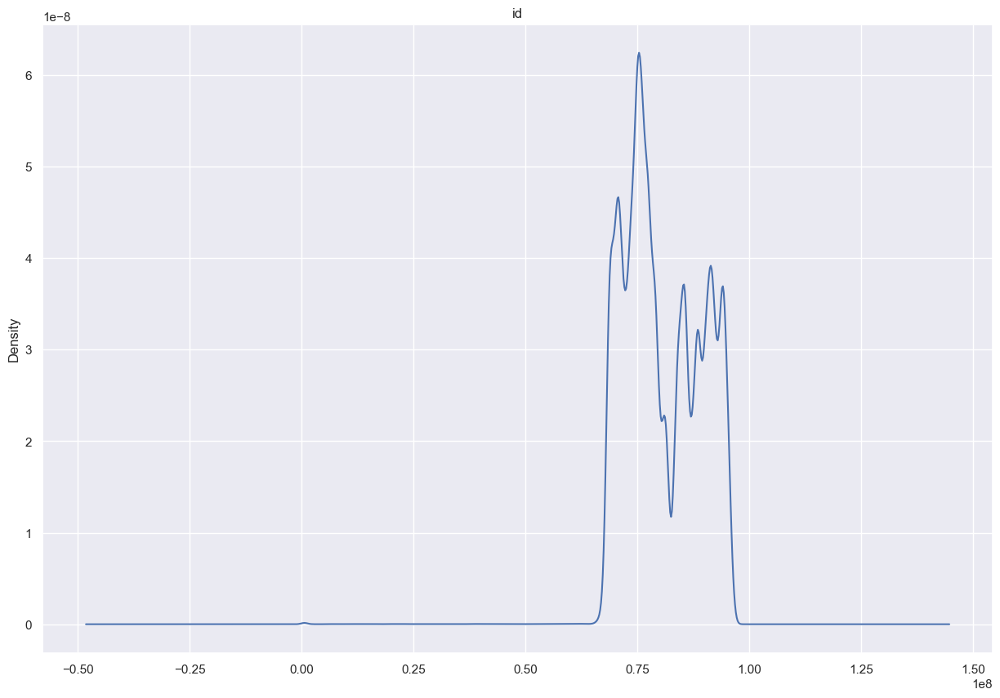

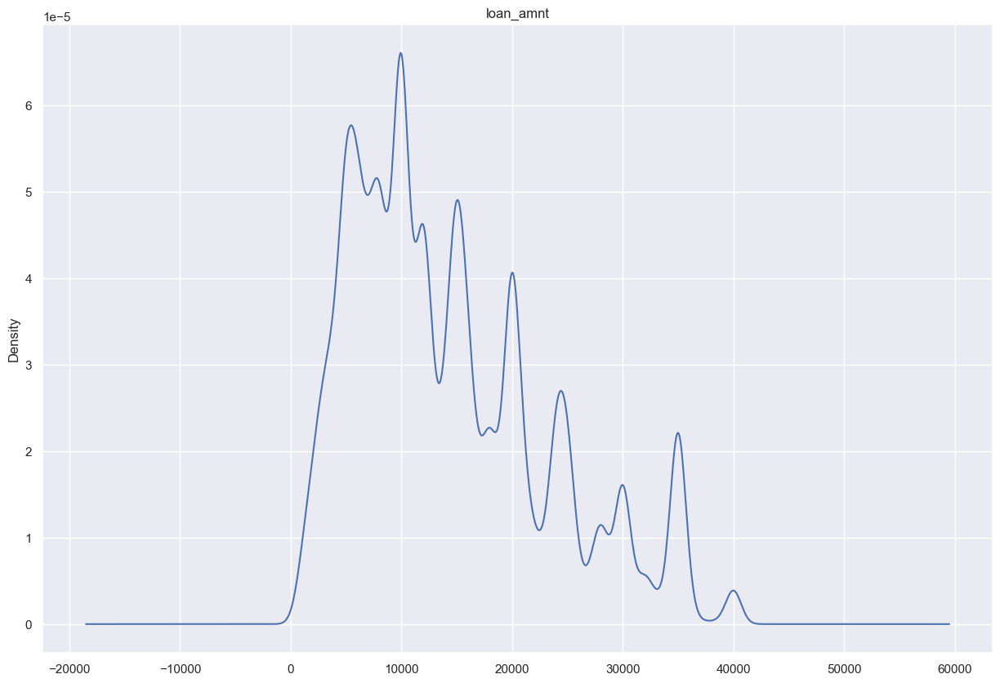

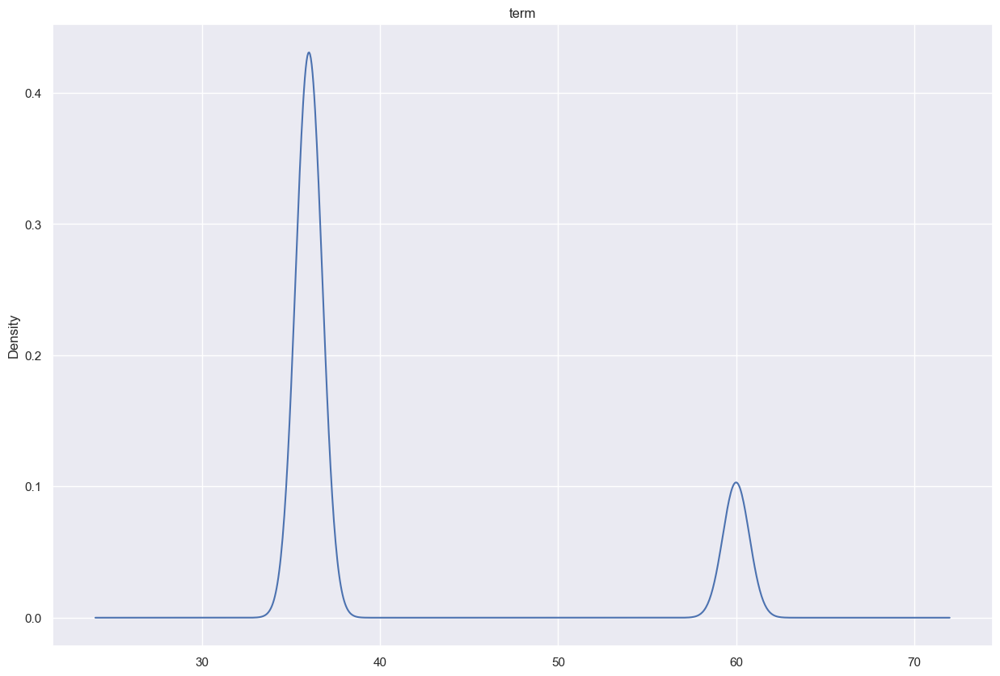

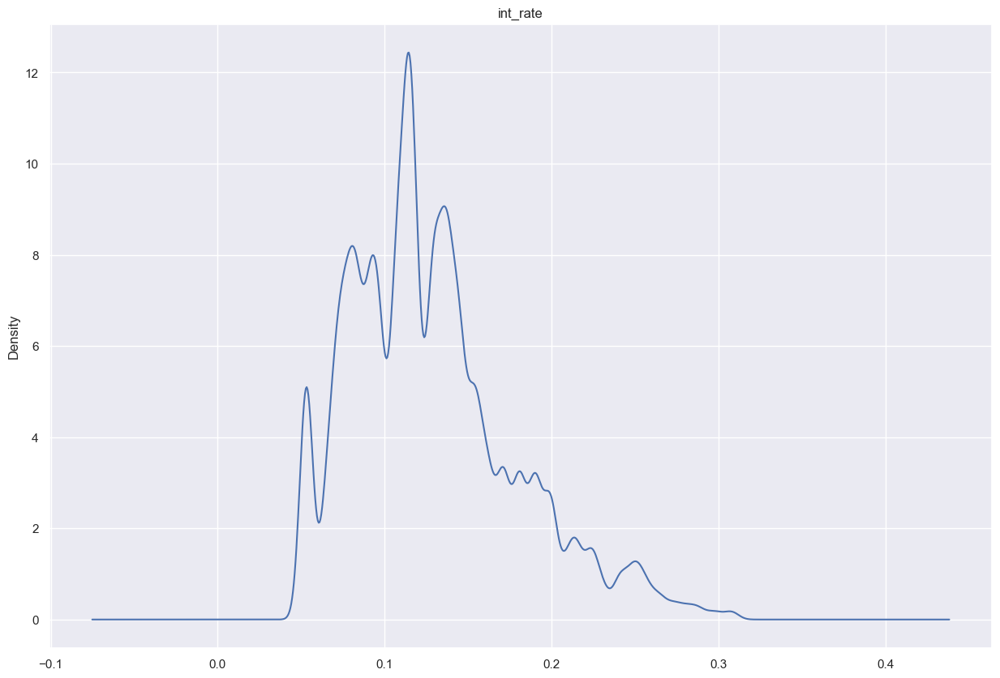

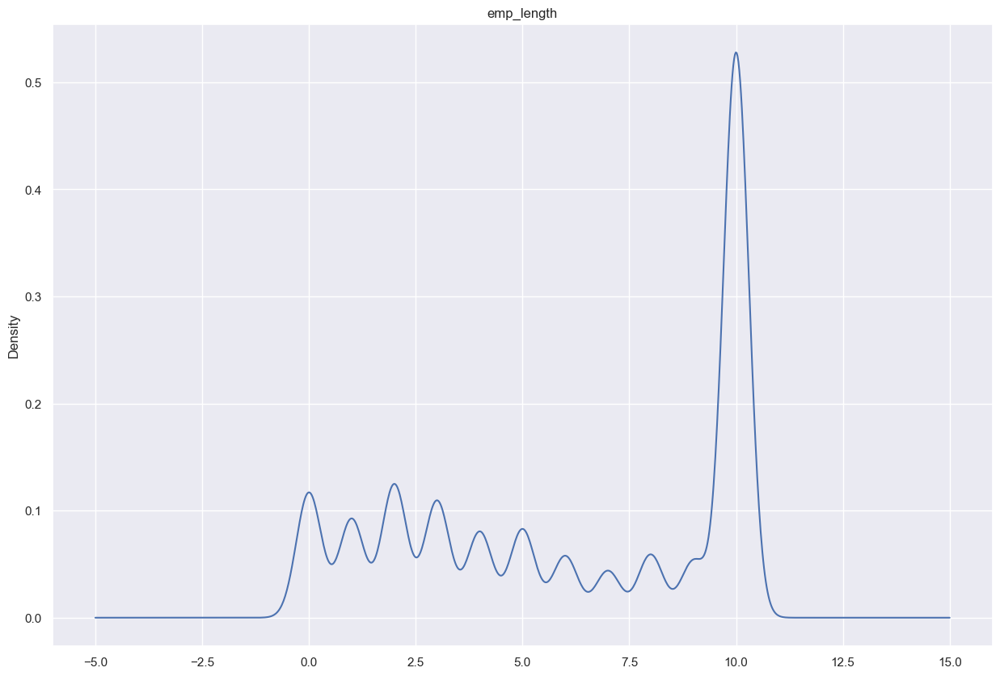

...

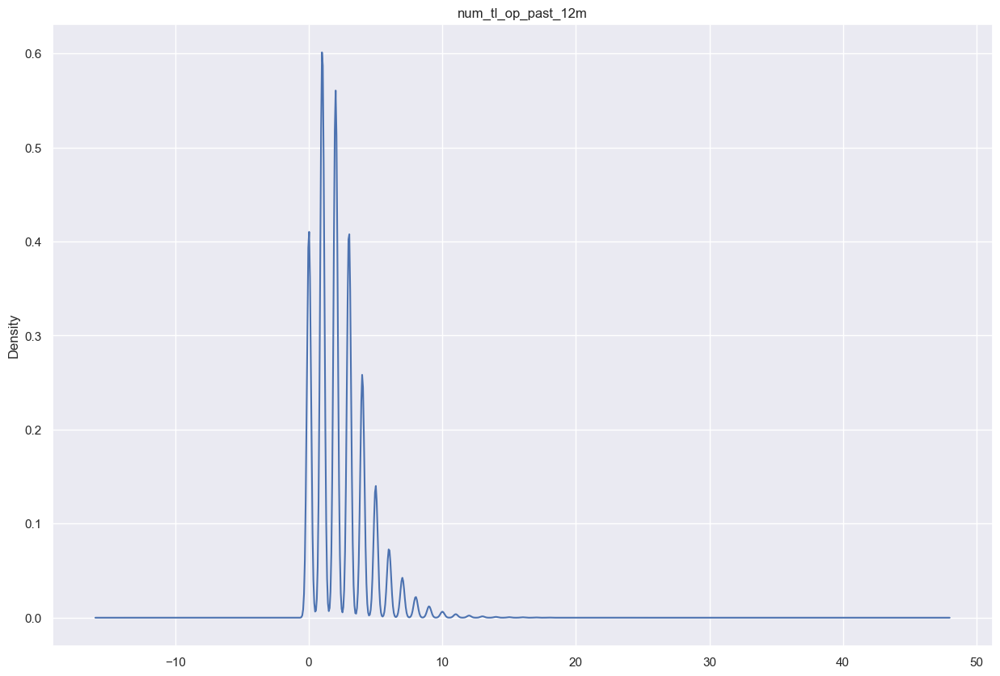

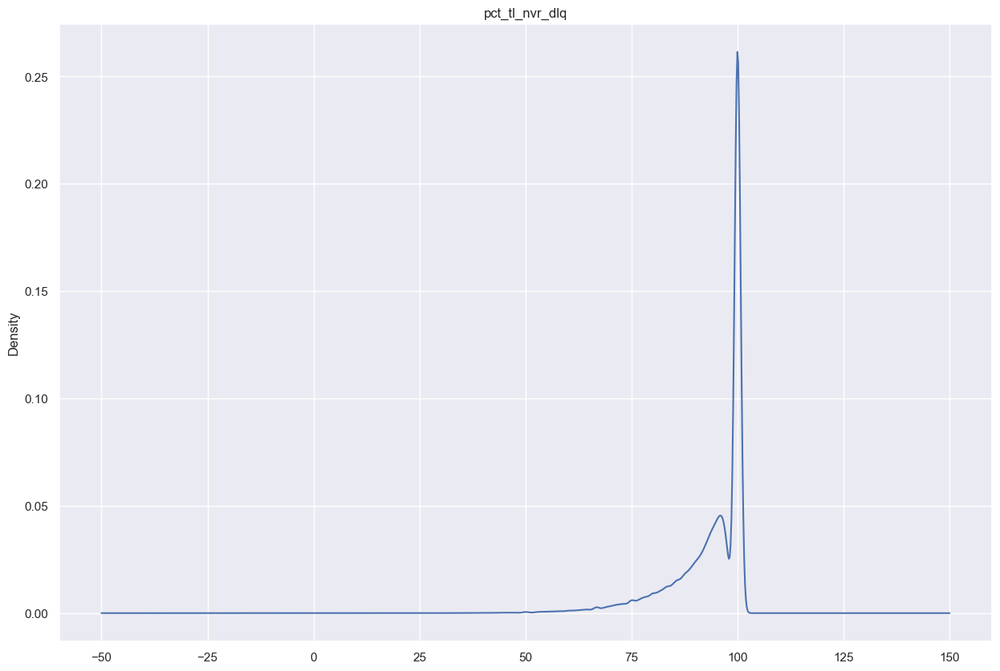

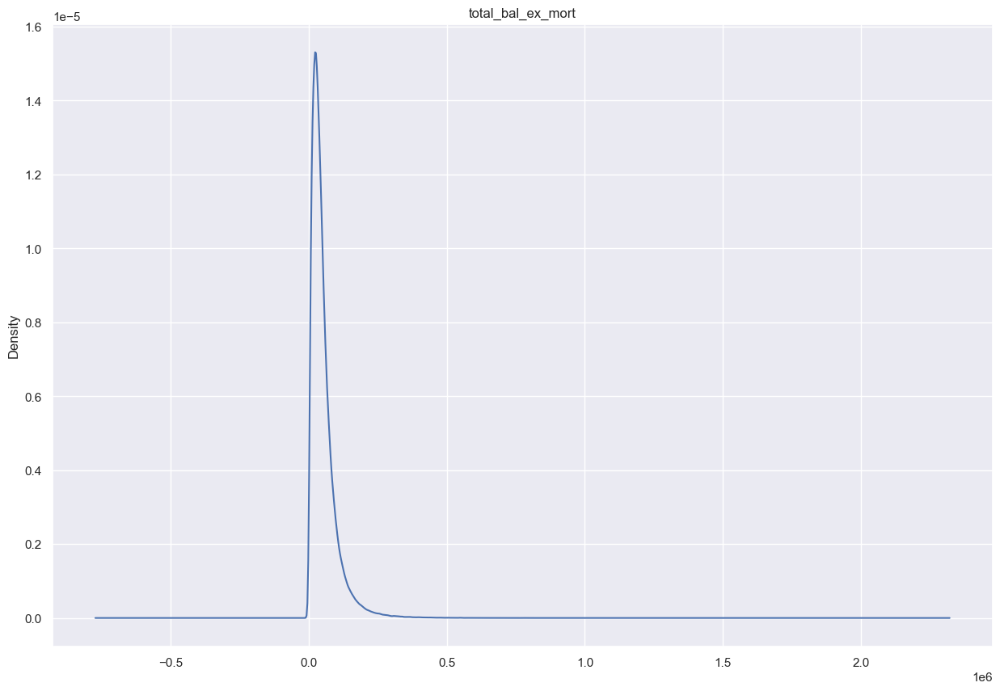

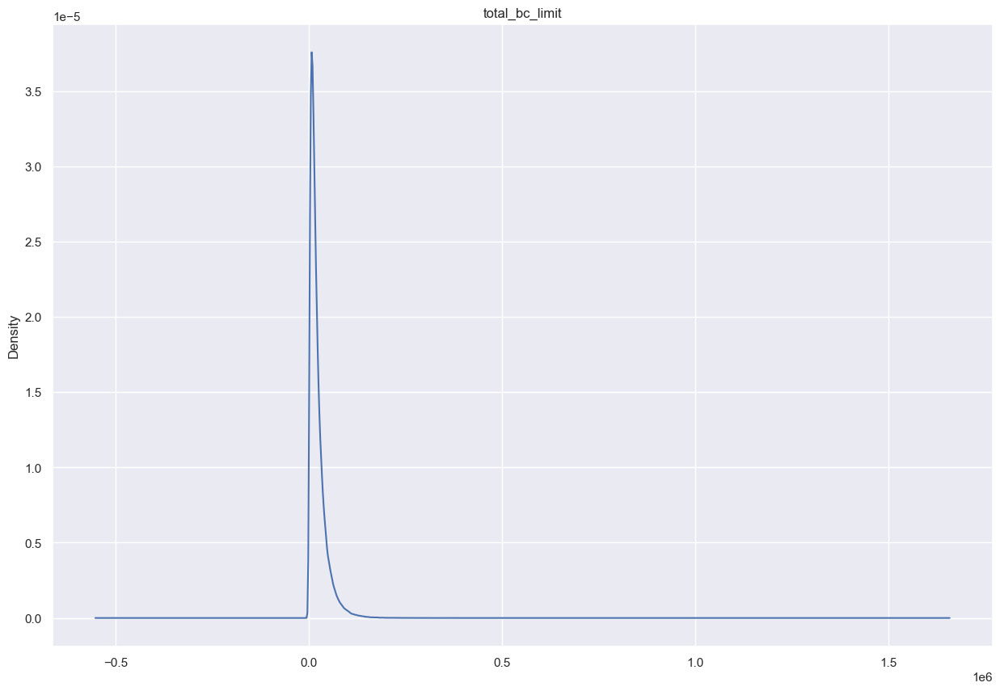

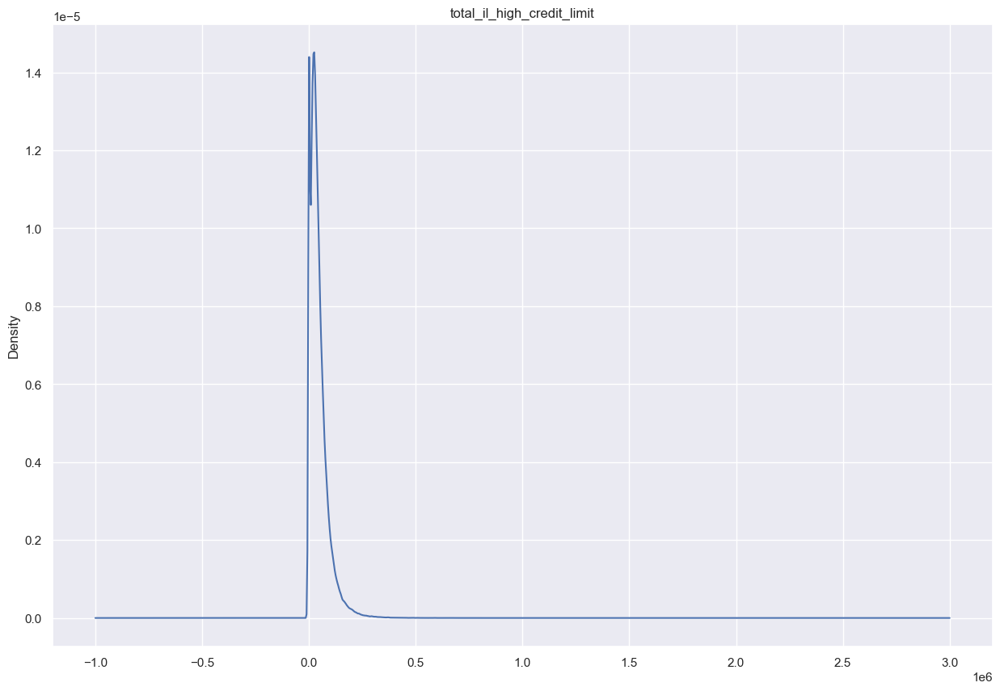

/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2536: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


ValueError: array must not contain infs or NaNs

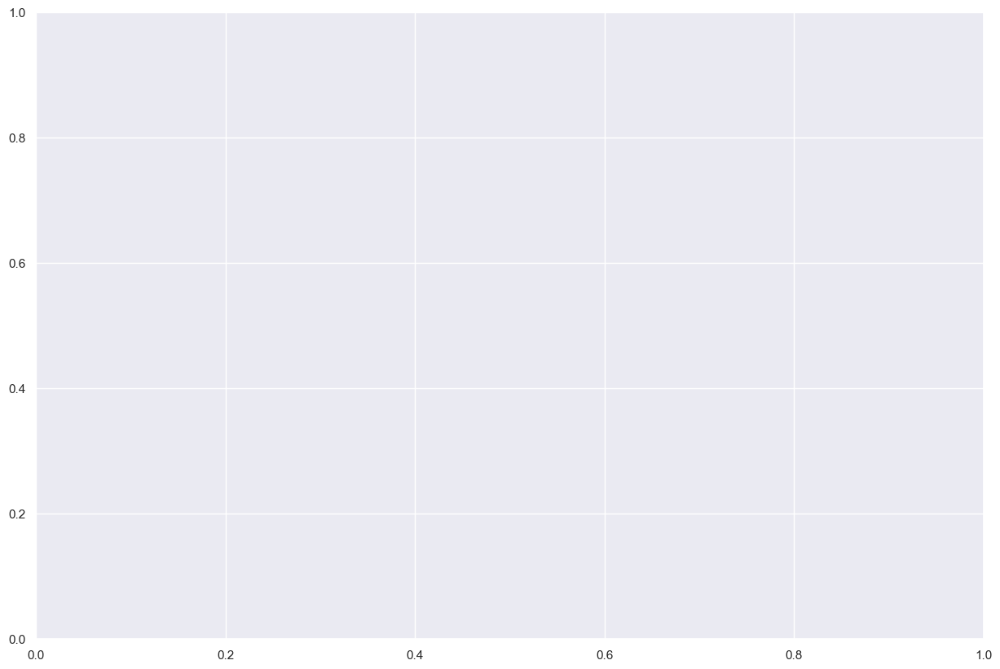

In [240]:
def plot_density_graphs(data):
    """
    Plot the density graph for all numeric columns in a Pandas DataFrame.

    Parameters:
    data (Pandas DataFrame): The dataset to be plotted.

    Returns:
    None
    """
num_cols = data.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    data[col].plot(kind='density')
    plt.title(col)
    plt.show()

In [241]:
def plot_qq_plots(dataframe):
    """
    Plot normal Q-Q plots for all numeric columns in a Pandas DataFrame.

    Parameters:
    dataframe (Pandas DataFrame): The DataFrame to plot the Q-Q plots for.

    Returns:
    None

    """
    num_cols = dataframe.select_dtypes(include=['int64', 'float64']).columns
    for col in num_cols:
        # Create a Q-Q plot
        fig, ax = plt.subplots()
        stats.probplot(dataframe[col], dist="norm", plot=ax)
        ax.set_title(f"Normal Q-Q plot for {col}")
        
        # Adjust figure size
        fig.set_size_inches(8, 6)
        
        # Adjust subplot spacing
        plt.tight_layout()

        # Show the plot
        plt.show()


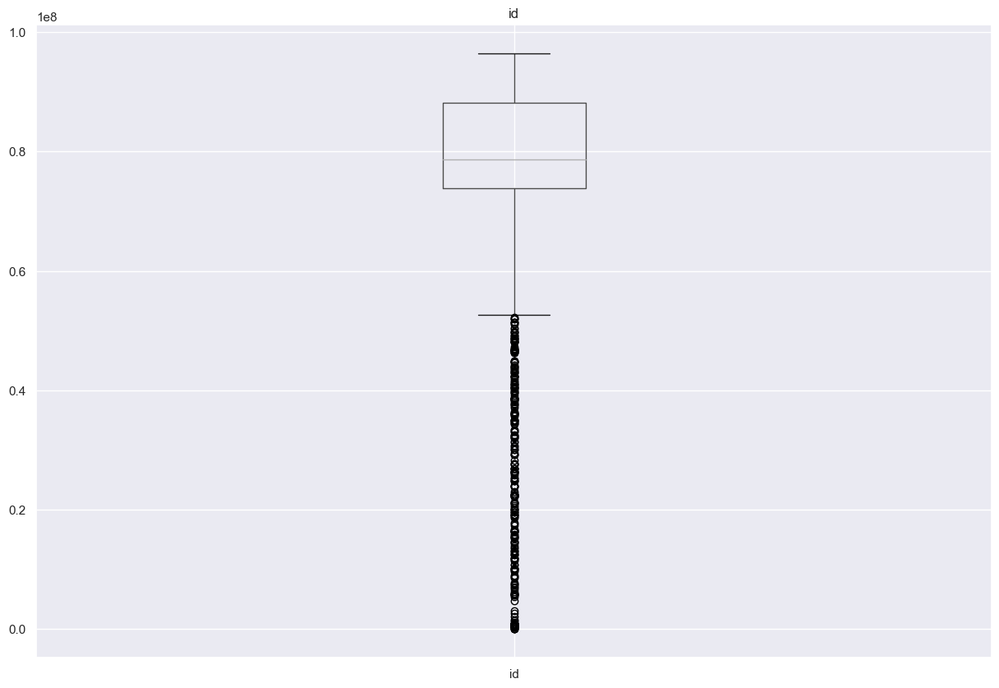

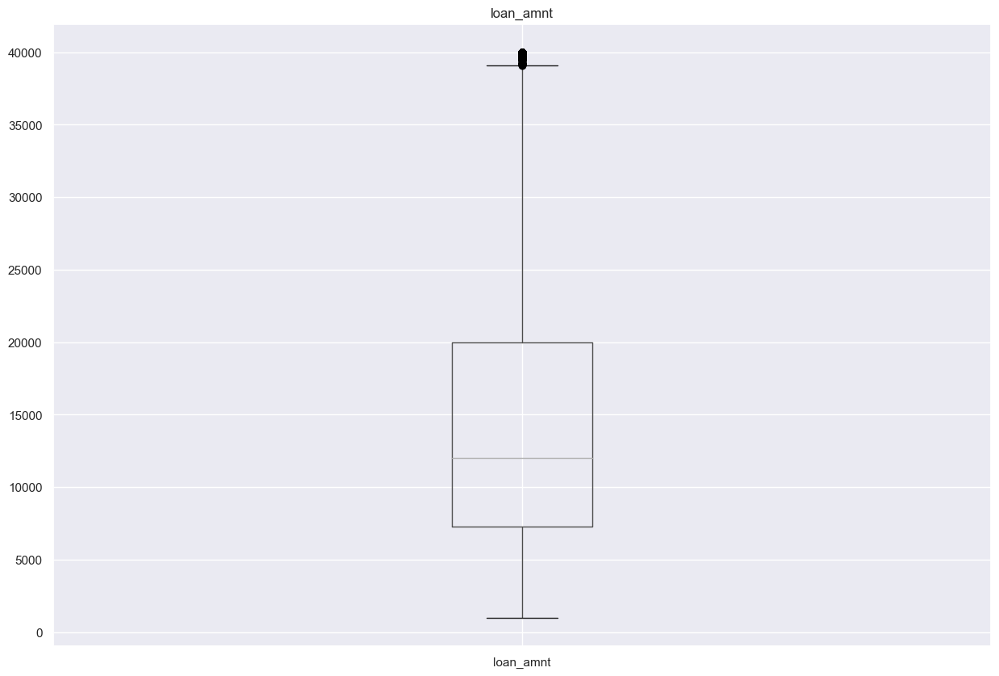

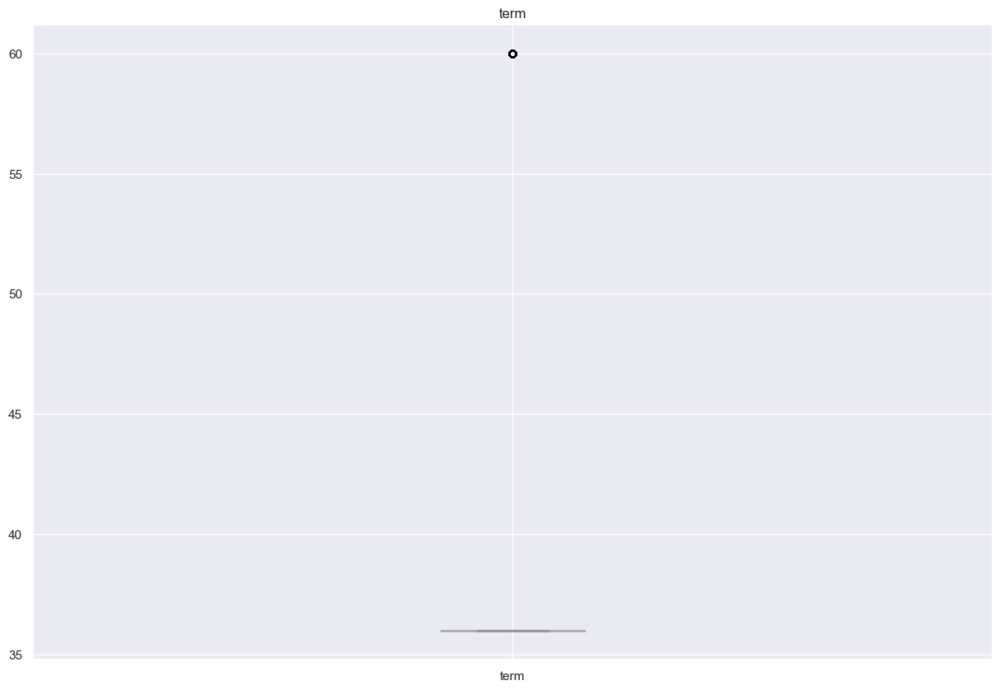

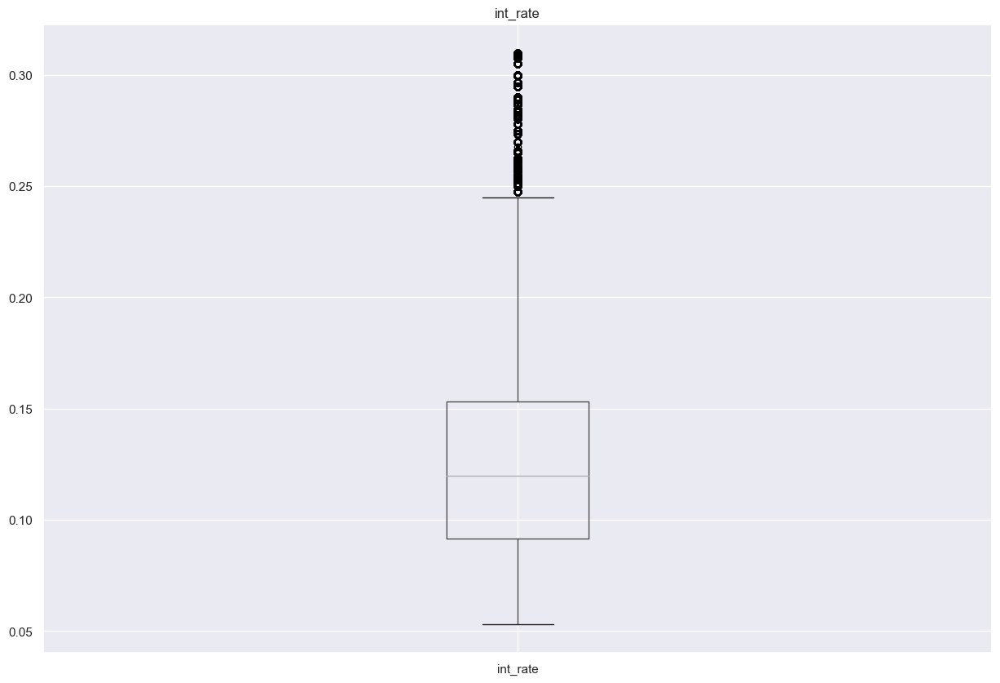

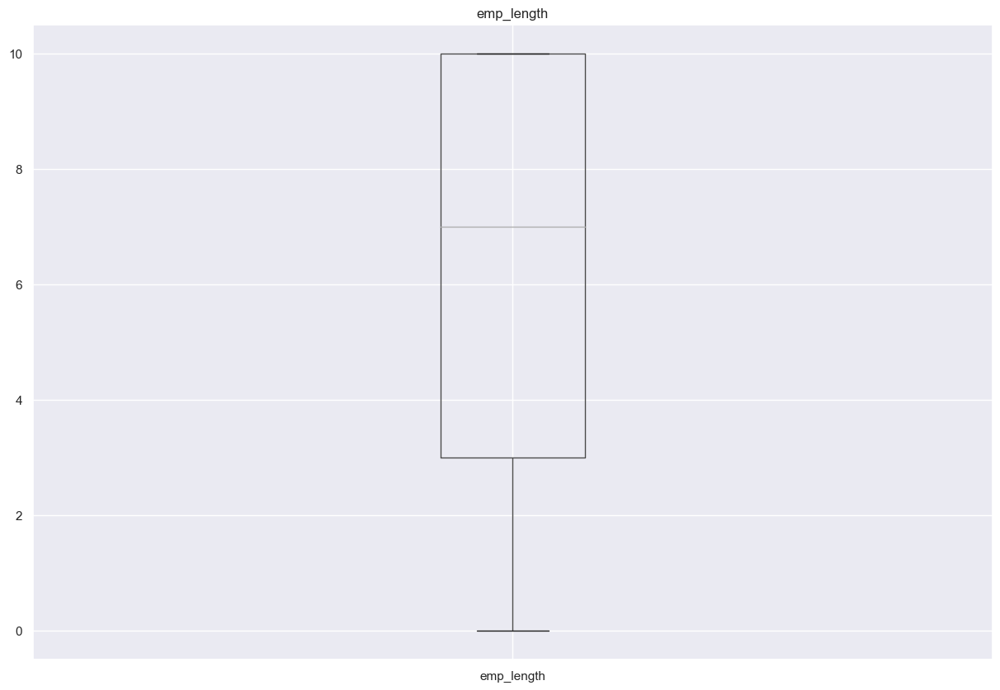

...

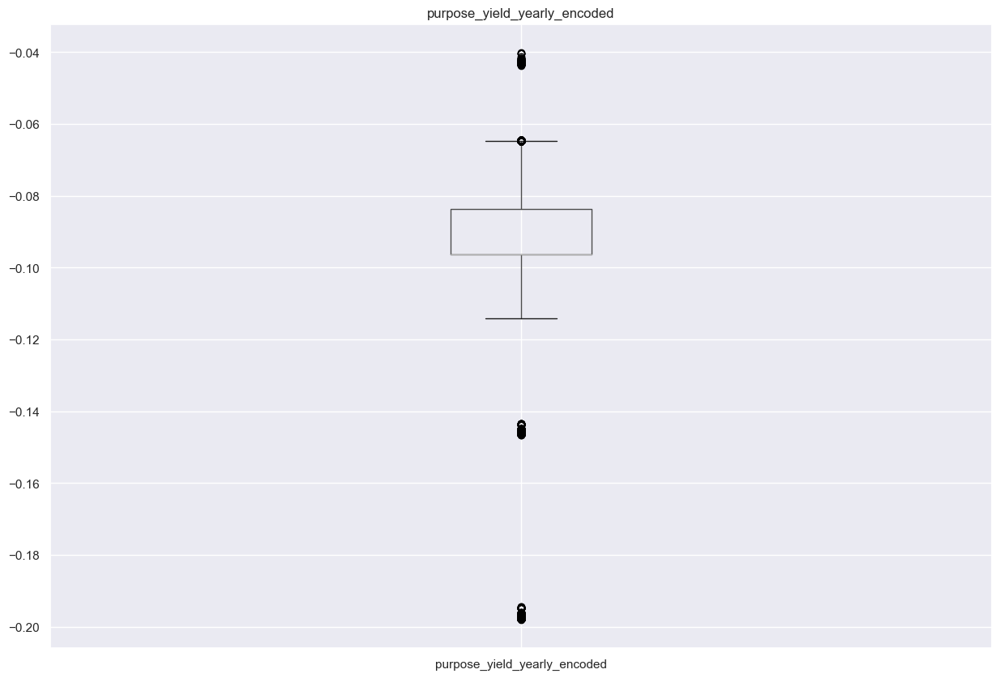

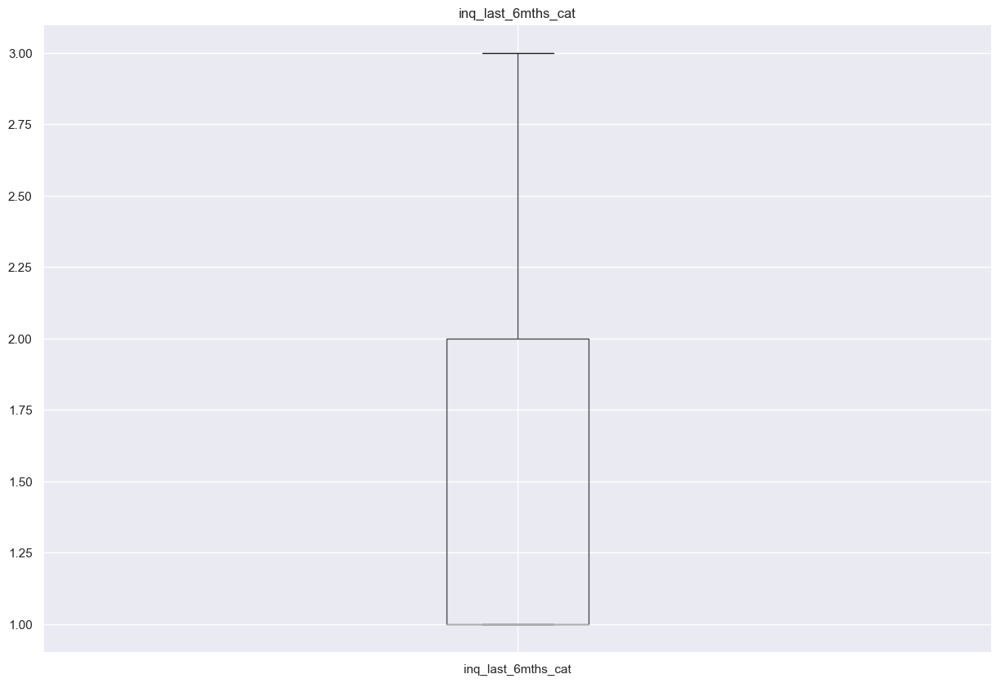

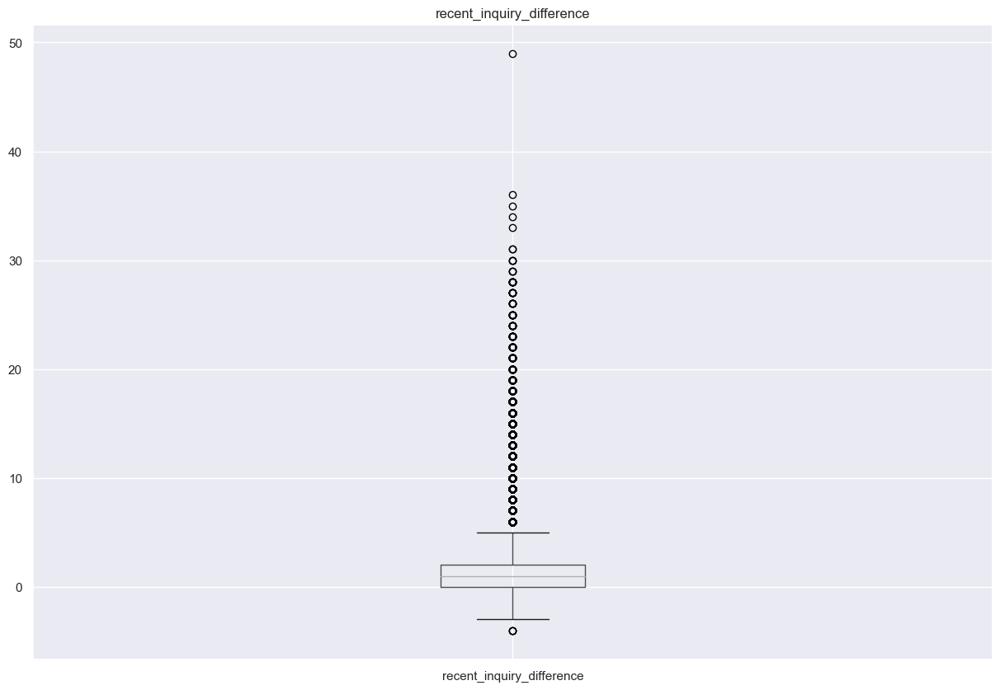

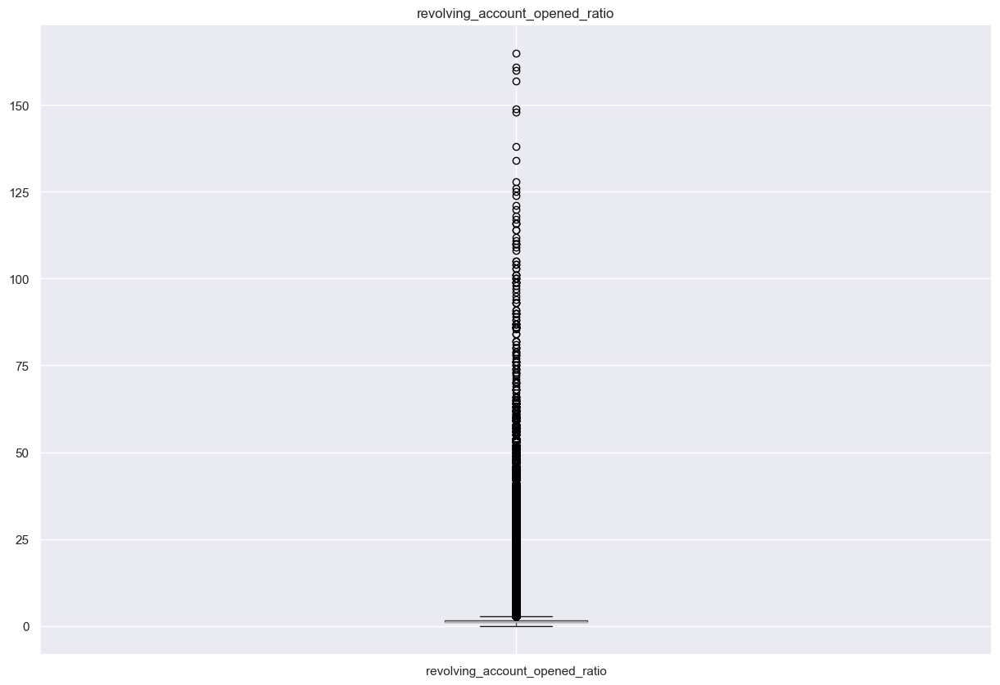

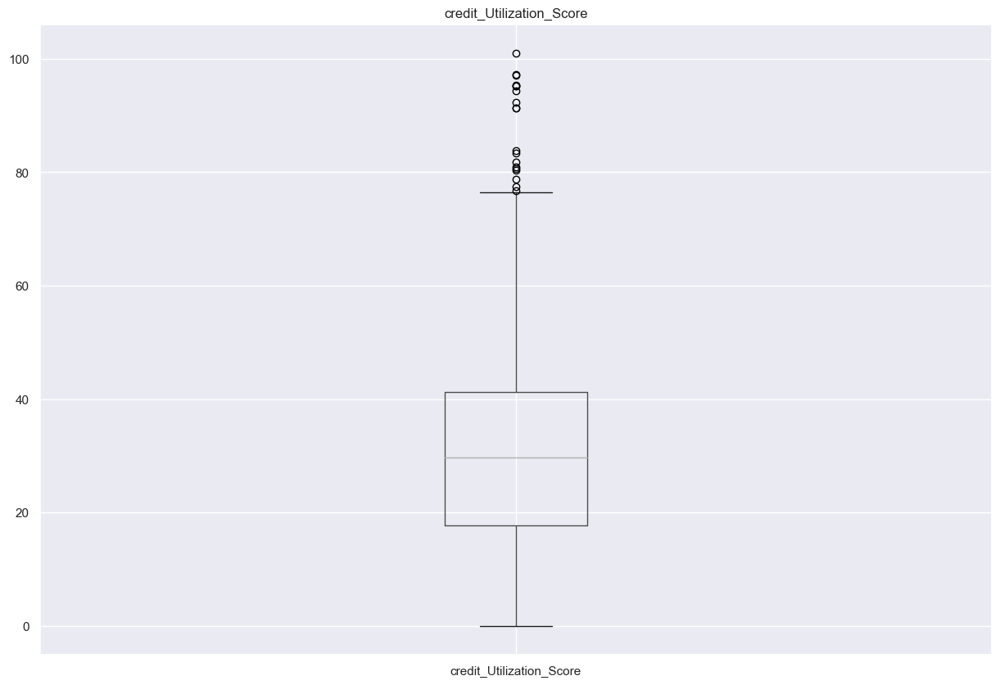

In [242]:

# Assume 'data' is your pandas dataframe

# Select only numerical columns
num_cols = data.select_dtypes(include=['int64', 'float64']).columns

# Create a boxplot for each numerical column
for col in num_cols:
    plt.figure()
    data.boxplot([col])
    plt.title(col)
    plt.show()

In [243]:
plot_density_graphs(data)

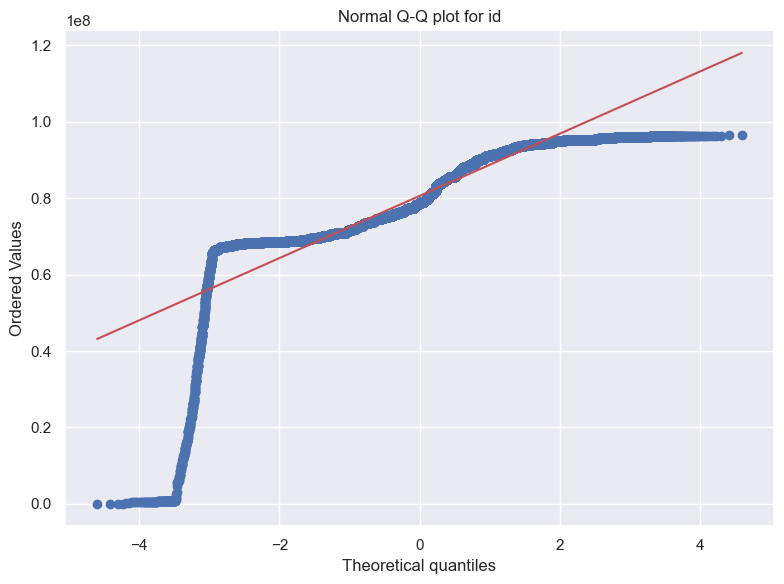

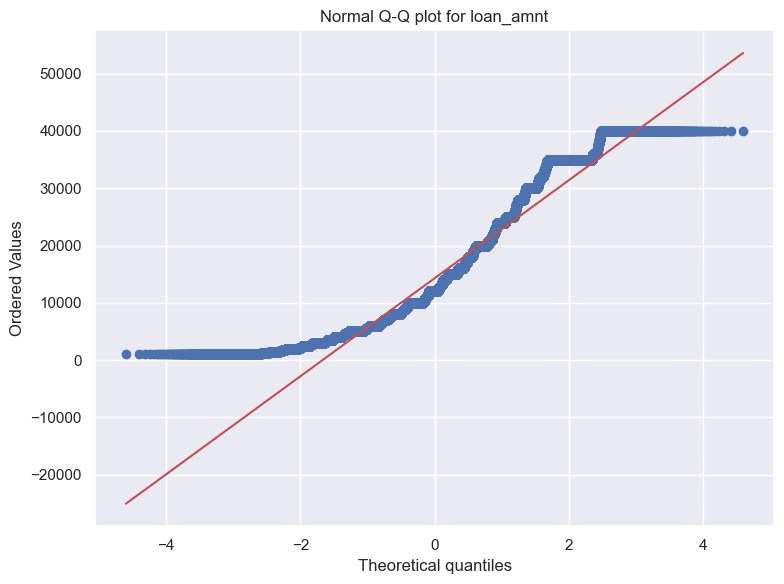

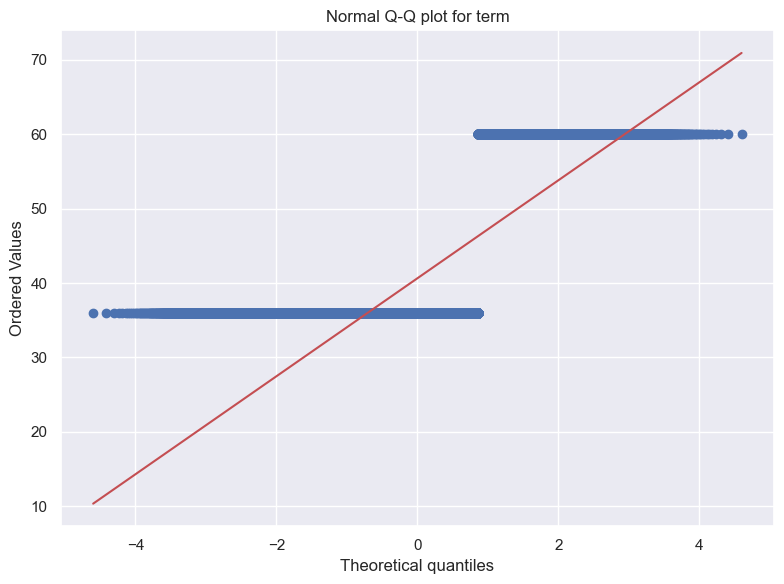

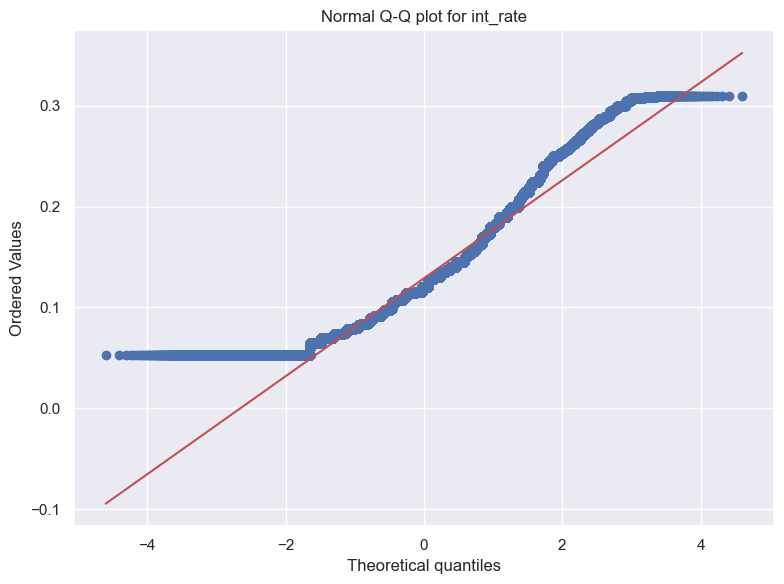

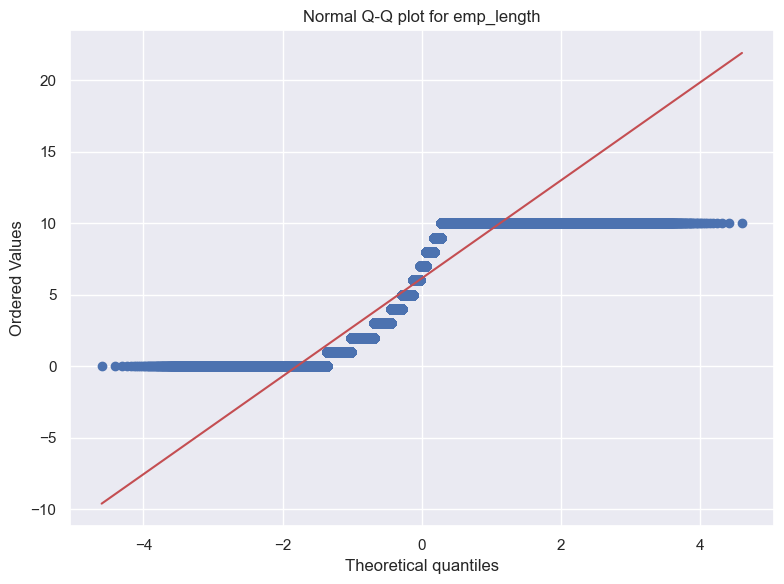

...

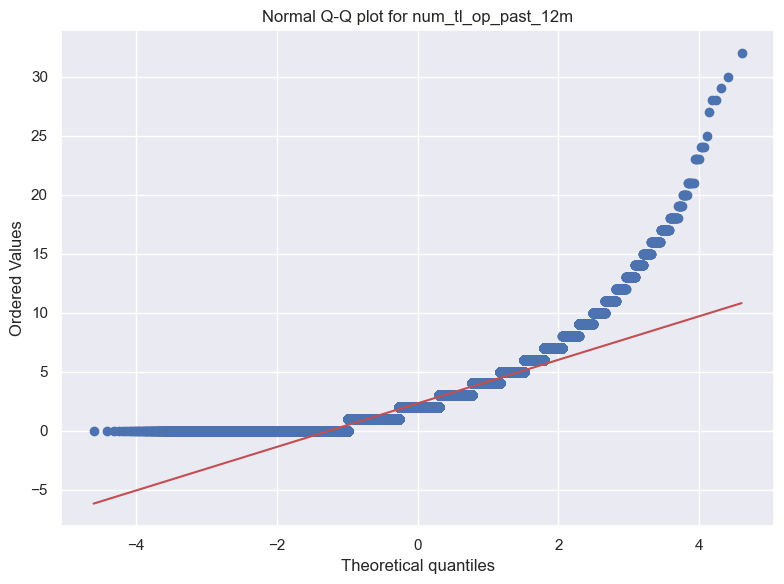

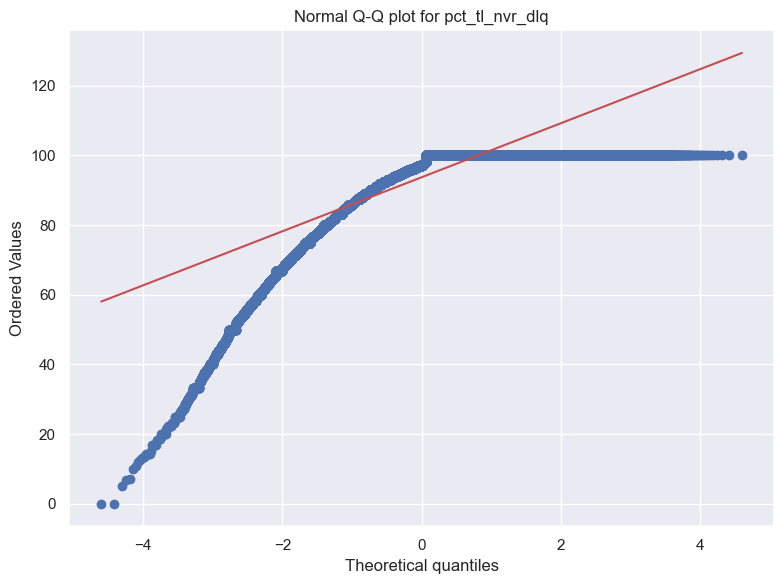

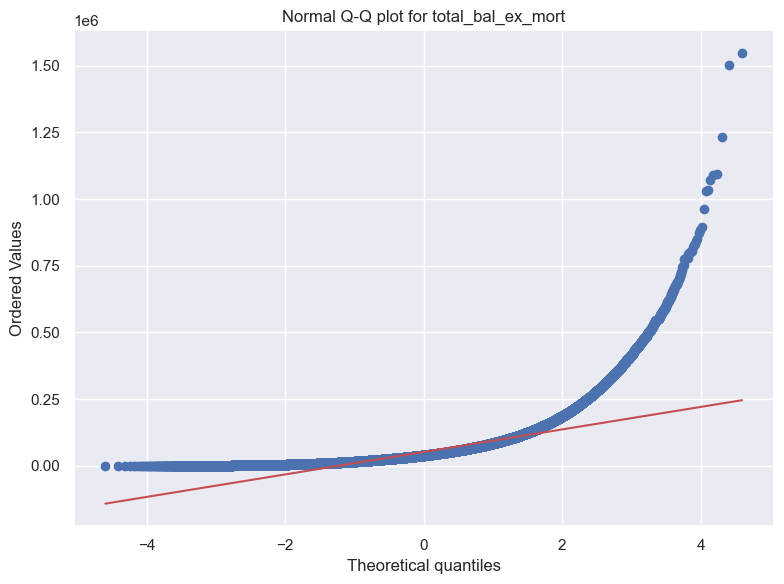

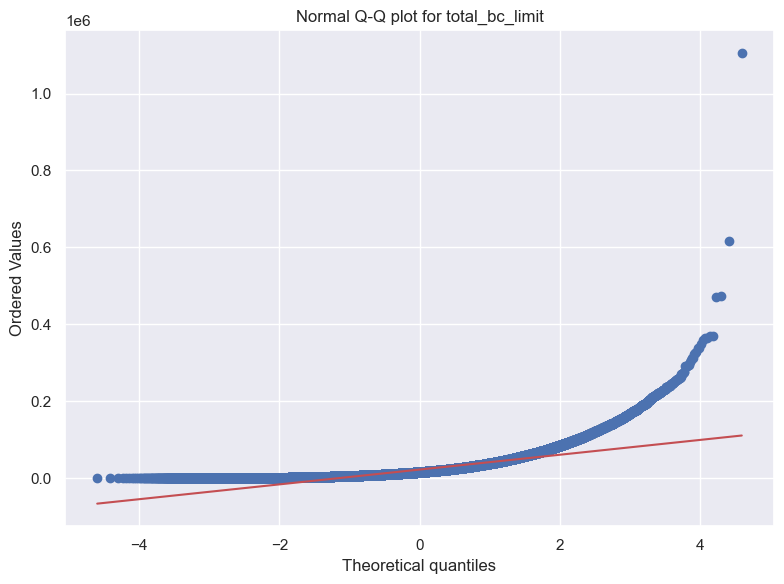

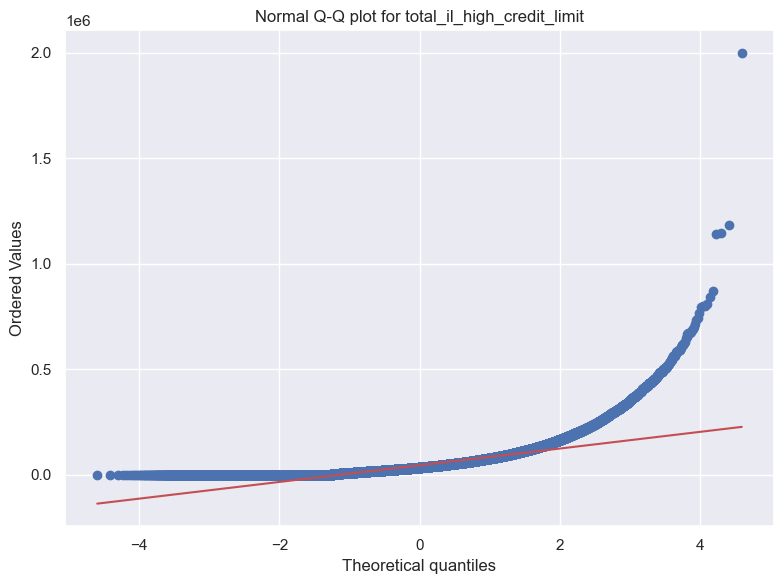

/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2536: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


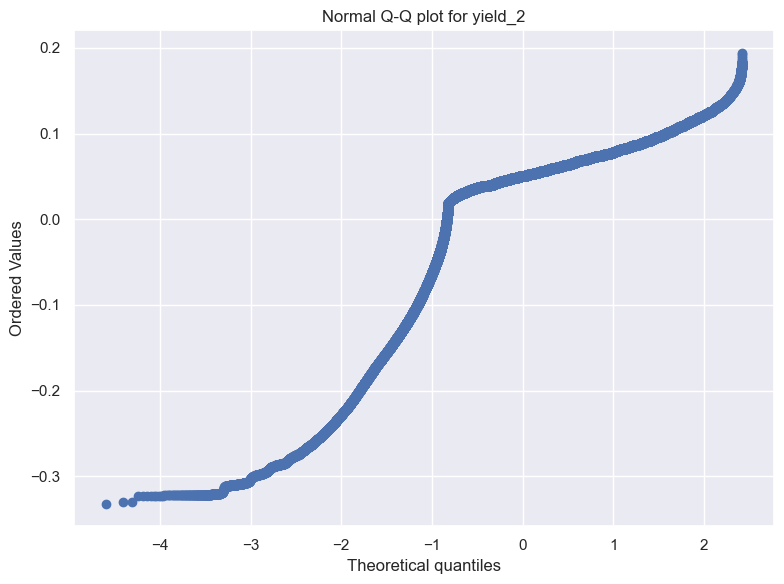

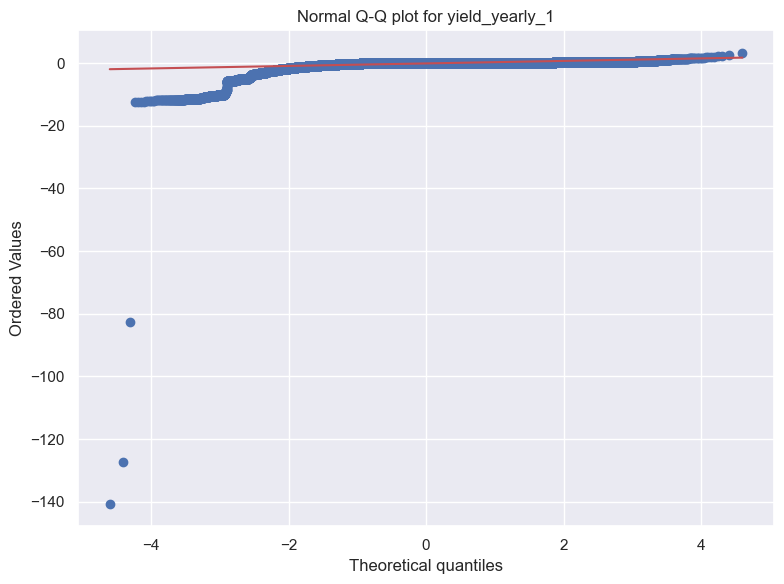

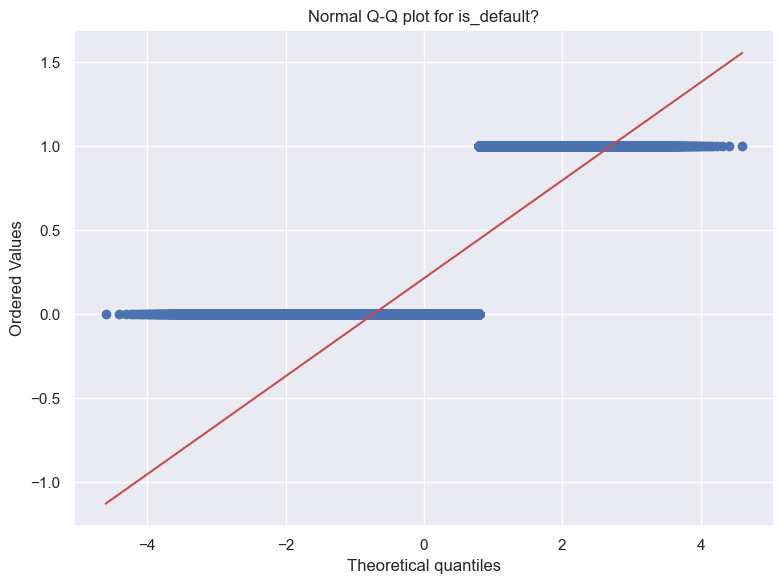

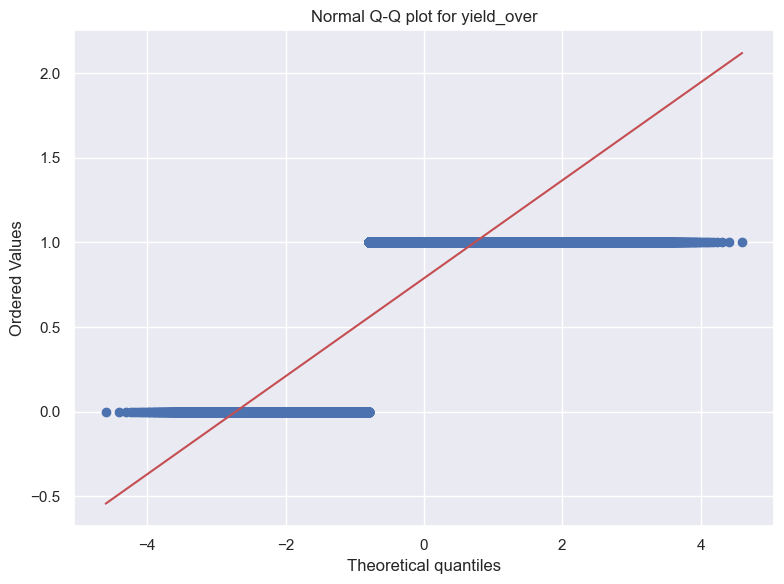

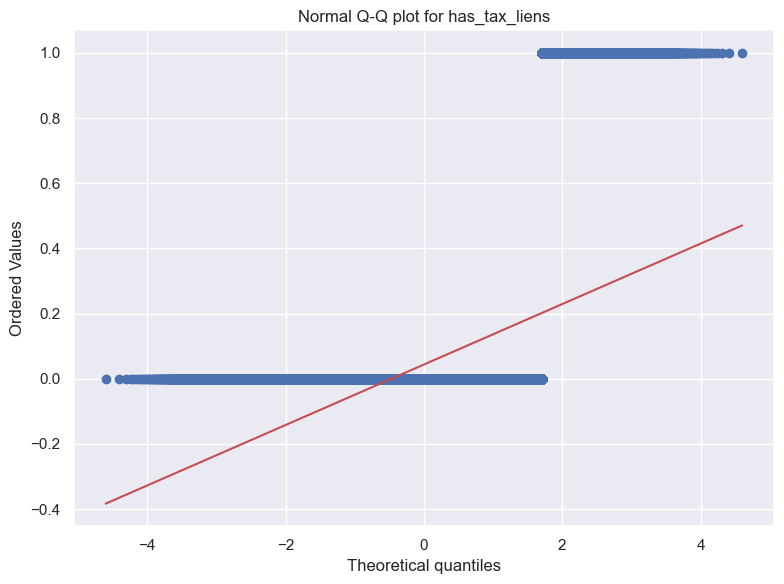

...

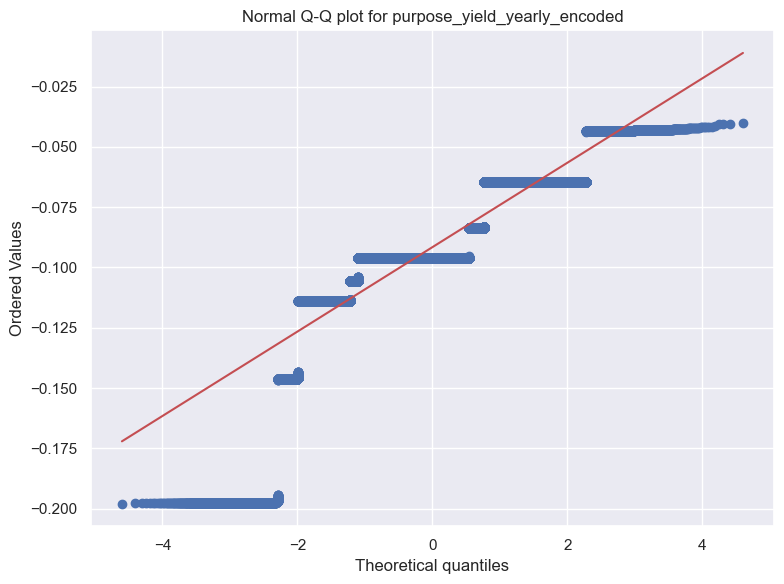

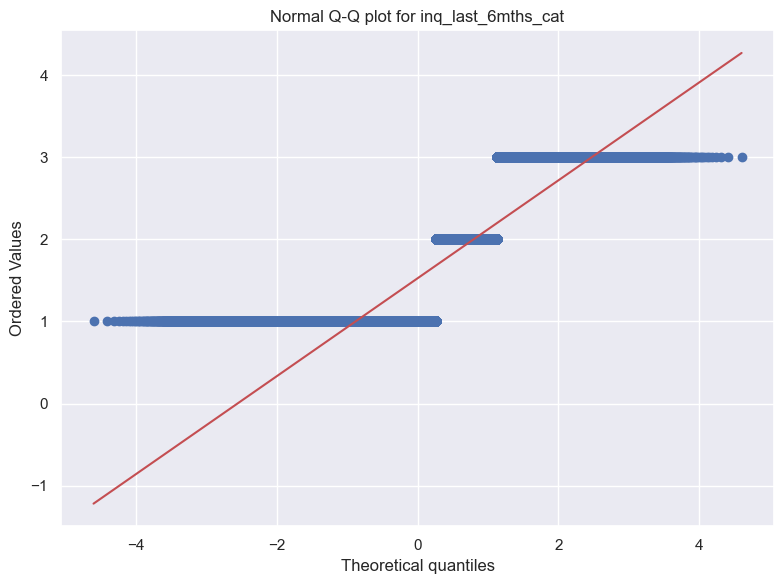

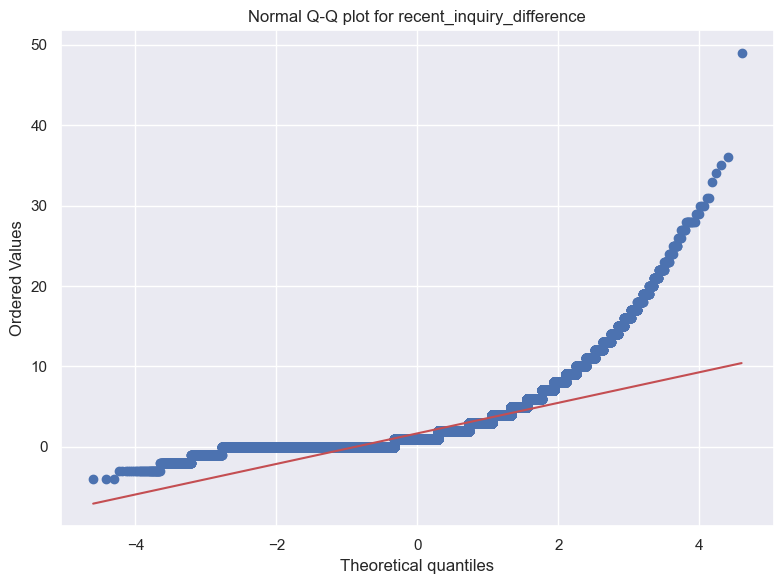

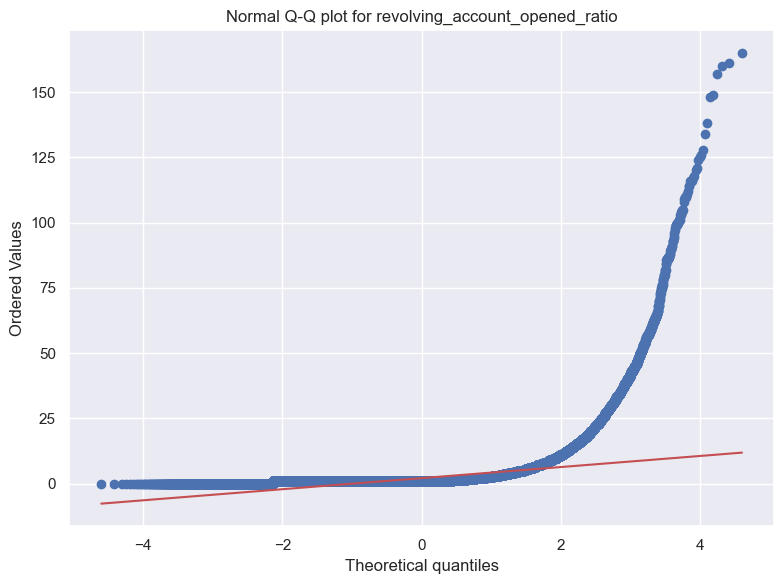

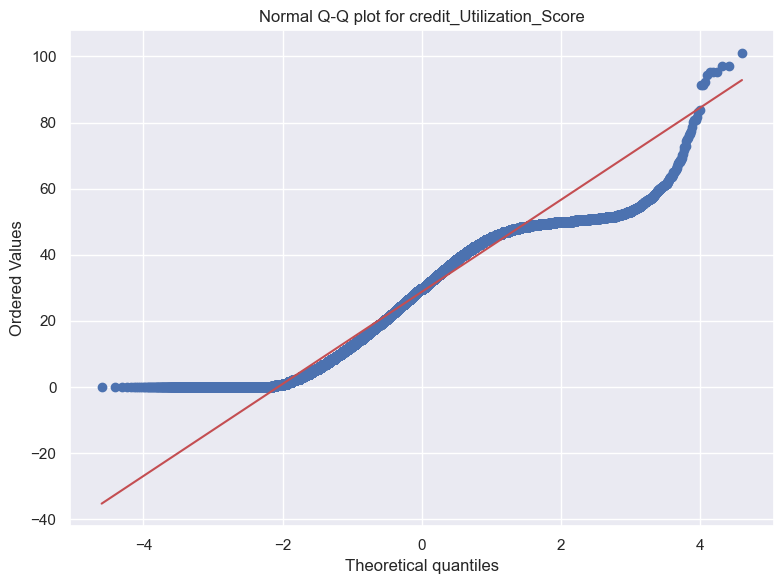

In [244]:
plot_qq_plots(data)

**total_il_high_credit_limit**

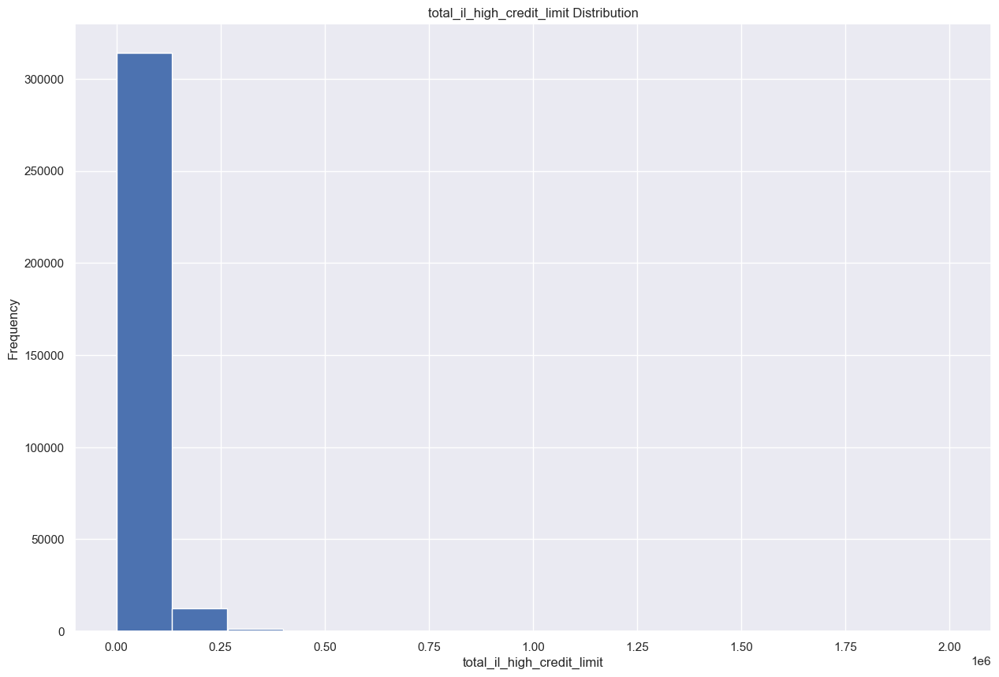

In [245]:
plt.hist(data['total_il_high_credit_limit'], bins=15)
plt.title('total_il_high_credit_limit Distribution')
plt.xlabel('total_il_high_credit_limit')
plt.ylabel('Frequency')
plt.show()

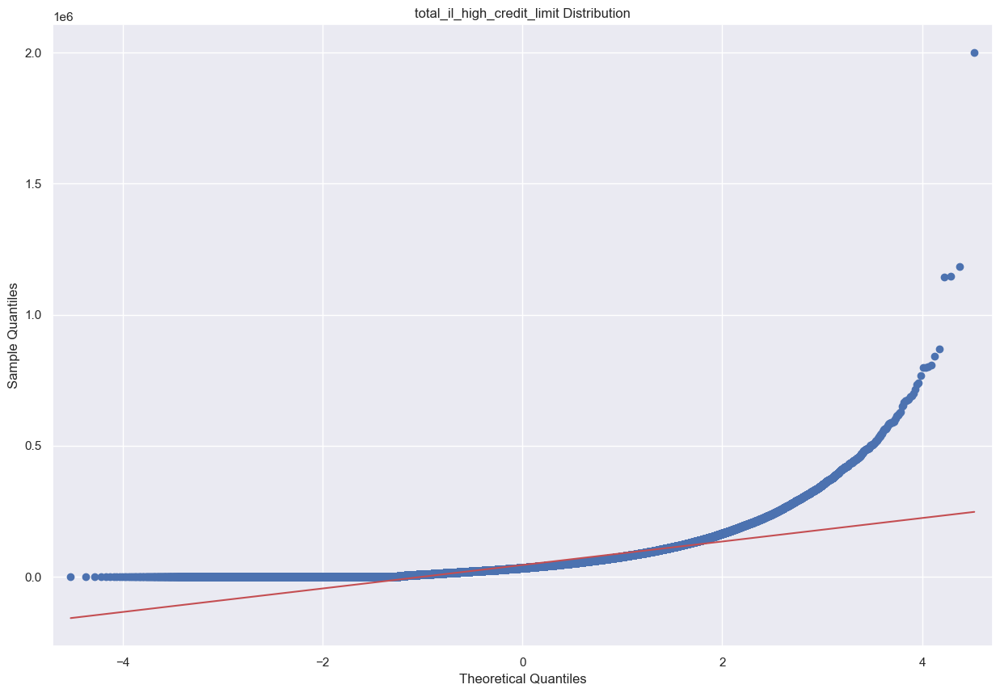

In [246]:
# Plot QQ plot of price
sm.qqplot(data['total_il_high_credit_limit'], line='s')
plt.title('total_il_high_credit_limit Distribution')
plt.show()

In [247]:
data = data[data['total_il_high_credit_limit'] <= 300000]

**DTI**

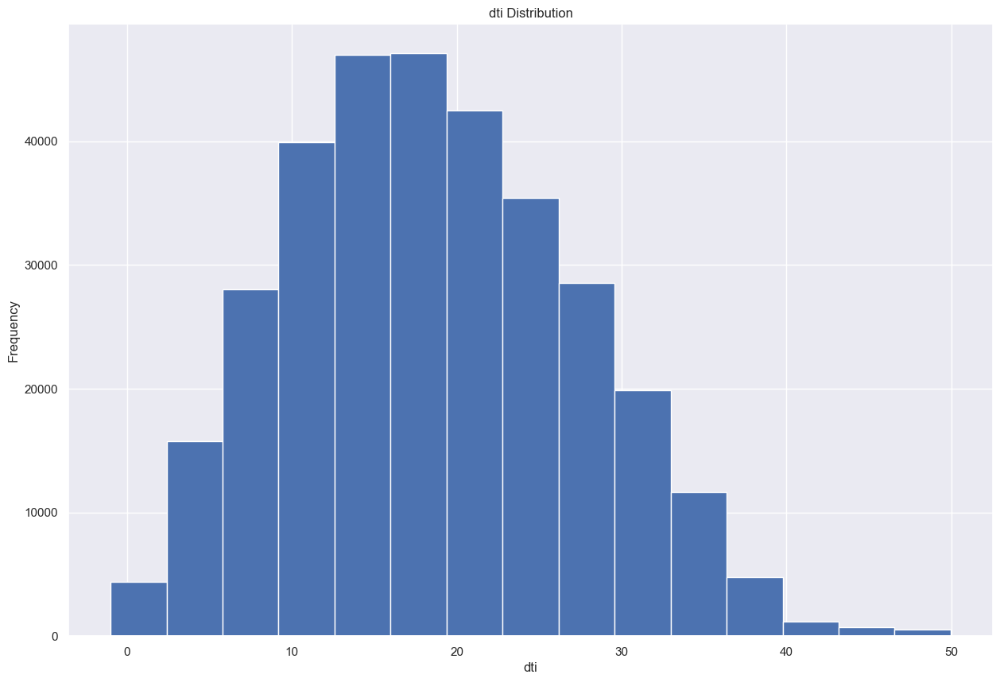

In [248]:
plt.hist(data['dti'], bins=15)
plt.title('dti Distribution')
plt.xlabel('dti')
plt.ylabel('Frequency')
plt.show()

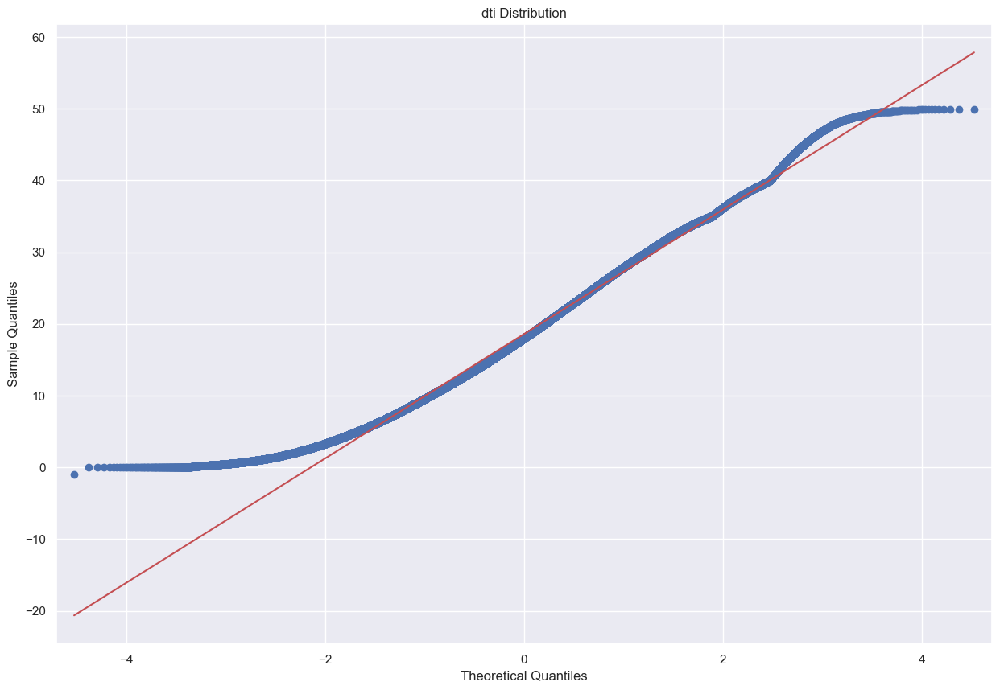

In [249]:
# Plot QQ plot of price
sm.qqplot(data['dti'], line='s')
plt.title('dti Distribution')
plt.show()

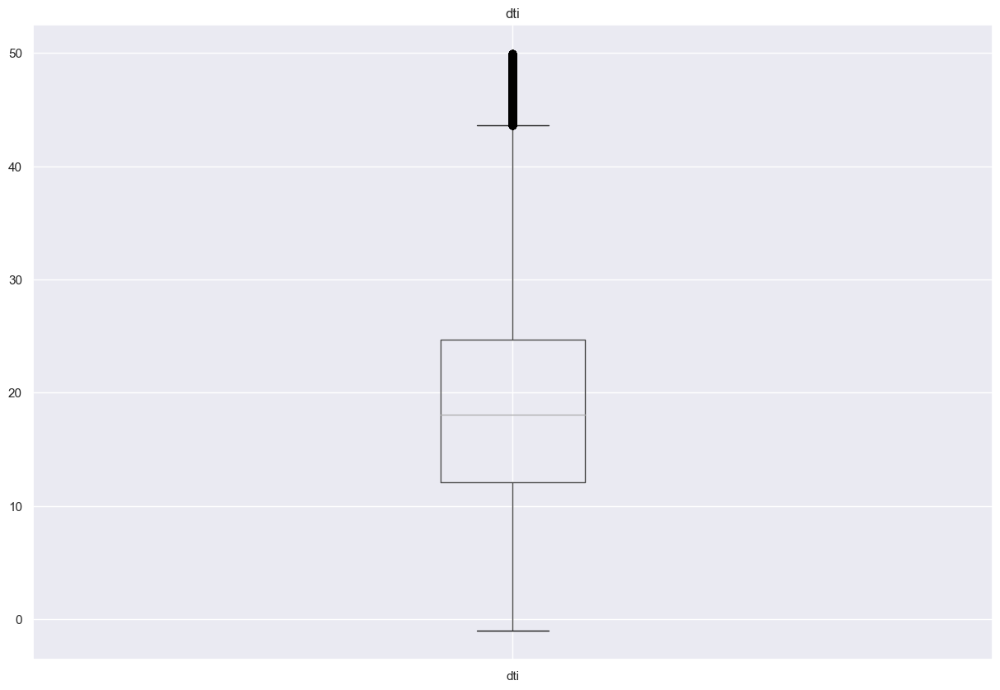

In [250]:
plt.figure()
data.boxplot(['dti'])
plt.title("dti")
plt.show()

In [251]:
m_dti = data["dti"].mean()
sd_dti = data["dti"].std()
x = m_dti + 3*sd_dti
data[data["dti"] > x]

,id,loan_amnt,term,int_rate,grade,emp_length,annual_inc,issue_d,dti,delinq_2yrs,...,Is_MORTGAGE,Is_RENT,purpose_yield_over_encoded,purpose_yield_yearly_encoded,inq_last_6mths_cat,f,w,recent_inquiry_difference,revolving_account_opened_ratio,credit_Utilization_Score
1,76142378,30000.0,36,0.1446,C,10.0,68500.0,2016-03-01,45.16,0,...,1,0,0.774833,-0.096180,1,0,1,5.0,1.833333,16.1505
82,75194106,24000.0,36,0.1727,D,10.0,55000.0,2016-03-01,47.46,0,...,0,0,0.814347,-0.064672,1,0,1,2.0,1.000000,43.9175
157,75981611,8000.0,36,0.1299,C,10.0,41460.0,2016-03-01,46.89,1,...,0,1,0.774833,-0.096177,1,0,1,1.0,8.000000,9.5810
178,76132699,3000.0,36,0.1999,E,10.0,52000.0,2016-03-01,47.10,0,...,1,0,0.774833,-0.096173,1,1,0,0.0,6.500000,48.4150
351,75222670,9400.0,36,0.2313,F,10.0,40065.0,2016-03-01,45.60,0,...,1,0,0.790389,-0.113972,1,1,0,7.0,1.285714,27.7540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208785,75050761,13200.0,60,0.2814,G,10.0,33000.0,2016-04-01,45.45,0,...,0,1,0.774833,-0.096169,1,0,1,4.0,1.000000,40.2715
208816,75190578,10000.0,36,0.1299,C,6.0,30000.0,2016-04-01,46.24,0,...,0,1,0.774827,-0.096181,1,0,1,0.0,1.000000,47.8935
208831,75153299,13175.0,60,0.2899,G,3.0,26353.0,2016-04-01,45.67,0,...,0,1,0.774827,-0.096182,1,0,1,0.0,5.666667,48.4990
208930,74592359,18000.0,60,0.2867,G,3.0,41600.0,2016-04-01,47.11,0,...,1,0,0.814347,-0.064627,1,0,1,1.0,1.000000,42.8000


**annual_inc**

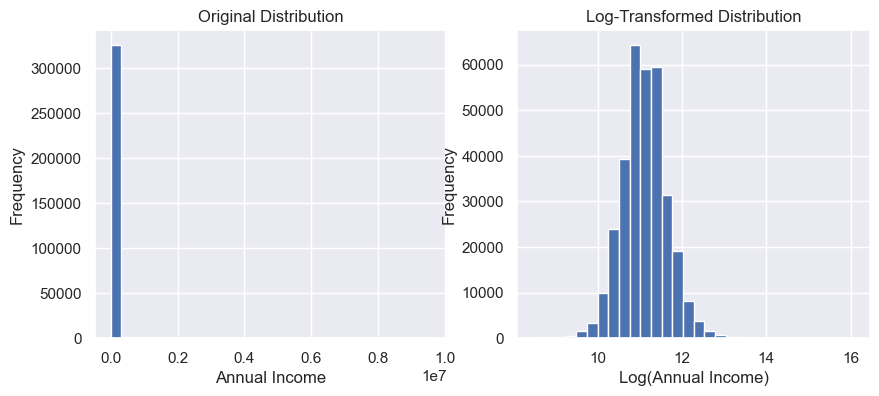

In [252]:
data['annl_inc_log'] = np.log(data['annual_inc'])


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['annual_inc'], bins=30)
ax[0].set_xlabel('Annual Income')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['annl_inc_log'], bins=30)
ax[1].set_xlabel('Log(Annual Income)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('annual_inc', axis=1, inplace=True)

**revol_bal**

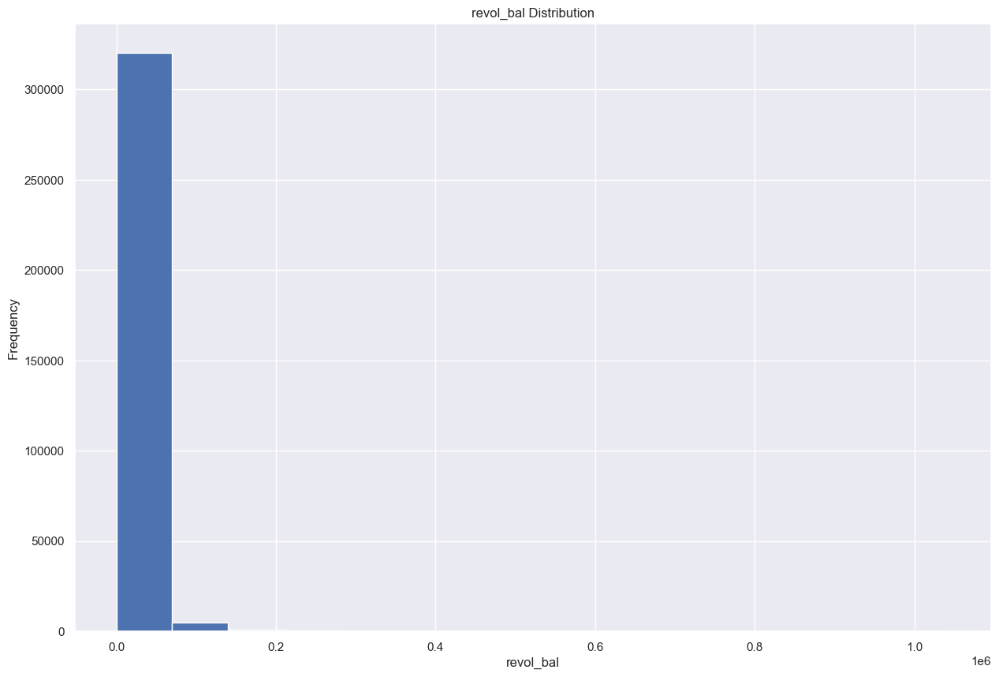

In [253]:
plt.hist(data['revol_bal'], bins=15)
plt.title('revol_bal Distribution')
plt.xlabel('revol_bal')
plt.ylabel('Frequency')
plt.show()

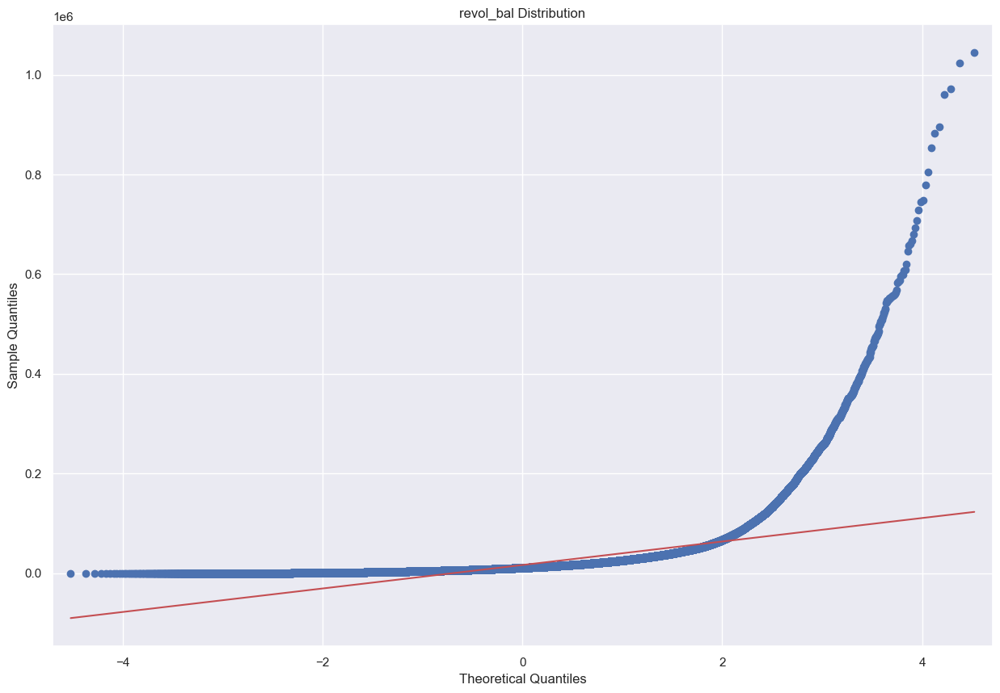

In [254]:
# Plot QQ plot of price
sm.qqplot(data['revol_bal'], line='s')
plt.title('revol_bal Distribution')
plt.show()

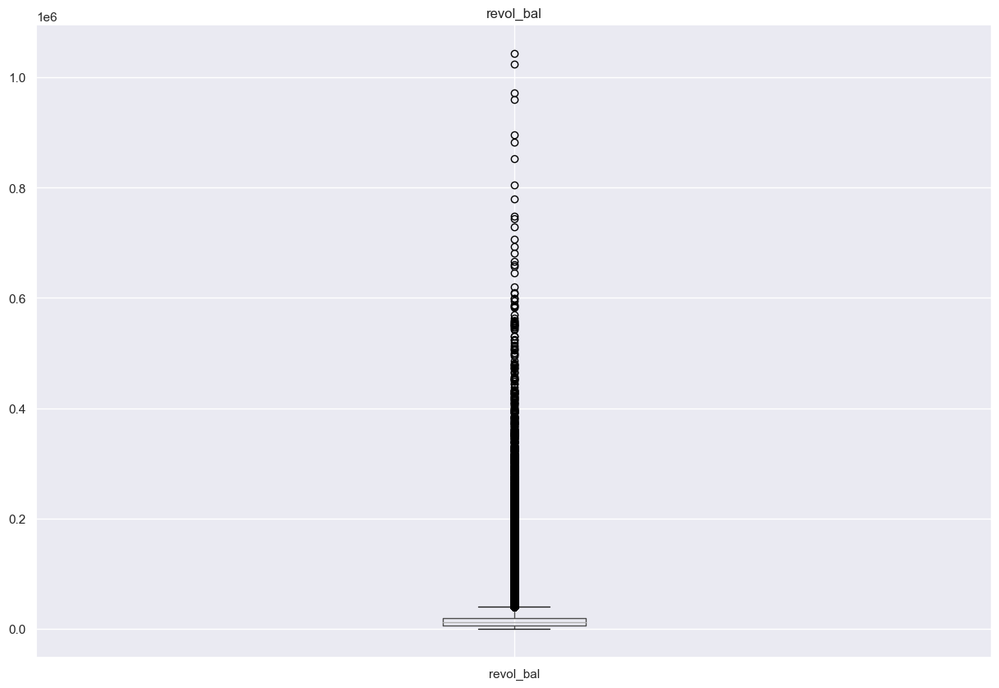

In [255]:
plt.figure()
data.boxplot(['revol_bal'])
plt.title("revol_bal")
plt.show()

In [256]:
data = data[data['revol_bal'] <= 200000]

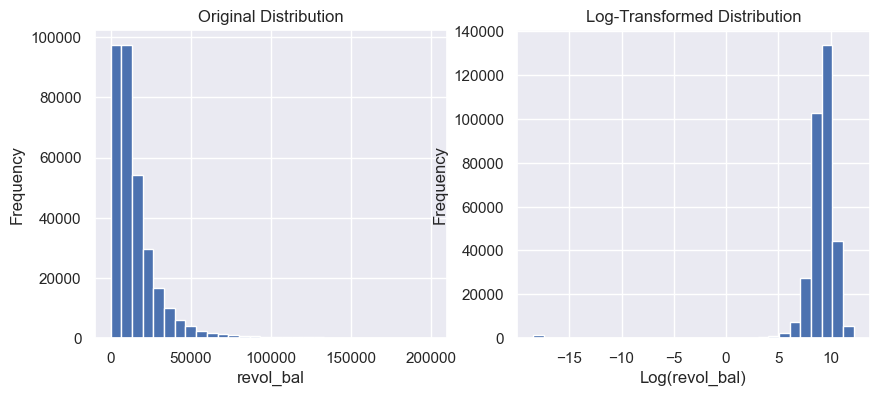

In [257]:
data['revol_bal_log'] = np.log(data['revol_bal'] + 1e-8)


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['revol_bal'], bins=30)
ax[0].set_xlabel('revol_bal')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['revol_bal_log'], bins=30)
ax[1].set_xlabel('Log(revol_bal)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('revol_bal', axis=1, inplace=True)

**Total rev limit**

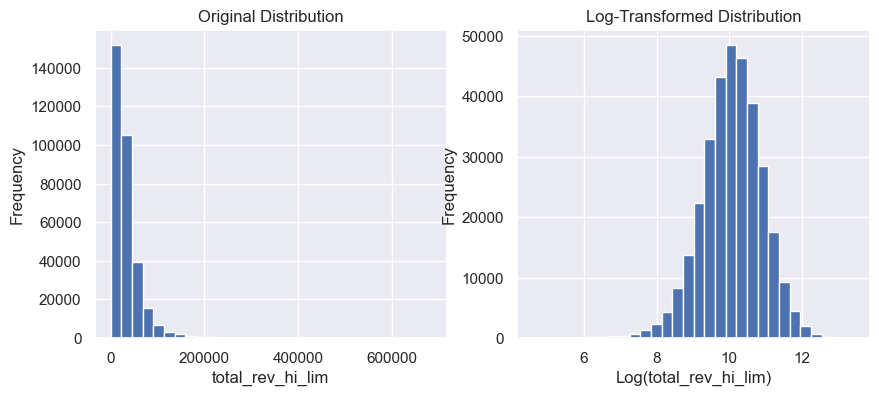

In [258]:
data['total_rev_hi_lim_log'] = np.log(data['total_rev_hi_lim'])


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['total_rev_hi_lim'], bins=30)
ax[0].set_xlabel('total_rev_hi_lim')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['total_rev_hi_lim_log'], bins=30)
ax[1].set_xlabel('Log(total_rev_hi_lim)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('total_rev_hi_lim', axis=1, inplace=True)

## Correlation between categorical features

In [259]:
unique_counts = data.nunique().sort_values(ascending=False)

print("Column Name\tUnique Values")
for column, count in unique_counts.iteritems():
    print(f"{column}\t\t{count}")

Column Name	Unique Values
id		326403
purpose_yield_yearly_encoded		315810
yield_yearly_1		313595
yield_2		311344
total_bal_ex_mort		116534
total_il_high_credit_limit		105553
total_bal_il		96833
revol_bal_log		54521
credit_Utilization_Score		52783
avg_cur_bal		52207
bc_open_to_buy_mean		48697
bc_open_to_buy_med		48697
max_bal_bc		24628
annl_inc_log		22027
total_rev_hi_lim_log		9016
tot_coll_amt		7589
dti		4852
total_bc_limit		4784
revolving_account_opened_ratio		2875
Age_of_credit_history		2037
loan_amnt		1501
pct_tl_nvr_dlq		554
mo_sin_old_il_acct_mean		470
mo_sin_old_il_acct_med		470
mths_since_recent_bc_mean		413
mths_since_recent_bc_med		413
mths_since_rcnt_il_med		323
mths_since_rcnt_il_mean		323
il_util_med		220
il_util		209
all_util		164
int_rate		141
total_acc		122
num_il_tl		97
num_rev_accts		93
percent_bc_gt_75_mean		87
percent_bc_gt_75_med		87
num_sats		69
open_acc		69
num_op_rev_tl		62
num_bc_tl		60
total_cu_tl		53
num_actv_rev_tl		48
acc_open_past_24mths		48
mths_since_rece

In [260]:
'''
making a list of categorical features to test with chi-square test.
'''

cat_corr_df = data[['num_accts_ever_120_pd', 'num_actv_bc_tl', 'open_il_24m', 'mort_acc', 'pub_rec', 'num_tl_op_past_12m',
                    'inq_fi','mths_since_recent_inq_med', 'open_rv_12m', 'delinq_2yrs', 'open_acc_6m', 'open_il_12m',
                    'purpose_yield_over_encoded' , 'emp_length', 'inq_last_6mths_cat',]]


**heatmap of p-values based on the Chi-square test**

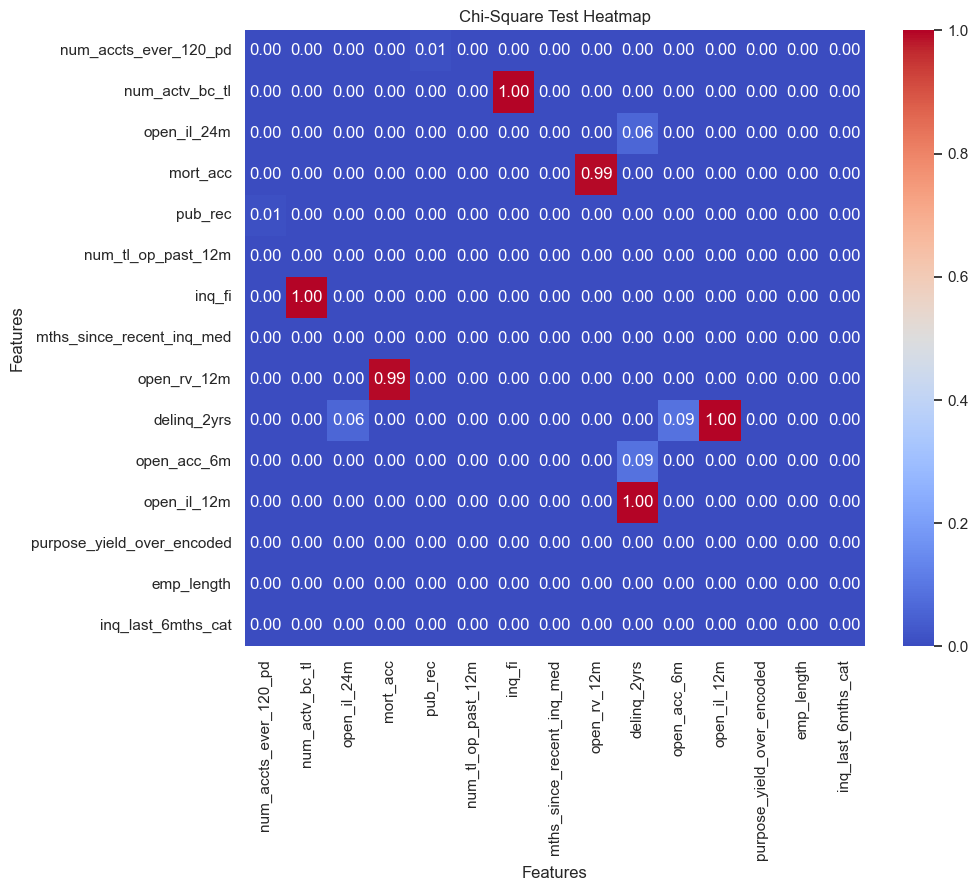

In [261]:
# Assuming you have the 'cat_corr_df' DataFrame with categorical features

# Encode categorical features as categorical data type
cat_corr_df = cat_corr_df.astype('category')

# Create an empty matrix to store the p-values
num_columns = len(cat_corr_df.columns)
p_values_matrix = np.zeros((num_columns, num_columns))

# Calculate p-values for each pair of columns
for i in range(num_columns):
    for j in range(num_columns):
        contingency_table = pd.crosstab(cat_corr_df.iloc[:, i], cat_corr_df.iloc[:, j])
        _, p_value, _, _ = chi2_contingency(contingency_table)
        p_values_matrix[i, j] = p_value

# Create a DataFrame from the p-values matrix
p_values_df = pd.DataFrame(p_values_matrix, index=cat_corr_df.columns, columns=cat_corr_df.columns)

# Create a heatmap of p-values
plt.figure(figsize=(10, 8))
sns.heatmap(p_values_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Chi-Square Test Heatmap")
plt.xlabel("Features")
plt.ylabel("Features")
plt.xticks(rotation=90)
plt.show()


**heatmap of Cramer's V test**

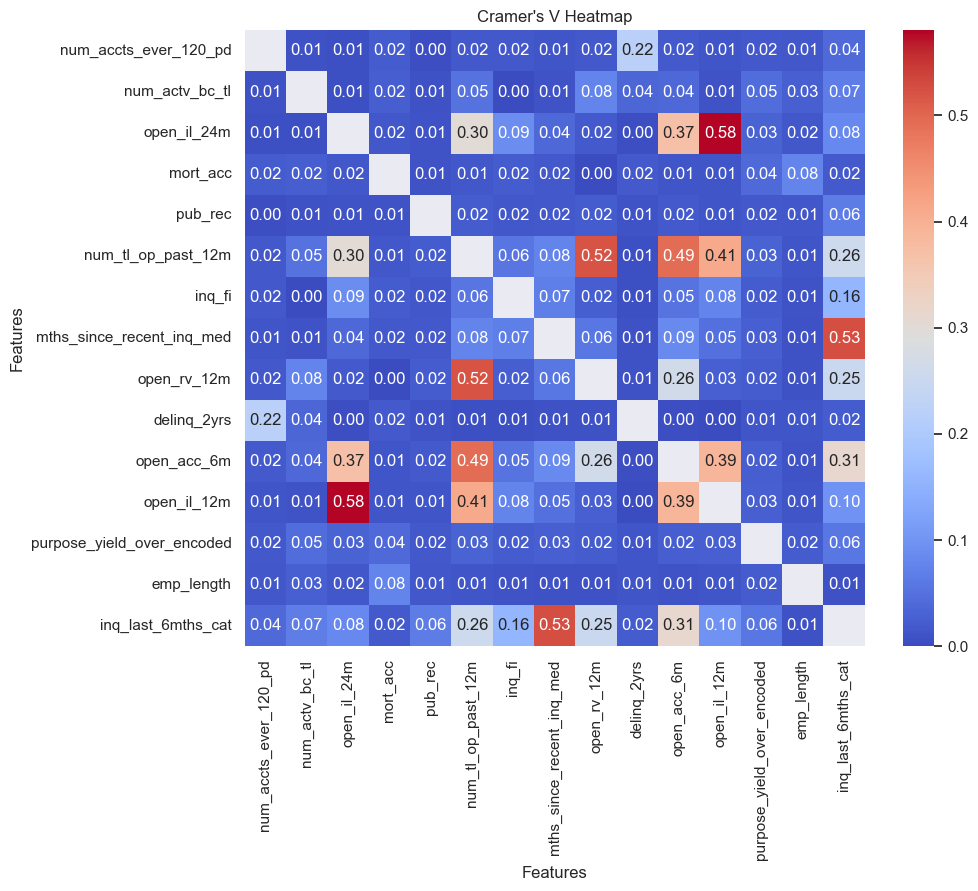

In [262]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# Calculate Cramer's V for all pairs of features
cramer_matrix = pd.DataFrame(index=cat_corr_df.columns, columns=cat_corr_df.columns)

for i in range(len(cat_corr_df.columns)):
    for j in range(i + 1, len(cat_corr_df.columns)):
        feature1 = cat_corr_df.iloc[:, i]
        feature2 = cat_corr_df.iloc[:, j]
        v = cramers_v(feature1, feature2)
        cramer_matrix.iloc[i, j] = v
        cramer_matrix.iloc[j, i] = v

# Convert values in cramer_matrix to numeric
cramer_matrix = cramer_matrix.apply(pd.to_numeric)

# Create heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cramer_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Cramer's V Heatmap")
plt.xlabel("Features")
plt.ylabel("Features")
plt.xticks(rotation=90)
plt.show()

**Open_il_12m and open_il_24m 0.58**

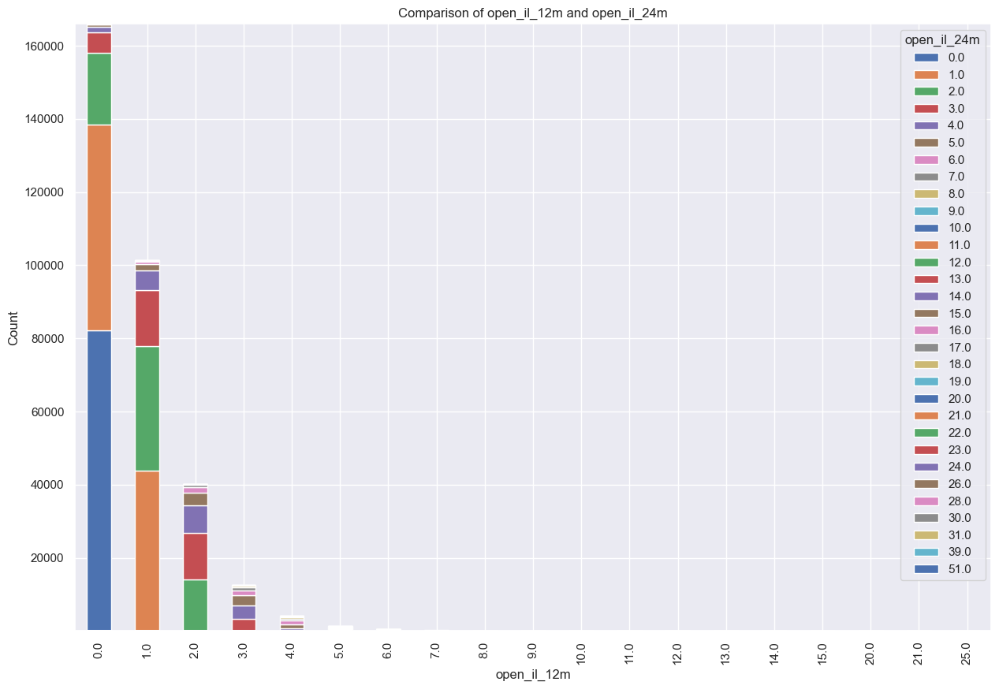

In [263]:
# Create a contingency table
contingency_table = pd.crosstab(data['open_il_12m'], data['open_il_24m'])

# Plot the stacked bar plot
contingency_table.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('open_il_12m')
plt.ylabel('Count')
plt.title('Comparison of open_il_12m and open_il_24m')

# Show the plot
plt.show()

In [264]:
information_gains = calculate_information_gain(data, 'yield_over', 'open_il_12m', 'open_il_24m')
print("Information Gains:")
print(information_gains)

Information Gains:
{'open_il_12m': 0.008342372744142068, 'open_il_24m': 0.009394097963939085}


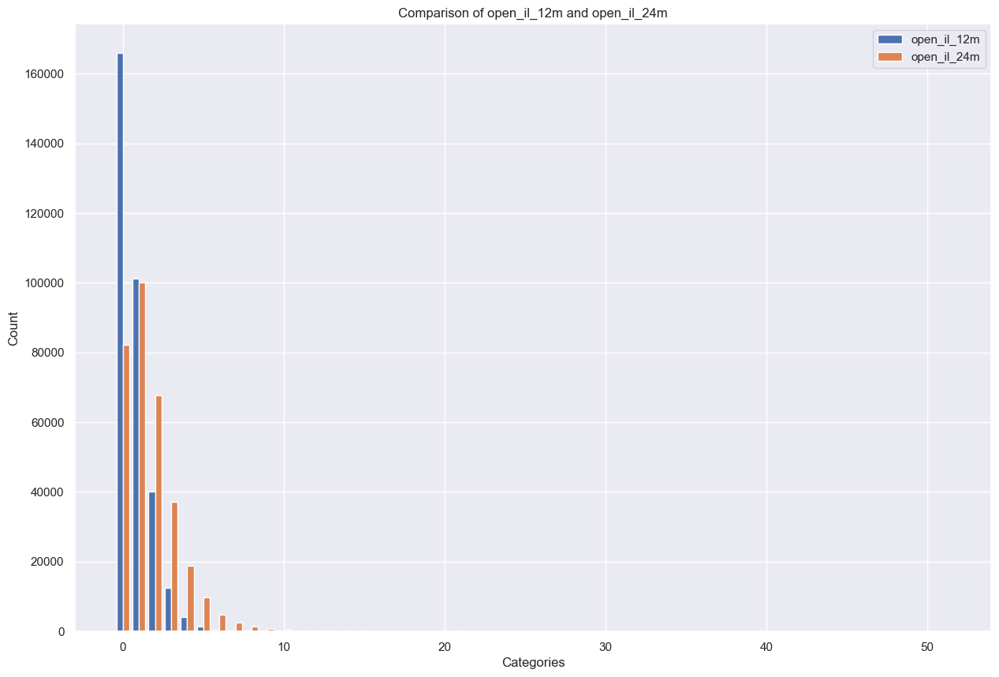

In [265]:
# Assuming you have the 'data' DataFrame with the columns 'open_il_12m' and 'open_il_24m'

# Create frequency tables for each feature
freq_open_il_12m = data['open_il_12m'].value_counts()
freq_open_il_24m = data['open_il_24m'].value_counts()

# Create a bar plot
fig, ax = plt.subplots()
ax.bar(freq_open_il_12m.index - 0.2, freq_open_il_12m.values, width=0.4, label='open_il_12m')
ax.bar(freq_open_il_24m.index + 0.2, freq_open_il_24m.values, width=0.4, label='open_il_24m')

# Add labels and title
ax.set_xlabel('Categories')
ax.set_ylabel('Count')
ax.set_title('Comparison of open_il_12m and open_il_24m')
ax.legend()

# Show the plot
plt.show()


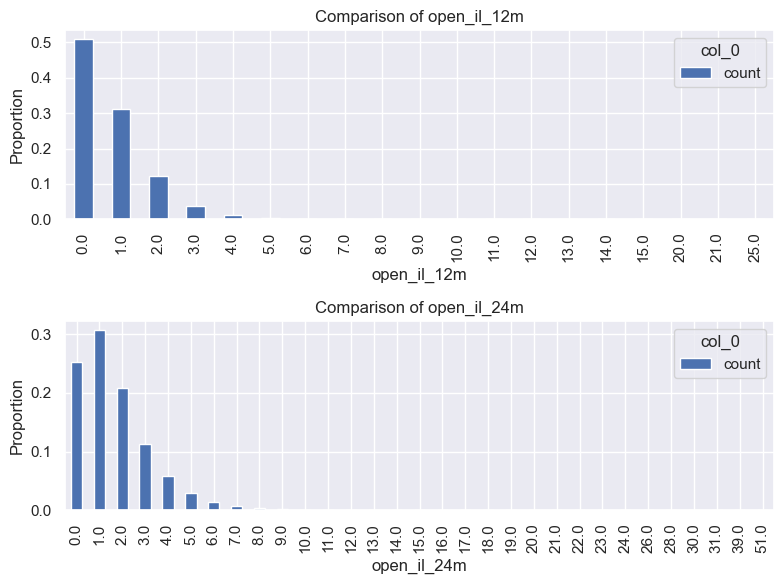

In [266]:
# Assuming you have the 'data' DataFrame with the columns 'open_il_12m' and 'open_il_24m'

# Create contingency tables
contingency_table_12m = pd.crosstab(data['open_il_12m'], columns='count')
contingency_table_24m = pd.crosstab(data['open_il_24m'], columns='count')

# Calculate proportions
proportions_12m = contingency_table_12m / contingency_table_12m.sum()
proportions_24m = contingency_table_24m / contingency_table_24m.sum()

# Create stacked bar plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))
proportions_12m.plot(kind='bar', stacked=True, ax=ax1)
proportions_24m.plot(kind='bar', stacked=True, ax=ax2)

# Add labels and title
ax1.set_ylabel('Proportion')
ax2.set_ylabel('Proportion')
ax1.set_title('Comparison of open_il_12m')
ax2.set_title('Comparison of open_il_24m')

# Show the plots
plt.tight_layout()
plt.show()


In [267]:
data.drop('open_il_12m', axis=1, inplace=True)

**Inq_last_6mths_cat and mths_since_recent_inq_med 0.53**

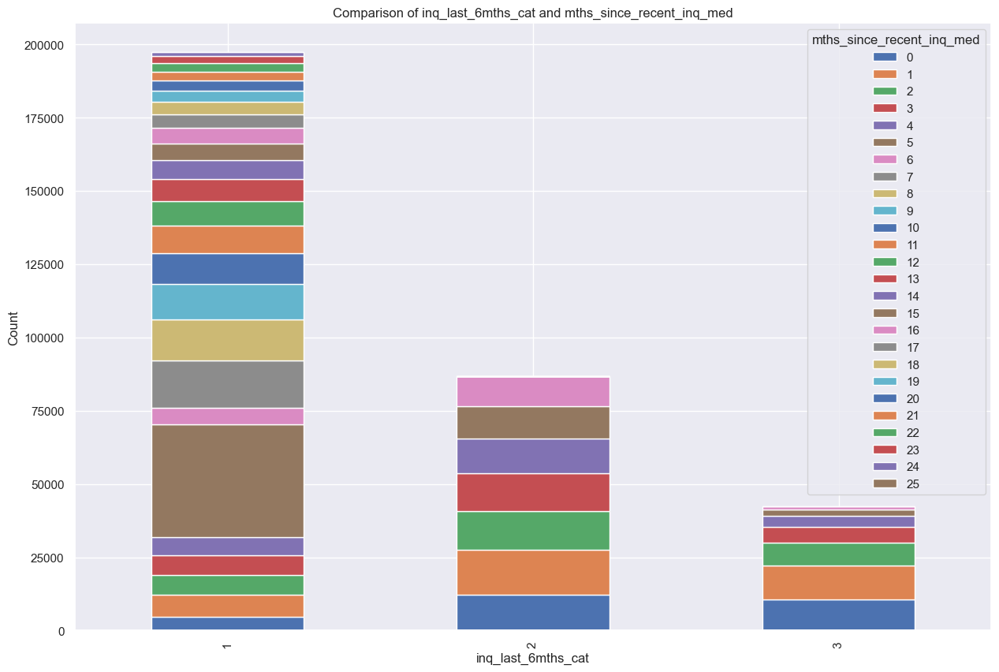

In [268]:
# Assuming you have the 'data' DataFrame with the columns 'inq_last_6mths_cat' and 'mths_since_recent_inq_med'

# Create a contingency table
contingency_table = pd.crosstab(data['inq_last_6mths_cat'], data['mths_since_recent_inq_med'])

# Plot the stacked bar plot
contingency_table.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('inq_last_6mths_cat')
plt.ylabel('Count')
plt.title('Comparison of inq_last_6mths_cat and mths_since_recent_inq_med')

# Show the plot
plt.show()


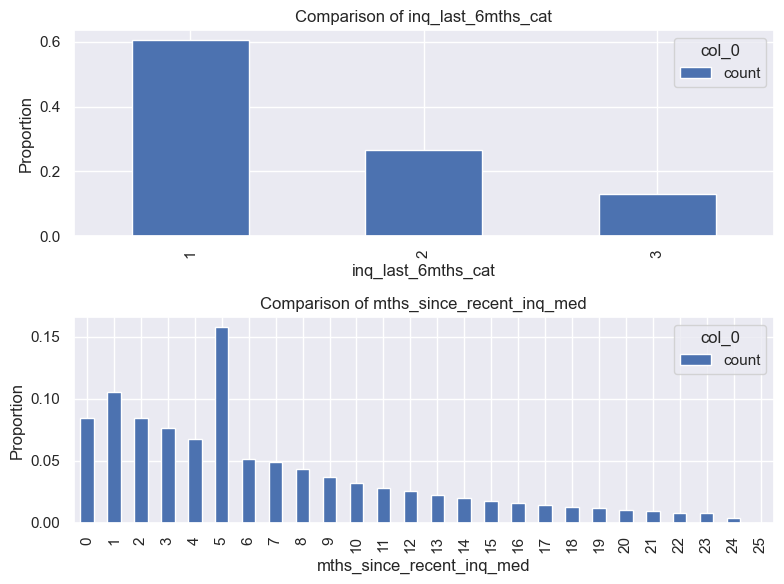

In [269]:
# Create contingency tables
contingency_table_6mths = pd.crosstab(data['inq_last_6mths_cat'], columns='count')
contingency_table_med = pd.crosstab(data['mths_since_recent_inq_med'], columns='count')

# Calculate proportions
proportions_6mths = contingency_table_6mths / contingency_table_6mths.sum()
proportions_med = contingency_table_med / contingency_table_med.sum()

# Create stacked bar plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))
proportions_6mths.plot(kind='bar', stacked=True, ax=ax1)
proportions_med.plot(kind='bar', stacked=True, ax=ax2)

# Add labels and title
ax1.set_ylabel('Proportion')
ax2.set_ylabel('Proportion')
ax1.set_title('Comparison of inq_last_6mths_cat')
ax2.set_title('Comparison of mths_since_recent_inq_med')

# Show the plots
plt.tight_layout()
plt.show()


In [270]:
information_gains = calculate_information_gain(data, 'yield_over', 'inq_last_6mths_cat', 'mths_since_recent_inq_med')
print("Information Gains:")
print(information_gains)

Information Gains:
{'inq_last_6mths_cat': 0.023089863384866627, 'mths_since_recent_inq_med': 0.00434174600555437}


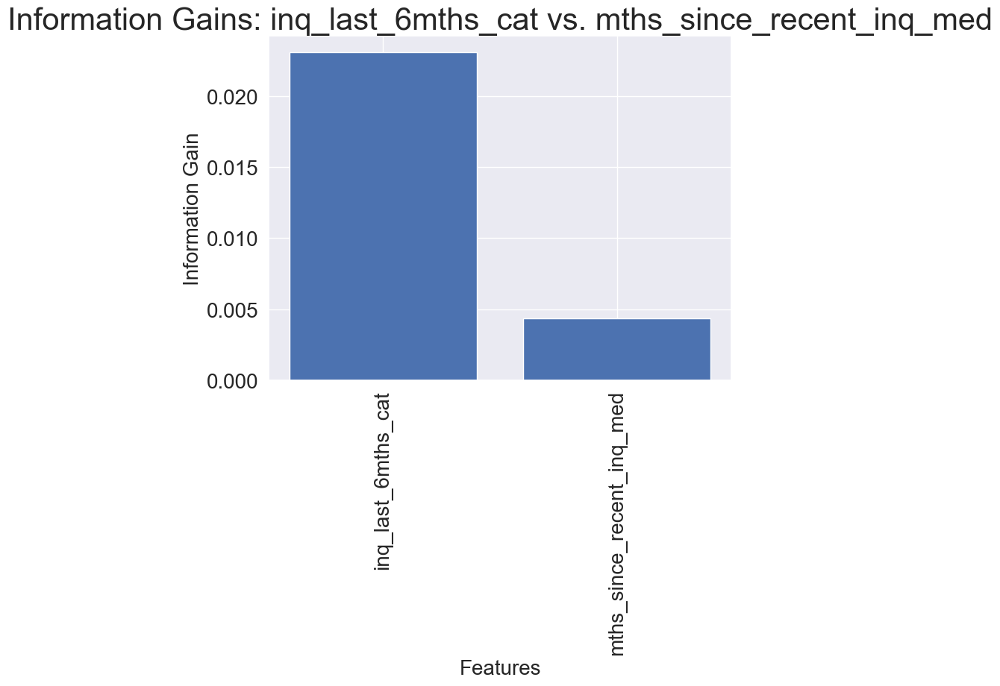

In [271]:

# Plot the information gains as a bar plot
plt.figure(figsize=(8, 6))
plt.bar(information_gains.keys(), information_gains.values())

# Add labels and title with increased font size
plt.xlabel('Features', fontsize=20)
plt.ylabel('Information Gain', fontsize=20)
plt.title('Information Gains: inq_last_6mths_cat vs. mths_since_recent_inq_med', fontsize=30)

# Rotate x-axis labels if needed
plt.xticks(rotation=90)

# Increase tick label font size
plt.tick_params(axis='both', which='major', labelsize=20)

# Show the plot
plt.show()



**open_rv_12m and num_tl_op_past_12m 0.52**

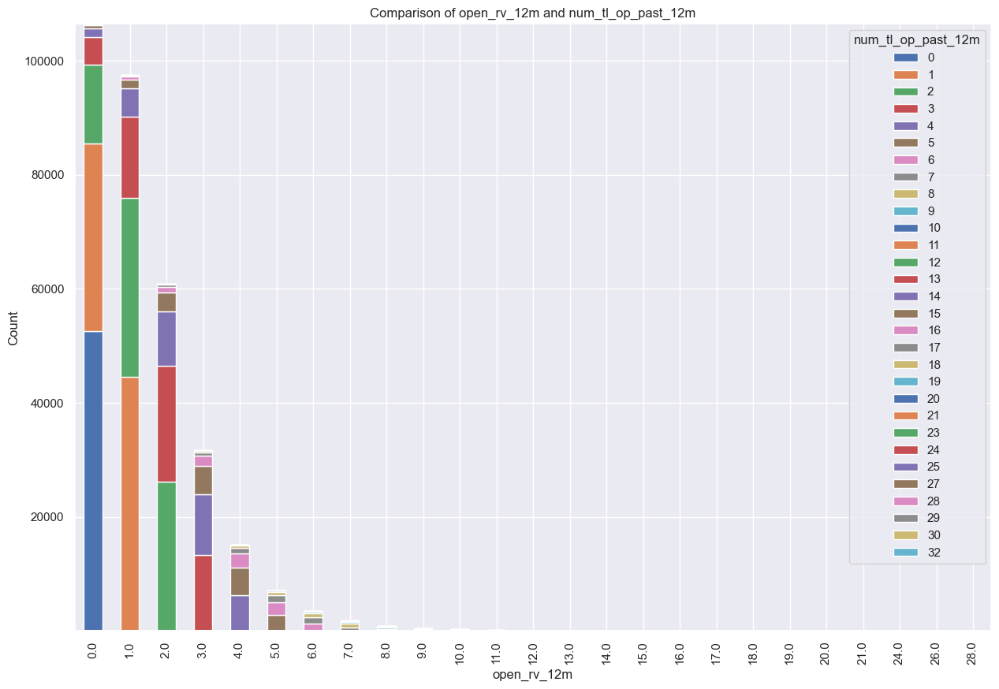

In [272]:
# Create a contingency table
contingency_table = pd.crosstab(data['open_rv_12m'], data['num_tl_op_past_12m'])

# Plot the stacked bar plot
contingency_table.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('open_rv_12m')
plt.ylabel('Count')
plt.title('Comparison of open_rv_12m and num_tl_op_past_12m')

# Show the plot
plt.show()


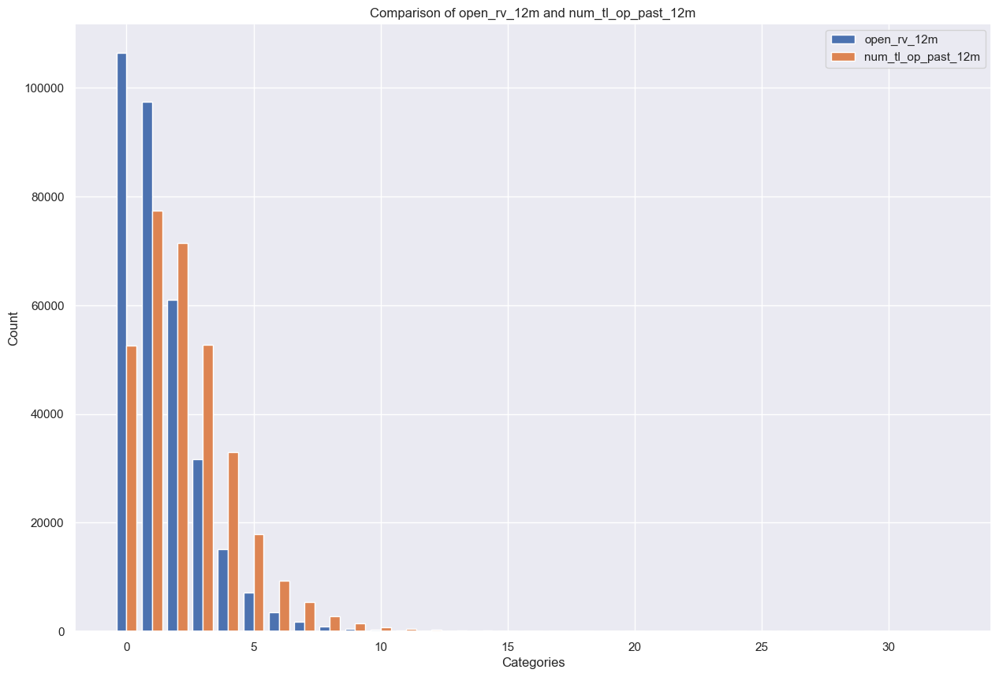

In [273]:
# Create frequency tables for each feature
freq_open_rv_12m = data['open_rv_12m'].value_counts()
freq_num_tl_op_past_12m = data['num_tl_op_past_12m'].value_counts()

# Create a bar plot
fig, ax = plt.subplots()
ax.bar(freq_open_rv_12m.index - 0.2, freq_open_rv_12m.values, width=0.4, label='open_rv_12m')
ax.bar(freq_num_tl_op_past_12m.index + 0.2, freq_num_tl_op_past_12m.values, width=0.4, label='num_tl_op_past_12m')

# Add labels and title
ax.set_xlabel('Categories')
ax.set_ylabel('Count')
ax.set_title('Comparison of open_rv_12m and num_tl_op_past_12m')
ax.legend()

# Show the plot
plt.show()


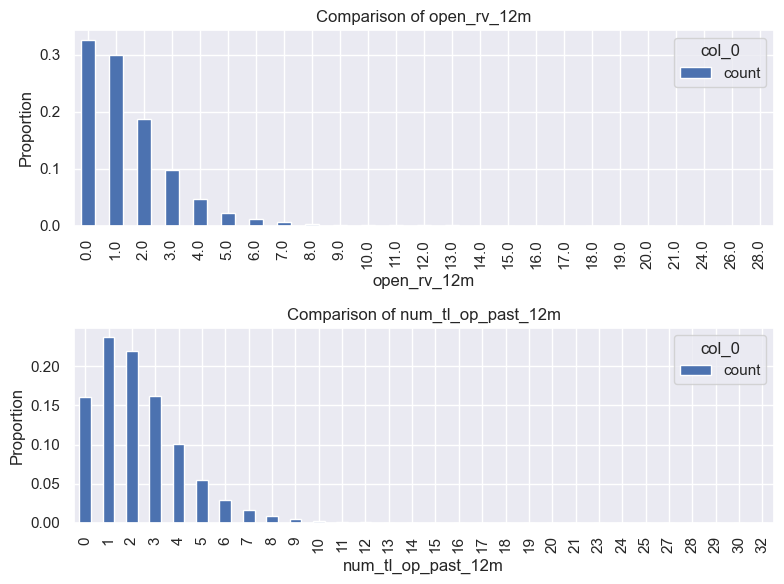

In [274]:
# Create contingency tables
contingency_table_rv_12m = pd.crosstab(data['open_rv_12m'], columns='count')
contingency_table_past_12m = pd.crosstab(data['num_tl_op_past_12m'], columns='count')

# Calculate proportions
proportions_rv_12m = contingency_table_rv_12m / contingency_table_rv_12m.sum()
proportions_past_12m = contingency_table_past_12m / contingency_table_past_12m.sum()

# Create stacked bar plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))
proportions_rv_12m.plot(kind='bar', stacked=True, ax=ax1)
proportions_past_12m.plot(kind='bar', stacked=True, ax=ax2)

# Add labels and title
ax1.set_ylabel('Proportion')
ax2.set_ylabel('Proportion')
ax1.set_title('Comparison of open_rv_12m')
ax2.set_title('Comparison of num_tl_op_past_12m')

# Show the plots
plt.tight_layout()
plt.show()


**Num_tl_op_past_12m and open_acc_6m 0.49**

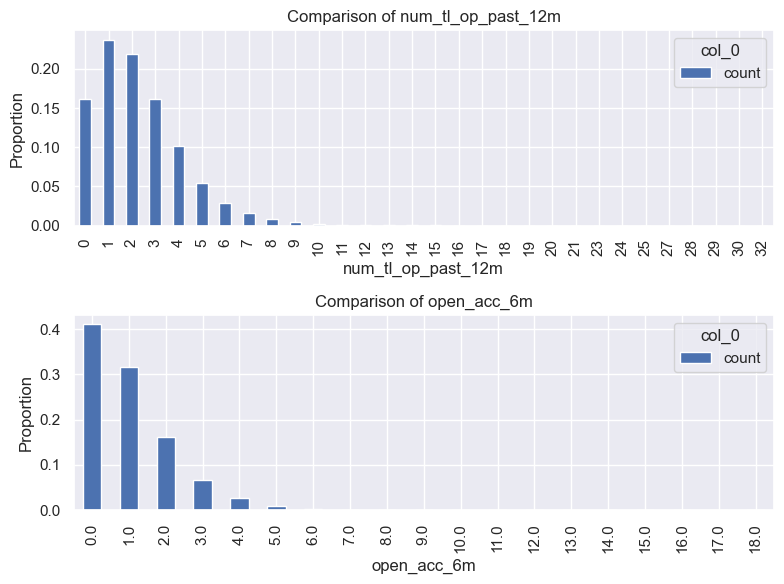

In [275]:
# Assuming you have the 'data' DataFrame with the columns 'num_tl_op_past_12m' and 'open_acc_6m'

# Create contingency tables
contingency_table_12m = pd.crosstab(data['num_tl_op_past_12m'], columns='count')
contingency_table_6m = pd.crosstab(data['open_acc_6m'], columns='count')

# Calculate proportions
proportions_12m = contingency_table_12m / contingency_table_12m.sum()
proportions_6m = contingency_table_6m / contingency_table_6m.sum()

# Create stacked bar plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))
proportions_12m.plot(kind='bar', stacked=True, ax=ax1)
proportions_6m.plot(kind='bar', stacked=True, ax=ax2)

# Add labels and title
ax1.set_ylabel('Proportion')
ax2.set_ylabel('Proportion')
ax1.set_title('Comparison of num_tl_op_past_12m')
ax2.set_title('Comparison of open_acc_6m')

# Show the plots
plt.tight_layout()
plt.show()


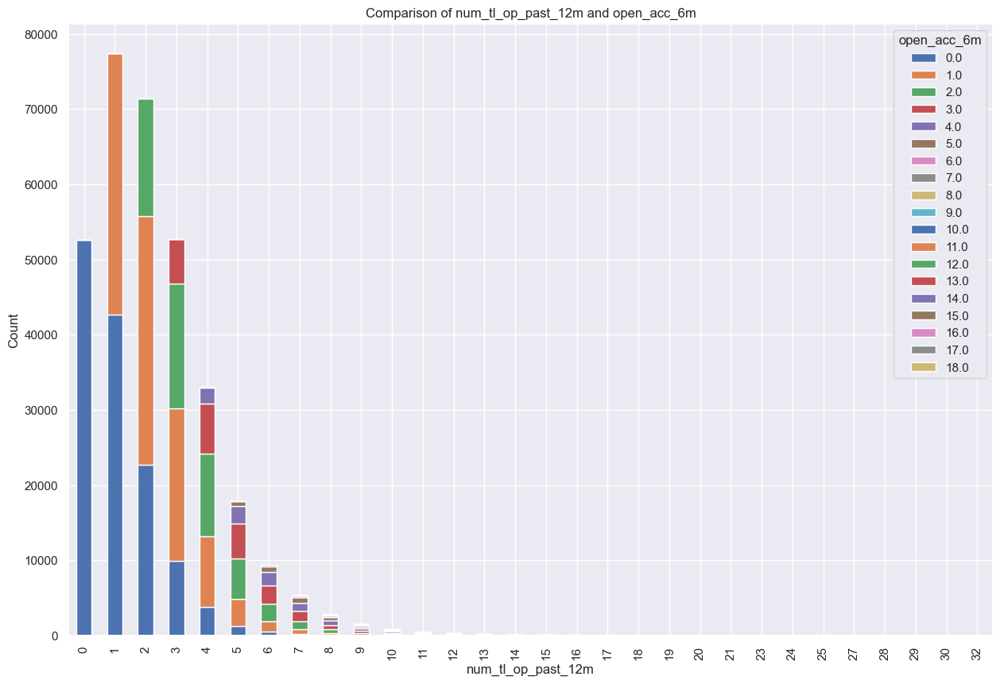

In [276]:
# Create a contingency table
contingency_table = pd.crosstab(data['num_tl_op_past_12m'], data['open_acc_6m'])

# Plot the stacked bar plot
contingency_table.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('num_tl_op_past_12m')
plt.ylabel('Count')
plt.title('Comparison of num_tl_op_past_12m and open_acc_6m')

# Show the plot
plt.show()


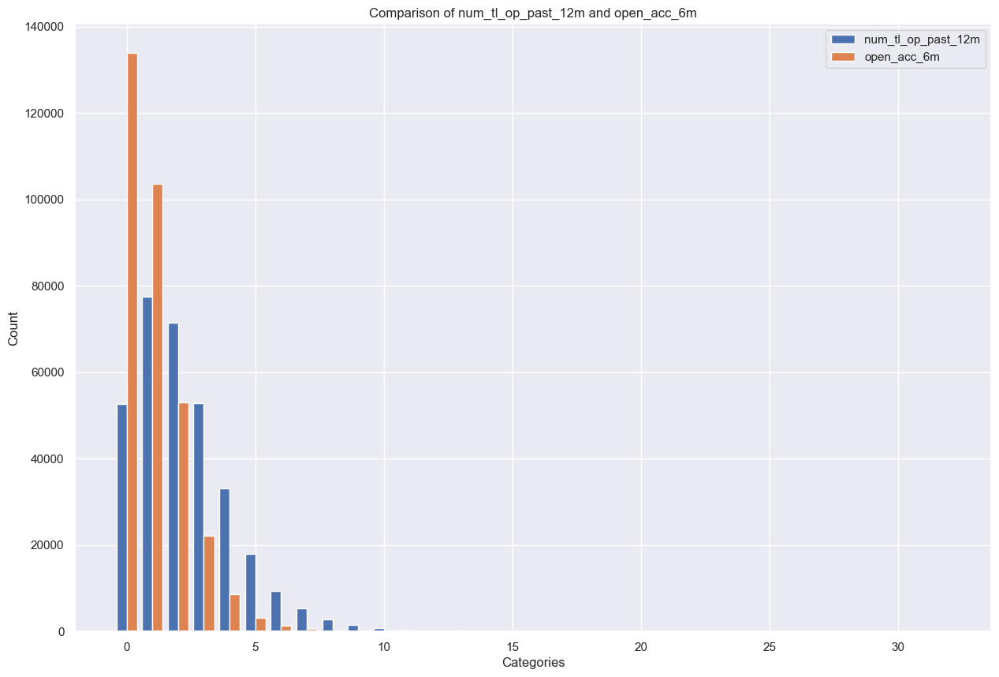

In [277]:
# Create frequency tables for each feature
freq_num_tl_op_past_12m = data['num_tl_op_past_12m'].value_counts()
freq_open_acc_6m = data['open_acc_6m'].value_counts()

# Create a bar plot
fig, ax = plt.subplots()
ax.bar(freq_num_tl_op_past_12m.index - 0.2, freq_num_tl_op_past_12m.values, width=0.4, label='num_tl_op_past_12m')
ax.bar(freq_open_acc_6m.index + 0.2, freq_open_acc_6m.values, width=0.4, label='open_acc_6m')

# Add labels and title
ax.set_xlabel('Categories')
ax.set_ylabel('Count')
ax.set_title('Comparison of num_tl_op_past_12m and open_acc_6m')
ax.legend()

# Show the plot
plt.show()


In [278]:
information_gains = calculate_information_gain(data, 'yield_over', 'num_tl_op_past_12m', 'open_acc_6m')
print("Information Gains:")
print(information_gains)

Information Gains:
{'num_tl_op_past_12m': 0.011160792458154267, 'open_acc_6m': 0.012350949876915429}


In [279]:
data['fico_mean']=(data['fico_range_high']+data['fico_range_low'])/2
data.drop(['fico_range_high','fico_range_low'], axis=1, inplace=True)

file_path = '/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv'

# Write the DataFrame to a CSV file
data.to_csv(file_path, index=False)

# you need to fix here

# Modeling

In [147]:
data= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')

In [148]:
data.shape

(326403, 79)

In [149]:
correlations = data.corr()['yield_yearly_1']
low_correlation_features = []

for feature, correlation in correlations.items():
    if abs(correlation) < 0.015:
        low_correlation_features.append(feature)

print(low_correlation_features)
low_correlation_features.append('yield_yearly_1')

['delinq_2yrs', 'open_acc', 'pub_rec', 'total_acc', 'tot_coll_amt', 'open_act_il', 'total_bal_il', 'max_bal_bc', 'total_cu_tl', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'pct_tl_nvr_dlq', 'total_bal_ex_mort', 'total_il_high_credit_limit', 'has_tax_liens', 'has_past_due_accounts_90g_24m', 'has_pub_rec_bankruptcies', 'mths_since_recent_bc_med', 'mths_since_recent_bc_mean', 'purpose_danger', 'revolving_account_opened_ratio', 'credit_Utilization_Score', 'revol_bal_log']


### skewed distribution
Assessing the distribution of our target variables is crucial in order to construct robust and trustworthy models. We aim to determine whether the distribution is skewed, as this information holds significance in ensuring the authenticity and accuracy of our models.

As we can see the yearly yield variable demonstrated a significantly negative skewness (-40.14), indicating a highly skewed distribution with a long left tail. Additionally, the Shapiro-Wilk test (p < 0.05) revealed a departure from normality-the distribution is skewed

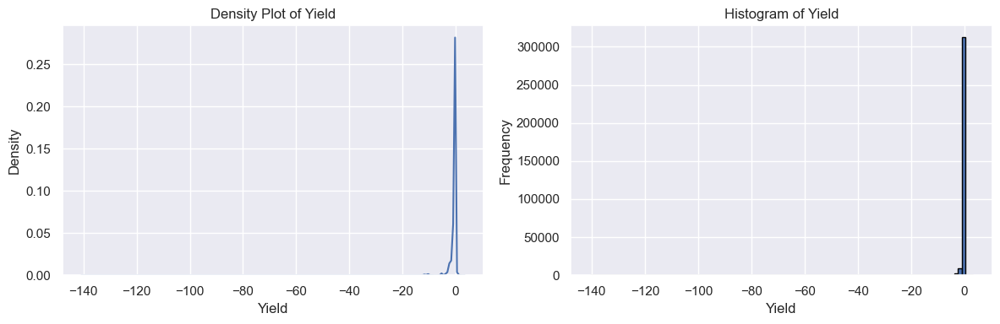

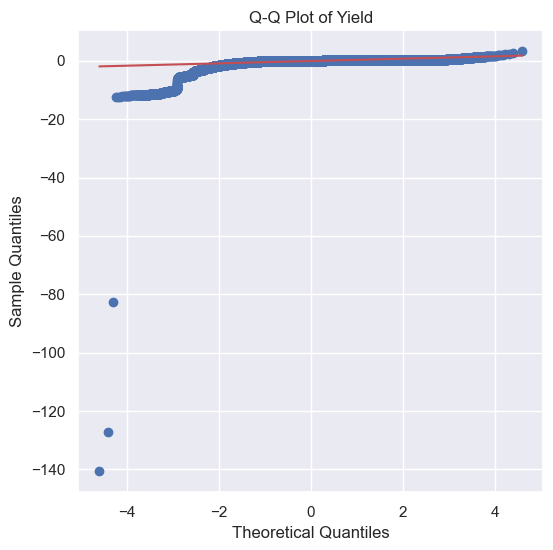

In [150]:
"""
Plots the density plot and histogram of the yield data.
"""
    
plt.figure(figsize=(12, 4))

# Density Plot
plt.subplot(1, 2, 1)
sns.kdeplot(data['yield_yearly_1'])
plt.xlabel('Yield')
plt.ylabel('Density')
plt.title('Density Plot of Yield')

# Histogram
plt.subplot(1, 2, 2)
plt.hist(data['yield_yearly_1'], bins=100, edgecolor='black')
plt.xlabel('Yield')
plt.ylabel('Frequency')
plt.title('Histogram of Yield')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

# Plotting Q-Q plot
plt.figure(figsize=(6, 6))
stats.probplot(data['yield_yearly_1'], plot=plt)
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.title('Q-Q Plot of Yield')
plt.show()


In [151]:
"""
Performs the Shapiro-Wilk test for normality on the given data.
"""

warnings.filterwarnings("ignore", message="p-value may not be accurate for N > 5000.")

# Your code
skewness = stats.skew(data['yield_yearly_1'])
print("Skewness:", skewness)

_, p_value = stats.shapiro(data['yield_yearly_1'])
print("Shapiro-Wilk p-value:", p_value)

Skewness: -40.13921158421023
Shapiro-Wilk p-value: 0.0


As we can see 78.8% of the data belongs to the over 2% yield group - the distribution is skewed

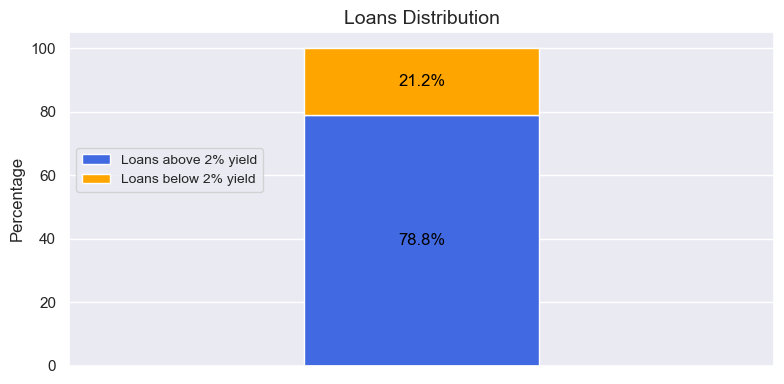

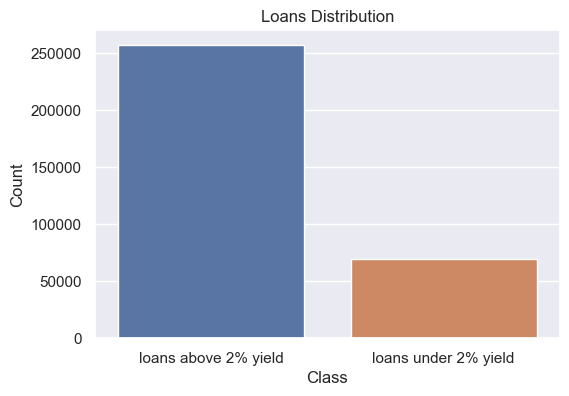

We have 257230 loans above 2% yield (21.2%) 69173 loans below 2% yield (78.8%)


In [152]:
"""
Plots the distribution of loans above and below 2% yield.
"""

counts = data['yield_over'].value_counts()
above_per = counts[1] / data.shape[0] * 100
below_per = counts[0] / data.shape[0] * 100

colors = ['royalblue', 'orange']  # Color for each bar
labels = ['Loans above 2% yield', 'Loans below 2% yield']  # Label for each bar

fig, ax = plt.subplots(figsize=(8, 4))

ax.bar(0, above_per, width=0.8, color=colors[0], label=labels[0])
ax.bar(0, below_per, bottom=above_per, width=0.8, color=colors[1], label=labels[1])

ax.set_title("Loans Distribution", fontsize=14)
ax.set_ylabel("Percentage", fontsize=12)

# Remove x-axis ticks and labels
ax.set_xticks([])
ax.set_xticklabels([])

# Adjust plot margins
plt.margins(x=1)

# Move legend outside the plot
ax.legend(fontsize=10, loc='lower left', bbox_to_anchor=(0, 0.5))

# Add labels to the percentages
ax.text(0, above_per/2, f'{above_per:.1f}%', ha='center', va='center', color='black', fontsize=12)
ax.text(0, above_per + below_per/2, f'{below_per:.1f}%', ha='center', va='center', color='black', fontsize=12)

plt.tight_layout()
plt.show()


plt.figure(figsize=(6, 4))
sns.barplot(x=['loans above 2% yield','loans under 2% yield'], y=counts.values)
plt.title("Loans Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

print("We have", counts[1], "loans above 2% yield (" f'{below_per:.1f}%'")", counts[0] ,"loans below 2% yield ("f'{above_per:.1f}%'")")


## Classification models 
The classification model is built to identify loans with a yield over 2% in order to focus on potentially lucrative investments. By classifying loans based on their yield, we can select high-yield opportunities that have the potential to generate higher returns for clients. This approach allows us to filter out loans with lower yields and prioritize investments that align with the current annual realized returns of GreatYields. By leveraging the classification model, we aim to enhance client returns and provide them with investment opportunities that have a higher likelihood of being profitable.

In [153]:
Data_Classifier= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_Classifier.drop(['id','loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)



In [154]:
"""
Calculate the percentage of loans over 2% yield and under 2% yield by grade.
"""

# Calculate the percentage of loans over 2% yield by grade
yield_over_2_percent = data[data['yield_over'] == 1].groupby('grade').size()
total_loans_by_grade = data.groupby('grade').size()
percentage_yield_over_2 = (yield_over_2_percent / total_loans_by_grade) * 100

# Calculate the percentage of loans over 2%
yield_under_2_percent = data[data['yield_over'] == 0].groupby('grade').size()
total_loans_by_grade = data.groupby('grade').size()
percentage_yield_under_2 = (yield_under_2_percent / total_loans_by_grade) * 100

# Create a new DataFrame with the desired columns
table_data = pd.DataFrame({
    'grade': percentage_yield_over_2.index,
    'percentage of loans over 2% yield': percentage_yield_over_2.values,
    'percentage of loans under 2% yield': percentage_yield_under_2.values
})

print(table_data)

  grade  percentage of loans over 2% yield  percentage of loans under 2% yield
0     A                          93.251883                            6.748117
1     B                          85.122358                           14.877642
2     C                          75.875388                           24.124612
3     D                          66.893362                           33.106638
4     E                          58.561380                           41.438620
5     F                          49.317336                           50.682664
6     G                          45.901639                           54.098361


### Logistic Regression
Logistic Regression selected due to its simplicity, interpretability, and robustness in capturing the relationship between input variables and class probabilities. Forward selection was employed to identify the most relevant variables, while the class_weight argument addressed the imbalanced distribution. Various hyperparameter combinations and normalization techniques were tested to optimize the model, with the evaluation based on achieving high F1 scores. Additionally, k-fold cross-validation (k=5) was utilized for reliable model assessment. For further information on the model and methodology, refer to Appendix D, and Appendix E presents the model results.

In [155]:
Data_LG= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_LG.drop(columns=low_correlation_features, inplace=True)
Data_LG.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)

In [156]:
X = Data_LG.drop(columns=['yield_over']).values
y = Data_LG['yield_over'].values

In the next codes we perform feature preselection using forward selection to identify the most relevant predictor variables. We explore different values for the number of features (k_features) to balance model complexity and performance. Hyperparameter tuning is conducted on three key hyperparameters (n_iter, eps, penalty) to optimize the model. Evaluation is done using k-fold cross-validation with the F1 score as the evaluation metric. Skewness in the data is handled using the 'class_weight' argument, and the model's performance is assessed at different classification thresholds. The results of the best logistic regression model, including hyperparameter combinations, selected features, thresholds, and F1 scores, are presented in Appendix E for insights and decision-making.

In [157]:
def forward_selection(X, y, model,k):
    """
    Performs forward feature selection using sequential feature selection.

    Parameters:
        X (array-like): The feature matrix.
        y (array-like): The target variable.
        model: The supervised learning model used for feature selection.
        k (int): The number of features to select.

    Returns:
        list: A list of indices corresponding to the selected features.

    """

    X_train, _, y_train, _ = train_test_split(X, y, test_size=0.3, random_state=42)
        
    feature_selector = SequentialFeatureSelector(model, k_features= k, forward=True, scoring='f1_weighted', cv=2)
    feature_selector.fit(X_train, y_train)
    
    selected_features = list(feature_selector.k_feature_idx_)
    
    return selected_features

Checking the best model hyperparamters for 80:20 and 70:30 train:test ratio
<br>
**70:30 ratio**

In [503]:
"""
    Implements a logistic regression model with hyperparameter tuning and feature selection.

    Returns:
        tuple: A tuple containing the best hyperparameters and features for both MinMaxScaler and StandardScaler,
               as well as the corresponding F1 scores.

    Docstring:
    The function builds a logistic regression model with hyperparameter tuning and feature selection.
    It performs the following steps:
    1. Initializes scaler objects for MinMaxScaler and StandardScaler.
    2. Defines the hyperparameter values to explore for n_iter, eps, penalty, and threshold.
    3. Generates a random sample of hyperparameter combinations from n_iter, eps, and penalty.
    4. Initializes dictionaries to store the F1 scores for each hyperparameter combination.
    5. Iterates over different feature numbers (k) and performs forward selection to select the best features.
    6. For each hyperparameter combination, iterates over thresholds and performs 5-fold cross-validation.
    7. Scales the training and validation data using MinMaxScaler and StandardScaler.
    8. Builds logistic regression models with the specified hyperparameters and class weights.
    9. Calculates the F1 scores for validation data based on the predicted probabilities and thresholds.
    10. Stores the average F1 scores for each hyperparameter combination in the dictionaries.
    11. Calculates the best hyperparameters and features for both MinMaxScaler and StandardScaler based on the maximum F1 scores.
    12. Returns a tuple containing the best hyperparameters and features for MinMaxScaler and StandardScaler, along with the F1 scores.
"""

scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

n_iter = [1000, 2000,5000]
epss = [0.01, 0.001, 0.0001,0.00001, 0.000001]
penalties = ['l1', 'l2']
thresholds = [0.40,0.50,0.60]
feat_num=[10,15,20]
n_iter_epss_penalties_combinations = list(itertools.product(n_iter, epss, penalties))

n_iter_epss_penalties_combinations = random.sample(n_iter_epss_penalties_combinations, 5)

dic_minmax = {}
dic_std = {}

for k in feat_num:
    model = LogisticRegression(solver='liblinear', penalty="l2", class_weight='balanced')
    selected_features = forward_selection(X, y, model, k)
    
    for com in n_iter_epss_penalties_combinations:
        n_iter, eps, penalty = com
        
        for threshold in thresholds:
            dic_std[n_iter,eps,penalty,tuple(selected_features),threshold]=0
            dic_minmax[n_iter,eps,penalty,tuple(selected_features),threshold]=0

            for fold in range(5): 
                rel_X = X[:,selected_features]
                indices = np.random.permutation(rel_X.shape[0])
                idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
                X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
                y_train, y_val = y[idx_train], y[idx_val]

                X_train_scaled_std = scaler_std.fit_transform(X_train)
                X_val_scaled_std = scaler_std.transform(X_val)

                X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
                X_val_scaled_minmax = scaler_minmax.transform(X_val)

                model_std=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')
                model_minmax=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')

                model_std.fit(X_train_scaled_std, y_train)
                model_minmax.fit(X_train_scaled_minmax, y_train)

                y_prob = model_std.predict_proba(X_val_scaled_std)
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')

                dic_std[n_iter,eps,penalty,tuple(selected_features),threshold]+=F1_score

                y_prob = model_minmax.predict_proba(X_val_scaled_minmax)
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')

                dic_minmax[n_iter,eps,penalty,tuple(selected_features),threshold]+=F1_score

            dic_minmax[n_iter,eps,penalty,tuple(selected_features),threshold]/=5
            dic_std[n_iter,eps,penalty,tuple(selected_features),threshold]/=5

best_n_iter_std,best_eps_std,best_penalty_std,best_features_std,best_threshold_std=max(dic_std,key=dic_std.get) 
best_n_iter_minmax,best_eps_minmax,best_penalty_minmax,best_features_minmax,best_threshold_minmax=max(dic_minmax,key=dic_minmax.get) 

**checking for 20:80 ratio**

In [504]:
"""
    Implements a logistic regression model with hyperparameter tuning and feature selection.

    Returns:
        tuple: A tuple containing the best hyperparameters and features for both MinMaxScaler and StandardScaler,
               as well as the corresponding F1 scores.

    Docstring:
    The function builds a logistic regression model with hyperparameter tuning and feature selection.
    It performs the following steps:
    1. Initializes scaler objects for MinMaxScaler and StandardScaler.
    2. Defines the hyperparameter values to explore for n_iter, eps, penalty, and threshold.
    3. Generates a random sample of hyperparameter combinations from n_iter, eps, and penalty.
    4. Initializes dictionaries to store the F1 scores for each hyperparameter combination.
    5. Iterates over different feature numbers (k) and performs forward selection to select the best features.
    6. For each hyperparameter combination, iterates over thresholds and performs 5-fold cross-validation.
    7. Scales the training and validation data using MinMaxScaler and StandardScaler.
    8. Builds logistic regression models with the specified hyperparameters and class weights.
    9. Calculates the F1 scores for validation data based on the predicted probabilities and thresholds.
    10. Stores the average F1 scores for each hyperparameter combination in the dictionaries.
    11. Calculates the best hyperparameters and features for both MinMaxScaler and StandardScaler based on the maximum F1 scores.
    12. Returns a tuple containing the best hyperparameters and features for MinMaxScaler and StandardScaler, along with the F1 scores.
"""
    
scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

n_iter = [1000, 2000]
epss = [0.01, 0.0001, 0.000001]
penalties = ['l1', 'l2']
thresholds = [0.40,0.50,0.60]
feat_num=[10,15,20]
n_iter_epss_penalties_combinations = list(itertools.product(n_iter, epss, penalties))

n_iter_epss_penalties_combinations = random.sample(n_iter_epss_penalties_combinations, 5)

dic_minmax_more = {}
dic_std_more = {}

for k in feat_num:
    model =LogisticRegression(solver='liblinear', penalty="l2" ,class_weight='balanced')
    selected_features=forward_selection(X, y, model,k)

    for com in n_iter_epss_penalties_combinations:
        n_iter, eps, penalty = com
        for threshold in thresholds:
            dic_std_more[n_iter,eps,penalty,tuple(selected_features),threshold]=0
            dic_minmax_more[n_iter,eps,penalty,tuple(selected_features),threshold]=0

            for fold in range(5): 
                rel_X = X[:,selected_features]
                indices = np.random.permutation(rel_X.shape[0])
                idx_train, idx_val = indices[:int(0.8*rel_X.shape[0])], indices[int(0.8*rel_X.shape[0]):]
                X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
                y_train, y_val = y[idx_train], y[idx_val]

                X_train_scaled_std = scaler_std.fit_transform(X_train)
                X_val_scaled_std = scaler_std.transform(X_val)

                X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
                X_val_scaled_minmax = scaler_minmax.transform(X_val)

                model_std=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')
                model_minmax=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')

                model_std.fit(X_train_scaled_std, y_train)
                model_minmax.fit(X_train_scaled_minmax, y_train)

                y_prob = model_std.predict_proba(X_val_scaled_std)
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')

                dic_std_more[n_iter,eps,penalty,tuple(selected_features),threshold]+=F1_score

                y_prob = model_minmax.predict_proba(X_val_scaled_minmax)
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')

                dic_minmax_more[n_iter,eps,penalty,tuple(selected_features),threshold]+=F1_score
            
            dic_minmax_more[n_iter,eps,penalty,tuple(selected_features),threshold]/=5
            dic_std_more[n_iter,eps,penalty,tuple(selected_features),threshold]/=5

        
best_n_iter_std_more,best_eps_std_more,best_penalty_std_more,best_features_std_more,best_threshold_std_more=max(dic_std_more,key=dic_std_more.get) 
best_n_iter_minmax_more,best_eps_minmax_more,best_penalty_minmax_more,best_features_minmax_more,best_threshold_minmax_more=max(dic_minmax_more,key=dic_minmax_more.get) 

Because each run produced different results, I will manually save the results and work on them later in the project.

In [517]:
n_iter=5000
eps=1e-06
penalty='l2'
selected_features_list=[0, 1, 2, 4, 6, 7, 11, 12, 13, 14, 16, 17, 18, 19]
threshold=0.4

Compares on the best parameters the division into 20:80 and 70:30.

**70:30 ratio**

In [518]:
"""
Evaluates a logistic regression model using cross-validation and calculates performance metrics.

Args:
    X (numpy.ndarray): The input feature matrix.
    y (numpy.ndarray): The target variable vector.
    selected_features_list (list): List of selected features.
    scaler (sklearn.preprocessing.Scaler): Scaler object for feature scaling.
    n_iter (int): Maximum number of iterations for logistic regression.
    eps (float): Tolerance for convergence of logistic regression.
    penalty (str): Penalty type for logistic regression.
    threshold (float): Classification threshold for logistic regression.

Returns:
    dict: A dictionary containing the weighted F1 score, weighted recall, weighted precision, and weighted accuracy.

Docstring:
The function evaluates a logistic regression model using cross-validation and calculates performance metrics.
It performs the following steps:
    1. Initializes variables to store the total weighted F1 score, weighted recall, weighted precision, and weighted accuracy.
    2. Performs 5-fold cross-validation by splitting the data into training and validation sets.
    3. Scales the training and validation data using the specified scaler.
    4. Builds a logistic regression model with the specified hyperparameters and class weights.
    5. Predicts probabilities and assigns class labels based on the specified threshold.
    6. Calculates the weighted F1 score, weighted recall, weighted precision, and weighted accuracy for each fold.
    7. Calculates the average performance metrics over all folds.
    8. Returns a dictionary containing the average weighted F1 score, weighted recall, weighted precision, and weighted accuracy.
"""
    
scaler = MinMaxScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    model = LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty, class_weight='balanced')

    model.fit(X_train_scaled, y_train)

    y_prob = model.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= threshold).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}

**80:20 ratio**

In [519]:
"""
Evaluates a logistic regression model using cross-validation and calculates performance metrics.

Args:
    X (numpy.ndarray): The input feature matrix.
    y (numpy.ndarray): The target variable vector.
    selected_features_list (list): List of selected features.
    scaler (sklearn.preprocessing.Scaler): Scaler object for feature scaling.
    n_iter (int): Maximum number of iterations for logistic regression.
    eps (float): Tolerance for convergence of logistic regression.
    penalty (str): Penalty type for logistic regression.
    threshold (float): Classification threshold for logistic regression.

Returns:
    dict: A dictionary containing the weighted F1 score, weighted recall, weighted precision, and weighted accuracy.

Docstring:
The function evaluates a logistic regression model using cross-validation and calculates performance metrics.
It performs the following steps:
    1. Initializes variables to store the total weighted F1 score, weighted recall, weighted precision, and weighted accuracy.
    2. Performs 5-fold cross-validation by splitting the data into training and validation sets.
    3. Scales the training and validation data using the specified scaler.
    4. Builds a logistic regression model with the specified hyperparameters and class weights.
    5. Predicts probabilities and assigns class labels based on the specified threshold.
    6. Calculates the weighted F1 score, weighted recall, weighted precision, and weighted accuracy for each fold.
    7. Calculates the average performance metrics over all folds.
    8. Returns a dictionary containing the average weighted F1 score, weighted recall, weighted precision, and weighted accuracy.
"""

scaler = MinMaxScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.8 * rel_X.shape[0])], indices[int(0.8 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    model = LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty, class_weight='balanced')

    model.fit(X_train_scaled, y_train)

    y_prob = model.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= threshold).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results1 = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}

In [520]:
"""
Creates a performance comparison table between two logistic regression models.

Args:
    dic_results1 (dict): Dictionary containing performance metrics of the first logistic regression model.
    dic_results (dict): Dictionary containing performance metrics of the second logistic regression model.

Returns:
        pandas.DataFrame: A DataFrame representing the performance comparison table.

Docstring:
The function creates a performance comparison table between two logistic regression models.
    It performs the following steps:
    1. Defines the table data as a list of lists, including the performance metrics and model names.
    2. Converts the table data into a DataFrame.
    3. Converts the numeric columns to the numeric data type.
    4. Applies styling to the DataFrame, highlighting the minimum and maximum values.
    5. Sets the caption for the styled table.
    6. Returns the styled DataFrame representing the performance comparison table.
"""

table_data = [
    ['', 'LG by 80:20', 'LG by 70:30'],
    ['F1', dic_results1['weighted_f1'], dic_results['weighted_f1']],
    ['recall', dic_results1['weighted_recall'], dic_results['weighted_recall']],
    ['precision', dic_results1['weighted_precision'], dic_results['weighted_precision']],
    ['accuracy', dic_results1['weighted_accuracy'], dic_results['weighted_accuracy']]
]

df = pd.DataFrame(table_data[1:], columns=table_data[0])

df['LG by 80:20'] = pd.to_numeric(df['LG by 80:20'], errors='coerce')
df['LG by 70:30'] = pd.to_numeric(df['LG by 70:30'], errors='coerce')

styled_table = df.style.apply(lambda x: ['background-color: lightcoral' if x[i] == np.min(x) else 'background-color: lightgreen' if x[i] == np.max(x) else '' for i in range(len(x))], axis=1, subset=['LG by 80:20', 'LG by 70:30']) \
    .set_caption('Logistic Regression Performance Comparison')

styled_table


,,LG by 80:20,LG by 70:30
0,F1,0.721911,0.723081
1,recall,0.738432,0.739386
2,precision,0.710402,0.711693
3,accuracy,0.738432,0.739386


In order to choose the best normalization form I will look at the qq and the boxplot of each features

In [521]:
def QQ_box_plots(feature_name):
    """
    Generate QQ plot and box plot for a given feature.
    Parameters:
        feature_name (str): Name of the feature to generate plots for.
    """
    
    values = data[feature_name]
    
    # Generate QQ plot
    qqplot_data = qqplot(values, line='s')
    plt.title('QQ Plot for ' + feature_name)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.show()

    # Generate box plot
    plt.boxplot(values)
    plt.title('Box Plot for ' + feature_name)
    plt.xlabel(feature_name)
    plt.ylabel('Values')
    plt.show()

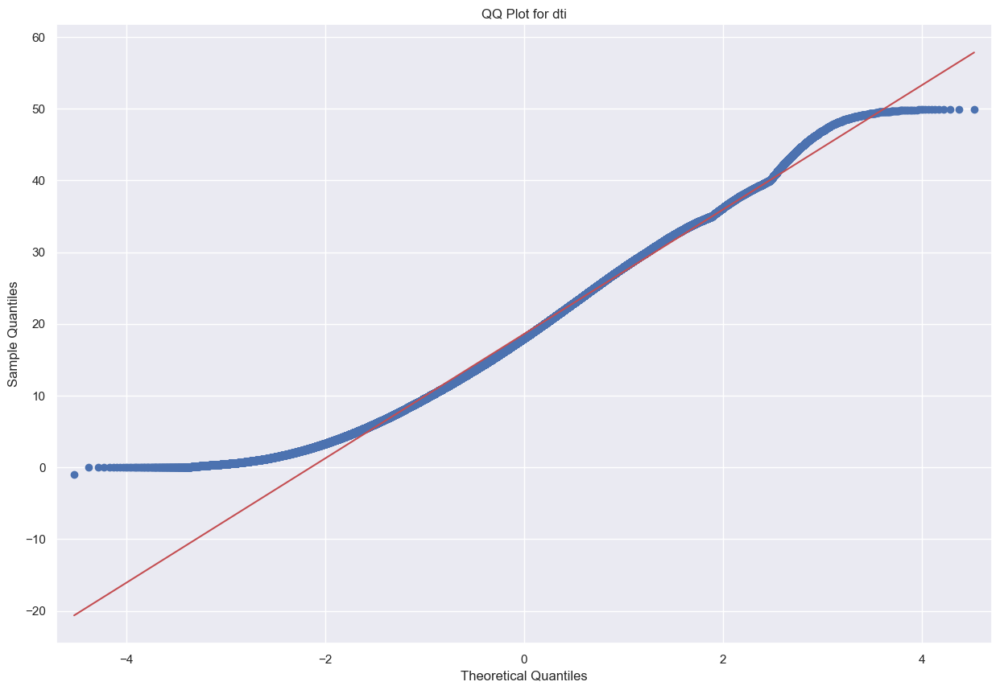

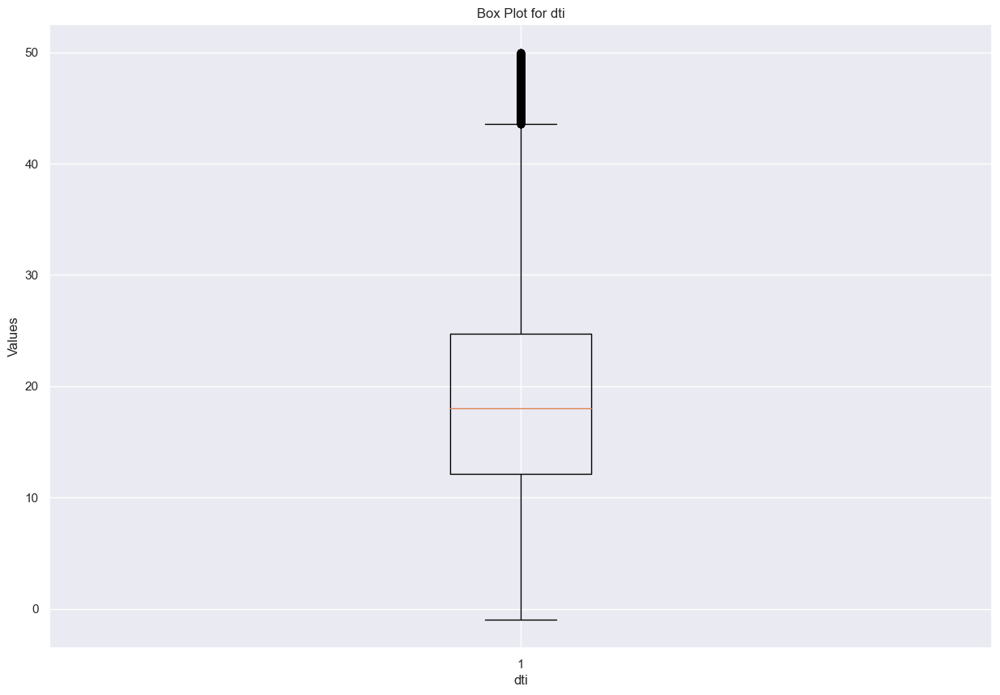

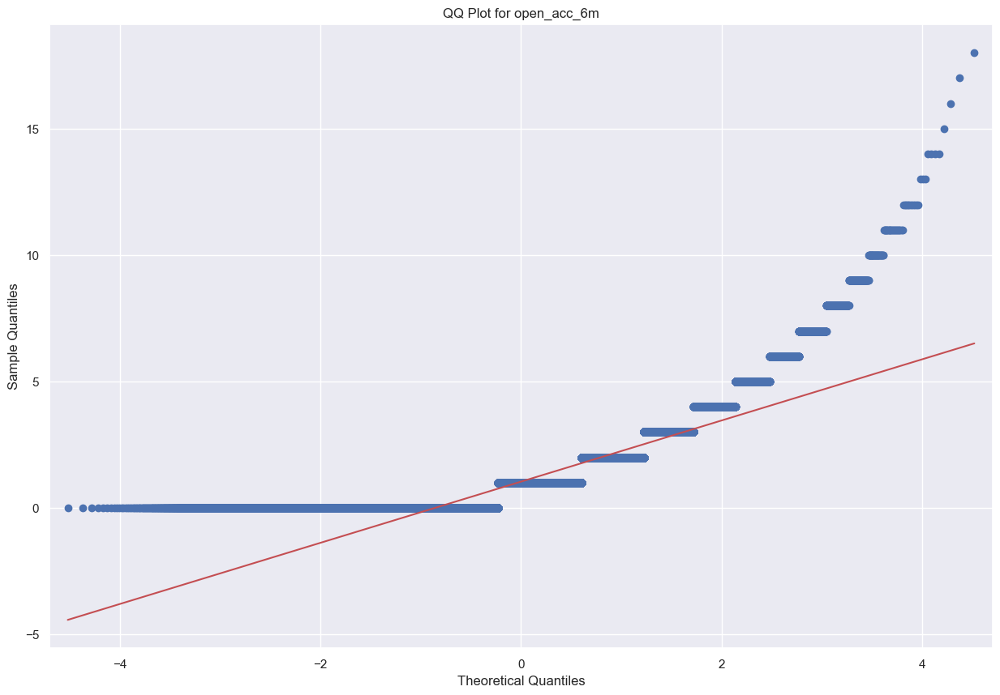

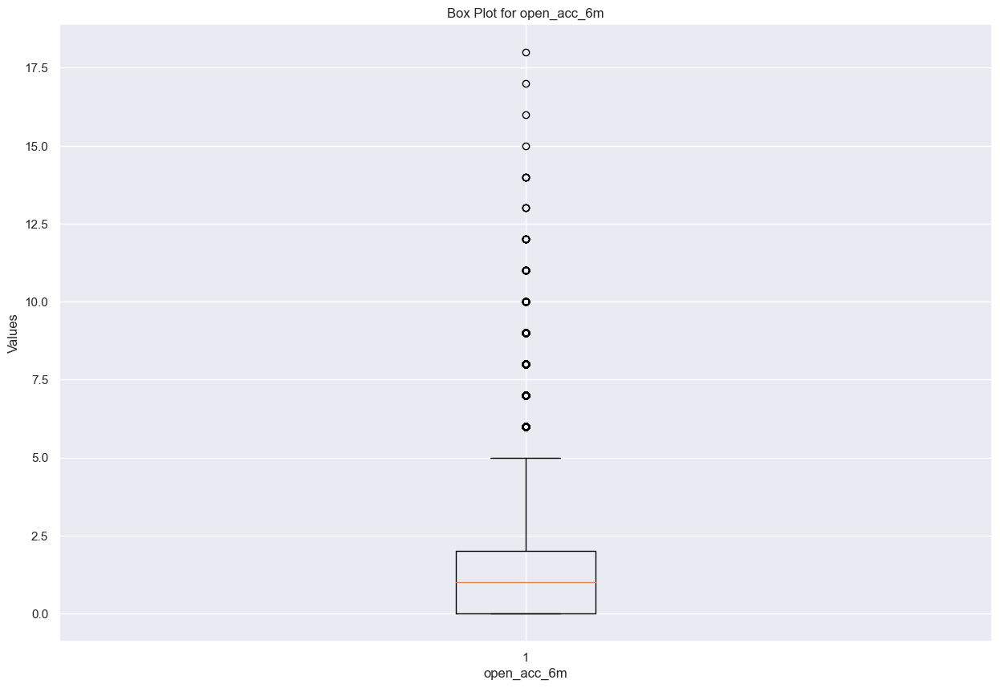

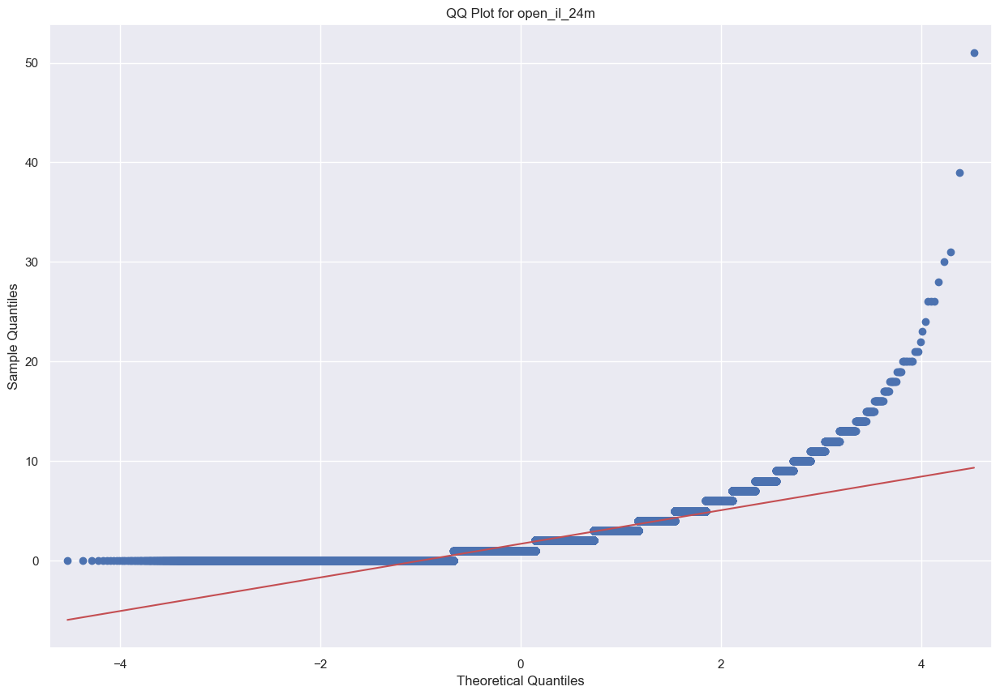

...

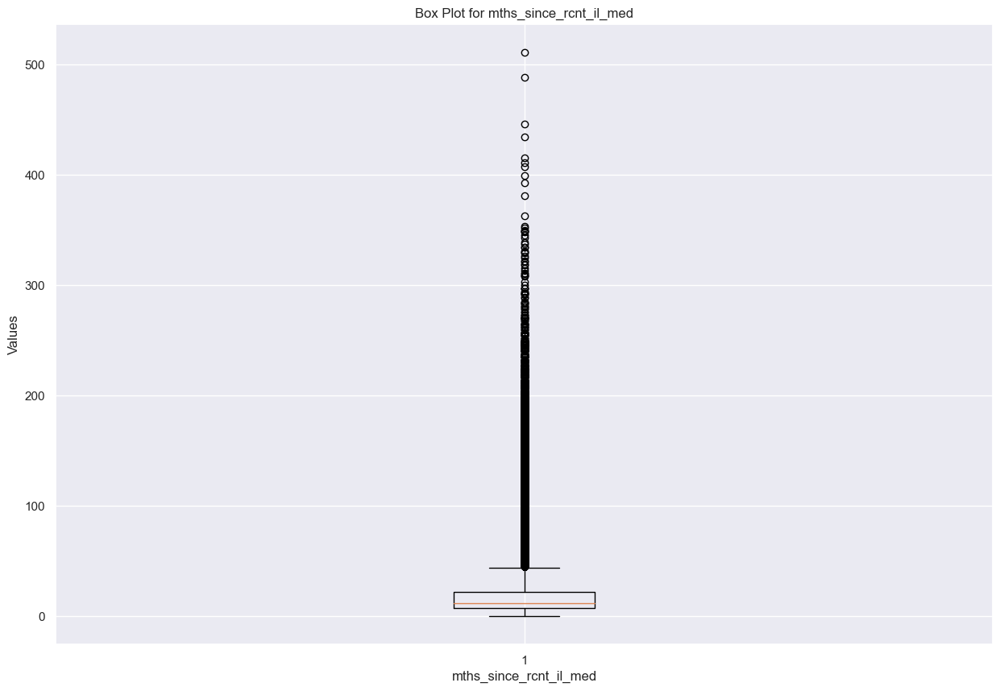

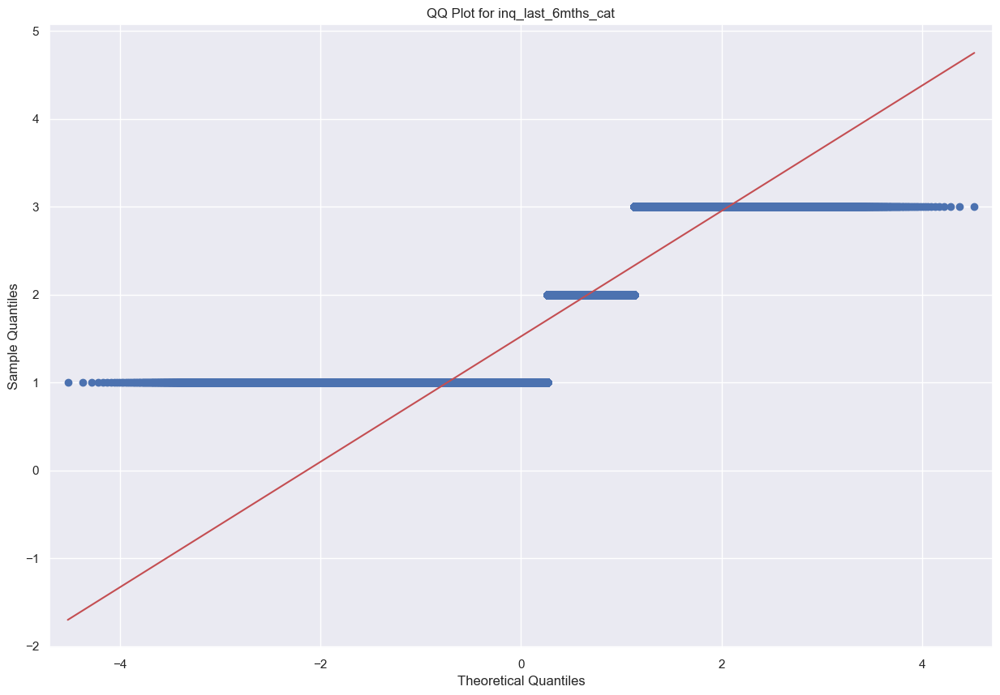

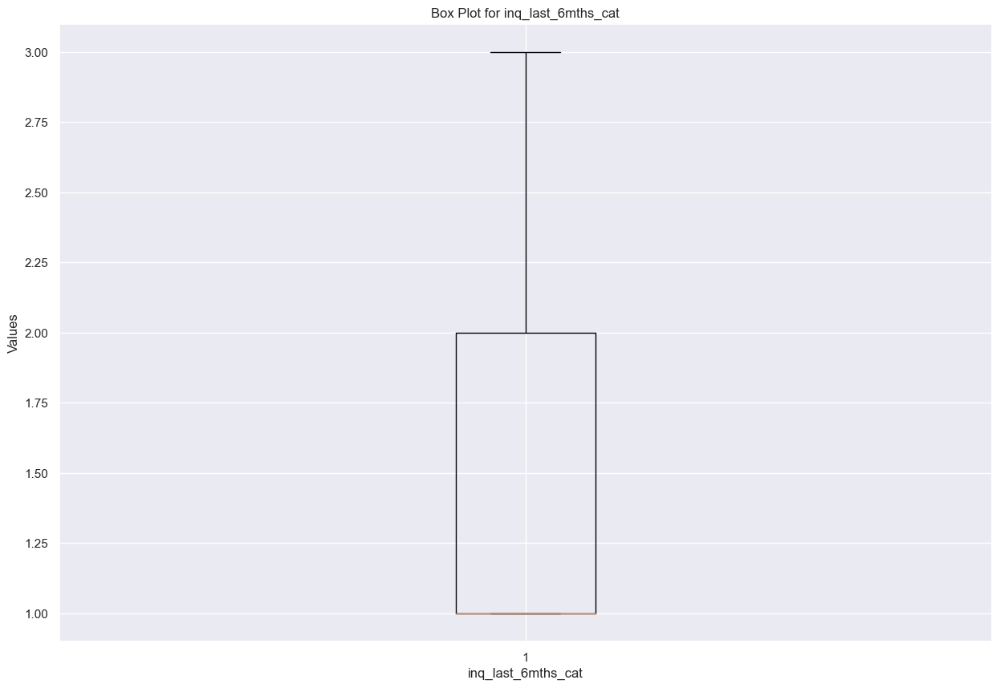

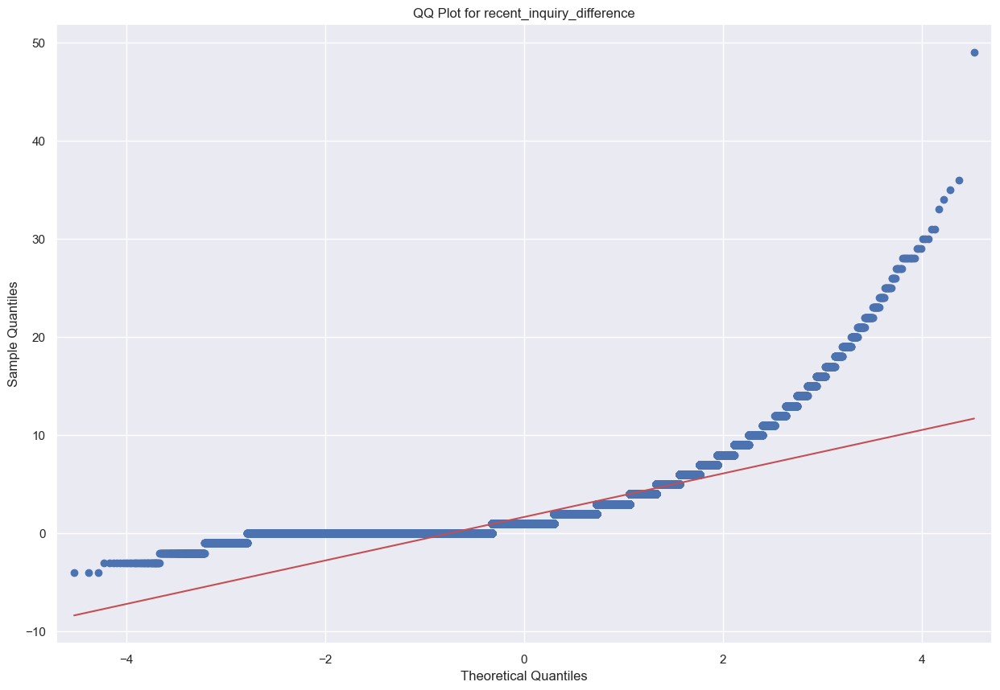

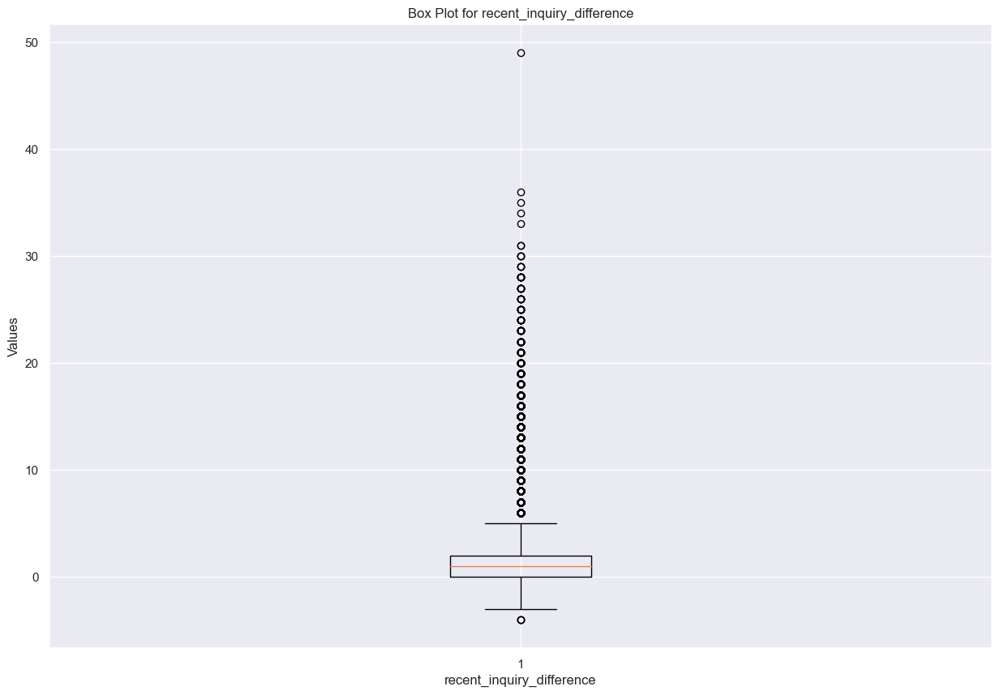

In [522]:
features_list_name=['dti','open_acc_6m','open_il_24m','open_rv_24m','inq_fi','acc_open_past_24mths','num_tl_op_past_12m','il_util_med','mths_since_recent_inq_med','mths_since_rcnt_il_med','inq_last_6mths_cat','recent_inquiry_difference']

for feat in features_list_name:
    QQ_box_plots(feat)

**Best model**
<br>
You chose Robust as the normalization method, now I will run the best model, we saw that 30:70 is the best distribution and we have the rest of the hyperparameters and now we can run the best model and output its scores.

In [523]:
"""
Calculates performance metrics of the best logistic regression model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty, class_weight='balanced')

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= threshold).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

In [524]:
"""
Creates a table displaying performance metrics.
"""

table_LG = [[key, value] for key, value in dic_results.items()]
headers = ["Metric", "Value"]
table_LG_str = tabulate(table_LG, headers, tablefmt="grid")
print(table_LG_str)

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.722801 |
+-----------+----------+
| recall    | 0.738103 |
+-----------+----------+
| precision | 0.711816 |
+-----------+----------+
| accuracy  | 0.738103 |
+-----------+----------+


## ada-boost
we build the AdaBoost model using a sequential boosting approach to enhance weak classifiers and effectively handle challenging instances. We conduct an extensive hyperparameter search to optimize the model by testing different combinations of maximum depth, learning rate, and the number of estimators. We address class imbalance by employing the RandomOverSampler technique for oversampling. Additionally, we apply normalization techniques (Min-Max scaling and Standard scaling) to account for feature scale differences. The models are evaluated using 5-fold cross-validation with the F1 score as the evaluation metric, providing a comprehensive assessment of precision and recall. Finally, based on the averaged F1 scores, we select the best-performing AdaBoost models.

In [525]:
Data_AdaBoost= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_AdaBoost.drop(columns=low_correlation_features, inplace=True)
Data_AdaBoost.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)

In [526]:
X = Data_AdaBoost.drop(columns=['yield_over']).values
y = Data_AdaBoost['yield_over'].values

Checking the best model hyperparamters for 80:20 and 70:30 train:test ratio
<br>
**70:30 ratio**

In [527]:
"""
Perform AdaBoost model training and hyperparameter selection.

Parameters:
    - X: The feature matrix of shape (n_samples, n_features).
    - y: The target vector of shape (n_samples,).
    
Returns:
    - dic_minmax_ada: A dictionary containing the F1 scores for AdaBoost models trained with Min-Max scaling.
    - dic_std_ada: A dictionary containing the F1 scores for AdaBoost models trained with Standard scaling.
    - best_max_depth_std: The best maximum depth hyperparameter for AdaBoost with Standard scaling.
    - best_learning_rate_std: The best learning rate hyperparameter for AdaBoost with Standard scaling.
    - best_n_estimators_std: The best number of estimators hyperparameter for AdaBoost with Standard scaling.
    - best_max_depth_minmax: The best maximum depth hyperparameter for AdaBoost with Min-Max scaling.
    - best_learning_rate_minmax: The best learning rate hyperparameter for AdaBoost with Min-Max scaling.
    - best_n_estimators_minmax: The best number of estimators hyperparameter for AdaBoost with Min-Max scaling.

This function performs an extensive hyperparameter search for the AdaBoost model using different combinations of maximum depth, learning rate, and number of estimators. It trains multiple AdaBoost models using 5-fold cross-validation and calculates the weighted F1 score for each model. The models are trained with both Min-Max scaling and Standard scaling. The function returns dictionaries containing the F1 scores for each combination of hyperparameters and identifies the best-performing models based on the maximum F1 scores.
"""

scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

max_depth=[1,2,3]
learning_rate=[0.1,0.5,0.6]
n_estimators=[30,50,80] 

max_depth_learning_rate_n_estimators_combinations = list(itertools.product(max_depth, learning_rate, n_estimators))
max_depth_learning_rate_n_estimators_combinations = random.sample(max_depth_learning_rate_n_estimators_combinations, 10)

dic_minmax_ada = {}
dic_std_ada = {}

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

for com in max_depth_learning_rate_n_estimators_combinations:
    max_depth, learning_rate, n_estimators=com
    dic_minmax_ada[com]=0
    dic_std_ada[com]=0
    
    # Perform 5-fold cross-validation
    for fold in range(5): 
        indices = np.random.permutation(X_resampled.shape[0])
        idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
        X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
        y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

        X_train_scaled_std = scaler_std.fit_transform(X_train)
        X_val_scaled_std = scaler_std.transform(X_val)

        X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
        X_val_scaled_minmax = scaler_minmax.transform(X_val)
        
        base_classifier = DecisionTreeClassifier(max_depth=max_depth)
        
        adaboost_model_minmax = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)
        adaboost_model_std = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)

        adaboost_model_minmax.fit(X_train_scaled_minmax, y_train)
        adaboost_model_std.fit(X_train_scaled_std, y_train)
        
        
        y_pred = adaboost_model_minmax.predict(X_val)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_minmax_ada[com]+=f1
        
        y_pred = adaboost_model_std.predict(X_val)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_std_ada[com]+=f1
    dic_minmax_ada[com]/=5
    dic_std_ada[com]/=5
    
best_max_depth_std, best_learning_rate_std, best_n_estimators_std=max(dic_std_ada,key=dic_std_ada.get) 
best_max_depth_minmax, best_learning_rate_minmax, best_n_estimators_minmax=max(dic_minmax_ada,key=dic_minmax_ada.get) 


**80:20 ratio**

In [528]:
"""
Perform AdaBoost model training and hyperparameter selection.

Parameters:
    - X: The feature matrix of shape (n_samples, n_features).
    - y: The target vector of shape (n_samples,).
    
Returns:
    - dic_minmax_ada: A dictionary containing the F1 scores for AdaBoost models trained with Min-Max scaling.
    - dic_std_ada: A dictionary containing the F1 scores for AdaBoost models trained with Standard scaling.
    - best_max_depth_std: The best maximum depth hyperparameter for AdaBoost with Standard scaling.
    - best_learning_rate_std: The best learning rate hyperparameter for AdaBoost with Standard scaling.
    - best_n_estimators_std: The best number of estimators hyperparameter for AdaBoost with Standard scaling.
    - best_max_depth_minmax: The best maximum depth hyperparameter for AdaBoost with Min-Max scaling.
    - best_learning_rate_minmax: The best learning rate hyperparameter for AdaBoost with Min-Max scaling.
    - best_n_estimators_minmax: The best number of estimators hyperparameter for AdaBoost with Min-Max scaling.

This function performs an extensive hyperparameter search for the AdaBoost model using different combinations of maximum depth, learning rate, and number of estimators. It trains multiple AdaBoost models using 5-fold cross-validation and calculates the weighted F1 score for each model. The models are trained with both Min-Max scaling and Standard scaling. The function returns dictionaries containing the F1 scores for each combination of hyperparameters and identifies the best-performing models based on the maximum F1 scores.
"""

scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

max_depth=[1,2,3]
learning_rate=[0.1,0.5,0.6]
n_estimators=[30,50,80] 

max_depth_learning_rate_n_estimators_combinations = list(itertools.product(max_depth, learning_rate, n_estimators))
max_depth_learning_rate_n_estimators_combinations = random.sample(max_depth_learning_rate_n_estimators_combinations, 10)

dic_minmax_ada_more = {}
dic_std_ada_more = {}

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

for com in max_depth_learning_rate_n_estimators_combinations:
    max_depth, learning_rate, n_estimators=com
    dic_minmax_ada_more[com]=0
    dic_std_ada_more[com]=0
    
    # Perform 5-fold cross-validation
    for fold in range(5): 
        indices = np.random.permutation(X_resampled.shape[0])
        idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
        X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
        y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

        X_train_scaled_std = scaler_std.fit_transform(X_train)
        X_val_scaled_std = scaler_std.transform(X_val)

        X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
        X_val_scaled_minmax = scaler_minmax.transform(X_val)
        
        base_classifier = DecisionTreeClassifier(max_depth=max_depth)
        
        adaboost_model_minmax = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)
        adaboost_model_std = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)

        adaboost_model_minmax.fit(X_train_scaled_minmax, y_train)
        adaboost_model_std.fit(X_train_scaled_std, y_train)
        
        
        y_pred = adaboost_model_minmax.predict(X_val_scaled_minmax)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_minmax_ada_more[com]+=f1
        
        y_pred = adaboost_model_std.predict(X_val_scaled_std)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_std_ada_more[com]+=f1
    dic_minmax_ada_more[com]/=5
    dic_std_ada_more[com]/=5
    
best_max_depth_std_more, best_learning_rate_std_more, best_n_estimators_std_more=max(dic_std_ada_more,key=dic_std_ada_more.get) 
best_max_depth_minmax_more, best_learning_rate_minmax_more, best_n_estimators_minmax_more=max(dic_minmax_ada_more,key=dic_minmax_ada_more.get) 


Because each run produced different results, I will manually save the results and work on them later in the project.

In [529]:
max_depth=1
learning_rate=0.6
n_estimators=30

Compares on the best parameters the division into 20:80 and 70:30.
<br>
**70:30 ratio**

In [530]:
"""
Perform AdaBoost model training and evaluation using 5-fold cross-validation.
    
Returns:
    - dic_results: A dictionary containing the evaluation metrics of the AdaBoost model.
    
This function trains an AdaBoost model using 5-fold cross-validation. It performs feature scaling using Min-Max scaling and applies RandomOverSampler to address class imbalance in the dataset. The AdaBoost model is trained with a DecisionTreeClassifier as the base estimator and specified hyperparameters (max_depth, n_estimators, and learning_rate). The function calculates evaluation metrics including weighted F1 score, weighted recall, weighted precision, and weighted accuracy for the model on each fold. The final evaluation metrics are the average values across the five folds, which are returned in a dictionary.
"""

scaler = MinMaxScaler()

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0


for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
        
    base_classifier = DecisionTreeClassifier(max_depth=max_depth)
        
    model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)
    model.fit(X_train_scaled, y_train)
        
    y_pred = model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}


**80:20 ratio**

In [531]:
"""
Perform AdaBoost model training and evaluation using 5-fold cross-validation.
    
Returns:
    - dic_results: A dictionary containing the evaluation metrics of the AdaBoost model.
    
This function trains an AdaBoost model using 5-fold cross-validation. It performs feature scaling using Min-Max scaling and applies RandomOverSampler to address class imbalance in the dataset. The AdaBoost model is trained with a DecisionTreeClassifier as the base estimator and specified hyperparameters (max_depth, n_estimators, and learning_rate). The function calculates evaluation metrics including weighted F1 score, weighted recall, weighted precision, and weighted accuracy for the model on each fold. The final evaluation metrics are the average values across the five folds, which are returned in a dictionary.
"""
scaler = MinMaxScaler()

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0


for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.8 * X_resampled.shape[0])], indices[int(0.2 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
        
    base_classifier = DecisionTreeClassifier(max_depth=max_depth)
        
    model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=0.01)
    model.fit(X_train_scaled, y_train)
        
    y_pred = model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results1 = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}


In [532]:
"""
Creates a performance comparison table between two AdaBoost models.

Args:
    dic_results1 (dict): Dictionary containing performance metrics of the first AdaBoost model.
    dic_results (dict): Dictionary containing performance metrics of the second AdaBoost model.

Returns:
        pandas.DataFrame: A DataFrame representing the performance comparison table.

Docstring:
The function creates a performance comparison table between two logistic AdaBoost.
    It performs the following steps:
    1. Defines the table data as a list of lists, including the performance metrics and model names.
    2. Converts the table data into a DataFrame.
    3. Converts the numeric columns to the numeric data type.
    4. Applies styling to the DataFrame, highlighting the minimum and maximum values.
    5. Sets the caption for the styled table.
    6. Returns the styled DataFrame representing the performance comparison table.
"""

table_data = [
    ['', 'AdaBoost by 80:20', 'AdaBoost by 70:30'],
    ['F1', dic_results1['weighted_f1'], dic_results['weighted_f1']],
    ['recall', dic_results1['weighted_recall'], dic_results['weighted_recall']],
    ['precision', dic_results1['weighted_precision'], dic_results['weighted_precision']],
    ['accuracy', dic_results1['weighted_accuracy'], dic_results['weighted_accuracy']]
]

df = pd.DataFrame(table_data[1:], columns=table_data[0])

df['AdaBoost by 80:20'] = pd.to_numeric(df['AdaBoost by 80:20'], errors='coerce')
df['AdaBoost by 70:30'] = pd.to_numeric(df['AdaBoost by 70:30'], errors='coerce')

styled_table = df.style.apply(lambda x: ['background-color: lightcoral' if x[i] == np.min(x) else 'background-color: lightgreen' if x[i] == np.max(x) else '' for i in range(len(x))], axis=1, subset=['AdaBoost by 80:20', 'AdaBoost by 70:30']) \
    .set_caption('AdaBoost Performance Comparison')

styled_table


,,AdaBoost by 80:20,AdaBoost by 70:30
0,F1,0.769077,0.966483
1,recall,0.777768,0.966495
2,precision,0.826950,0.967163
3,accuracy,0.777768,0.966495


**Best Model**
<br>
You chose MinMax as the normalization method, now I will run the best model, we saw that 30:70 is the best distribution and we have the rest of the hyperparameters and now we can run the best model and output its scores.

In [533]:
"""
Calculates performance metrics of the best logistic regression model.
"""
    
scaler = MinMaxScaler()

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
        
    base_classifier = DecisionTreeClassifier(max_depth=max_depth)
        
    best_adaboost_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimators, learning_rate=learning_rate)
    best_adaboost_model.fit(X_train_scaled, y_train)
        
    y_pred = best_adaboost_model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'F1': weighted_f1,
    'Recall': weighted_recall,
    'Precision': weighted_precision,
    'Accuracy': weighted_accuracy
}


In [534]:
"""
Creates a table displaying performance metrics.
"""

table_AdaBoost = [[key, value] for key, value in dic_results.items()]
headers = ["Metric", "Value"]
table_AdaBoost_str = tabulate(table_AdaBoost, headers, tablefmt="grid")
print(table_AdaBoost_str)

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.966813 |
+-----------+----------+
| Recall    | 0.966828 |
+-----------+----------+
| Precision | 0.967664 |
+-----------+----------+
| Accuracy  | 0.966828 |
+-----------+----------+


**The Selected Features**
<br>
We will analyze the selected features and their respective importance in the model.
<br>
The AdaBoost model highlights important features such as 'fico_mean', 'dti', and 'avg_cur_bal', which significantly impact its performance. However, feature importance alone does not establish relevance or causality.

In [535]:
"""
Retrieves and displays the feature importances from the trained XGBoost model.
"""

data_temp=Data_AdaBoost.copy()
data_temp.drop(['yield_over'], axis=1, inplace=True)

importance_scores = best_adaboost_model.feature_importances_
feature_indices = np.arange(X.shape[1])

feature_importances = dict(zip(feature_indices, importance_scores))
sorted_importances = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)

# Retrieve the column names based on the column indices from data_temp DataFrame
column_names = data_temp.columns.tolist()
columns_model_names = []
feature_idxs = []

# Display the feature importances with corresponding column names
for feature_idx, importance in sorted_importances:
    feature_name = column_names[feature_idx]
    columns_model_names.append(feature_name)
    feature_idxs.append(feature_idx)
    print(f"{feature_name}: {importance}")

purpose_yield_over_encoded: 0.8
purpose_yield_yearly_encoded: 0.2
id: 0.0
emp_length: 0.0
dti: 0.0
open_acc_6m: 0.0
open_il_24m: 0.0
il_util: 0.0
open_rv_12m: 0.0
open_rv_24m: 0.0
all_util: 0.0
inq_fi: 0.0
acc_open_past_24mths: 0.0
avg_cur_bal: 0.0
mort_acc: 0.0
mths_since_recent_inq: 0.0
num_tl_op_past_12m: 0.0
total_bc_limit: 0.0
il_util_med: 0.0
mths_since_recent_inq_med: 0.0
mths_since_rcnt_il_med: 0.0
mths_since_rcnt_il_mean: 0.0
mo_sin_old_il_acct_med: 0.0
mo_sin_old_il_acct_mean: 0.0
percent_bc_gt_75_med: 0.0
percent_bc_gt_75_mean: 0.0
bc_open_to_buy_med: 0.0
bc_open_to_buy_mean: 0.0
addr_state_danger: 0.0
Age_of_credit_history: 0.0
Is_MORTGAGE: 0.0
Is_RENT: 0.0
inq_last_6mths_cat: 0.0
f: 0.0
w: 0.0
recent_inquiry_difference: 0.0
annl_inc_log: 0.0
total_rev_hi_lim_log: 0.0
fico_mean: 0.0


## XG-Boost
 In the provided code, we are building an XGBoost model using the XGBoost library. The process is similar to the AdaBoost model, but with some differences. We begin by defining the hyperparameters to be tuned, including the maximum depth, learning rate, and the number of estimators for the XGBoost model. Random combinations of these hyperparameters are generated and a limited number of combinations are randomly selected for evaluation. To address class imbalance, the RandomOverSampler technique is applied to oversample the minority class. Two normalization techniques, Min-Max scaling and Standard scaling, are applied to enhance model performance. The XGBoost models are then trained and evaluated using 5-fold cross-validation. The evaluation metric used is the weighted F1 score, which is calculated and averaged across the folds to assess the model's performance. Finally, the best-performing XGBoost models are selected based on their averaged F1 scores.

In [536]:
Data_XGBoost= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_XGBoost.drop(columns=low_correlation_features, inplace=True)
Data_XGBoost.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)

In [537]:
X = Data_XGBoost.drop(columns=['yield_over']).values
y = Data_XGBoost['yield_over'].values

Checking the best model hyperparamters for 80:20 and 70:30 train:test ratio
<br>
**70:30 ratio**

In [547]:
"""
Perform hyperparameter tuning and cross-validation to build XGBoost models using the XGBClassifier. Two normalization techniques, Min-Max scaling and Standard scaling, are applied to enhance model performance. The models are evaluated using 5-fold cross-validation and the weighted F1 score as the evaluation metric. RandomOverSampler is used to address class imbalance by oversampling the minority class. The best-performing XGBoost models are selected based on their averaged F1 scores.

Parameters:
- scaler_minmax: MinMaxScaler object for Min-Max scaling.
- scaler_std: StandardScaler object for Standard scaling.
- max_depth: List of maximum depth values to be tested.
- eta: List of learning rate values to be tested.
- n_estimators: List of the number of estimators values to be tested.
- X: Input features for the XGBoost models.
- y: Target variable for the XGBoost models.

Returns:
- dic_minmax_XG: Dictionary containing the evaluated combinations of hyperparameters as keys and the averaged weighted F1 scores of XGBoost models with Min-Max scaling as values.
- dic_std_XG: Dictionary containing the evaluated combinations of hyperparameters as keys and the averaged weighted F1 scores of XGBoost models with Standard scaling as values.
- best_max_depth_std_XG, best_learning_rate_std_XG, best_n_estimators_std_XG: Best hyperparameter combination for XGBoost model with Standard scaling based on the averaged F1 score.
- best_max_depth_minmax_XG, best_learning_rate_minmax_XG, best_n_estimators_minmax_XG: Best hyperparameter combination for XGBoost model with Min-Max scaling based on the averaged F1 score.
"""

scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

max_depth = [1, 2, 3]
eta = [0.1, 0.3, 0.4]
n_estimators = [30, 50, 80]

max_depth_eta_n_estimators_combinations = list(itertools.product(max_depth, eta, n_estimators))
max_depth_eta_n_estimators_combinations = random.sample(max_depth_eta_n_estimators_combinations, 10)

dic_minmax_XG = {}
dic_std_XG = {}

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

for com in max_depth_eta_n_estimators_combinations:
    max_depth, eta, n_estimators = com
    dic_minmax_XG[com] = 0
    dic_std_XG[com] = 0
    
    # Perform 5-fold cross-validation
    for fold in range(5): 
        indices = np.random.permutation(X_resampled.shape[0])
        idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
        X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
        y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

        X_train_scaled_std = scaler_std.fit_transform(X_train)
        X_val_scaled_std = scaler_std.transform(X_val)

        X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
        X_val_scaled_minmax = scaler_minmax.transform(X_val)
        
        xgboost_model_minmax = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)
        xgboost_model_std = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)

        xgboost_model_minmax.fit(X_train_scaled_minmax, y_train)
        xgboost_model_std.fit(X_train_scaled_std, y_train)
        
        
        y_pred = xgboost_model_minmax.predict(X_val_scaled_minmax)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_minmax_XG[com] += f1
        
        y_pred = xgboost_model_std.predict(X_val_scaled_std)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_std_XG[com] += f1
    
    dic_minmax_XG[com] /= 5
    dic_std_XG[com] /= 5
    
best_max_depth_std_XG, best_learning_rate_std_XG, best_n_estimators_std_XG = max(dic_std_XG, key=dic_std_XG.get)
best_max_depth_minmax_XG, best_learning_rate_minmax_XG, best_n_estimators_minmax_XG = max(dic_minmax_XG, key=dic_minmax_XG.get)


**80:20 ratio**

In [539]:
"""
Perform hyperparameter tuning and cross-validation to build XGBoost models using the XGBClassifier. Two normalization techniques, Min-Max scaling and Standard scaling, are applied to enhance model performance. The models are evaluated using 5-fold cross-validation and the weighted F1 score as the evaluation metric. RandomOverSampler is used to address class imbalance by oversampling the minority class. The best-performing XGBoost models are selected based on their averaged F1 scores.

Parameters:
- scaler_minmax: MinMaxScaler object for Min-Max scaling.
- scaler_std: StandardScaler object for Standard scaling.
- max_depth: List of maximum depth values to be tested.
- eta: List of learning rate values to be tested.
- n_estimators: List of the number of estimators values to be tested.
- X: Input features for the XGBoost models.
- y: Target variable for the XGBoost models.

Returns:
- dic_minmax_XG: Dictionary containing the evaluated combinations of hyperparameters as keys and the averaged weighted F1 scores of XGBoost models with Min-Max scaling as values.
- dic_std_XG: Dictionary containing the evaluated combinations of hyperparameters as keys and the averaged weighted F1 scores of XGBoost models with Standard scaling as values.
- best_max_depth_std_XG, best_learning_rate_std_XG, best_n_estimators_std_XG: Best hyperparameter combination for XGBoost model with Standard scaling based on the averaged F1 score.
- best_max_depth_minmax_XG, best_learning_rate_minmax_XG, best_n_estimators_minmax_XG: Best hyperparameter combination for XGBoost model with Min-Max scaling based on the averaged F1 score.
"""

scaler_minmax = MinMaxScaler()
scaler_std = StandardScaler()

max_depth = [1, 2, 3]
eta = [0.1, 0.3, 0.4]
n_estimators = [30, 50, 80]

max_depth_eta_n_estimators_combinations = list(itertools.product(max_depth, eta, n_estimators))
max_depth_eta_n_estimators_combinations = random.sample(max_depth_eta_n_estimators_combinations, 10)

dic_minmax_XG_more = {}
dic_std_XG_more = {}

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

for com in max_depth_eta_n_estimators_combinations:
    max_depth, eta, n_estimators = com
    dic_minmax_XG_more[com] = 0
    dic_std_XG_more[com] = 0
    
    # Perform 5-fold cross-validation
    for fold in range(5): 
        indices = np.random.permutation(X_resampled.shape[0])
        idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
        X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
        y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

        X_train_scaled_std = scaler_std.fit_transform(X_train)
        X_val_scaled_std = scaler_std.transform(X_val)

        X_train_scaled_minmax = scaler_minmax.fit_transform(X_train)
        X_val_scaled_minmax = scaler_minmax.transform(X_val)

        
        xgboost_model_minmax = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)
        xgboost_model_std = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)

        xgboost_model_minmax.fit(X_train_scaled_minmax, y_train)
        xgboost_model_std.fit(X_train_scaled_std, y_train)
        
        
        y_pred = xgboost_model_minmax.predict(X_val_scaled_minmax)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_minmax_XG_more[com] += f1
        
        y_pred = xgboost_model_std.predict(X_val_scaled_std)
        f1 = f1_score(y_val, y_pred, average='weighted')
        dic_std_XG_more[com] += f1
    
    dic_minmax_XG_more[com] /= 5
    dic_std_XG_more[com] /= 5
    
best_max_depth_std_XG_more, best_eta_std_XG_more, best_n_estimators_std_XG_more = max(dic_std_XG_more, key=dic_std_XG_more.get)
best_max_depth_minmax_XG_more, best_eta_minmax_XG_more, best_n_estimators_minmax_XG_more = max(dic_minmax_XG_more, key=dic_minmax_XG_more.get)

Because each run produced different results, I will manually save the results and work on them later in the project.

In [548]:
max_depth=3
eta=0.4
n_estimators=50

In [541]:
"""
Perform 5-fold cross-validation to train and evaluate an XGBoost model using the XGBClassifier. Robust scaling is applied to the input features using the RobustScaler. The model is evaluated using the weighted F1 score, weighted recall, weighted precision, and weighted accuracy as evaluation metrics.

Parameters:
- scaler: RobustScaler object for robust scaling of the input features.
- X: Input features for the XGBoost model.
- y: Target variable for the XGBoost model.
- max_depth: Maximum depth value for the XGBoost model.
- eta: Learning rate value for the XGBoost model.
- n_estimators: Number of estimators value for the XGBoost model.

Returns:
- dic_results: Dictionary containing the evaluation results, including the averaged weighted F1 score, weighted recall, weighted precision, and weighted accuracy across the 5 folds.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

    # Perform 5-fold cross-validation
for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_xgboost_model = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)  
    best_xgboost_model.fit(X_train_scaled, y_train)        
        
    y_pred = best_xgboost_model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}

**80:20 ratio**

In [542]:
"""
Perform 5-fold cross-validation to train and evaluate an XGBoost model using the XGBClassifier. Robust scaling is applied to the input features using the RobustScaler. The model is evaluated using the weighted F1 score, weighted recall, weighted precision, and weighted accuracy as evaluation metrics.

Parameters:
- scaler: RobustScaler object for robust scaling of the input features.
- X: Input features for the XGBoost model.
- y: Target variable for the XGBoost model.
- max_depth: Maximum depth value for the XGBoost model.
- eta: Learning rate value for the XGBoost model.
- n_estimators: Number of estimators value for the XGBoost model.

Returns:
- dic_results: Dictionary containing the evaluation results, including the averaged weighted F1 score, weighted recall, weighted precision, and weighted accuracy across the 5 folds.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

    # Perform 5-fold cross-validation
for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.8 * X_resampled.shape[0])], indices[int(0.2 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    xgboost_model = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)  
    xgboost_model.fit(X_train_scaled, y_train)        
        
    y_pred = xgboost_model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results1 = {
    'weighted_f1': weighted_f1,
    'weighted_recall': weighted_recall,
    'weighted_precision': weighted_precision,
    'weighted_accuracy': weighted_accuracy
}

In [543]:
"""
Creates a performance comparison table between two XG-Boost models.

Args:
    dic_results1 (dict): Dictionary containing performance metrics of the first XG-Boost model.
    dic_results (dict): Dictionary containing performance metrics of the second XG-Boost model.

Returns:
        pandas.DataFrame: A DataFrame representing the performance comparison table.

Docstring:
The function creates a performance comparison table between two XG-Boost models.
    It performs the following steps:
    1. Defines the table data as a list of lists, including the performance metrics and model names.
    2. Converts the table data into a DataFrame.
    3. Converts the numeric columns to the numeric data type.
    4. Applies styling to the DataFrame, highlighting the minimum and maximum values.
    5. Sets the caption for the styled table.
    6. Returns the styled DataFrame representing the performance comparison table.
"""

table_data = [
    ['', 'XG-Boost by 80:20', 'XG-Boost by 70:30'],
    ['F1', dic_results1['weighted_f1'], dic_results['weighted_f1']],
    ['recall', dic_results1['weighted_recall'], dic_results['weighted_recall']],
    ['precision', dic_results1['weighted_precision'], dic_results['weighted_precision']],
    ['accuracy', dic_results1['weighted_accuracy'], dic_results['weighted_accuracy']]
]

# Convert the table data to a DataFrame
df = pd.DataFrame(table_data[1:], columns=table_data[0])

# Convert numeric columns to numeric type
df['XG-Boost by 80:20'] = pd.to_numeric(df['XG-Boost by 80:20'], errors='coerce')
df['XG-Boost by 70:30'] = pd.to_numeric(df['XG-Boost by 70:30'], errors='coerce')

# Apply styling to the DataFrame
styled_table = df.style.apply(lambda x: ['background-color: lightcoral' if x[i] == np.min(x) else 'background-color: lightgreen' if x[i] == np.max(x) else '' for i in range(len(x))], axis=1, subset=['XG-Boost by 80:20', 'XG-Boost by 70:30']) \
    .set_caption('XG-Boost Performance Comparison')

# Display the styled DataFrame
styled_table


,,XG-Boost by 80:20,XG-Boost by 70:30
0,F1,0.999999,0.999997
1,recall,0.999999,0.999997
2,precision,0.999999,0.999997
3,accuracy,0.999999,0.999997


**Best model**
<br>
You chose Robust as the normalization method, now I will run the best model, we saw that 30:70 is the best distribution and we have the rest of the hyperparameters and now we can run the best model and output its scores.

In [544]:
"""
Calculates performance metrics of the best XG-Boost model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

    # Perform 5-fold cross-validation
for fold in range(5): 
    indices = np.random.permutation(X_resampled.shape[0])
    idx_train, idx_val = indices[:int(0.7 * X_resampled.shape[0])], indices[int(0.3 * X_resampled.shape[0]):]
    X_train, X_val = X_resampled[idx_train], X_resampled[idx_val]
    y_train, y_val = y_resampled[idx_train], y_resampled[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_xgboost_model = XGBClassifier(max_depth=max_depth, eta=eta,n_estimators=n_estimators)  
    best_xgboost_model.fit(X_train_scaled, y_train)        
        
    y_pred = best_xgboost_model.predict(X_val_scaled)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results = {
    'F1': weighted_f1,
    'Recall': weighted_recall,
    'Precision': weighted_precision,
    'Accuracy': weighted_accuracy
}

In [545]:
"""
Creates a table displaying performance metrics.
"""

table_XG_boost = [[key, value] for key, value in dic_results.items()]
headers = ["Metric", "Value"]
table_XG_boost_str = tabulate(table_XG_boost, headers, tablefmt="grid")
print(table_XG_boost_str)

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.999997 |
+-----------+----------+
| Recall    | 0.999997 |
+-----------+----------+
| Precision | 0.999997 |
+-----------+----------+
| Accuracy  | 0.999997 |
+-----------+----------+


**The Selected Features**
<br>
We will analyze the selected features and their respective importance in the model.
<br>
The scores indicate the relative significance of each feature in making accurate predictions. Features like "fico_mean," "Is_MORTGAGE," and "acc_open_past_24mths" have the highest importance, while others like "mths_since_rcnt_il_mean" and "open_il_24m" have relatively lower importance in the model.


In [546]:
"""
Retrieves and displays the feature importances from the trained XGBoost model.
"""

data_temp=Data_XGBoost.copy()
data_temp.drop(['yield_over'], axis=1, inplace=True)

importance_scores = best_xgboost_model.feature_importances_
feature_indices = np.arange(X.shape[1])

feature_importances = dict(zip(feature_indices, importance_scores))
sorted_importances = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)

# Retrieve the column names based on the column indices from data_temp DataFrame
column_names = data_temp.columns.tolist()
columns_model_names=[]
feature_idxs=[]

# Display the feature importances with corresponding column names
for feature_idx, importance in sorted_importances:
    feature_name = column_names[feature_idx]
    columns_model_names.append(feature_name)
    feature_idxs.append(feature_idx)
    print(f"{feature_name}: {importance}")


purpose_yield_yearly_encoded: 0.5617079734802246
purpose_yield_over_encoded: 0.4382920265197754
id: 0.0
emp_length: 0.0
dti: 0.0
open_acc_6m: 0.0
open_il_24m: 0.0
il_util: 0.0
open_rv_12m: 0.0
open_rv_24m: 0.0
all_util: 0.0
inq_fi: 0.0
acc_open_past_24mths: 0.0
avg_cur_bal: 0.0
mort_acc: 0.0
mths_since_recent_inq: 0.0
num_tl_op_past_12m: 0.0
total_bc_limit: 0.0
il_util_med: 0.0
mths_since_recent_inq_med: 0.0
mths_since_rcnt_il_med: 0.0
mths_since_rcnt_il_mean: 0.0
mo_sin_old_il_acct_med: 0.0
mo_sin_old_il_acct_mean: 0.0
percent_bc_gt_75_med: 0.0
percent_bc_gt_75_mean: 0.0
bc_open_to_buy_med: 0.0
bc_open_to_buy_mean: 0.0
addr_state_danger: 0.0
Age_of_credit_history: 0.0
Is_MORTGAGE: 0.0
Is_RENT: 0.0
inq_last_6mths_cat: 0.0
f: 0.0
w: 0.0
recent_inquiry_difference: 0.0
annl_inc_log: 0.0
total_rev_hi_lim_log: 0.0
fico_mean: 0.0


### ROV CARVE
The ROC curve is an important evaluation metric used in binary classification tasks. It provides a graphical representation of the performance of a classification model by plotting the true positive rate (sensitivity) against the false positive rate (1 - specificity) at various classification thresholds. The ROC curve allows us to assess the trade-off between the true positive rate and the false positive rate, helping us to understand the model's ability to distinguish between the positive and negative classes. Additionally, the area under the ROC curve (AUC-ROC) is commonly used as a single numeric summary of the model's discriminative power. A higher AUC-ROC indicates a better-performing model with improved classification accuracy.

We will make sure that the data we enter into the model is relevant.

In [552]:
Data_Boost= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_Boost.drop(columns=low_correlation_features, inplace=True)
Data_Boost.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)
X = Data_Boost.drop(columns=['yield_over']).values
y = Data_Boost['yield_over'].values
oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

Data_LG= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_LG.drop(columns=low_correlation_features, inplace=True)
Data_LG.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade'], axis=1, inplace=True)
X = Data_LG.drop(columns=['yield_over']).values
y = Data_LG['yield_over'].values
X=X[:, selected_features_list]
X_train_LG, X_test_LG, y_train_LG, y_test_LG = train_test_split(X, y, test_size=0.3, random_state=42)

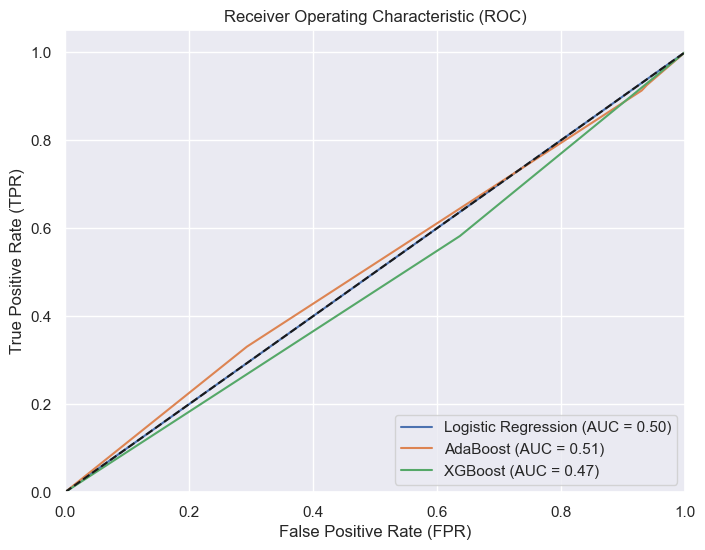

In [555]:
"""
Plotting ROC Curves

This code snippet generates ROC curves for three different models: Logistic Regression, AdaBoost, and XGBoost.
The ROC curve is a graphical representation of the performance of a binary classification model, showing the trade-off between the true positive rate (sensitivity) and the false positive rate (1 - specificity) at various classification thresholds.
The area under the ROC curve (AUC-ROC) is used as a metric to evaluate the discriminative power of each model, with a higher AUC-ROC indicating better performance.

Output:
- ROC curves for each model, with corresponding AUC values, plotted using Matplotlib.
"""

# Logistic Regression
lg_fpr, lg_tpr, _ = roc_curve(y_test_LG, best_LG.predict_proba(X_test_LG)[:, 1])
lg_roc_auc = roc_auc_score(y_test_LG, best_LG.predict_proba(X_test_LG)[:, 1])

# AdaBoost
adaboost_fpr, adaboost_tpr, _ = roc_curve(y_test, best_adaboost_model.predict_proba(X_test)[:, 1])
adaboost_roc_auc = roc_auc_score(y_test, best_adaboost_model.predict_proba(X_test)[:, 1])

# XGBoost
xgboost_fpr, xgboost_tpr, _ = roc_curve(y_test, best_xgboost_model.predict_proba(X_test)[:, 1])
xgboost_roc_auc = roc_auc_score(y_test, best_xgboost_model.predict_proba(X_test)[:, 1])

# Plotting ROC curves
plt.figure(figsize=(8, 6))
plt.plot(lg_fpr, lg_tpr, label='Logistic Regression (AUC = %0.2f)' % lg_roc_auc)
plt.plot(adaboost_fpr, adaboost_tpr, label='AdaBoost (AUC = %0.2f)' % adaboost_roc_auc)
plt.plot(xgboost_fpr, xgboost_tpr, label='XGBoost (AUC = %0.2f)' % xgboost_roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random classifier
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


## Regression Models
### Linear Regression 

In [87]:
file_path = '/Users/shellylevy/Desktop/data.csv'
Data_Regression = pd.read_csv(file_path)
Data_Regression.drop(['id','term','int_rate','issue_d','yield_yearly_1','is_default?',"yield_over"], axis=1, inplace=True)

In [88]:
Data_Regression['fico_mean']=(Data_Regression['fico_range_high']+Data_Regression['fico_range_low'])/2
Data_Regression.drop(['fico_range_high','fico_range_low'], axis=1, inplace=True)

In [89]:
# Replace infinite values with NaN
Data_Regression.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values
Data_Regression.dropna(inplace=True)

# Check if any infinite values remain
any_inf = Data_Regression.isin([np.inf, -np.inf]).any().any()
print(any_inf)

False


In [90]:
#splitting the data into train and test datasets, when 80% for train and 20% for test dataset + another splitting 
#for the fine tuning step (later on)
y = Data_Regression["yield_2"]  # target variable
x = Data_Regression.drop("yield_2", axis=1)
X_train, X_test, y_train, y_test = train_test_split(x, y, 
                                                    test_size = 0.3,
                                                    random_state = 0)

In [91]:
mmc = MinMaxScaler()
X_train = mmc.fit_transform(X_train)
X_test = mmc.transform(X_test)

**Features selection**

In [95]:
def forward_selection(data, target, model, improvement_threshold=0.0001):
    """
    Perform forward feature selection using mean squared error (MSE) as the evaluation metric.

    Args:
        data (numpy.ndarray): The input feature data.
        target (numpy.ndarray): The target variable.
        model: The machine learning model to use for evaluation.
        improvement_threshold (float, optional): The minimum improvement threshold for selecting new features. Defaults to 0.0001.

    Returns:
        list: The list of selected best features.

    """
    
    initial_features = list(range(data.shape[1]))
    best_features = []
    while len(initial_features) > 0:
        remaining_features = list(set(initial_features) - set(best_features))
        new_mse = np.inf
        for new_column in remaining_features:
            model.fit(data[:, best_features+[new_column]], target)
            y_pred = model.predict(data[:, best_features+[new_column]])
            mse = mean_squared_error(target, y_pred)
            if mse < new_mse:
                if len(best_features) >= 30:
                    return best_features
                new_mse = mse
                best_column = new_column
        best_features.append(best_column)
        print('Best MSE: ', new_mse, '\tAdded feature: ', best_column)
        if np.isinf(new_mse):
            return best_features
    return best_features

model = LinearRegression()
data_best_features = forward_selection(X_train, y_train, model,improvement_threshold=0.0001)

Best MSE:  0.007219666418345781 	Added feature:  19
Best MSE:  0.007198053809248939 	Added feature:  57
Best MSE:  0.007176307786516389 	Added feature:  0
Best MSE:  0.007155405502449659 	Added feature:  66
Best MSE:  0.007146646465775834 	Added feature:  54
Best MSE:  0.007139501388574526 	Added feature:  60
Best MSE:  0.007132757794811732 	Added feature:  36
Best MSE:  0.007128808897712219 	Added feature:  2
Best MSE:  0.007125200023792009 	Added feature:  21
Best MSE:  0.007122241448225023 	Added feature:  41
Best MSE:  0.007118525935979718 	Added feature:  37
Best MSE:  0.007116195911847807 	Added feature:  17
Best MSE:  0.007114184172765104 	Added feature:  26
Best MSE:  0.00711164522492613 	Added feature:  32
Best MSE:  0.007109763358626586 	Added feature:  59
Best MSE:  0.007108176629997064 	Added feature:  3
Best MSE:  0.007106860227743281 	Added feature:  40
Best MSE:  0.007105716244787283 	Added feature:  13
Best MSE:  0.007104496681873967 	Added feature:  33
Best MSE:  0.007

In [96]:
y = Data_Regression["yield_2"]  # target variable
x = Data_Regression.drop("yield_2", axis=1)
column_names = x.columns[data_best_features]
X = x[column_names]

**Finding the best models for differeces normalizion methods**
**80:20**

          Model_Name       MSE  R2_Score      RMSE       MAE
0  Linear Regression  0.007101  0.023301  0.084265  0.059768


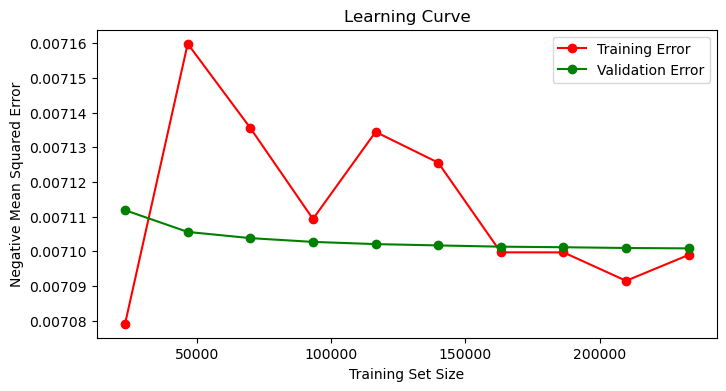

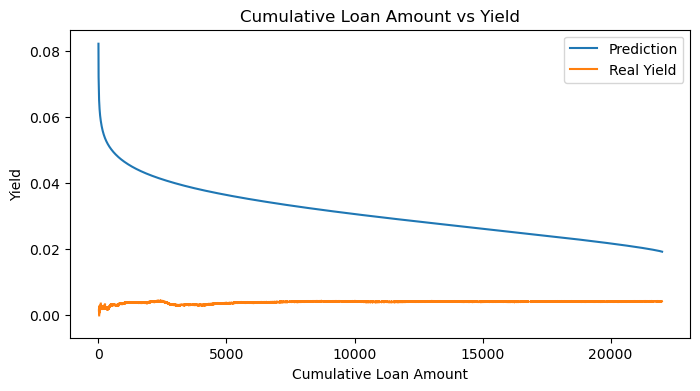

In [97]:
"""
Splitting the data into train and test datasets, with 80% for train and 20% for the test dataset
"""

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

scaler_robust = RobustScaler()
X_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)

mmc = MinMaxScaler()
X_train = mmc.fit_transform(X_train)
X_test = mmc.transform(X_test)

X_train_scaled = mmc.fit_transform(X_train)
X_test_scaled = mmc.transform(X_test)

# Create new DataFrames with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=column_names)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=column_names)

"""
    Plot the learning curve for a given estimator.

    Args:
        estimator: The machine learning model.
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv: The cross-validation generator.
        train_sizes (numpy.ndarray): The training set sizes.

    Returns:
        None

    """

# Assuming X_train, y_train are defined
LR = LinearRegression()

k = 10  # define the number of folds
cv = KFold(n_splits=k, shuffle=True, random_state=42)

mse_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='neg_mean_squared_error', cv=cv)
r2_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='r2', cv=cv)

# cross_val_score gives "negative" values for MSE for the purpose of "score" being higher is better
# take the negative of the MSE scores
mse_scores = -mse_scores

# Calculate RMSE and MAE
rmse_scores = np.sqrt(mse_scores)
mae_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='neg_mean_absolute_error', cv=cv)

# Take the negative values of MAE scores
mae_scores = -mae_scores


# cross_val_score returns an array of scores, you can take the mean to get an average score
avg_mse = np.mean(mse_scores)
avg_r2 = np.mean(r2_scores)
avg_rmse = np.mean(rmse_scores)
avg_mae = np.mean(mae_scores)

# Create DataFrame with performance metrics
Model_perf = pd.DataFrame(columns=['Model_Name', 'MSE', 'R2_Score', 'RMSE', 'MAE'])
Model_perf.loc[len(Model_perf)] = ['Linear Regression', avg_mse, avg_r2, avg_rmse, avg_mae]

print(Model_perf)

# Fit the model to the training data
LR.fit(X_train_scaled_df, y_train)

# Get the predictions for the test data
predictions = LR.predict(X_test_scaled_df)

# Create a DataFrame for the predictions
predictions_df = pd.DataFrame(predictions, columns=['Prediction'], index=X_test_scaled_df.index)

# Concatenate the predictions with the test data
result_df = pd.concat([X_test_scaled_df, predictions_df, y_test], axis=1)


# result_df.to_csv("/Users/tomsaacks/Desktop/שנה ב/סמסטר ב/פרויקט מבוסס אנליטיקה/step4/DATA/result.csv")


def plot_learning_curve(estimator, X, y, cv, train_sizes):
    """
    Plot the learning curve for a given estimator.

    Args:
        estimator: The machine learning model.
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv: The cross-validation generator.
        train_sizes (numpy.ndarray): The training set sizes.

    Returns:
        None

    """
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, train_sizes=train_sizes,
                                                            scoring='neg_mean_squared_error')
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(8, 4))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training Error')
    plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Validation Error')
    plt.xlabel('Training Set Size')
    plt.ylabel('Negative Mean Squared Error')
    plt.title('Learning Curve')
    plt.legend(loc='best')
    plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)  # define the training set sizes

plot_learning_curve(LR, X_train_scaled_df, y_train, cv, train_sizes)

"""
print the graph cumulative_loan_amnt - weighted_yield_yearly_1
"""

result_df = result_df.sort_values(by='Prediction', ascending=False)

# Calculate the cumulative sum of 'loan_amnt'
result_df['cumulative_loan_amnt'] = result_df['loan_amnt'].cumsum()

# Calculate the weighted yield using 'theyield_yearly_1'
result_df['weighted_yield_yearly_1'] = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

# Calculate the weighted yield: multiply 'yield' by 'loan_amnt' and divide by the total 'loan_amnt'
result_df['weighted_yield'] = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

# Create a plot
plt.figure(figsize=(8, 4))

# Plot the weighted yield using 'Prediction'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield'], label='Prediction')

# Plot the weighted yield using 'theyield_yearly_1'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield_yearly_1'], label='Real Yield')

plt.xlabel('Cumulative Loan Amount')
plt.ylabel('Yield')
plt.title('Cumulative Loan Amount vs Yield')
plt.legend()

plt.show()

**Finding the best models for differeces normalizion methods**
**70:30**

          Model_Name       MSE  R2_Score      RMSE       MAE
0  Linear Regression  0.007098  0.023355  0.084251  0.059801


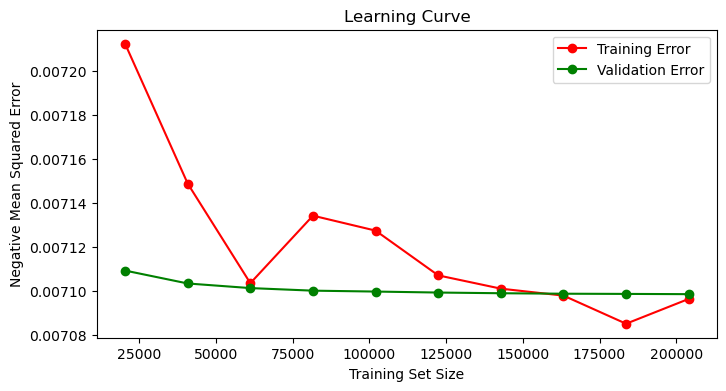

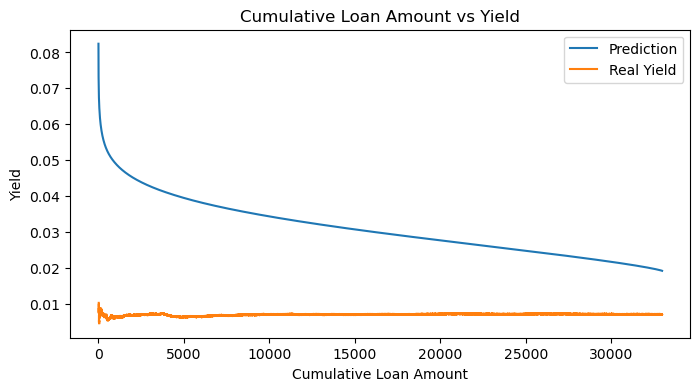

In [98]:
"""
Splitting the data into train and test datasets, with 70% for train and 30% for the test dataset
"""

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

scaler_robust = RobustScaler()
X_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)

mmc = MinMaxScaler()
X_train = mmc.fit_transform(X_train)
X_test = mmc.transform(X_test)

X_train_scaled = mmc.fit_transform(X_train)
X_test_scaled = mmc.transform(X_test)

# Create new DataFrames with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=column_names)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=column_names)

"""
    Plot the learning curve for a given estimator.

    Args:
        estimator: The machine learning model.
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv: The cross-validation generator.
        train_sizes (numpy.ndarray): The training set sizes.

    Returns:
        None

    """

# Assuming X_train, y_train are defined
LR = LinearRegression()

k = 10  # define the number of folds
cv = KFold(n_splits=k, shuffle=True, random_state=42)

mse_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='neg_mean_squared_error', cv=cv)
r2_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='r2', cv=cv)

# cross_val_score gives "negative" values for MSE for the purpose of "score" being higher is better
# take the negative of the MSE scores
mse_scores = -mse_scores

# Calculate RMSE and MAE
rmse_scores = np.sqrt(mse_scores)
mae_scores = cross_val_score(LR, X_train_scaled_df, y_train, scoring='neg_mean_absolute_error', cv=cv)

# Take the negative values of MAE scores
mae_scores = -mae_scores


# cross_val_score returns an array of scores, you can take the mean to get an average score
avg_mse = np.mean(mse_scores)
avg_r2 = np.mean(r2_scores)
avg_rmse = np.mean(rmse_scores)
avg_mae = np.mean(mae_scores)

# Create DataFrame with performance metrics
Model_perf = pd.DataFrame(columns=['Model_Name', 'MSE', 'R2_Score', 'RMSE', 'MAE'])
Model_perf.loc[len(Model_perf)] = ['Linear Regression', avg_mse, avg_r2, avg_rmse, avg_mae]

print(Model_perf)


# Fit the model to the training data
LR.fit(X_train_scaled_df, y_train)

# Get the predictions for the test data
predictions = LR.predict(X_test_scaled_df)

# Create a DataFrame for the predictions
predictions_df = pd.DataFrame(predictions, columns=['Prediction'], index=X_test_scaled_df.index)

# Concatenate the predictions with the test data
result_df = pd.concat([X_test_scaled_df, predictions_df, y_test], axis=1)


def plot_learning_curve(estimator, X, y, cv, train_sizes):
    """
    Plot the learning curve for a given estimator.

    Args:
        estimator: The machine learning model.
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv: The cross-validation generator.
        train_sizes (numpy.ndarray): The training set sizes.

    Returns:
        None

    """
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, train_sizes=train_sizes,
                                                            scoring='neg_mean_squared_error')
    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    plt.figure(figsize=(8, 4))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training Error')
    plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Validation Error')
    plt.xlabel('Training Set Size')
    plt.ylabel('Negative Mean Squared Error')
    plt.title('Learning Curve')
    plt.legend(loc='best')
    plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)  # define the training set sizes

plot_learning_curve(LR, X_train_scaled_df, y_train, cv, train_sizes)


"""
print the graph cumulative_loan_amnt - weighted_yield_yearly_1
"""

result_df = result_df.sort_values(by='Prediction', ascending=False)

# Calculate the cumulative sum of 'loan_amnt'
result_df['cumulative_loan_amnt'] = result_df['loan_amnt'].cumsum()

# Calculate the weighted yield using 'theyield_yearly_1'
result_df['weighted_yield_yearly_1'] = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

# Calculate the weighted yield: multiply 'yield' by 'loan_amnt' and divide by the total 'loan_amnt'
result_df['weighted_yield'] = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

# Create a plot
plt.figure(figsize=(8, 4))

# Plot the weighted yield using 'Prediction'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield'], label='Prediction')

# Plot the weighted yield using 'theyield_yearly_1'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield_yearly_1'], label='Real Yield')

plt.xlabel('Cumulative Loan Amount')
plt.ylabel('Yield')
plt.title('Cumulative Loan Amount vs Yield')
plt.legend()

plt.show()

**cumulative_loan_amnt - weighted_yield_yearly_1 graph**
<br>
print the graph cumulative_loan_amnt - weighted_yield_yearly_1

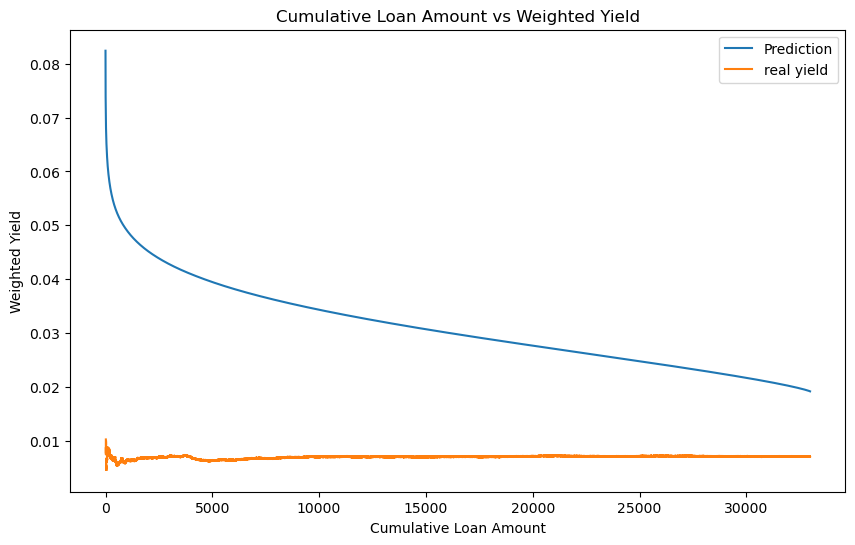

In [99]:
"""
Plot the cumulative loan amount vs. weighted yield for the predictions and real yield.
"""

result_df = result_df.sort_values(by='Prediction', ascending=False)

# Calculate the cumulative sum of 'loan_amnt'
result_df['cumulative_loan_amnt'] = result_df['loan_amnt'].cumsum()

# Calculate the weighted yield using 'theyield_yearly_1'
result_df['weighted_yield_yearly_1'] = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']


# Calculate the weighted yield: multiply 'yield' by 'loan_amnt' and divide by the total 'loan_amnt'
result_df['weighted_yield'] = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

# Create a plot
plt.figure(figsize=(10,6))

# Plot the weighted yield using 'Prediction'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield'], label='Prediction')

# Plot the weighted yield using 'theyield_yearly_1'
plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield_yearly_1'], label='real yield')

plt.xlabel('Cumulative Loan Amount')
plt.ylabel('Weighted Yield')
plt.title('Cumulative Loan Amount vs Weighted Yield')
plt.legend()

plt.show()


## Polynominal Regression

Testing degrees, feature selection, different normalization methods on **80:20** to find the best model.

In [100]:
# Splitting the data into train and test datasets, with 80% for train and 20% for the test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


scaler_robust = RobustScaler()
X_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)


# Create new DataFrames with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=column_names)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=column_names)


          Model_Name  MSE  R2_Score
0  Linear Regression 0.01      0.02


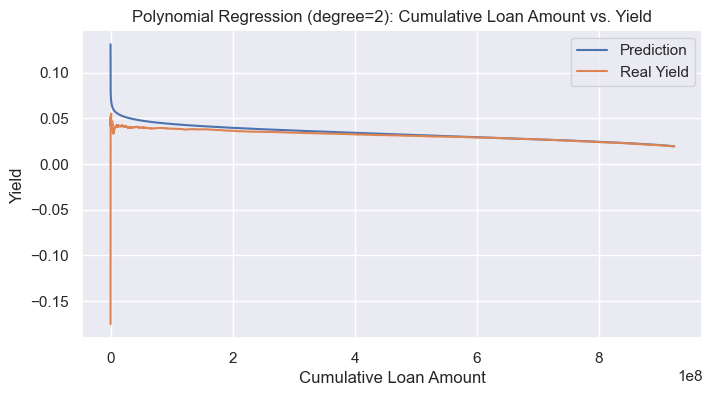

In [ ]:
def cross_validate_linear_regression(X, y, cv=10):
    """
    Perform cross-validation on Linear Regression using negative mean squared error (MSE) as the scoring metric.

    Args:
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv (int, optional): The number of cross-validation folds. Defaults to 10.

    Returns:
        pandas.DataFrame: The model performance metrics for each fold.

    """
    LR = LinearRegression()
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)

    mse_scores = cross_val_score(LR, X, y, scoring='neg_mean_squared_error', cv=kf)
    r2_scores = cross_val_score(LR, X, y, scoring='r2', cv=kf)

    mse_scores = -mse_scores
    avg_mse = np.mean(mse_scores)
    avg_r2 = np.mean(r2_scores)

    Model_perf = pd.DataFrame(columns=['Model_Name','MSE','R2_Score'])
    Model_perf.loc[len(Model_perf)] = ['Linear Regression', avg_mse, avg_r2]

    return Model_perf

def perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees):
    """
    Perform polynomial regression for different degrees and evaluate the model performance.

    Args:
        X_train (pandas.DataFrame): The input training feature data.
        X_test (pandas.DataFrame): The input test feature data.
        y_train (pandas.Series): The training target variable.
        y_test (pandas.Series): The test target variable.
        degrees (list): List of degrees for polynomial regression.

    Returns:
        pandas.DataFrame: The model performance metrics for each polynomial degree.

    """
    Model_perf = pd.DataFrame(columns=['Model_Name','MSE','R2_Score'])

    for degree in degrees:
        # Create a PolynomialFeatures object with the specified degree
        poly = PolynomialFeatures(degree=degree)

        # Transform the features into polynomial features
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        # Fit the polynomial regression model
        poly_LR = LinearRegression()
        poly_LR.fit(X_train_poly, y_train)

        # Get the predictions for the test data
        y_pred_poly = poly_LR.predict(X_test_poly)

        # Calculate the MSE and R2 score
        poly_mse = mean_squared_error(y_test, y_pred_poly)
        poly_r2 = r2_score(y_test, y_pred_poly)

        # Append the results to the DataFrame
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', poly_mse, poly_r2]

        # Create a DataFrame for the predictions
        poly_predictions_df = pd.DataFrame(y_pred_poly, columns=['Prediction'], index=X_test.index)

        # Concatenate the predictions with the test data
        poly_result_df = pd.concat([X_test, poly_predictions_df, y_test], axis=1)

        # Plot the cumulative loan amount vs. yield for each polynomial degree
        poly_result_df = poly_result_df.sort_values(by='Prediction', ascending=False)
        cumulative_loan_amnt = poly_result_df['loan_amnt'].cumsum()
        weighted_yield_yearly_1 = (poly_result_df['yield_2'] * poly_result_df['loan_amnt']).cumsum() / cumulative_loan_amnt
        weighted_yield = (poly_result_df['Prediction'] * poly_result_df['loan_amnt']).cumsum() / cumulative_loan_amnt

        plt.figure(figsize=(8, 4))
        plt.plot(cumulative_loan_amnt, weighted_yield, label='Prediction')
        plt.plot(cumulative_loan_amnt, weighted_yield_yearly_1, label='Real Yield')
        plt.xlabel('Cumulative Loan Amount')
        plt.ylabel('Yield')
        plt.title(f'Polynomial Regression (degree={degree}): Cumulative Loan Amount vs. Yield')
        plt.legend()
        plt.show()

    return Model_perf

# Cross-validation for Linear Regression
model_performance = cross_validate_linear_regression(X_train, y_train)
print(model_performance)

# Fit the linear regression model to the training data
LR.fit(X_train, y_train)

# Get the predictions for the test data
predictions = LR.predict(X_test)

# Create a DataFrame for the predictions
predictions_df = pd.DataFrame(predictions, columns=['Prediction'], index=X_test.index)

# Concatenate the predictions with the test data
result_df = pd.concat([X_test, predictions_df, y_test], axis=1)

# Perform polynomial regression for different degrees
degrees = [2, 3]
poly_model_performance = perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees)
print(poly_model_performance)

# Plot the cumulative loan amount vs. yield for the linear regression model
result_df = result_df.sort_values(by='Prediction', ascending=False)
cumulative_loan_amnt = result_df['loan_amnt'].cumsum()
weighted_yield_yearly_1 = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / cumulative_loan_amnt
weighted_yield = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / cumulative_loan_amnt

plt.figure(figsize=(8, 4))
plt.plot(cumulative_loan_amnt, weighted_yield, label='Prediction')
plt.plot(cumulative_loan_amnt, weighted_yield_yearly_1, label='Real Yield')
plt.xlabel('Cumulative Loan Amount')
plt.ylabel('Yield')
plt.title('Linear Regression: Cumulative Loan Amount vs. Yield')
plt.legend()
plt.show()

Testing degrees, feature selection, different normalization methods on **70:30** to find the best model.

In [101]:
# Splitting the data into train and test datasets, with 80% for train and 20% for the test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


scaler_robust = RobustScaler()
X_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)


# Create new DataFrames with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=column_names)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=column_names)

          Model_Name       MSE  R2_Score
0  Linear Regression  0.007098  0.023355


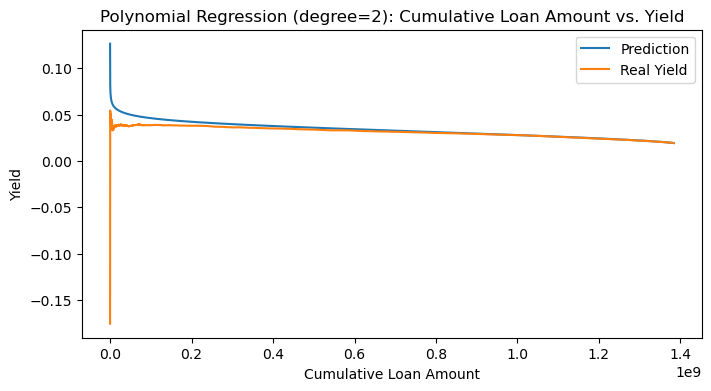

In [ ]:
def cross_validate_linear_regression(X, y, cv=10):
    """
    Perform cross-validation on Linear Regression using negative mean squared error (MSE) as the scoring metric.

    Args:
        X (pandas.DataFrame): The input feature data.
        y (pandas.Series): The target variable.
        cv (int, optional): The number of cross-validation folds. Defaults to 10.

    Returns:
        pandas.DataFrame: The model performance metrics for each fold.

    """
    LR = LinearRegression()
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)

    mse_scores = cross_val_score(LR, X, y, scoring='neg_mean_squared_error', cv=kf)
    r2_scores = cross_val_score(LR, X, y, scoring='r2', cv=kf)

    mse_scores = -mse_scores
    avg_mse = np.mean(mse_scores)
    avg_r2 = np.mean(r2_scores)

    Model_perf = pd.DataFrame(columns=['Model_Name','MSE','R2_Score'])
    Model_perf.loc[len(Model_perf)] = ['Linear Regression', avg_mse, avg_r2]

    return Model_perf

def perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees):
    """
    Perform polynomial regression for different degrees and evaluate the model performance.

    Args:
        X_train (pandas.DataFrame): The input training feature data.
        X_test (pandas.DataFrame): The input test feature data.
        y_train (pandas.Series): The training target variable.
        y_test (pandas.Series): The test target variable.
        degrees (list): List of degrees for polynomial regression.

    Returns:
        pandas.DataFrame: The model performance metrics for each polynomial degree.

    """
    Model_perf = pd.DataFrame(columns=['Model_Name','MSE','R2_Score'])

    for degree in degrees:
        # Create a PolynomialFeatures object with the specified degree
        poly = PolynomialFeatures(degree=degree)

        # Transform the features into polynomial features
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        # Fit the polynomial regression model
        poly_LR = LinearRegression()
        poly_LR.fit(X_train_poly, y_train)

        # Get the predictions for the test data
        y_pred_poly = poly_LR.predict(X_test_poly)

        # Calculate the MSE and R2 score
        poly_mse = mean_squared_error(y_test, y_pred_poly)
        poly_r2 = r2_score(y_test, y_pred_poly)

        # Append the results to the DataFrame
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', poly_mse, poly_r2]

        # Create a DataFrame for the predictions
        poly_predictions_df = pd.DataFrame(y_pred_poly, columns=['Prediction'], index=X_test.index)

        # Concatenate the predictions with the test data
        poly_result_df = pd.concat([X_test, poly_predictions_df, y_test], axis=1)

        # Plot the cumulative loan amount vs. yield for each polynomial degree
        poly_result_df = poly_result_df.sort_values(by='Prediction', ascending=False)
        cumulative_loan_amnt = poly_result_df['loan_amnt'].cumsum()
        weighted_yield_yearly_1 = (poly_result_df['yield_2'] * poly_result_df['loan_amnt']).cumsum() / cumulative_loan_amnt
        weighted_yield = (poly_result_df['Prediction'] * poly_result_df['loan_amnt']).cumsum() / cumulative_loan_amnt

        plt.figure(figsize=(8, 4))
        plt.plot(cumulative_loan_amnt, weighted_yield, label='Prediction')
        plt.plot(cumulative_loan_amnt, weighted_yield_yearly_1, label='Real Yield')
        plt.xlabel('Cumulative Loan Amount')
        plt.ylabel('Yield')
        plt.title(f'Polynomial Regression (degree={degree}): Cumulative Loan Amount vs. Yield')
        plt.legend()
        plt.show()

    return Model_perf

# Cross-validation for Linear Regression
model_performance = cross_validate_linear_regression(X_train, y_train)
print(model_performance)

# Fit the linear regression model to the training data
LR.fit(X_train, y_train)

# Get the predictions for the test data
predictions = LR.predict(X_test)

# Create a DataFrame for the predictions
predictions_df = pd.DataFrame(predictions, columns=['Prediction'], index=X_test.index)

# Concatenate the predictions with the test data
result_df = pd.concat([X_test, predictions_df, y_test], axis=1)

# Perform polynomial regression for different degrees
degrees = [2,3]
poly_model_performance = perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees)
print(poly_model_performance)

# Plot the cumulative loan amount vs. yield for the linear regression model
result_df = result_df.sort_values(by='Prediction', ascending=False)
cumulative_loan_amnt = result_df['loan_amnt'].cumsum()
weighted_yield_yearly_1 = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / cumulative_loan_amnt
weighted_yield = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / cumulative_loan_amnt

plt.figure(figsize=(8, 4))
plt.plot(cumulative_loan_amnt, weighted_yield, label='Prediction')
plt.plot(cumulative_loan_amnt, weighted_yield_yearly_1, label='Real Yield')
plt.xlabel('Cumulative Loan Amount')
plt.ylabel('Yield')
plt.title('Linear Regression: Cumulative Loan Amount vs. Yield')
plt.legend()
plt.show()

## Enhancing the Performance 
## Classification Models
We saw earlier that according to all the indicators, the Logistic Regression model gave the best performance. Therefore, now we will try to go deeper into the investigation of the model and the testing of the various hyperparameters.

In [158]:
"""
loding again the data
"""
Data_LG= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_LG.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade','id','yield_yearly_1'], axis=1, inplace=True)
X = Data_LG.drop(columns=['yield_over']).values
y = Data_LG['yield_over'].values

### Enhancing the Performance of Logistic Regression
**Implement forward selection and logistic regression with various of hyperparameters**

In [159]:
def forward_selection(X, y, model, k):
    """
    Performs forward feature selection using Random Forest for feature ranking and Logistic Regression
    for feature selection.

    Parameters:
        X (array-like): The input feature matrix.
        y (array-like): The target variable array.
        model (estimator): The estimator used for feature selection.
        k (int): The number of features to select.

    Returns:
        A list containing the selected feature indices and the reduced feature matrix.
    """

    # Rank features based on importance using Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)
    feature_importances = rf.feature_importances_
    feature_indices = (-feature_importances).argsort()[:30]  # Select top 30 features

    X_reduced = X[:, feature_indices]

    X_train, _, y_train, _ = train_test_split(X_reduced, y, test_size=0.3, random_state=42)

    feature_selector = SequentialFeatureSelector(model, k_features=k, forward=True,
                                                 scoring='f1_weighted', cv=2)
    feature_selector.fit(X_train, y_train)
    selected_features = list(feature_selector.k_feature_idx_)

    return (selected_features,X_reduced)

In [260]:
"""
Perform logistic regression with feature selection and hyperparameter tuning.
This code snippet performs logistic regression with feature selection using forward 
selection and hyperparameter tuning using combinations of different hyperparameters. 
It calculates the F1 score for each combination of hyperparameters, feature subsets, and threshold values. 
The best combination of hyperparameters, features, and threshold is determined based on the highest F1 score achieved.
"""

scaler = RobustScaler()

n_iter = [1000, 2000,5000]
epss = [0.01, 0.001, 0.0001,0.00001, 0.000001]
penalties = ['l1', 'l2']
thresholds = [0.40,0.50,0.60]
feat_num=[10,15,20]
C=[0.1,0.5,1,10]
n_iter_epss_penalties_C_combinations = list(itertools.product(n_iter, epss, penalties,C))

n_iter_epss_penalties_C_combinations = random.sample(n_iter_epss_penalties_C_combinations, 50)

dic_LG = {}

for k in feat_num:
    model = LogisticRegression(solver='liblinear', penalty="l2", class_weight='balanced',max_iter=10000)
    
    selected_features,X_reduced = forward_selection(X, y, model, k)
    
    for com in n_iter_epss_penalties_C_combinations:
        n_iter, eps, penalty,C = com
        
        for threshold in thresholds:
            dic_LG[n_iter,eps,penalty,tuple(selected_features),threshold,C]=0

        for fold in range(5): 
            rel_X = X_reduced[:,selected_features]
            indices = np.random.permutation(rel_X.shape[0])
            idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
            X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
            y_train, y_val = y[idx_train], y[idx_val]

            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)

            model=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')

            model.fit(X_train_scaled, y_train)
                
            y_prob = model.predict_proba(X_val_scaled)
                
            for threshold in thresholds:
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')
                dic_LG[n_iter,eps,penalty,tuple(selected_features),threshold,C]+=F1_score

        for threshold in thresholds:
            dic_LG[n_iter,eps,penalty,tuple(selected_features),threshold,C]/=5

best_n_iter_LG,best_eps_LG,best_penalty_LG,best_features_LG,best_threshold_LG,best_C_LG=max(dic_LG,key=dic_LG.get) 

NameError: name 'forward_selection' is not defined

Because each run produced different results, I will manually save the results and work on them later in the project.

In [166]:
best_n_iter_LG=5000
best_eps_LG=1e-05
best_penalty_LG='l2'
best_selected_features_list=[0, 1, 2, 3, 9, 10, 12, 13, 15, 17, 18, 19, 22, 23, 24, 25, 26, 27, 28, 29]
best_threshold_LG=0.4
best_c_LG=10

These hyperparameters will be evaluated with few metric to handling the imbalanced nature of the dataset. We will assess the performance of the logistic regression model in terms of precision, recall, F1-score, and accuracy, taking into account the class imbalance.

**Evaluating the impact of not applying any specific technique on the data**

In [161]:
"""
loding again the data for any case of change
"""
Data_LG= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_LG.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade','id','yield_yearly_1'], axis=1, inplace=True)
X = Data_LG.drop(columns=['yield_over']).values
y = Data_LG['yield_over'].values

In [162]:
"""
Calculates performance metrics of the best logistic regression model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,C=c)

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= threshold).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results1 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_non = [[key, value] for key, value in dic_results1.items()]
headers = ["Metric", "Value"]
table_LG_non = tabulate(table_LG_non, headers, tablefmt="grid")
headline = "Performance Evaluation of Logistic Regression on Imbalanced Target Variable"
table_with_headline = f"{headline}\n\n{table_LG_non}"
print(table_with_headline)


Performance Evaluation of Logistic Regression on Imbalanced Target Variable

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.695733 |
+-----------+----------+
| recall    | 0.788237 |
+-----------+----------+
| precision | 0.712221 |
+-----------+----------+
| accuracy  | 0.788237 |
+-----------+----------+


**Evaluating the impact of 'class_weight' argument to account for the imbalance in class distribution:**

In [163]:
"""
Calculates performance metrics of the best logistic regression model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty, class_weight='balanced')

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= threshold).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results2 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_forward = [[key, value] for key, value in dic_results2.items()]
headers = ["Metric", "Value"]
table_LG_forward = tabulate(table_LG_forward, headers, tablefmt="grid")
headline = "Performance Metrics for Logistic Regression with class_weight"
table_with_headline = f"{headline}\n\n{table_LG_forward}"
print(table_with_headline)


Performance Metrics for Logistic Regression with class_weight

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.724842 |
+-----------+----------+
| recall    | 0.739159 |
+-----------+----------+
| precision | 0.714534 |
+-----------+----------+
| accuracy  | 0.739159 |
+-----------+----------+


**Exploring over-sampling as a means to address the skewness**

In [167]:
"""
Performs logistic regression with oversampling using k-fold cross-validation on a dataset and 
calculates performance metrics such as F1 score, recall, precision, and accuracy.
This code applies logistic regression with oversampling to handle imbalanced data. 
It splits the dataset into training and validation sets, applies RandomOverSampler to 
oversample the minority class in the training set, and scales the feature data using RobustScaler. 
Logistic regression is then performed using the scaled and resampled training data. The model's predictions 
are evaluated on the validation set using different performance metrics.
The process is repeated for each fold in the cross-validation. Finally, the average performance metrics 
across all folds are calculated and presented in a formatted table.
"""

scaler = RobustScaler()
total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5): 
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    oversampler = RandomOverSampler()
    X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train, y_train)

    X_train_scaled = scaler.fit_transform(X_train_resampled)
    X_val_scaled = scaler.transform(X_val)

    model_LG = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG)

    model_LG.fit(X_train_scaled, y_train_resampled)
                
    y_prob = model_LG.predict_proba(X_val_scaled)
                
    y_pred = (y_prob[:, 1] >= threshold).astype(int)
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)
    
total_weighted_f1 /= 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results3 = {
    'F1': total_weighted_f1,
    'Recall': weighted_recall,
    'Precision': weighted_precision,
    'Accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_oversample = [[key, value] for key, value in dic_results3.items()]
headers = ["Metric", "Value"]
table_LG_oversample = tabulate(table_LG_oversample, headers, tablefmt="grid")
headline = "Performance Metrics for Logistic Regression with Oversampling"
table_with_headline = f"{headline}\n\n{table_LG_oversample}"
print(table_with_headline)


Performance Metrics for Logistic Regression with Oversampling

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.724662 |
+-----------+----------+
| Recall    | 0.738693 |
+-----------+----------+
| Precision | 0.714455 |
+-----------+----------+
| Accuracy  | 0.738693 |
+-----------+----------+


As we can see the LG with class_weight given the best F1 score, so we will continue to check this metric in deep

**Implement logistic regression with various of hyperparameters and all the features**

In [298]:
"""
Perform logistic regression with hyperparameter tuning.

This code snippet performs logistic regression with hyperparameter tuning using different combinations 
of hyperparameters. It calculates the F1 score for each combination of hyperparameters and threshold values. 
The best combination of hyperparameters and threshold is determined based on the highest F1 score achieved.
"""

scaler = RobustScaler()

n_iter = [1000, 2000,5000]
epss = [0.01, 0.001, 0.0001,0.00001, 0.000001]
penalties = ['l1', 'l2']
thresholds = [0.40,0.50,0.60]
feat_num=[10,15,20,30]
C=[0.1,0.5,1,10]
n_iter_epss_penalties_C_combinations = list(itertools.product(n_iter, epss, penalties,C))

n_iter_epss_penalties_C_combinations = random.sample(n_iter_epss_penalties_C_combinations, 40)

dic_LG1 = {}
    
for com in n_iter_epss_penalties_C_combinations:
    n_iter, eps, penalty,C = com
        
    for threshold in thresholds:
        dic_LG1[n_iter,eps,penalty,threshold,C]=0

    for fold in range(5): 
        indices = np.random.permutation(X.shape[0])
        idx_train, idx_val = indices[:int(0.7*X.shape[0])], indices[int(0.7*X.shape[0]):]
        X_train, X_val = X[idx_train], X[idx_val,:]
        y_train, y_val = y[idx_train], y[idx_val]

        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        model=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')

        model.fit(X_train_scaled, y_train)
            
        y_prob = model.predict_proba(X_val_scaled)
                    
        for threshold in thresholds:
            y_pred = (y_prob[:, 1] >= threshold).astype(int)
            F1_score=f1_score(y_val, y_pred, average = 'weighted')
            dic_LG1[n_iter,eps,penalty,threshold,C]+=F1_score

    for threshold in thresholds:
        dic_LG1[n_iter,eps,penalty,threshold,C]/=5

best_n_iter_LG,best_eps_LG,best_penalty_LG,best_threshold_LG,best_C_LG=min(dic_LG1,key=dic_LG1.get) 

Because each run produced different results, I will manually save the results and work on them later in the project.

In [378]:
best_n_iter_LG=1000
best_eps_LG=0.01
best_penalty_LG='l1'
best_threshold_LG=0.6
best_C_LG=0.5

**Evaluating the impact of the use of all existing features**

In [380]:
"""
Calculates performance metrics of the best logistic regression model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5):
    indices = np.random.permutation(X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * X.shape[0])], indices[int(0.7 * X.shape[0]):]
    X_train, X_val = X[idx_train], X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG, class_weight='balanced')

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results4 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_all = [[key, value] for key, value in dic_results4.items()]
headers = ["Metric", "Value"]
table_LG_all = tabulate(table_LG_all, headers, tablefmt="grid")
headline = "Performance Metrics for Logistic Regression with all the features"
table_with_headline = f"{headline}\n\n{table_LG_all}"
print(table_with_headline)


Performance Metrics for Logistic Regression with all the features

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.463303 |
+-----------+----------+
| recall    | 0.441288 |
+-----------+----------+
| precision | 0.760354 |
+-----------+----------+
| accuracy  | 0.441288 |
+-----------+----------+


**Implement feature selection based on tree-based feature importance and logistic regression with various of hyperparameters**

In [300]:
def tree_based_feature_selection(X, y, num_features):
    """
    Performs feature selection based on tree-based feature importance.

    Parameters:
        X (array-like): The feature matrix.
        y (array-like): The target variable.
        num_features (int): The number of features to select.

    Returns:
        list: A list of indices corresponding to the selected features.

    """
    model = RandomForestClassifier()
    model.fit(X, y)
    importances = model.feature_importances_
    feature_indices = np.argsort(importances)[::-1][:num_features]
    selected_features = feature_indices.tolist()
    
    return selected_features


In [301]:
"""
Perform logistic regression with tree-based feature selection and hyperparameter tuning.

This code snippet performs logistic regression with tree-based feature selection using a 
specified number of features (`feat_num`) and hyperparameter tuning using different combinations 
of hyperparameters. It calculates the F1 score for each combination of hyperparameters, feature subsets, 
and threshold values. The best combination of hyperparameters, features, and threshold is determined 
based on the highest F1 score achieved.
"""

scaler = RobustScaler()

n_iter = [1000, 2000,5000]
epss = [0.01, 0.001, 0.0001,0.00001, 0.000001]
penalties = ['l1', 'l2']
thresholds = [0.40,0.50,0.60]
feat_num=[10,15,20,30]
C=[0.1,0.5,1,10]
n_iter_epss_penalties_C_combinations = list(itertools.product(n_iter, epss, penalties,C))

n_iter_epss_penalties_C_combinations = random.sample(n_iter_epss_penalties_C_combinations, 40)

dic_LG2 = {}

for k in feat_num:
    selected_features = tree_based_feature_selection(X, y, k)
    
    for com in n_iter_epss_penalties_C_combinations:
        n_iter, eps, penalty,C = com
        
        for threshold in thresholds:
            dic_LG2[n_iter,eps,penalty,tuple(selected_features),threshold,C]=0

        for fold in range(5): 
            rel_X = X[:,selected_features]
            indices = np.random.permutation(rel_X.shape[0])
            idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
            X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
            y_train, y_val = y[idx_train], y[idx_val]

            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)

            model=LogisticRegression(max_iter=n_iter, tol=eps, solver='liblinear', penalty=penalty,class_weight='balanced')

            model.fit(X_train_scaled, y_train)

            y_prob = model.predict_proba(X_val_scaled)
            
            for threshold in thresholds:
                y_pred = (y_prob[:, 1] >= threshold).astype(int)
                F1_score=f1_score(y_val, y_pred, average = 'weighted')
                dic_LG2[n_iter,eps,penalty,tuple(selected_features),threshold,C]+=F1_score

        for threshold in thresholds:
            dic_LG2[n_iter,eps,penalty,tuple(selected_features),threshold,C]/=5

best_n_iter_LG,best_eps_LG,best_penalty_LG,best_features_LG,best_threshold_LG,best_C_LG=max(dic_LG2,key=dic_LG2.get) 

Because each run produced different results, I will manually save the results and work on them later in the project.

In [479]:
best_n_iter_LG=5000
best_eps_LG=1e-06
best_penalty_LG='l2'
selected_features_list=[57,58,52,1,68,19,48,64,66,49,14,54,67,35,65,18,15,45,34,44,11,40,36,10,5,51,50,43,42,13]
best_threshold_LG=0.4
best_C_LG=1

**Evaluating the impact of feature selection based on tree-based feature importance**

In [471]:
scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0
lg_fpr = []
lg_tpr = []
lg_roc_auc = []

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG, class_weight='balanced')

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)

    fpr, tpr, _ = roc_curve(y_val, y_prob[:, 1])  # Use probabilities for positive class
    lg_fpr.append(fpr)
    lg_tpr.append(tpr)

    # Calculate ROC AUC score
    roc_auc = roc_auc_score(y_val, y_prob[:, 1])  # Use probabilities for positive class
    lg_roc_auc.append(roc_auc)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

# Resize fold arrays to the same length
max_length = max(len(arr) for arr in lg_fpr)
lg_fpr = [np.resize(arr, max_length) for arr in lg_fpr]
lg_tpr = [np.resize(arr, max_length) for arr in lg_tpr]

lg_fpr = np.mean(lg_fpr, axis=0)
lg_tpr = np.mean(lg_tpr, axis=0)

lg_roc_auc = np.mean(lg_roc_auc)


dic_results_lg_best = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_importance = [[key, value] for key, value in dic_results_lg_best.items()]
headers = ["Metric", "Value"]
table_LG_importance = tabulate(table_LG_importance, headers, tablefmt="grid")
headline = "Performance Metrics for Logistic Regression with feature importance"
table_with_headline = f"{headline}\n\n{table_LG_importance}"
print(table_with_headline)


Performance Metrics for Logistic Regression with feature importance

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.723151 |
+-----------+----------+
| recall    | 0.730115 |
+-----------+----------+
| precision | 0.717207 |
+-----------+----------+
| accuracy  | 0.730115 |
+-----------+----------+


### Applying AdaBoost with Logistic Regression
To improve our classification model, we will implement AdaBoost, an ensemble learning technique that combines multiple weak classifiers to create a strong classifier. We will use Logistic Regression as our base classifier, which has shown promising results in previous analyses. AdaBoost assigns weights to training instances, focusing on misclassified examples in subsequent iterations to reduce bias and improve generalization. By sequentially training LG on modified subsets based on previous model performance, we can adapt to complex decision boundaries and anticipate better classification results with improved accuracy and robustness.

**Type 1 Base Estimator:** Basic and Weak Model- consisted of a basic and weak model without any modifications to the hyperparameters. 

In [394]:
"""
Performs AdaBoost ensemble learning with logistic regression base classifiers on a dataset 
using k-fold cross-validation and selects the best combination of learning rate and number of estimators 
based on F1 score. This code applies AdaBoost ensemble learning with logistic regression base 
classifiers to the dataset. It performs a grid search over different combinations of learning rates and 
number of estimators, selecting a subset of random combinations. The dataset is then divided into training 
and validation sets for each fold of cross-validation. The input features are scaled using RobustScaler, and 
an AdaBoost model is trained using logistic regression as the base classifier. The model's predictions are 
evaluated on the validation set using the F1 score as the performance metric.
The process is repeated for each combination of learning rate and number of estimators and for each fold in the 
cross-validation. The average F1 score across all folds is calculated for each combination. Finally, the combination 
with the highest average F1 score is selected as the best learning rate and number of estimators.

"""
scaler = RobustScaler()

learning_rates=[0.1,0.5,0.6]
n_estimators=[30,50,80] 

learning_rate_n_estimators = list(itertools.product(learning_rates,n_estimators))

dic_adaboost1 = {}

for com in learning_rate_n_estimators:
    dic_adaboost1[com]=0

for com in learning_rate_n_estimators:
    learning_rate,n_estimator=com
        
    for fold in range(5): 
        rel_X = X[:,selected_features]
        indices = np.random.permutation(rel_X.shape[0])
        idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
        X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
        y_train, y_val = y[idx_train], y[idx_val]

        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        base_classifier = LogisticRegression(class_weight='balanced')

        adaboost_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimator, learning_rate=learning_rate)

        adaboost_model.fit(X_train_scaled, y_train)

        y_prob = adaboost_model.predict_proba(X_val_scaled)

        y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)
        F1_score=f1_score(y_val, y_pred, average = 'weighted')
        dic_adaboost1[com]+=F1_score

    dic_adaboost1[com]/=5
       
best_learning_rate,best_n_estimators=max(dic_adaboost1,key=dic_adaboost1.get)

Because each run produced different results, I will manually save the results and work on them later in the project.

In [192]:
selected_features_list_LG=[57,58,52,1,68,19,48,64,66,49,14,54,67,35,65,18,15,45,34,44,11,40,36,10,5,51,50,43,42,13]
best_learning_rate=0.6
best_n_estimators=50

Calculates performance metrics of the best AdaBoost model with this hyperparamters.

In [193]:
scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

adaboost_fpr = []
adaboost_tpr = []
adaboost_roc_auc = []

for fold in range(5):
    rel_X = X[:, selected_features_list_LG]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    base_classifier = LogisticRegression(class_weight='balanced')
    adaboost_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=best_n_estimators, learning_rate=best_learning_rate)
    adaboost_model.fit(X_train_scaled, y_train)

    y_prob = adaboost_model.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

    fpr, tpr, _ = roc_curve(y_val, y_prob[:, 1])  # Use probabilities for positive class
    adaboost_fpr.append(fpr)
    adaboost_tpr.append(tpr)

    # Calculate ROC AUC score
    roc_auc = roc_auc_score(y_val, y_prob[:, 1])  # Use probabilities for positive class
    adaboost_roc_auc.append(roc_auc)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

adaboost_fpr_lengths = [len(fpr) for fpr in adaboost_fpr]
adaboost_tpr_lengths = [len(tpr) for tpr in adaboost_tpr]
min_length = min(adaboost_fpr_lengths + adaboost_tpr_lengths)

adaboost_fpr = np.mean([fpr[:min_length] for fpr in adaboost_fpr], axis=0)
adaboost_tpr = np.mean([tpr[:min_length] for tpr in adaboost_tpr], axis=0)
adaboost_roc_auc = np.mean(adaboost_roc_auc)

dic_results_adaboost_best = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

# Create a table displaying performance metrics
table_Ada_weak_learner = [[key, value] for key, value in dic_results_adaboost_best.items()]
headers = ["Metric", "Value"]
table_Ada_weak_learner = tabulate(table_Ada_weak_learner, headers, tablefmt="grid")
headline = "Performance Metrics for AdaBoost with Logistic Regression- Basic and Weak Model"
print(headline)
print(table_Ada_weak_learner)
print("\n")


Performance Metrics for AdaBoost with Logistic Regression- Basic and Weak Model
+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.695167 |
+-----------+----------+
| recall    | 0.788436 |
+-----------+----------+
| precision | 0.621632 |
+-----------+----------+
| accuracy  | 0.788436 |
+-----------+----------+




**Type 2 Base Estimator:** Optimized Model from Logistic Regression- utilized a base estimator incorporating the hyperparameters that yielded the best results in the previous logistic regression step. This allowed us to compare the performance of the AdaBoost model using both the default and optimized base estimators.

In [400]:
"""
Performs AdaBoost ensemble learning with logistic regression base classifiers on a dataset using 
k-fold cross-validation and selects the best combination of learning rate and number of estimators 
based on the weighted F1 score. The dataset is scaled using RobustScaler. 
The code conducts a grid search over different combinations of learning rates and number of estimators, 
selecting a subset of random combinations. For each combination and each fold of cross-validation, 
the dataset is divided into training and validation sets. The training data is scaled, and an AdaBoost 
model is trained using logistic regression as the base classifier. The model's predictions on the validation 
set are evaluated using the weighted F1 score. 
The average weighted F1 score across all folds is calculated for each combination. 
Finally, the combination with the highest average weighted F1 score is selected as the best learning rate and 
number of estimators.
"""

scaler = RobustScaler()

learning_rates=[0.1,0.5,0.6]
n_estimators=[30,50,80] 

learning_rate_n_estimators = list(itertools.product(learning_rates,n_estimators))
learning_rate_n_estimators = random.sample(learning_rate_n_estimators, 3)

dic_adaboost = {}

for com in learning_rate_n_estimators:
    dic_adaboost[com]=0

for com in learning_rate_n_estimators:
    learning_rate,n_estimator=com
        
    for fold in range(5): 
        rel_X = X[:,selected_features]
        indices = np.random.permutation(rel_X.shape[0])
        idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
        X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
        y_train, y_val = y[idx_train], y[idx_val]

        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        base_classifier = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG, class_weight='balanced')

        adaboost_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=n_estimator, learning_rate=learning_rate)

        adaboost_model.fit(X_train_scaled, y_train)

        y_prob = adaboost_model.predict_proba(X_val_scaled)

        y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)
        F1_score=f1_score(y_val, y_pred, average = 'weighted')
        dic_adaboost[com]+=F1_score

    dic_adaboost[com]/=5
       
best_learning_rate,best_n_estimators=max(dic_adaboost,key=dic_adaboost.get)


Because each run produced different results, I will manually save the results and work on them later in the project.

In [194]:
selected_features_list_LG=[57,58,52,1,68,19,48,64,66,49,14,54,67,35,65,18,15,45,34,44,11,40,36,10,5,51,50,43,42,13]
best_n_iter_LG=5000
best_eps_LG=1e-06
best_penalty_LG='l2'
best_threshold_LG=0.4
best_C_LG=1

best_learning_rate=0.6
best_n_estimators=30

Calculates performance metrics of the best AdaBoost model with this hyperparamters.

In [195]:
"""
Calculates performance metrics of the best AdaBoost model.
"""

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5): 
    rel_X = X[:,selected_features_list_LG]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    base_classifier = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG, class_weight='balanced')

    adaboost_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=best_n_estimators, learning_rate=best_learning_rate)
    adaboost_model.fit(X_train_scaled, y_train)

    y_prob = adaboost_model.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results5 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_Ada_best = [[key, value] for key, value in dic_results5.items()]
headers = ["Metric", "Value"]
table_Ada_best = tabulate(table_Ada_best, headers, tablefmt="grid")
headline = "Performance Metrics for AdaBoost with Logistic Regression- Optimized Model from Logistic Regression"
table_with_headline = f"{headline}\n\n{table_Ada_best}"
print(table_with_headline)


Performance Metrics for AdaBoost with Logistic Regression- Optimized Model from Logistic Regression

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.693943 |
+-----------+----------+
| recall    | 0.787545 |
+-----------+----------+
| precision | 0.620228 |
+-----------+----------+
| accuracy  | 0.787545 |
+-----------+----------+


### Exploring the Effectiveness of KNN
To conduct a comprehensive test, we will implement the KNN (K-Nearest Neighbors) algorithm, which is based on distance measurements. This approach differs from logistic regression, XGBoost, and decision trees. KNN determines the class of a data point based on the majority class of its nearest neighbors. By incorporating KNN into our analysis, we aim to explore the effectiveness of distance-based methods in comparison to other classification techniques.

In [168]:
"""
Loading the data again
"""

Data_knn= pd.read_csv('/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/data.csv')
Data_knn.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade','id','yield_yearly_1'], axis=1, inplace=True)
X = Data_knn.drop(columns=['yield_over']).values
y = Data_knn['yield_over'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

We will examine different combinations of hyperparameters for the knn model with the application of selecting features according to importance

In [169]:
"""
Performs AdaBoost ensemble learning with logistic regression base classifiers on a dataset using k-fold 
cross-validation and selects the best combination of learning rate and number of estimators based on the weighted F1 
score. The dataset is scaled using RobustScaler. The code conducts a grid search over different combinations of 
learning rates and number of estimators, selecting a subset of random combinations. For each combination and each fold 
of cross-validation, the dataset is divided into training and validation sets. The training data is scaled, and an 
AdaBoost model is trained using logistic regression as the base classifier. The model's predictions on the validation 
set are evaluated using the weighted F1 score. The average weighted F1 score across all folds is calculated for each 
combination. Finally, the combination with the highest average weighted F1 score is selected as the best learning 
rate and number of estimators.

"""
scaler_standard = StandardScaler()
scaler_minmax = MinMaxScaler()
scaler_robust = RobustScaler()

scalers = [scaler_standard, scaler_minmax, scaler_robust]
k_range = range(3, 16, 2)
metrics = ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
feat_num=[10,15,20]

combinations = list(itertools.product(scalers, k_range, metrics))

dic_KNN = {}

for n in feat_num:
    model = KNeighborsClassifier()
    selected_features,X_reduced = forward_selection(X, y, model, n)
            
    for com in combinations:
        scaler, k, metric = com
        dic_KNN[scaler, k, metric,tuple(selected_features)] = 0

        for fold in range(5):
            rel_X = X_reduced[:,selected_features]
            indices = np.random.permutation(rel_X.shape[0])
            idx_train, idx_val = indices[:int(0.7*rel_X.shape[0])], indices[int(0.7*rel_X.shape[0]):]
            X_train, X_val = rel_X[idx_train], rel_X[idx_val,:]
            y_train, y_val = y[idx_train], y[idx_val]

            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)

            model = KNeighborsClassifier(n_neighbors=k, metric=metric)

            model.fit(X_train_scaled, y_train)

            y_pred = model.predict(X_val_scaled)

            F1_score = f1_score(y_val, y_pred, average='weighted')
            dic_KNN[scaler, k, metric,tuple(selected_features)] += F1_score
        
        dic_KNN[scaler, k, metric,tuple(selected_features)] /= 5

best_scaler_KNN, best_k_KNN, best_metric_KNN,best_selected_features_KNN = max(dic_KNN, key=dic_KNN.get)

Because each run produced different results, I will manually save the results and work on them later in the project.

In [181]:
best_scaler_KNN=RobustScaler()
best_k_KNN=9
best_metric_KNN='chebyshev'
best_selected_features_KNN=[0, 1, 2, 4, 15, 24, 26, 27, 28, 29]

Calculates performance metrics of the best KNN model with this hyperparamters.

In [183]:
scaler = best_scaler_KNN

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

Knn_fpr = []
Knn_tpr = []
Knn_roc_auc = []


for fold in range(5): 
    rel_X = X_reduced[:, best_selected_features_KNN]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    KNN_best_model = KNeighborsClassifier(n_neighbors=best_k_KNN, metric=best_metric_KNN)
    KNN_best_model.fit(X_train_scaled, y_train)

    y_prob = KNN_best_model.predict_proba(X_val_scaled)
    y_pred = KNN_best_model.predict(X_val_scaled)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

    fpr, tpr, _ = roc_curve(y_val, y_prob[:, 1])  # Use probabilities for positive class
    Knn_fpr.append(fpr)
    Knn_tpr.append(tpr)

    # Calculate ROC AUC score
    roc_auc = roc_auc_score(y_val, y_prob[:, 1])  # Use probabilities for positive class
    Knn_roc_auc.append(roc_auc)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

Knn_fpr_lengths = [len(fpr) for fpr in Knn_fpr]
Knn_tpr_lengths = [len(tpr) for tpr in Knn_tpr]
min_length = min(Knn_fpr_lengths + Knn_tpr_lengths)

Knn_fpr = np.mean([fpr[:min_length] for fpr in Knn_fpr], axis=0)
Knn_tpr = np.mean([tpr[:min_length] for tpr in Knn_tpr], axis=0)
Knn_roc_auc = np.mean(Knn_roc_auc)

dic_results6 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

# Create a table displaying performance metrics for KNN
table_KNN_best = [[key, value] for key, value in dic_results6.items()]
headers = ["Metric", "Value"]
table_KNN_best = tabulate(table_KNN_best, headers, tablefmt="grid")
headline = "Performance Metrics for KNN - by forward selection"
table_with_headline = f"{headline}\n\n{table_KNN_best}"
print(table_with_headline)
print("\n")


Performance Metrics for KNN - by forward selection

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.723195 |
+-----------+----------+
| recall    | 0.78337  |
+-----------+----------+
| precision | 0.725566 |
+-----------+----------+
| accuracy  | 0.78337  |
+-----------+----------+




We will examine different combinations of hyperparameters for the knn model with an application of the selection of pitchers according to Forward selection

In [176]:
scaler_standard = StandardScaler()
scaler_minmax = MinMaxScaler()
scaler_robust = RobustScaler()

scalers = [scaler_standard, scaler_minmax, scaler_robust]
k_range = range(3, 16, 2)
metrics = ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
feat_num=[10,15,20]

combinations = list(itertools.product(scalers, k_range, metrics))

dic_KNN1 = {}

for n in feat_num:
    selected_features = tree_based_feature_selection(X, y, n)
            
    for com in combinations:
        scaler, k, metric = com
        dic_KNN1[scaler, k, metric,tuple(selected_features)] = 0
        
        for fold in range(5):
            rel_X = X[:,selected_features]
            indices = np.random.permutation(X.shape[0])
            idx_train, idx_val = indices[:int(0.7*X.shape[0])], indices[int(0.7*X.shape[0]):]
            X_train, X_val = X[idx_train], X[idx_val,:]
            y_train, y_val = y[idx_train], y[idx_val]

            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)

            model = KNeighborsClassifier(n_neighbors=k, metric=metric)

            model.fit(X_train_scaled, y_train)

            y_pred = model.predict(X_val_scaled)

            F1_score = f1_score(y_val, y_pred, average='weighted')
            dic_KNN1[scaler, k, metric,tuple(selected_features)] += F1_score

        dic_KNN1[scaler, k, metric,tuple(selected_features)] /= 5

best_scaler_KNN, best_k_KNN, best_metric_KNN,best_selected_features_KNN = max(dic_KNN1, key=dic_KNN1.get)

Because each run produced different results, I will manually save the results and work on them later in the project.

In [177]:
best_scaler_KNN=RobustScaler()
best_k_KNN=9
best_metric_KNN='manhattan'
best_selected_features_KNN=[57, 58, 52, 1, 68, 19, 48, 49, 64, 66]

Calculates performance metrics of the best KNN model with this hyperparamters.

In [481]:
"""
Calculates performance metrics of the best KNN model.
"""

scaler = best_scaler_KNN

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0

for fold in range(5): 
    rel_X = X[:,best_selected_features_KNN]
    print("1")
    indices = np.random.permutation(X.shape[0])
    idx_train, idx_val = indices[:int(0.7*X.shape[0])], indices[int(0.7*X.shape[0]):]
    X_train, X_val = X[idx_train], X[idx_val,:]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    print("2")

    KNN_best_model = KNeighborsClassifier(n_neighbors=best_k_KNN, metric=best_metric_KNN)
    print("3")

    KNN_best_model.fit(X_train_scaled, y_train)
    print("4")
    y_pred = KNN_best_model.predict(X_val_scaled)
    print("5")
    
    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)
    print("done")

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

dic_results7 = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_KNN_best = [[key, value] for key, value in dic_results7.items()]
headers = ["Metric", "Value"]
table_KNN_best = tabulate(table_KNN_best, headers, tablefmt="grid")
headline = "Performance Metrics for KNN- by forward selection"
table_with_headline = f"{headline}\n\n{table_KNN_best}"
print(table_with_headline)

Performance Metrics for AdaBoost with Logistic Regression- Optimized Model from Logistic Regression

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.695011 |
+-----------+----------+
| recall    | 0.788321 |
+-----------+----------+
| precision | 0.621453 |
+-----------+----------+
| accuracy  | 0.788321 |
+-----------+----------+


## Comparing the Models

**ROC curve**
The ROC curve is an important evaluation metric used in binary classification tasks. It provides a graphical representation of the performance of a classification model by plotting the true positive rate (sensitivity) against the false positive rate (1 - specificity) at various classification thresholds. The ROC curve allows us to assess the trade-off between the true positive rate and the false positive rate, helping us to understand the model's ability to distinguish between the positive and negative classes. Additionally, the area under the ROC curve (AUC-ROC) is commonly used as a single numeric summary of the model's discriminative power. A higher AUC-ROC indicates a better-performing model with improved classification accuracy.

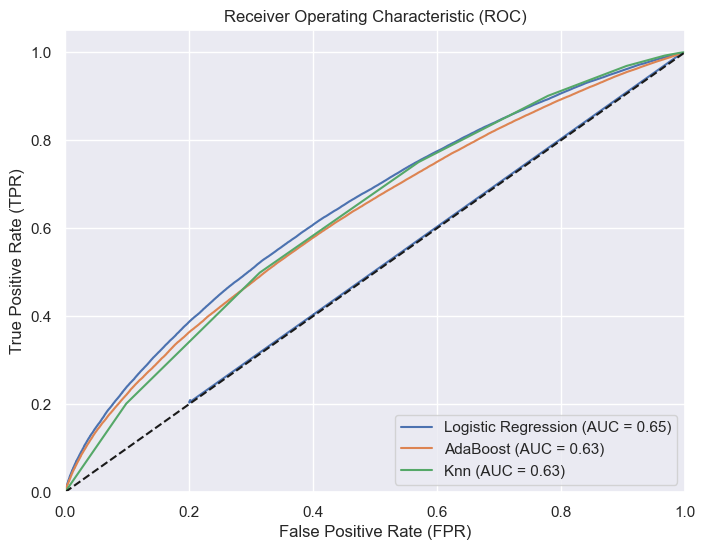

In [472]:
"""
Plotting ROC Curves

This code snippet generates ROC curves for three different models: Logistic Regression, AdaBoost, and KNN.
The ROC curve is a graphical representation of the performance of a binary classification model, showing the trade-off 
between the true positive rate (sensitivity) and the false positive rate (1 - specificity) at various classification 
thresholds.The area under the ROC curve (AUC-ROC) is used as a metric to evaluate the discriminative power of each 
model, with a higher AUC-ROC indicating better performance.

Output:
- ROC curves for each model, with corresponding AUC values, plotted using Matplotlib.
"""

# Plotting ROC curves
plt.figure(figsize=(8, 6))
plt.plot(lg_fpr, lg_tpr, label='Logistic Regression (AUC = %0.2f)' % lg_roc_auc)
plt.plot(adaboost_fpr, adaboost_tpr, label='AdaBoost (AUC = %0.2f)' % adaboost_roc_auc)
plt.plot(Knn_fpr, Knn_tpr, label='Knn (AUC = %0.2f)' % Knn_roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random classifier
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


In [476]:
"""
Create a performance table comparing different models using F1 score, recall, precision, and accuracy.
"""

table_LG = [[key, value] for key, value in dic_results_lg_best.items()]
headers = ["Metric", "Value"]
table_LG_str = tabulate(table_LG, headers, tablefmt="grid")

table_Ada_weak_learner = [[key, value] for key, value in dic_results_adaboost_best.items()]
headers = ["Metric", "Value"]
table_Ada_weak_learner_str = tabulate(table_Ada_weak_learner, headers, tablefmt="grid")

table_KNN_best = [[key, value] for key, value in dic_results6.items()]
headers = ["Metric", "Value"]
table_KNN_best_str = tabulate(table_KNN_best, headers, tablefmt="grid")


table_data = [
    ['', 'Logistic Regression', 'AdaBoost', 'Knn'],
    ['F1', table_LG[0][1], table_Ada_weak_learner[0][1], table_KNN_best[0][1]],
    ['recall', table_LG[1][1], table_Ada_weak_learner[1][1], table_KNN_best[1][1]],
    ['precision', table_LG[2][1], table_Ada_weak_learner[2][1], table_KNN_best[2][1]],
    ['accuracy', table_LG[3][1], table_Ada_weak_learner[3][1], table_KNN_best[3][1]]
]

df = pd.DataFrame(table_data[1:], columns=table_data[0])

df['Logistic Regression'] = pd.to_numeric(df['Logistic Regression'], errors='coerce')
df['AdaBoost'] = pd.to_numeric(df['AdaBoost'], errors='coerce')
df['Knn'] = pd.to_numeric(df['Knn'], errors='coerce')

styled_table = df.style.set_caption('Models Performance')

styled_table

,,Logistic Regression,AdaBoost,Knn
0,F1,0.723151,0.693986,0.723340
1,recall,0.730115,0.787576,0.783509
2,precision,0.717207,0.620277,0.724735
3,accuracy,0.730115,0.787576,0.783509


# Polynomial regression

# The next part was too complex to run on our simple computers and we went to the lab to run us. We were not given much time in the lab, so we ran this part only in a separate notebook. Please turn to the other notebook.

In [196]:
file_path = "/Users/shellylevy/Downloads/data_regs.csv"
Data_Regression = pd.read_csv(file_path)
Data_Regression.drop(['id','term','int_rate','issue_d','yield_yearly_1','is_default?',"yield_over"], axis=1, inplace=True)

In [197]:
Data_Regression['fico_mean']=(Data_Regression['fico_range_high']+Data_Regression['fico_range_low'])/2
Data_Regression.drop(['fico_range_high','fico_range_low'], axis=1, inplace=True)

In [198]:
# Replace infinite values with NaN
Data_Regression.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values
Data_Regression.dropna(inplace=True)

# Check if any infinite values remain
any_inf = Data_Regression.isin([np.inf, -np.inf]).any().any()
print(any_inf)

False


In [199]:
#splitting the data into train and test datasets, when 80% for train and 20% for test dataset + another splitting 
#for the fine tuning step (later on)
y = Data_Regression["yield_2"]  # target variable
X = Data_Regression.drop("yield_2", axis=1)

In [200]:
# Splitting the data into train and test datasets, with 80% for train and 20% for the test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


scaler_robust = RobustScaler()
X_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)

In [202]:
def perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees):
    """
    Perform polynomial regression for different degrees and evaluate the model performance with Ridge and Lasso regularization.
    Find the best alpha for each regularization technique.

    Args:
        X_train (pandas.DataFrame): The input training feature data.
        X_test (pandas.DataFrame): The input test feature data.
        y_train (pandas.Series): The training target variable.
        y_test (pandas.Series): The test target variable.
        degrees (list): List of degrees for polynomial regression.

    Returns:
        pandas.DataFrame: The model performance metrics for each polynomial degree and regularization technique.

    """
    Model_perf = pd.DataFrame(columns=['Model_Name', 'MSE', 'R2_Score', 'Regularization', 'Alpha'])

    for degree in degrees:
        # Create a PolynomialFeatures object with the specified degree
        poly = PolynomialFeatures(degree=degree)
        
        # Transform the features into polynomial features
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        # Ridge regularization
        ridge = Ridge()
        ridge_param_grid = {'alpha': [ 0.01, 0.1, 1, 10]}  # Define the alpha values to be tested
        ridge_grid_search = GridSearchCV(ridge, ridge_param_grid, scoring='neg_mean_squared_error', cv=5)
        ridge_grid_search.fit(X_train_poly, y_train)

        ridge_best_alpha = ridge_grid_search.best_params_['alpha']
        ridge_best_model = ridge_grid_search.best_estimator_
        y_pred_ridge = ridge_best_model.predict(X_test_poly)
        ridge_mse = mean_squared_error(y_test, y_pred_ridge)
        ridge_r2 = r2_score(y_test, y_pred_ridge)
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', ridge_mse, ridge_r2,
                                           'Ridge', ridge_best_alpha]

        # Lasso regularization
        lasso = Lasso()
        lasso_param_grid = {'alpha': [ 0.01, 0.1, 1, 10]}  # Define the alpha values to be tested
        lasso_grid_search = GridSearchCV(lasso, lasso_param_grid, scoring='neg_mean_squared_error', cv=5)
        lasso_grid_search.fit(X_train_poly, y_train)

        lasso_best_alpha = lasso_grid_search.best_params_['alpha']
        lasso_best_model = lasso_grid_search.best_estimator_
        y_pred_lasso = lasso_best_model.predict(X_test_poly)
        lasso_mse = mean_squared_error(y_test, y_pred_lasso)
        lasso_r2 = r2_score(y_test, y_pred_lasso)
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', lasso_mse, lasso_r2,
                                           'Lasso', lasso_best_alpha]

    return Model_perf

# Perform polynomial regression for different degrees and evaluate with Ridge and Lasso regularization
degrees = [2]
poly_model_performance = perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees)

**Check on the features we tested in the previous part**

In [201]:
def forward_selection(data, target, model, improvement_threshold=0.0001):
    """
    Perform forward selection feature selection using a specified model and improvement threshold.

    Args:
        data (numpy.ndarray): The input feature data.
        target (numpy.ndarray): The target variable.
        model: The machine learning model used for evaluation.
        improvement_threshold (float, optional): The minimum improvement threshold to add a feature. Defaults to 0.0001.

    Returns:=1
        list: The list of selected best features.

    """
    initial_features = list(range(data.shape[1]))
    best_features = []
    
    while len(initial_features) > 0:
        remaining_features = list(set(initial_features) - set(best_features))
        new_mse = np.inf
        for new_column in remaining_features:
            model.fit(data[:, best_features + [new_column]], target)
            y_pred = model.predict(data[:, best_features + [new_column]])
            mse = mean_squared_error(target, y_pred)
            if mse < new_mse:
                if len(best_features) >= 30:
                    return best_features
                new_mse = mse
                best_column = new_column
        best_features.append(best_column)
        print('Best MSE:', new_mse, '\tAdded feature:', best_column)
        if np.isinf(new_mse):
            return best_features
    return best_features

model = LinearRegression()
data_best_features = forward_selection(X_train_scaled, y_train, model, improvement_threshold=0.0001)

Best MSE: 0.007219666418345781 	Added feature: 19
Best MSE: 0.007198053809248939 	Added feature: 57
Best MSE: 0.007176307786516389 	Added feature: 0
Best MSE: 0.0071554055024496575 	Added feature: 66
Best MSE: 0.007146646465775834 	Added feature: 54
Best MSE: 0.007139501388574526 	Added feature: 60
Best MSE: 0.007132757794811732 	Added feature: 36
Best MSE: 0.007128808897712219 	Added feature: 2
Best MSE: 0.007125200023792011 	Added feature: 21
Best MSE: 0.007122241448225023 	Added feature: 41
Best MSE: 0.007118525935979718 	Added feature: 37
Best MSE: 0.007116195911847807 	Added feature: 17
Best MSE: 0.0071141841727651025 	Added feature: 26
Best MSE: 0.00711164522492613 	Added feature: 32
Best MSE: 0.007109763358626585 	Added feature: 59
Best MSE: 0.007108176629997064 	Added feature: 3
Best MSE: 0.007106860227743281 	Added feature: 40
Best MSE: 0.007105716244787283 	Added feature: 13
Best MSE: 0.007104496681873967 	Added feature: 33
Best MSE: 0.0071034824061238285 	Added feature: 11
B

In [203]:
data_best_features_names = X.columns[data_best_features]
X_train_best_features = X[data_best_features_names]

In [204]:
# Splitting the data into train and test datasets, with 80% for train and 20% for the test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


scaler_robust = RobustScaler()
bX_train_scaled = scaler_robust.fit_transform(X_train)
X_test_scaled = scaler_robust.transform(X_test)

In [205]:
def perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees):
    """
    Perform polynomial regression for different degrees and evaluate the model performance with Ridge and Lasso regularization.
    Find the best alpha for each regularization technique.

    Args:
        X_train (pandas.DataFrame): The input training feature data.
        X_test (pandas.DataFrame): The input test feature data.
        y_train (pandas.Series): The training target variable.
        y_test (pandas.Series): The test target variable.
        degrees (list): List of degrees for polynomial regression.

    Returns:
        pandas.DataFrame: The model performance metrics for each polynomial degree and regularization technique.

    """
    Model_perf = pd.DataFrame(columns=['Model_Name', 'MSE', 'R2_Score', 'Regularization', 'Alpha'])

    for degree in degrees:
        # Create a PolynomialFeatures object with the specified degree
        poly = PolynomialFeatures(degree=degree)
        
        # Transform the features into polynomial features
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        # Ridge regularization
        ridge = Ridge()
        ridge_param_grid = {'alpha': [ 0.01, 0.1, 1, 10]}  # Define the alpha values to be tested
        ridge_grid_search = GridSearchCV(ridge, ridge_param_grid, scoring='neg_mean_squared_error', cv=5)
        ridge_grid_search.fit(X_train_poly, y_train)

        ridge_best_alpha = ridge_grid_search.best_params_['alpha']
        ridge_best_model = ridge_grid_search.best_estimator_
        y_pred_ridge = ridge_best_model.predict(X_test_poly)
        ridge_mse = mean_squared_error(y_test, y_pred_ridge)
        ridge_r2 = r2_score(y_test, y_pred_ridge)
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', ridge_mse, ridge_r2,
                                           'Ridge', ridge_best_alpha]

        # Lasso regularization
        lasso = Lasso()
        lasso_param_grid = {'alpha': [ 0.01, 0.1, 1, 10]}  # Define the alpha values to be tested
        lasso_grid_search = GridSearchCV(lasso, lasso_param_grid, scoring='neg_mean_squared_error', cv=5)
        lasso_grid_search.fit(X_train_poly, y_train)

        lasso_best_alpha = lasso_grid_search.best_params_['alpha']
        lasso_best_model = lasso_grid_search.best_estimator_
        y_pred_lasso = lasso_best_model.predict(X_test_poly)
        lasso_mse = mean_squared_error(y_test, y_pred_lasso)
        lasso_r2 = r2_score(y_test, y_pred_lasso)
        Model_perf.loc[len(Model_perf)] = [f'Polynomial Regression (degree={degree})', lasso_mse, lasso_r2,
                                           'Lasso', lasso_best_alpha]

    return Model_perf

# Perform polynomial regression for different degrees and evaluate with Ridge and Lasso regularization
degrees = [2]
poly_model_performance = perform_polynomial_regression(X_train, X_test, y_train, y_test, degrees)
print(poly_model_performance)

In [111]:
k = 10  # define the number of folds
kf = KFold(n_splits=k, shuffle=True, random_state=42)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

def perform_polynomial_lasso_regression(X_train, y_train, X_test, y_test):
    """
    Perform polynomial regression with Lasso regularization and evaluate the model's performance.

    Args:
        X_train (pandas.DataFrame): The training feature data.
        y_train (pandas.Series): The training target variable.
        X_test (pandas.DataFrame): The test feature data.
        y_test (pandas.Series): The test target variable.

    Returns:
        pandas.DataFrame: The DataFrame with predictions, actual target values, and differences.
    """

    # Polynomial transformation
    poly = PolynomialFeatures(degree=2)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)

    # Lasso Regression
    lasso = Lasso(alpha=0.01)

    # Cross-validation
    mse_scores = cross_val_score(lasso, X_train_poly, y_train, scoring='neg_mean_squared_error', cv=kf)
    r2_scores = cross_val_score(lasso, X_train_poly, y_train, scoring='r2', cv=kf)

    mse_scores = -mse_scores

    avg_mse = np.mean(mse_scores)
    avg_r2 = np.mean(r2_scores)

    # Updating model performance
    Model_perf.loc[len(Model_perf)] = ['Polynomial Regression (degree=2) - Lasso alpha=0.01', avg_mse, avg_r2]
    print(Model_perf)

    # Fit the model to the training data
    lasso.fit(X_train_poly, y_train)

    # Get the predictions for the test data
    predictions = lasso.predict(X_test_poly)

    # Create a DataFrame for the predictions
    predictions_df = pd.DataFrame(predictions, columns=['Prediction'], index=X_test.index)

    # Concatenate the predictions with the test data
    result_df = pd.concat([X_test, predictions_df, y_test], axis=1)

    result_df = result_df.sort_values(by='Prediction', ascending=False)

    # Calculate the cumulative sum of 'loan_amnt'
    result_df['cumulative_loan_amnt'] = result_df['loan_amnt'].cumsum()

    # Calculate the weighted yield using 'theyield_yearly_1'
    result_df['weighted_yield_yearly_1'] = (result_df['yield_2'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

    # Calculate the weighted yield: multiply 'Prediction' by 'loan_amnt' and divide by the total 'loan_amnt'
    result_df['weighted_yield'] = (result_df['Prediction'] * result_df['loan_amnt']).cumsum() / result_df['cumulative_loan_amnt']

    # Create a plot
    plt.figure(figsize=(10,6))

    # Plot the weighted yield using 'Prediction'
    plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield'], label='Prediction')

    # Plot the weighted yield using 'theyield_yearly_1'
    plt.plot(result_df['cumulative_loan_amnt'], result_df['weighted_yield_yearly_1'], label='real yield')

    plt.xlabel('Cumulative Loan Amount')
    plt.ylabel('Weighted Yield')
    plt.title('Cumulative Loan Amount vs Weighted Yield')
    plt.legend()

    plt.show()

    # Print table with predictions, actual target and differences
    result_df['diff'] = result_df['Prediction'] - result_df['yield_2']
    print(result_df[['Prediction', 'yield_2', 'diff']])

    return result_df
perform_polynomial_lasso_regression(X_train, y_train, X_test, y_test)

In [112]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
# Print table with predictions, actual target and differences
result_df['diff_weighted'] = result_df['weighted_yield'] - result_df['weighted_yield_yearly_1']

In [113]:
def analyze_yield_difference(result_df):
    """
    Analyze the difference in yield predictions and provide descriptive statistics, a distribution plot, and statistical measures.

    Args:
        result_df (pandas.DataFrame): DataFrame containing the yield predictions, actual target values, and differences.

    Returns:
        None
    """

    # Calculate mean and standard deviation of the difference
    mean_diff = result_df['diff'].mean()
    std_diff = result_df['diff'].std()

    # Print mean and standard deviation
    print(f"Mean of 'diff': {mean_diff}")
    print(f"Standard Deviation of 'diff': {std_diff}")

    # Plot the distribution
    plt.figure(figsize=(10,6))
    plt.hist(result_df['diff'], bins=30, density=True, alpha=0.6, color='g')

    # Plot the PDF.
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, mean_diff, std_diff)
    plt.plot(x, p, 'k', linewidth=2)

    plt.title('Distribution of "diff_of_yield"')
    plt.xlabel('diff_of_yield')
    plt.ylabel('Frequency')
    plt.show()

    # Print descriptive statistics
    print("Descriptive Statistics:")
    print(result_df['diff'].describe())
analyze_yield_difference(result_df)

In [114]:
def analyze_weighted_yield_difference(result_df):
    """
    Analyze the difference in weighted yield predictions and provide descriptive statistics, a distribution plot, and statistical measures.

    Args:
        result_df (pandas.DataFrame): DataFrame containing the weighted yield predictions, actual target values, and differences.

    Returns:
        None
    """

    # Calculate mean and standard deviation of the weighted yield difference
    mean_diff = result_df['diff_weighted'].mean()
    std_diff = result_df['diff_weighted'].std()

    # Print mean and standard deviation
    print(f"Mean of 'diff_weighted': {mean_diff}")
    print(f"Standard Deviation of 'diff_weighted': {std_diff}")

    # Plot the distribution
    plt.figure(figsize=(10,6))
    plt.hist(result_df['diff_weighted'], bins=30, density=True, alpha=0.6, color='g')

    # Plot the PDF.
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, mean_diff, std_diff)
    plt.plot(x, p, 'k', linewidth=2)

    plt.title('Distribution of "diff_weighted_yield"')
    plt.xlabel('diff_weighted_yield')
    plt.ylabel('Frequency')
    plt.show()

    # Print descriptive statistics
    print("Descriptive Statistics:")
    print(result_df['diff_weighted'].describe())

analyze_weighted_yield_difference(result_df)

In [115]:
result_df = result_df.sort_values(by='cumulative_loan_amnt')
n = len(result_df) // 5
rows = [result_df.iloc[i * n: (i + 1) * n].iloc[[0, -1]] for i in range(5)]
result_df_5_parts = pd.concat(rows)
result_df_5_parts = result_df_5_parts.rename(columns={'cumulative_loan_amnt': 'Cumulative Loan Amount',
                                                      'weighted_yield': 'predicted_weighted_yield',
                                                      'weighted_yield_yearly_1': 'real_weighted_yield',
                                                      'diff_weighted': 'Difference in Weighted Yield'})
final_result_df_5_parts = result_df_5_parts[['Cumulative Loan Amount',
                                             'predicted_weighted_yield',
                                             'real_weighted_yield',
                                             'Difference in Weighted Yield']][::2]
print(final_result_df_5_parts)

## Answers to Walter's questions
**Calculate annual realized returns and standard deviation by loan grade.**

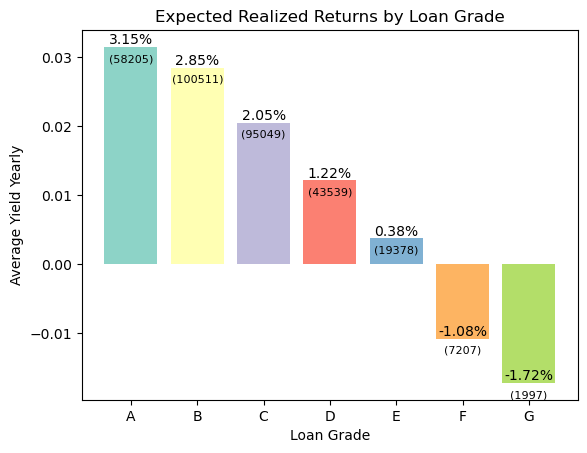

In [69]:
"""
This code snippet generates a bar chart depicting the average yield and count of loans grouped 
by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

avg_yield_by_grade = data.groupby('grade')['yield_2'].mean()
count_by_grade = data.groupby('grade')['yield_2'].count()

color_palette = sns.color_palette('Set3', len(avg_yield_by_grade))

fig, ax = plt.subplots()
ax.bar(avg_yield_by_grade.index, avg_yield_by_grade.values, color=color_palette)
ax.set_title('Expected Realized Returns by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Average Yield Yearly')

for i, (v1, v2) in enumerate(zip(avg_yield_by_grade, count_by_grade)):
    ax.text(i, v1, f'{v1:.2%}', ha='center', va='bottom')
    ax.text(i, v1-0.001, f'({v2})', ha='center', va='top', fontsize=8)

plt.xticks(rotation=360)
plt.show()


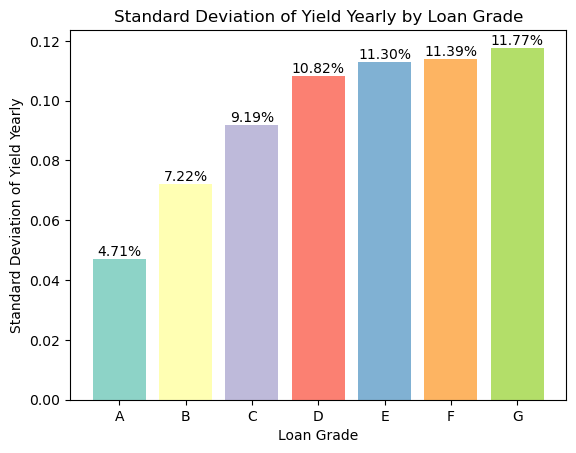

In [26]:
"""
This code snippet generates a bar chart depicting the standard deviation of yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

std_yield_by_grade = data.groupby('grade')['yield_2'].std()

color_palette = sns.color_palette('Set3', len(std_yield_by_grade))

fig, ax = plt.subplots()
ax.bar(std_yield_by_grade.index, std_yield_by_grade.values, color=color_palette)
ax.set_title('Standard Deviation of Yield Yearly by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Standard Deviation of Yield Yearly')

for i, v in enumerate(std_yield_by_grade):
    ax.text(i, v+0.001, f'{v:.2%}', ha='center')

plt.show()


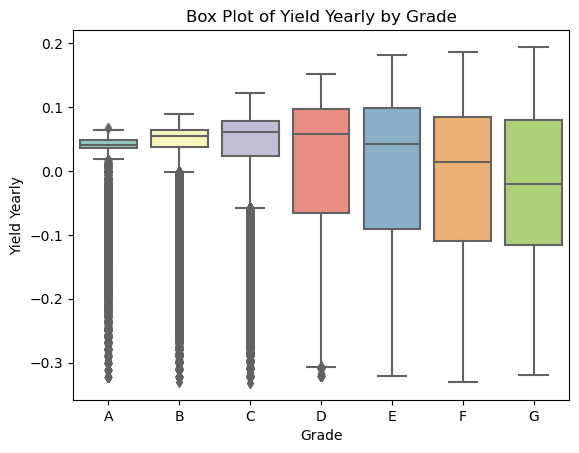

In [27]:
"""
This code snippet generates a box plot depicting the distribution of yearly yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

grade_order = sorted(data['grade'].unique())

color_palette = sns.color_palette('Set3', n_colors=len(grade_order))

sns.boxplot(data=data, x='grade', y='yield_2', order=grade_order, palette=color_palette)

plt.title('Box Plot of Yield Yearly by Grade')
plt.xlabel('Grade')
plt.ylabel('Yield Yearly')

plt.show()


In [29]:
"""
This code snippet calculates various statistics for loans grouped by their respective grades and displays 
the results in a tabular format using the PrettyTable library.
"""

grade_stats = data.groupby('grade').agg({'yield_2': ['mean', 'std'],  'id': 'count', 'loan_amnt': 'sum'})
grade_stats.columns = ['Expected realized returns', 'SD of Yield', 'Number of Loans', 'Total Loan Amount']
grade_stats = grade_stats.sort_index()
grade_stats['Total Loan Amount'] = grade_stats['Total Loan Amount'].apply(lambda x: "${:,.2f}".format(x))
grade_stats['Expected realized returns'] = grade_stats['Expected realized returns'].apply(lambda x: "{:.2%}".format(x))
grade_stats['SD of Yield'] = grade_stats['SD of Yield'].apply(lambda x: "{:.2%}".format(x))

# Create a PrettyTable object
table = PrettyTable()
table.field_names = grade_stats.columns
for _, row in grade_stats.iterrows():
    table.add_row(row)
print(table)



+---------------------------+-------------+-----------------+-------------------+
| Expected realized returns | SD of Yield | Number of Loans | Total Loan Amount |
+---------------------------+-------------+-----------------+-------------------+
|           3.15%           |    4.71%    |      58205      |  $827,136,325.00  |
|           2.85%           |    7.22%    |      100511     | $1,297,360,550.00 |
|           2.05%           |    9.19%    |      95049      | $1,340,526,675.00 |
|           1.22%           |    10.82%   |      43539      |  $674,768,850.00  |
|           0.38%           |    11.30%   |      19378      |  $338,367,400.00  |
|           -1.08%          |    11.39%   |       7207      |  $136,699,850.00  |
|           -1.72%          |    11.77%   |       1997      |   $38,856,500.00  |
+---------------------------+-------------+-----------------+-------------------+


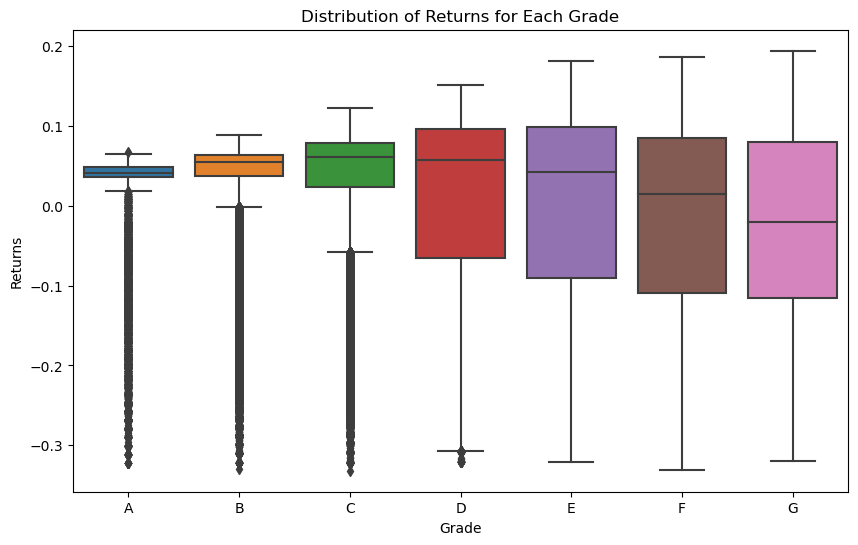

In [30]:
"""
This code snippet generates a box plot depicting the distribution of yearly yields for loans 
grouped by their respective grades.
The data is obtained from a DataFrame named 'data' which contains information about loans, 
including their grades and yields.
"""

grade_order = sorted(data['grade'].unique())

plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='grade', y='yield_2', order=grade_order)
plt.xlabel('Grade')
plt.ylabel('Returns')
plt.title('Distribution of Returns for Each Grade')
plt.show()


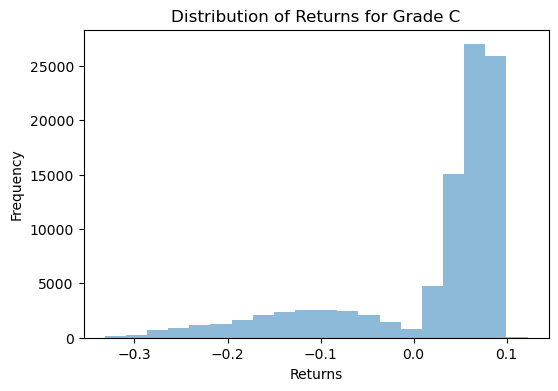

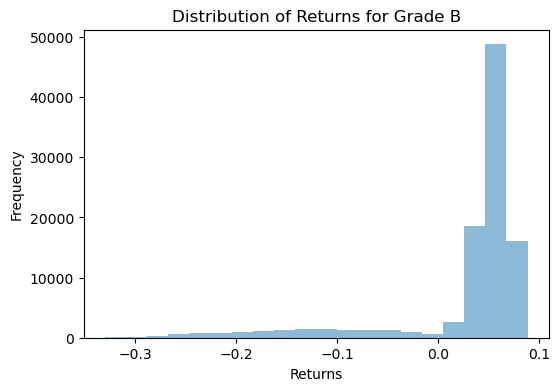

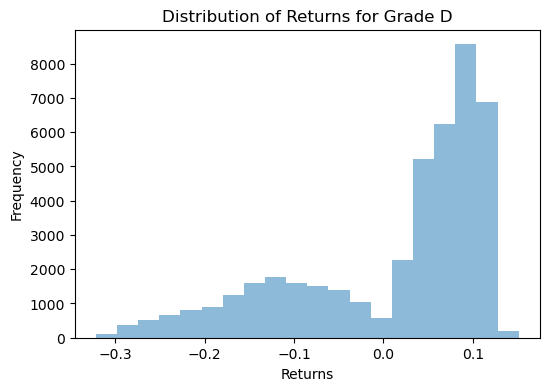

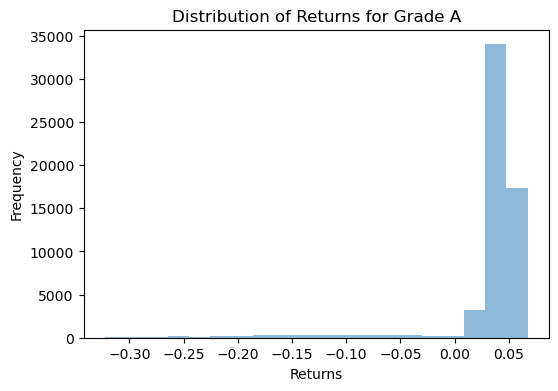

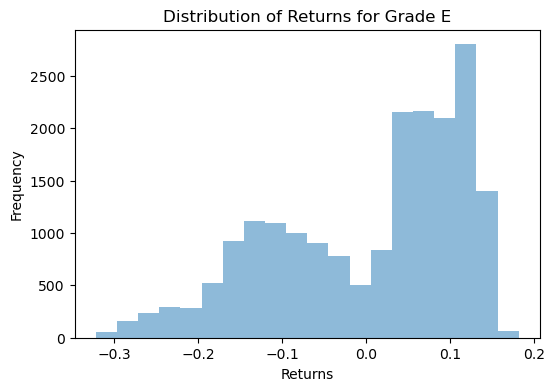

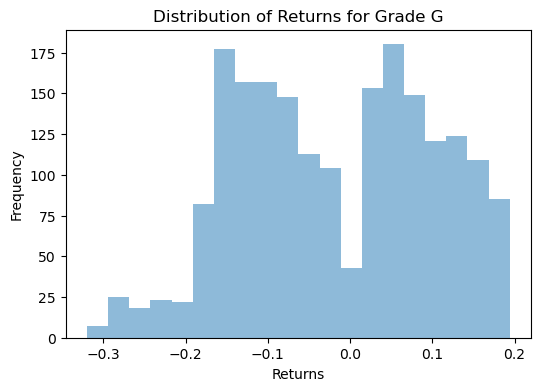

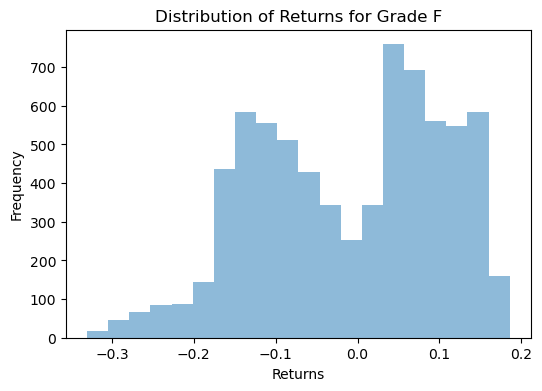

In [31]:
"""
Create histograms of returns for each unique grade in the DataFrame.
"""

# Iterate over unique grades
for grade in data['grade'].unique():
    # Select returns data for the current grade
    returns = data[data['grade'] == grade]['yield_2']

    # Create a separate figure for each grade's histogram
    plt.figure(figsize=(6, 4))

    # Create the histogram
    plt.hist(returns, bins=20, alpha=0.5)

    plt.xlabel('Returns')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Returns for Grade {grade}')

    plt.show()


In [32]:
"""
Perform Shapiro-Wilk test on grade-wise returns and store the results in a DataFrame.
"""

# Create an empty DataFrame to store the test results
test_results = pd.DataFrame(columns=['Grade', 'Shapiro-Wilk Statistic', 'p-value'])

# Perform Shapiro-Wilk test for each grade's returns
for grade in data['grade'].unique():
    # Select returns data for the current grade
    returns = data[data['grade'] == grade]['yield_2']

    # Perform Shapiro-Wilk test
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        stat, p_value = shapiro(returns)

    # Add the test results to the DataFrame
    test_results = pd.concat([test_results, pd.DataFrame({'Grade': [grade], 'Shapiro-Wilk Statistic': [stat], 'p-value': [p_value]})])

# Display the test results
print(test_results)


  Grade  Shapiro-Wilk Statistic       p-value
0     C                0.731688  0.000000e+00
0     B                0.583781  0.000000e+00
0     D                0.841263  0.000000e+00
0     A                0.392948  0.000000e+00
0     E                0.915530  0.000000e+00
0     G                0.964735  1.121696e-21
0     F                0.955617  3.298657e-42


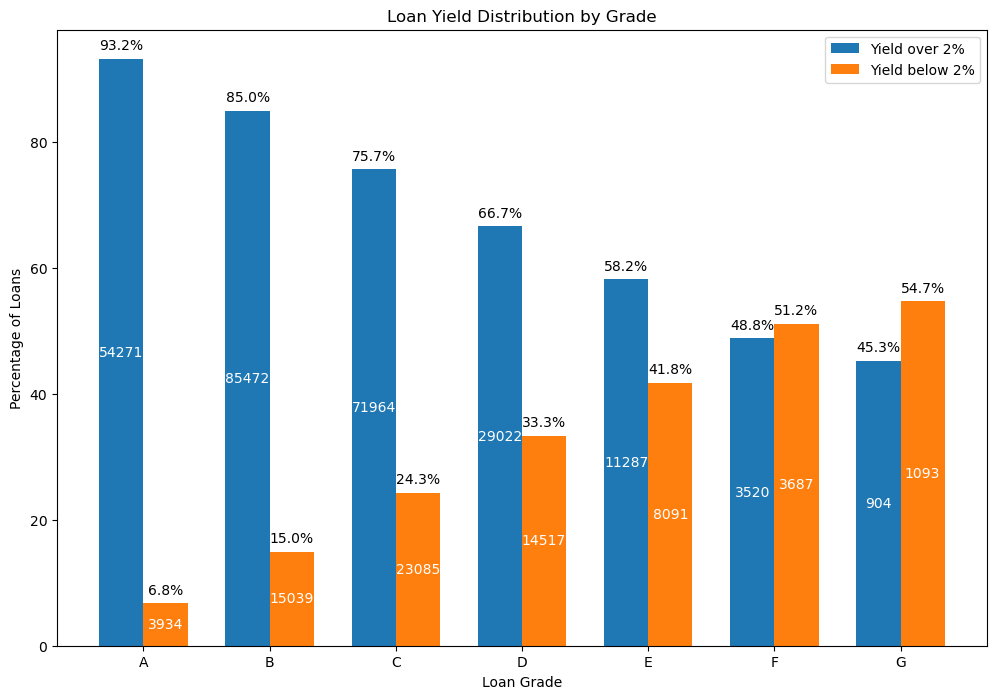

In [68]:
# Create a plot
plt.figure(figsize=(10, 6))
plt.plot(df['cumulative_loan_amnt'], df['weighted_yield'], label='Weighted Yield')
plt.xlabel('Cumulative Loan Amount (in thousands)')
plt.ylabel('Weighted Yield')
plt.title('Weighted Yield vs. Cumulative Loan Amount')

# Format the x-axis ticks with thousands separator and "K" suffix
ax = plt.gca()
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:.0f}K'.format(x * 1e-3)))

plt.legend()
plt.show()"""
Calculate and visualize the percentage of loans above and below 2% yield for each grade.
"""

# Calculate the percentage of loans above and below 2% for each grade
loan_counts = data.groupby('grade')['yield_over'].value_counts().unstack().fillna(0)

# Create an array for the grades and the positions of the bars
grades = loan_counts.index
x = np.arange(len(grades))

# Calculate the percentages for above 2% and below 2% for each grade
above_2_percent = loan_counts[1] / (loan_counts[0] + loan_counts[1]) * 100
below_2_percent = loan_counts[0] / (loan_counts[0] + loan_counts[1]) * 100

# Set the width of the bars
bar_width = 0.35

# Set the figure size
plt.figure(figsize=(12, 8))

# Create the bar plot
plt.bar(x, above_2_percent, width=bar_width, label='Yield over 2%')
plt.bar(x + bar_width, below_2_percent, width=bar_width, label='Yield below 2%')

# Set the x-axis labels to be the grades
plt.xticks(x + bar_width/2, grades)

# Add percentage labels to the bars
for i, above_2 in enumerate(above_2_percent):
    plt.text(i, above_2 + 1, f"{above_2:.1f}%", ha='center', va='bottom')
    plt.text(i, above_2 / 2, f"{loan_counts[1].values[i]}", ha='center', va='center', color='white')
for i, below_2 in enumerate(below_2_percent):
    plt.text(i + bar_width, below_2 + 1, f"{below_2:.1f}%", ha='center', va='bottom')
    plt.text(i + bar_width, below_2 / 2, f"{loan_counts[0].values[i]}", ha='center', va='center', color='white')

# Set the labels and title
plt.xlabel('Loan Grade')
plt.ylabel('Percentage of Loans')
plt.title('Loan Yield Distribution by Grade')
plt.legend()

# Show the plot
plt.show()


## runing the best model and apply 2-steps model

### Classification model - logistic regression

In [55]:
"""
loding again the data
"""
Data_LG= pd.read_csv('/Users/slevy/Downloads/data.csv')
Data_test= pd.read_csv('/Users/slevy/Downloads/data.csv')
Data_LG.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade','id','yield_yearly_1'], axis=1, inplace=True)
Data_test.drop(['loan_amnt','term','int_rate','issue_d','yield_2','is_default?','grade','id','yield_yearly_1'], axis=1, inplace=True)
X = Data_LG.drop(columns=['yield_over']).values
y = Data_LG['yield_over'].values

In [57]:
"""
Running the LG model with the hyperparameters that 
produced the best results and also printing the model results as a reminder
"""
best_n_iter_LG=5000
best_eps_LG=1e-06
best_penalty_LG='l2'
selected_features_list=[57,58,52,1,68,19,48,64,66,49,14,54,67,35,65,18,15,45,34,44,11,40,36,10,5,51,50,43,42,13]
best_threshold_LG=0.4
best_C_LG=1

scaler = RobustScaler()

total_weighted_f1 = 0
weighted_recall = 0
weighted_precision = 0
weighted_accuracy = 0
lg_fpr = []
lg_tpr = []
lg_roc_auc = []

for fold in range(5):
    rel_X = X[:, selected_features_list]
    indices = np.random.permutation(rel_X.shape[0])
    idx_train, idx_val = indices[:int(0.7 * rel_X.shape[0])], indices[int(0.7 * rel_X.shape[0]):]
    X_train, X_val = rel_X[idx_train], rel_X[idx_val, :]
    y_train, y_val = y[idx_train], y[idx_val]

    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    best_LG = LogisticRegression(max_iter=best_n_iter_LG, tol=best_eps_LG, solver='liblinear', penalty=best_penalty_LG, class_weight='balanced')

    best_LG.fit(X_train_scaled, y_train)

    y_prob = best_LG.predict_proba(X_val_scaled)
    y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)

    fpr, tpr, _ = roc_curve(y_val, y_prob[:, 1])  # Use probabilities for positive class
    lg_fpr.append(fpr)
    lg_tpr.append(tpr)

    # Calculate ROC AUC score
    roc_auc = roc_auc_score(y_val, y_prob[:, 1])  # Use probabilities for positive class
    lg_roc_auc.append(roc_auc)

    total_weighted_f1 += f1_score(y_val, y_pred, average='weighted')
    weighted_recall += recall_score(y_val, y_pred, average='weighted')
    weighted_precision += precision_score(y_val, y_pred, average='weighted')
    weighted_accuracy += accuracy_score(y_val, y_pred)

weighted_f1 = total_weighted_f1 / 5
weighted_recall /= 5
weighted_precision /= 5
weighted_accuracy /= 5

# Resize fold arrays to the same length
max_length = max(len(arr) for arr in lg_fpr)
lg_fpr = [np.resize(arr, max_length) for arr in lg_fpr]
lg_tpr = [np.resize(arr, max_length) for arr in lg_tpr]

lg_fpr = np.mean(lg_fpr, axis=0)
lg_tpr = np.mean(lg_tpr, axis=0)

lg_roc_auc = np.mean(lg_roc_auc)


dic_results_lg_best = {
    'F1': weighted_f1,
    'recall': weighted_recall,
    'precision': weighted_precision,
    'accuracy': weighted_accuracy
}

"""
Creates a table displaying performance metrics.
"""

table_LG_importance = [[key, value] for key, value in dic_results_lg_best.items()]
headers = ["Metric", "Value"]
table_LG_importance = tabulate(table_LG_importance, headers, tablefmt="grid")
headline = "Performance Metrics for Logistic Regression with feature importance"
table_with_headline = f"{headline}\n\n{table_LG_importance}"
print(table_with_headline)

Performance Metrics for Logistic Regression with feature importance

+-----------+----------+
| Metric    |    Value |
+===========+==========+
| F1        | 0.724099 |
+-----------+----------+
| recall    | 0.731059 |
+-----------+----------+
| precision | 0.718172 |
+-----------+----------+
| accuracy  | 0.731059 |
+-----------+----------+


**Data creation of all the incensets that the model predicted to be above 2%**

In [59]:
"""
A filter of all data that the model predicted would be above 2%
"""
X = Data_test.drop(columns=['yield_over']).values
y = Data_test['yield_over'].values

rel_X = X[:, selected_features_list]
rel_X_scaled = scaler.transform(rel_X)

y_prob = best_LG.predict_proba(rel_X_scaled)

y_pred = (y_prob[:, 1] >= best_threshold_LG).astype(int)

Data_LG['y_pred']=y_pred

Data_LG=Data_LG[Data_LG['y_pred']==1]
Data_LG.drop(['y_pred'], axis=1, inplace=True)

### Regression model - polynomial regression

In [67]:
Data_Regression.replace([np.inf, -np.inf], np.nan, inplace=True)
Data_Regression.dropna(inplace=True)
any_inf = Data_Regression.isin([np.inf, -np.inf]).any().any()
print(any_inf)

False


In [69]:
"""
Dividing the data into arrays
"""
y = Data_Regression["yield_2"]  # target variable
X = Data_Regression.drop("yield_2", axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [109]:
"""
Running the PR model with the hyperparameters that 
produced the best results and also printing the model results as a reminder
"""
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

lasso = Lasso(alpha=0.01)

Model_perf.loc[len(Model_perf)] = ['Polynomial Regression (degree=2) - Lasso alpha=0.01', avg_mse, avg_r2]
lasso.fit(X_train_poly, y_train)

predictions = lasso.predict(X_test_poly)

# Comparison between our model and the model of the grade

### Our model business evaluation

In [107]:
"""
Calculates the weighted yield based on loan amount, predictions, and real yield.
"""

df = pd.DataFrame({'loan_amount': loan_amnt, 'predictions': predictions, 'real_yield': y})
df = df[df["predictions"] > 0]
df = df.sort_values(by='predictions', ascending=False)
df['cumulative_loan_amnt'] = df['loan_amount'].cumsum()
df['weighted_yield'] = (df['real_yield'] * df['loan_amount']).cumsum() / df['cumulative_loan_amnt']

df

,loan_amount,predictions,real_yield,cumulative_loan_amnt,weighted_yield
38357,16000.0,0.241200,0.045113,1.600000e+04,0.045113
73928,22000.0,0.228468,0.036644,3.800000e+04,0.040210
314527,2500.0,0.127183,0.049354,4.050000e+04,0.040775
25126,40000.0,0.122389,0.052604,8.050000e+04,0.046652
299399,25600.0,0.117188,0.055105,1.061000e+05,0.048692
...,...,...,...,...,...
77364,25000.0,0.000003,0.082592,3.654739e+09,0.025473
95290,10000.0,0.000003,0.088143,3.654749e+09,0.025473
28397,15000.0,0.000003,-0.140324,3.654764e+09,0.025473
171320,18200.0,0.000003,0.045510,3.654782e+09,0.025473


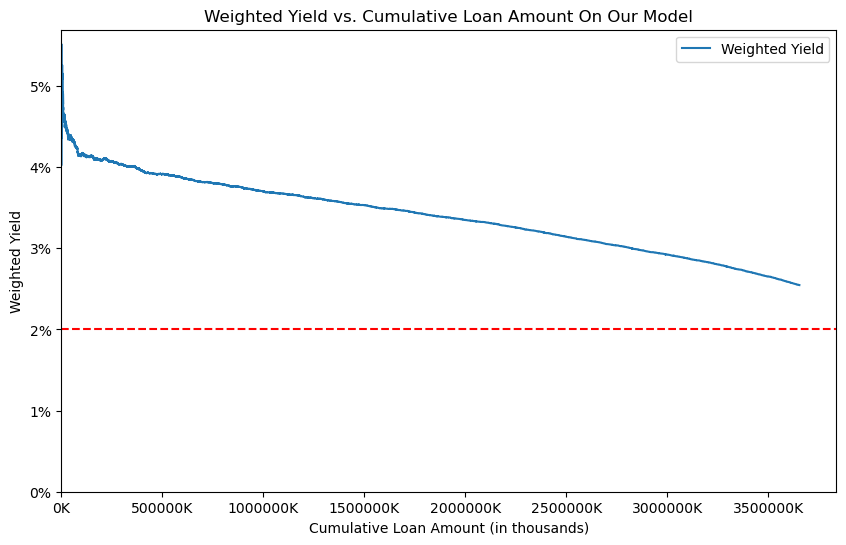

In [127]:
"""
Plots the weighted yield against the cumulative loan amount.
"""
plt.figure(figsize=(10, 6))
plt.plot(df['cumulative_loan_amnt'], df['weighted_yield'], label='Weighted Yield')
plt.xlabel('Cumulative Loan Amount (in thousands)')
plt.ylabel('Weighted Yield')
plt.title('Weighted Yield vs. Cumulative Loan Amount On Our Model')

ax = plt.gca()
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:.0f}K'.format(x * 1e-3)))
ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0, decimals=0))

plt.axhline(y=0.02, color='red', linestyle='--')  # Add dashed red line at 2%

plt.xlim(left=0)  # Set the left limit of the x-axis to 0

plt.ylim(0)  # Set the lower limit of the y-axis to 0

plt.legend()
plt.show()


In [442]:
"""
calculate the performance of the grades model for differnet protfolio amounts
"""

loan_amounts = [100000, 10000000, 250000000, 500000000,800000000]
results = []

x = all_data.groupby('grade')[["yield_2", "loan_amnt", "grade","int_rate"]]
for loan_amount in loan_amounts:
    for name, group in x:
        group = group.sort_values(by='int_rate', ascending=False)
        group['cumulative_loan_amnt'] = group['loan_amnt'].cumsum()
        group = group[group['cumulative_loan_amnt'] < loan_amount]
        max_value = group['cumulative_loan_amnt'].max()
        group['weight'] = group['loan_amnt'] / max_value
        group["weight_yield"] = group["weight"] * group["yield_2"]
        mean_value = sum(group["weight_yield"])
        results.append({'Amount Invested': loan_amount, 'Grade': name , 'Weighted Yield': mean_value})

results_df = pd.DataFrame(results)
pivoted_df = results_df.pivot(index='Amount Invested', columns='Grade', values='Weighted Yield').reset_index()
merged_df = pivoted_df.merge(our_model_result, on='Amount Invested', how='inner')
merged_df.to_csv('merged_results.csv', index=False)

# Loop through the columns A-G
for col in ['A', 'B', 'C', 'D', 'E', 'F', 'G']:
    # Calculate the yearly yield for each column
    merged_df[col + '-Yearly yield'] = merged_df[col]
    merged_df = merged_df.drop(col, axis=1)

merged_df["Diff Our Model vs A"] = merged_df["Our Model"] -  merged_df["A-Yearly yield"]
merged_df["Diff Our Model vs B"] = merged_df["Our Model"] -  merged_df["B-Yearly yield"]
merged_df["Diff Our Model vs C"] = merged_df["Our Model"] -  merged_df["C-Yearly yield"]
merged_df["Diff Our Model vs D"] = merged_df["Our Model"] -  merged_df["D-Yearly yield"]
merged_df["Diff Our Model vs E"] = merged_df["Our Model"] -  merged_df["E-Yearly yield"]
merged_df["Diff Our Model vs F"] = merged_df["Our Model"] -  merged_df["F-Yearly yield"]
merged_df["Diff Our Model vs G"] = merged_df["Our Model"] -  merged_df["G-Yearly yield"]

merged_df

,Amount Invested,Our Model,A-Yearly yield,B-Yearly yield,C-Yearly yield,D-Yearly yield,E-Yearly yield,F-Yearly yield,G-Yearly yield,Diff Our Model vs A,Diff Our Model vs B,Diff Our Model vs C,Diff Our Model vs D,Diff Our Model vs E,Diff Our Model vs F,Diff Our Model vs G
0,100000,0.062208,0.037645,0.049161,-0.003705,0.060498,-0.018977,-0.063556,-0.014030,0.024563,0.013047,0.065913,0.001710,0.081185,0.125764,0.076238
1,10000000,0.044780,0.026158,0.019343,0.004912,0.019022,-0.010838,-0.020639,-0.023323,0.018623,0.025438,0.039868,0.025758,0.055618,0.065419,0.068103
2,250000000,0.040588,0.031610,0.024501,0.013314,0.004744,-0.002013,-0.015169,-0.021102,0.008979,0.016088,0.027274,0.035844,0.042602,0.055758,0.061690
3,500000000,0.039332,0.032130,0.025045,0.014434,0.007466,-0.000513,-0.015169,-0.021102,0.007202,0.014287,0.024898,0.031866,0.039845,0.054501,0.060434
4,800000000,0.037642,0.032001,0.026914,0.015746,0.008635,-0.000513,-0.015169,-0.021102,0.005641,0.010728,0.021896,0.029007,0.038155,0.052811,0.058744


### Calculation of weighted standard deviation

In [443]:
"""
Calculates the weighted yield based on loan amount for each grade in the dataset.
"""
all_data_weighted = pd.DataFrame()

x = all_data.groupby('grade')[["yield_2","loan_amnt","grade"]]
for name, group in x:
    group = group.sort_values(by='yield_2', ascending=False)
    group['cumulative_loan_amnt'] = group['loan_amnt'].cumsum()
    max_value = group['cumulative_loan_amnt'].max()
    group['weight'] = group['loan_amnt']/max_value
    group["weight_yield"] = group["weight"]*group["yield_2"]
    print("Grade:", name)
    print(group)
    print("\n-------------------\n")
    # Concatenate the dataframes
    all_data_weighted = pd.concat([all_data_weighted, group])


Grade: A
         yield_2  loan_amnt grade  cumulative_loan_amnt    weight   
258062  0.067251     6250.0     A                6250.0  0.000008  \
120934  0.064283     7000.0     A               13250.0  0.000008   
107392  0.064020     9000.0     A               22250.0  0.000011   
150822  0.063054     5500.0     A               27750.0  0.000007   
70144   0.062013     9000.0     A               36750.0  0.000011   
...          ...        ...   ...                   ...       ...   
161513 -0.322511    28000.0     A           827096325.0  0.000034   
295311 -0.322566     4000.0     A           827100325.0  0.000005   
205116 -0.322567     6000.0     A           827106325.0  0.000007   
312829 -0.322631    10000.0     A           827116325.0  0.000012   
297033 -0.322705    20000.0     A           827136325.0  0.000024   

        weight_yield  
258062  5.081617e-07  
120934  5.440210e-07  
107392  6.965979e-07  
150822  4.192718e-07  
70144   6.747613e-07  
...              ...  
1

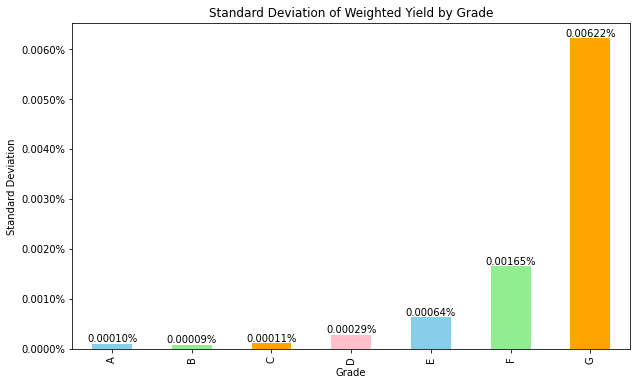

  Grade Standard Deviation_weighted
0     A                     0.0001%
1     B                     0.0001%
2     C                     0.0001%
3     D                     0.0003%
4     E                     0.0006%
5     F                     0.0017%
6     G                     0.0062%


In [444]:
"""
weighted calculation
Plots the standard deviation of the weighted yield for each grade.
"""

# Group data by 'grade' and calculate standard deviation
std_by_grade = all_data_weighted.groupby('grade')['weight_yield'].std()

# Create a DataFrame with the standard deviation for each grade
std_df = pd.DataFrame({'Grade': std_by_grade.index, 'Standard Deviation_weighted': std_by_grade.values})

# Format the standard deviation values in the DataFrame
std_df['Standard Deviation_weighted'] = std_df['Standard Deviation_weighted'].map(lambda x: f'{x:.4%}')

# Plot
plt.figure(figsize=(10, 6))
std_by_grade.plot(kind='bar', color=['skyblue', 'lightgreen', 'orange', 'pink'])  # Assign different colors for each grade

# Format y-axis labels with four decimal places
ax = plt.gca()
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=4))

# Add annotations to each bar
for i, std in enumerate(std_by_grade):
    plt.annotate(f'{std:.5%}', (i, std), ha='center', va='bottom')

plt.xlabel('Grade')
plt.ylabel('Standard Deviation')
plt.title('Standard Deviation of Weighted Yield by Grade')
plt.show()

# Display the DataFrame with the formatted standard deviation for each grade
print(std_df)


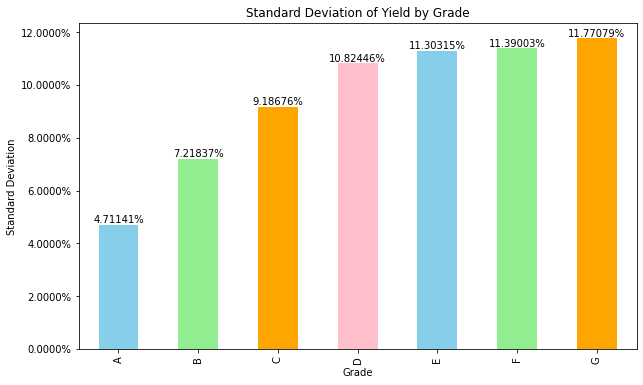

  Grade Standard Deviation
0     A            4.7114%
1     B            7.2184%
2     C            9.1868%
3     D           10.8245%
4     E           11.3032%
5     F           11.3900%
6     G           11.7708%


In [445]:
"""
Normal calculation
Plots the standard deviation of the yield for each grade and displays the DataFrame with the 
formatted standard deviation values.
"""

# Group data by 'grade' and calculate standard deviation
std_by_grade = all_data.groupby('grade')['yield_2'].std()

# Create a DataFrame with the standard deviation for each grade
std_df2 = pd.DataFrame({'Grade': std_by_grade.index, 'Standard Deviation': std_by_grade.values})

# Format the standard deviation values in the DataFrame
std_df2['Standard Deviation'] = std_df2['Standard Deviation'].map(lambda x: f'{x:.4%}')

# Plot
plt.figure(figsize=(10, 6))
std_by_grade.plot(kind='bar', color=['skyblue', 'lightgreen', 'orange', 'pink'])  # Assign different colors for each grade

# Format y-axis labels with four decimal places
ax = plt.gca()
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=4))

# Add annotations to each bar
for i, std in enumerate(std_by_grade):
    plt.annotate(f'{std:.5%}', (i, std), ha='center', va='bottom')

plt.xlabel('Grade')
plt.ylabel('Standard Deviation')
plt.title('Standard Deviation of Yield by Grade')
plt.show()

# Display the DataFrame with the formatted standard deviation for each grade
print(std_df2)


In [446]:
"""
Creating a comparison table between the calculations
"""
merged_df = pd.merge(std_df, std_df2, on='Grade')
print(merged_df)


  Grade Standard Deviation_weighted Standard Deviation
0     A                     0.0001%            4.7114%
1     B                     0.0001%            7.2184%
2     C                     0.0001%            9.1868%
3     D                     0.0003%           10.8245%
4     E                     0.0006%           11.3032%
5     F                     0.0017%           11.3900%
6     G                     0.0062%           11.7708%


### Continue comparing the models:

In [447]:
"""
Compares the performance of a model in terms of weighted yearly yield and standard deviation.
"""

results = []

for loan_amount in sum_investment:
        group = df[df['cumulative_loan_amnt'] < loan_amount] 
        group = group.sort_values(by='predictions', ascending=False)
        group['cumulative_loan_amnt'] = group['loan_amount'].cumsum()
        max_value = group['cumulative_loan_amnt'].max()
        group['weight'] = group['loan_amount'] / max_value
        group["Weighted Yearly Yield"] = group["weight"] * group["real_yield"]
        mean_value = sum(group["Weighted Yearly Yield"])
        std_value = np.std(group["Weighted Yearly Yield"])
        results.append({'Our Model': mean_value, 'Std_Deviation': std_value})

# Create the results DataFrame
our_model_result_compare = pd.DataFrame(results)

df_compare = pd.DataFrame({'loan_amount': sum_investment, 'Weighted Yearly Yield': avg_yield, "STD Grade" : std_value ,'grade': grade_list})

df_compare["our_model_Yearly_Yield"] = our_model_result_compare["Our Model"] 
df_compare["our_model_STD"] = our_model_result_compare["Std_Deviation"] 

df_compare["Increased Performance std"] = df_compare["STD Grade"] - df_compare["our_model_STD"]
df_compare["Increased Performance Yield"] = df_compare["our_model_Yearly_Yield"] - df_compare["Weighted Yearly Yield"]

df_compare["Sharpe Ratio model"] = df_compare["our_model_Yearly_Yield"] / df_compare["our_model_STD"]
df_compare["Sharpe Ratio grades"] = df_compare["Weighted Yearly Yield"] / df_compare["STD Grade"]

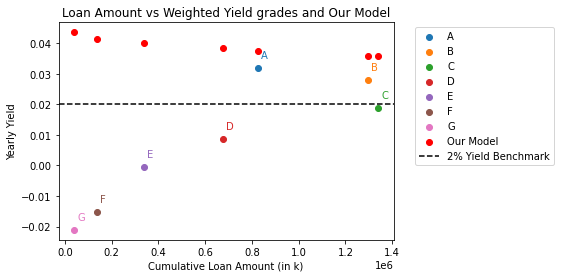

In [453]:
"""
Creates a scatter plot to compare the performance of loan grades and a model in terms of cumulative loan amount and
weighted yearly yield.
"""

all_colors = mcolors.TABLEAU_COLORS
color_map = {grade: color for grade, color in zip(['A', 'B', 'C', 'D', 'E', 'F', 'G'], all_colors)}

# Determine offset values for label positioning in the plot. These are calculated as a
# small percentage of the maximum values in the data.
offset_x = max(df_compare['loan_amount']) / 1000 * 0.01  # adjust the offset
offset_y = max(df_compare['Weighted Yearly Yield']) * 0.1  # adjust the offset

# Create a scatter plot where each point represents a loan, colored by grade. Labels are added for each point.
for i in range(df_compare.shape[0]):
    plt.scatter(df_compare.loc[i, 'loan_amount'] / 1000, df_compare.loc[i, 'Weighted Yearly Yield'], 
                label=df_compare.loc[i, 'grade'], color=color_map[df_compare.loc[i, 'grade']])
    plt.text(df_compare.loc[i, 'loan_amount'] / 1000 + offset_x, 
             df_compare.loc[i, 'Weighted Yearly Yield'] + offset_y, 
             df_compare.loc[i, 'grade'], 
             color=color_map[df_compare.loc[i, 'grade']])

# Plot the data for our model as a separate series in red
plt.scatter(df_compare['loan_amount'] / 1000, df_compare['our_model_Yearly_Yield'], label='Our Model', color='r')

# Add a line to the plot representing the 2% yield benchmark
plt.axhline(y=0.02, color='black', linestyle='--', label='2% Yield Benchmark')

# Add titles and labels to the plot
plt.title('Loan Amount vs Weighted Yield grades and Our Model')
plt.xlabel('Cumulative Loan Amount (in k)')
plt.ylabel('Yearly Yield')

# Create the legend for the plot and position it outside the main plot area
plt.legend()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', prop={'size': 10})

# Display the plot
plt.show()


In [454]:
"""
print the full table
"""
def custom_formatter(x):
    return "{:,.0f}".format(x)

df_compare['loan_amount'] = df_compare['loan_amount'].apply(custom_formatter)
print(df_compare)


     loan_amount  Weighted Yearly Yield  STD Grade grade   
0    827,136,325               0.031980   0.000032     A  \
1  1,297,360,550               0.028002   0.000032     B   
2  1,340,526,675               0.018662   0.000032     C   
3    674,768,850               0.008635   0.000032     D   
4    338,367,400              -0.000513   0.000032     E   
5    136,699,850              -0.015169   0.000032     F   
6     38,856,500              -0.021102   0.000032     G   

   our_model_Yearly_Yield  our_model_STD  Increased Performance std   
0                0.037478   1.166709e-06                   0.000031  \
1                0.035900   7.536317e-07                   0.000031   
2                0.035793   7.310777e-07                   0.000031   
3                0.038261   1.428923e-06                   0.000031   
4                0.040078   2.984886e-06                   0.000029   
5                0.041284   8.368438e-06                   0.000024   
6                0.043

# Dear Ilana,

## Thank you so much for the comprehensive assessment throughout the semester! You truly are the best :)